<a href="https://colab.research.google.com/github/Pierre-Loic/ADL_module_Python_datascience/blob/master/D%C3%A9fi_8_10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Défi des parties 8 à 10

Le but de l'exercice est de préparer un jeu de données pour effectuer une visualisation. Le jeu de données utilisé provient de l'open data de la Nasa. Vous pouvez récupérer des informations à l'adresse suivante : https://data.nasa.gov/Space-Science/Meteorite-Landings/gh4g-9sfh

1 - Récupérer le jeu de données dans un dataframe

In [31]:
import pandas as pd
import missingno as msno
import seaborn as sns
import folium

df1 = pd.read_csv("Meteorite_Landings.csv")
print(df1["nametype"].value_counts())
df1.head()




Valid     45641
Relict       75
Name: nametype, dtype: int64


,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
0,Aachen,1,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,50.77500,6.08333,"(50.775, 6.08333)"
1,Aarhus,2,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,56.18333,10.23333,"(56.18333, 10.23333)"
2,Abee,6,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,54.21667,-113.00000,"(54.21667, -113.0)"
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,16.88333,-99.90000,"(16.88333, -99.9)"
4,Achiras,370,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,-33.16667,-64.95000,"(-33.16667, -64.95)"


2 - Analyser la qualité des données

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45716 entries, 0 to 45715
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         45716 non-null  object 
 1   id           45716 non-null  int64  
 2   nametype     45716 non-null  object 
 3   recclass     45716 non-null  object 
 4   mass (g)     45585 non-null  float64
 5   fall         45716 non-null  object 
 6   year         45425 non-null  object 
 7   reclat       38401 non-null  float64
 8   reclong      38401 non-null  float64
 9   GeoLocation  38401 non-null  object 
dtypes: float64(3), int64(1), object(6)
memory usage: 3.5+ MB


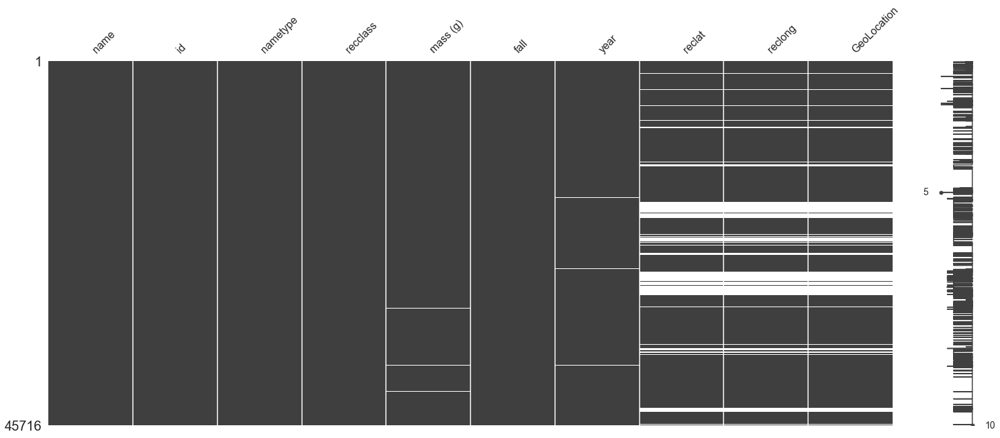

In [32]:
df1.info()
msno.matrix(df1)

3 - Effectuer une analyse exploratoire des données statistique et graphique

4 - Préparer le dataframe pour la visualisation en nettoyant les données

name          object
id             int64
nametype    category
recclass    category
mass (g)     float64
fall        category
reclat       float64
reclong      float64
dtype: object
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 38115 entries, 1880-01-01 to 1976-01-01
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   name      38115 non-null  object  
 1   id        38115 non-null  int64   
 2   nametype  38115 non-null  category
 3   recclass  38115 non-null  category
 4   mass (g)  38115 non-null  float64 
 5   fall      38115 non-null  category
 6   reclat    38115 non-null  float64 
 7   reclong   38115 non-null  float64 
dtypes: category(3), float64(3), int64(1), object(1)
memory usage: 1.9+ MB


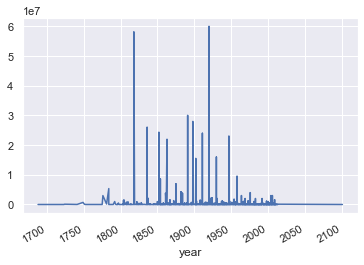

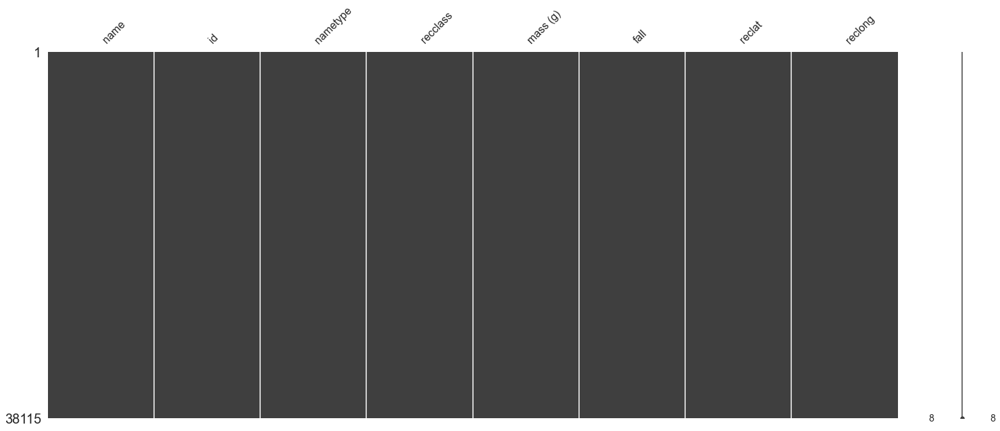

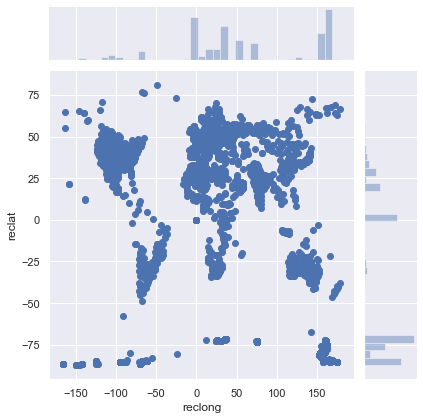

In [33]:
# supprimer les lignes manquant
df1.dropna(axis=0,inplace=True)
"""
df1["nametype"] = df1["nametype"].astype("category")
df1["fall"] = df1["fall"].astype("category")
df1["recclass"] = df1["recclass"].astype("category")
"""

list_col = ["nametype","recclass","fall"]
df1[list_col] = df1[list_col].apply(lambda x: x.astype("category"), axis="rows")


# remove this duplicated info
df1.drop(["GeoLocation"],axis=1,inplace=True)




"""
#convert column to string
df1['year'] = df1['year'].astype(str)

# replace year by real value
df1['year'] = df1['year'].str.extract('01/01/([0-9]+) 12:00:00', expand=False).str.strip()
df1["year"] = df1["year"].astype("category")
"""

# 01/01/1976 12:00:00 AM
df1['year'] = pd.to_datetime(df1['year'], errors="coerce")
df1 = df1.set_index("year")
df1["mass (g)"].plot()


print (df1.dtypes)
df1.info()
msno.matrix(df1)
df1.head(20)


df1.tail(5)
df1.describe()

#sns.pairplot(df1)

sns.jointplot(x="reclong",y="reclat",data=df1)

#sns.distplot(df1["mass (g)"].dropna())


5 - Visualiser les données sur une carte à l'aide de la bibliothèque [folium]joZaXE30aGJ/I+sxOnGdlnuJt+wvODqs4jTJ/Ws9UqtfC/3erB84HTGvO2QKiIT0ZveyDC4kEkiGkZCrpsS+oeZjLKxzxR0uXy3tTyjXukO+Wqu42XKHH8t9tUXfhVrFxbRl7QThviIQdEGEi4pAcOohxrWgsyJks2MQ/SkQdEGcFcwSS6Cd1UVFIBAcHWJcCzorQjY7BmEpFwi6KG63AkjNk6LU/LdAIOjKiHEt6KwI2Wx/hKVcIOiCeL0a+wLhlOpvvf2eYw44EQgEnQMxrgWdFSGbHUO7W8rvuusu5s+fD8Crr77KhAkTGDt2LPfcc4+9z65du5g0aRJXXHEFCxYsIB5PJHL//PPPueGGGxg3bhyzZ8+msbERgPr6embOnMmVV17JDTfcQF1dXXvfhkDQqWiMGvbkCNjV1BqjYilRIOiqiHEt6KwI2ewY2lUpf+2113jyyScBCIfDVFVVsWrVKjZt2sQ777zDiy++CMC8efO44447ePrppzFNk8cffxyAxYsXc/3117N582YGDBjAqlWrALj33nsZMmQIf/vb3/j2t7/N0qVL2/M2BIJOh65nqNopigMJBF0WMa4FnRUhmx1Duynlhw4d4p577mHWrFkA7Ny5k379+nHWWWehqioTJkxg8+bNfPbZZ4TDYS655BIAJk2axObNm4nFYuzYsYMrrrjCsR3ghRdeYMKECQBcffXVvPTSS8RiYvlEcPpgVThLxk6JKBAIuiRiXAs6K0I2O4Z28ym/4447uPXWW9m3bx8AtbW1FBYW2r8XFRVRU1OTsr2wsJCamhoCgQB5eXmoqurY3vpcqqqSl5fHwYMHKS4uPur29eiRd8L3eLrSVsVwOuv1ToT2bGuyzDY2hqksL03x78t1y+TmetutDe1BV3q+6ejK7e8oee1MdObn1VXHdWfu06Ols8hrZ+3LriibnbUvs9EuSvkf//hHevfuzfDhw/nTn/4EgGEYSFLLF5VpmkiSlHG79d9kWv+dfIwsH5vRP1tFT0F2ToeKnsdLR1X09Ho1evs9VFeUOaqKZWpDZ6UrV8SErt3+zljRs73p7M+rK47rztKnnb2i59HQWfoyHV1NNjtzX0IHV/TctGkTdXV1TJw4kcOHDxMKhfjss89QlJb0OXV1dRQVFdGrVy9HoOb+/fspKiqie/fuBINBdF1H1ZXDcQAAIABJREFUURR7f0hY2ffv30+vXr2Ix+M0NjZSUFDQHrci6ML4uuXgcYsEQwKBQCAQCDo/7aKxPPTQQ/a///SnP7F9+3YWL17M2LFj2bNnD2eeeSZ/+ctfmDx5Mn369MHtdvPGG28wePBgNm7cyKhRo9A0jSFDhrBp0yYmTJjAhg0bGDVqFACjR49mw4YNzJo1i02bNjFkyBA0TWuPWxF0YTxulQk/3XjMx/35lxPboTUCgUAgEAgEmekwM6Lb7Wb58uXccsstRCIRRo8ezbhx4wBYsWIFt99+Ow0NDfTv359p06YBsHDhQubPn8/q1avp3bs3d999NwBz585l/vz5jB8/Hp/Px4oVKzrqNgQCgUAgEAgEgjan3ZXySZMmMWnSJACGDx/OU089lbLPhRdeyP/8z/+kbO/Tpw+PPvpoyvaCggIeeOCBtm+sQCAQCAQCgUBwEmj34kECgUAgEBwriiJjKjJxScJUZBRFvK6Ohdb9p7mUdu3Pjr6eoPPQFs8423hXFBnZpWA0/46inLLyJKLgBAKBQNCpUBSZQCjGsqT0a1Xlpfi9GrouKggeiXT9V1leyvot77Pt3Zo278+Ovp6gYzmSAjyz+rkTesbZxjtAY0wncDDCfevfsn9fUF5KwSkoT6fmp4ZAIBAIuixxsF/QkKgcuGzdduInt1mdHq9XQ3GpxACvR2P5D8v43Z1XcM+to8jL0fjeNQO4f95lDPpyz6z9eayrFOmeV/W67YwZ2s/++3R/fl155edontuJPGO3W8GX62LJrBH8dsE3WXnrKHr5PcSbr11zMGQr5Na1lp6i8iQs5QKBQCDoVOiGmb6kt2F26EtLUWTize1RZAkV2tUyFwrF8HqtTGKSY/uR2uV2KxxsiBIItlgUh/Uv5uZrBxLXTfbtb2D9lg8IBBNFYKaNvxhZAt2U0eMmcT2Re9rtkjlwOMzSh45+lSLT8/J5NcffHf38OguKInOoKZbapz43MiaxqN7m12sLuXV5VKJxE103iBgm7jTVOyO6ydoFlyf+HTVQFAlDP/p2eL0a+wJh1m95nzFD+5Gf50L3uemWo5LrVqhviuNxqZ1iPugITrX7EQhOCyJxk3/XNTiW8+ZOLeHMws5RlU4gOBEUWaLIn+N4EdslvfWOKfByMlxoFEXmi0A46zUztcuHRM3BEKuf2EltoIkL+vqZ8LVzqVq11d5vzpQSHt20i+p121l083BUVaKxKe6o0rhk1ghbeYQWC2h1xUgyFVTP9LyCSR8THf38OhOmLKXt09mTB+H3eejhc7WZYt5WcuvyqOw/HLHPs+pnlzHvwddSnvHimcNZuOY15kwp4c8v/4upYy+kp8+FoZtH1Y7GqMH6Le8z4WvnsvKxtxz7FvjcuDSZcDR+0ueDjqLrrJ8IBAKbmG6kLOfdt/4tYrrZpZZFBYJ0qMCC8lKK/DkAtg9pR1qRdKQOd6E5GredTPvohuGwKE6+7DxbybH2W/nYW0y+7DxqA03IEsTjpq2QW/sEgpEMVsnUgD5FkQkEwxiGyZJZIxjWvxjA9il/bsce+++qDn5+nYloPP1Kgselsmzddo6kjx+N64u1T4y2cf2KxEzHeWSJtPegyBIzJg5EU2WmXdWf9VveJ6ofvQuarhuMGdovRVaXrdtOXDcxdCju7uUn1w92zgc3leJSpC7rEpSJ03WMCARdGsNIP0EahkkgHBMBVYIuj6bJzJ48CI9LJRyNo2kd98JVFJmwbnT4krmRwQ3EMMCqh53JVURRnBZFn1fL6FJS5M9BN0CRU+eRww3RtFbJz+qCLF67zVawe/hcHAhGWbauxRJfVV7KzG8NBBNcisTMawfy/WsGdIjrT2dGlsm4kpCQKSOjTB2N5Tt5n1uvu7RN5FY3nPKvG+nvQZFlNFVqlt1Gvn35+SCZ6PrRuaApikx+nivj+8zAxOdJHOGYD1SZYDjOogdfP6WCwbv+Z4VAcBqiKpJtNbAo8uegKtJpH1Al6PrEgUUPvs7itduoXLWVxWu3sejB1ztMruPA5/sb0o4xJY1fbVshy3Laa8pJ17RcRQAu6OunqryUu35URq5Lpri7l7lTS2yFL925wtE486eXEo7FUNXU6z23Yw9VrVYp5k4tYf2WD4AkyzwSgWCYW6+7tNk/2sOyddvBBEk3iEV1JN1ANU0k3ejSitKJoioyldOdfTpnSglPPP+hrdjKLoXaQCgl5d+xrp5keu7HKrdKK1l88oUPmT99qOMe5k8fiqpJrH5iJ5WrtrL6iZ1EojqKLOPS0suy1Q7Lsp/rkvH73Gn3dakSiiwR1c2080HNwdApFwwulHKBoAuiqlLKi7OqvBRVlW1rhEDQVckW6NlR11+/5QPmTClJHWPteWHJTLnmnCklyTGfqEBVeSnD+hdz41UXsXbj29z261eob4pjmCZnFuaxrKKMc8/Mp+qm1DnirGIfqipx18N/Z/2W3Sn7TPjaubz45qcsmTWCBysvZ1nFSB756y527w3YbfD7PBwKRmxlbO3Gt7nxqovw+zxi7kmDR5Vwu2V+PPVSVt92GbMnD+LRTbsIBMMsuKkURYXP6hqpvP8VZlY/x/xVr3AoFENR5KMaC8n7PPH8h20it27N+Y7Z+c/9aJrMsoqRPDB/THNMgkw0ajgU4/vWv0U0pnM4GGXRzV9N2w7Lsl+5aiv1TXG8HjXt+wypeYUlQx94XGrKtq4uf8J9RSDogsRiJi+++SkLZwxHkRNLi89u/4Sry849ZQNgBKcPJzvQU5ETVuBHN+1ixsSB+Lwa4WicAp8LvY0zZTgwJf788r/sawZDMf788r+Yee0gexddN/B7NWZeO4jKVa/YfaTIMneufdXRZ8P6F1NdUcbBYJiGUJQCnxtdN1ny223UBpp4dsenfPfKi1h083CCoSiHG6I8uimhgG/duY/qipEABIJhRzOnjj0/xXq78rG3mP3/s/fm8VFV9///864zmWQgARJ2cUOhLBWBoQqFFtxaREHairYfiRWxYoUfbW0J+qnSbyG0pW6fFv1YrSgfFW2puCEiWMWVRMSiiIAoSwUDhECSSWbu3OX3x10yawhLkNj7ejw0zF3OfZ9z3uec93mf9zJxoD/3ZEE0bnDHA+94DrgTR/fmx5f1IxxSCQVlGhr1rCH/yqcNb9FYSH5m884aFi/fxI0TB9K9OIwkclSmQ1pMp1P7APNvGoFuWIiigKbrVB1oQBQE6hoSrK7ckcKbLu26YTF3UQXzp42gfNrwjOgrliR6/COJIj+7ew1F4WDaWAtgmPYpiySJWdsgpqXqxb8Ka58vlPvw0QZhWVZKZAOAuoYElmV52ohWFB18+GhVuNrgdDvaE8XXyd+ft6jC+77Qyou9JAlcNvKMjKhKyWHmwBZsDEFIEVLe31JFWWkkJZLKpIv68P6WKp5ctZWy0ghBWeBATE8RgLSEQVzT0RIGPUoKmHn1uVQfauTRFzbZducS3HH9N6g60ODZ83YrLsiquezWqcCfe7LANC2KwkFmTBpEx/Z5mKZF9aFG4pqOLAmIAil9UteQYOkrWzGcMISHGwvp46WmLkZROEhAdHjlKOnWYrpXvijJVKUl8HF5Mxm26ZRmC+embb4kAxiWR0ey5juZb92xVlYaAcEiXxVp0I2s88GtpREUpUlYP9FzRGvBF8p9+GiDCKgS3x1+GnMefNubkGZNHkpAlVCE/1yHKh9fDbja4Gxatq/y9w3TJKBKKQ5tAVWyNYZpz6ZrUP/nbxt47DcXUz5thE2zJBBURfKDJZxzdmfyVJFo3CSm6Vwztq8nXC369UVEYzr/89T7KcLW1Cv6E0vo/Pmxf3HtuH5eqEU3bGI2zaUiiRhGWxaJjj8kSUSQBLs94wa//t+3vHYsK42gKhKabqb0idsHqiJiaMZhefFE8GtzvJksGJeVRpAkgWH9OufUWifzrse3N43AMGzagwERCYjGTYRm6gd8aXNEa8G3Kffhow1C003mP1KZctw5/5FKNP0/26HKx1cHhmF+qY6CX8r3LYEeHUOc0rkdHdsHOaVzO3p0DEEWBb2rPUy2w5WAUEBEUqA2qjHzrjVMLV9F2Z/foKomRn5AJBRQUkwlaqNaRljEe5asp7ZeIxRQmDi6N3c+vi7l/kPPfpjVBljKRuh/OHTAMKC2XsswUSlfVIFlWYgCWUPcuqcjLeHFVufXZnhzyuUD+N1PR3D7lPNYsvJjqg82ct1l/XNqfdN5V8Lmw9vuf5Pr5r7MzLvWsMfh1+bq92XPEa0BX1Puw0cbhJErXJvx1ctw5sPHfwryAyJ7amIpJihlpRG6FgVpaEjVQGfTHhoWSAKEZIlAkZSiNVcUgQ2f1nBK51TTk2hjIqcTnWmaWUMrrt1YxdQJA2ybc0EAx0ThqyAUHW/YjodWzqyUCd1CILsjo95MqMQTjeZ4c96iCsDWWq/dWMX4UWciIOTOAJvGuw2aSdeioMOvdmbZ/IBING7kTFj1VcXJ0t8+fPg4AkiiyJzrh9GjpJ03if17b61zXPhlU+fDR3aEQgrRuJmy8KankG8rOF6pzJMR1cwMrXX5ogrKbxqRVTgxDPt437XZBYlo3ATBAksgGrPbtqR9gJhucfaphQgIPHTrhRhmU4zr3/10BIfqNZa+spXNO2tsUxRZRBJFOrQPsvCXo/nHP7eyqnKXXZ5zP5Gw7PoLAoYIICFh+cJ5EiRRwLRAkbM7K8qSgGUJWfugOafF1hxL2XgboF2+ym9/cj6qImGalidQz73xfIraBQjIMv87awyyJCJJYBiiNy7cMhEAS0AzTURRICAKiLJAXczAsiwEQeCVd3fy2EubeaBsDIEctBzvsXeywBfKffhog8gPiLQrCHrRF1ythT0x+1K5j5MPoZDSjBY4U5g4mQX4bAldbr02QvuCAFrCjtMcVEXijUdG75GegCULT/l5MntrYjlTlgeDEgIQbdQ90zfXF+XltTvY8Ml+L1X6ZSPPIC8o8/H2av7w2HtNznfYofF+e+P5VB+Kp/Sl++7VF/ehsCAAXxFzgmOFDASCEpouM2PSoBS78VuvjRBL6F5kluR2vOqiPqiSQCLLdH6kY+lIkMzbd80cSUwzCahNWvKicDDD/v2/pwwjFje544E3Uvjq9fX/ZtS5PSkMB6ipj/PES5m8eeu1EeSEyJykJEBlpRFCQRlVFqmp15i3qIJ7Z44kGjexJDhYrzHv4dzJlFobrTk3+UK5Dx9tEFHNZMnKj1O89Zes/JipEwaiqhKmYaVoJUxHK/FV0ij4aFuIxnNogadlaoFdoaNrUZBo3HYyi8YhP6ScEME8WdiVRZFAQCSm2UKmJIoYIoRDKhdGTuGxlzbbIeweruDGiQO9rJdlpRE6FwXRdNNOF+6U1ZwmOVfoN0kSSM+KoqgSmmlnTrSAWNzko0/3M+XyAQgCzL1xOHHNIBiQkCUB1/9y/iNvZ/ii/O7mEYyqqkeRRaaOH8j7W6rIz5Ppc2pHHrrtAizLNnO56uI+XDNWRNcz+/LeJ9cz5fIBzH24gv9v0rnk58l0bBcgnjAzNJqtccpwssIwTKKawJy/vMPAMzt5YWxNC8L5Crv31VN+03BE0Y6wY5gWUycMRBAgplsgCClztySJRzSWjhQ68MTKj/ndT0dQ36iDBXFZpLBAZZ5jbrJ7Xz0Dz+xEpF9XwiGFoCLzSsWnKevRky9vZsrlA3jwmQ+YeeU5FBYEMsJ4Jo+bbHVBEDyBfI+z4Sy9tL8nkLvPz3PCR2aruySJIInohq3ZlyW7Pd3Nc0AV0RKmE/bRTvSkyAIxzcQ0LURBQBAsLMvZYAWkVtsQQSsL5ffccw8vvfQSgiDwve99j2uvvZa33nqL8vJy4vE43/nOd5g5cyYAmzZt4tZbbyUajTJkyBDmzJmDLMvs3r2bW265herqak477TQWLFhAfn4+tbW1/OIXv2DXrl106NCBu+++m+Li4tasjg8fJw0EgQyNw/QrByEIUF2nEcqTeeiZD7NqzNp6GmIfbRPpabvBTfaRaTcbdWxMW3Pxy4V0Lfj1l/fja6d3yqoVnnRRHwBPMHeTmbiCxe9v/iaf74umakdLIxTmGIP5qpgR1rCsNEK+KhK3moR5SbJTjNfUpYaoKyuNsPzNTxnct0vKuJ81eShPvryZay/tl9EHReEgh+q0lOgrZaUR8gISDyzbkDGH/HrKMGRRzNqXrv15YTjAIy9s5KqL+mSE8usYVqmu05pNG/9Vg2GYFIWDfGtwz5SIWbNLI4TyFA7Wx4nFDa8vh/XrzJUX9mH+I9nbLhTMbp+ebSwdMZy15Vd/eiOlz+sbdM/h16bvbO/EJf138np09cV9qI3p7KtpRJay8032JEAmhmmH/XQ3IVMuH0BtNJ61DNO0HUaTIUkiUd2g5kBDRmSbR1/YRGFYZdJFfVLG28+uHkw4X0nR3CefXhRK4hGZmB0pWi36SkVFBe+88w7PPvssS5cuZfHixXz88cfMnj2bhQsXsnz5cj788ENee+01AG655RZ+/etf89JLL2FZFk899RQAc+bM4eqrr2bFihX079+fhQsXAnD33XczZMgQXnzxRb7//e8zd+7c1qqKDx8nHSwLb6GEJk2VZdrplnXdYszQXhnPfBXSEPtom0hP2w1uso/MZcjWLmbXBka11hXc0tOaR/p1zaoVHjO0F+WLKvjW4J5eXZJzB+ytaUQ3zKxJYXKNwYaGhOfw9kDZGMqnjaBrUZDpd63JSKtelSRouGWXL6rggsipGeN+/iOVjBnaC8Mkow+yJQIqX1SBYZB1DtlX08ie6mjWvnRTvIuiwJihvbKmh9eMw6eN/6pBEkUmXXRW1vlYEsSMyCxjhvbyBPLkZ922O5KxdMSwhKx9nhyBx6avMudvbz2yYO7D9np0z5L1HKrXstKdLQmQIAhe6ER3Qx8OKTnLEMVMkVgHqqozx8k9S9YzcXRvbwwn37vz8XXsPdCQdbzPW1SB3oyJ2fFAqwnlkUiERx99FFmWqa6uxjAMamtr6dWrFz179kSWZcaNG8eKFSv4/PPPicVinHPOOQBcccUVrFixgkQiQWVlJRdffHHKdYBXX32VcePGAXDppZeyZs0aEomTw97Qh4/WRk7bU8v24hcFskZNsDUQftgyHyce+QFbC5wcRs/1g0iHJIrN2le3JtJTeltW9sgY7viyLMvTvi19Zav3TElRHqbJEY/B2kad6+a+zNTy1Vw392Um/fqljHcMM3c0D0nM/s1wSOHpV7dm9EHXTtkTAeWaQ4KqzJKVWzJSuc+aHGF15Q7KSiNUH2qkfYGaU5v7nzYvKYrYbDun92XuudtuO0URWjyWjhRmlv45HH256K13IvuIgv176StbM/jmlh8NoaRDKKMuomTPGdOvHORtQtwsoull/OqaobZzcxqaGyfhkJKT7myae/dZM8vG1nPKPQ5oVfMVRVG49957+etf/8oll1zC3r17U0xMSkpKqKqqyrheXFxMVVUVNTU1FBQUIMtyynUg5R1ZlikoKODAgQN07ty5RbR17FhwvKr5H4fi4vBX+nvHgtakNZln9x5oyG57KtiaBdPC01qlPxMMyBSFg61G55GiLfVvNrRl+k8Uv7roIclNSUIkgXZ5KsGgTH5+Kj9GozGicXKmFy/ucPR0H67ONXWxlO8KQvY05+74kiSRP9z8TepjCS8dvStYaAnjiMdg+vezvVNTFyOm6Vmfc7Xh2ehdVbmLqy7uw9wbbdtgw7A4VB/P+nyuOSSm6dTUxVi8fFNKWvR2+QqXnHcqBSGFJSs/5sfj+ueINpLdbv7LnpdaUyaoj8aQpex8ZFpk9GWuudttu2vuWMmjd1zUFEJQEnOOpSNFNv47HH256N3nmH+Ylv17884aj2/aF6i0y1dZ9PxGbvzewJTkQQFVRBZAt2Dx8k3MmRKhrDTiOTE/9/q2pDICrHznMyZ8uzdFRfkpdQkG5JzjxD3VynYvm+beraMqC9lNzAIi+fmhY2p7OAGOntOnT+f666/nJz/5Cdu3b0cQmnYTbvgb0zSzXnf/JiP9d/I74hEc3VRX12Nm2Zm35QX2RGHfvroT9q3i4vBRf+/L6MtstB4vOpJ5Nj+kZJ0YPt5ebacalgVPo5BuU24ljBPah83hWPr3ZEBbpr852o8Hz+aaY70QfjrU1TVSl4WEUEjxNOvZFr9jmRMO964kiSkpvSs27smgw7UxLSuNEJAFtJhOYb6aEmc5LyBysF7LjLhxmDGY/v1s41aSRDp3CGWUXVYaYVXF9oxx79qUAzz/+jYuGNaLg449upv+Pb0cSSLrHFLs2N3e+fg6Ly369CsH8ZdlH3DVRX1QJJErLzybFW9/ltFus0sjKGJmyvTjMS8dK8/m4tfjgVBIIS8gMfvaSEbUEMMyaVegpvTB6sodzJocybApT267a+5YmWKPn2ssHSmy8V9yn7v0JfetTe/QDJvy517fZkdXkQWvfpt31vDgMx9w67UREobJjVcMJNqo8/7mvUT6dcUwTeIayAGRf23Zx+adNUy/aw33zhzJ1AkDAYup4wdiWRaf7q7lH//cytUX9cngn+LiMFbCoHPHzHGSbFOezqOuTbkrrCfXZXZphKAiZo2pDkcmG+XiV8GyrJxcuGzZsmYLHT9+fM5727ZtQ9M0+vbtC8Bjjz3GihUrkCSJRYsWeeWvXbuWn/70p5SWlvLyyy8D8O6773Lvvffy0EMPMWzYMCorK5EkiT179vCjH/2I1atXM3r0aB5//HG6dOmCrutEIhHWrl2LoijN0uyiOaF83M+faVEZ6Xjuj5cf1btt5T333bYklJ/odj1RQnkoZPN5VDObtAsBEU0zUUSyRF9xPMs5uaIctGWhFto2/V+WUN5SeDyeFnoMOGpHz5b2V87oK05MbkG0/Tpcgby5cixJcKKvgCwKLYrjLUkigiIRi+s5o5O4ZRtOxA5JEshXRRo0086raYFpWYiibZtrGJb3O6DY0Sh051pAETGc3245mgmJhInrvWaatpJMUUQsR8vuludCFgVMLBIJC1kUUCTQnKgXrR195WQWysHm55hueScUkiigKiKmaXl5UA3DwrCa7iU0E900T3jkGvcbpmXHWZdkAdO01xXDsvtWVUTizpiQJQFFFoknTEdBKoBgW5SEVHvMxnQL3TAxTVBlgaAiUtdoIIqCnSgoaS3LD4iYQGPcyMo7LRlT7ljPHX3F9LTyWsJEdyKt2HVJj75iK35dGo5HSMRc/Nqspty13963bx+ffvop3/jGN5BlmbVr19K3b99mhfJ///vf3HvvvTzxxBMArF69mkmTJvH73/+eHTt20KNHD55//nkmTpxI9+7dCQQCrFu3jsGDB/PMM88wcuRIFEVhyJAhLF++nHHjxrFs2TJGjhwJwKhRo1i2bBk/+clPWL58OUOGDGmxQO7Dx1cG7uqLPWnJatPkkHymJAEYfl4hHz5agtSkPAbxBqPpN4Bhjy/tMN6JhmGCYTtvic57LRmDhmFS3CGffbE6MKys77hlJ588NOj2k+7YlwBMMJ1r7m/Nec6ly4jbAk2ucryyAMNouicBxR2bNjounbLzI5FMX1I90pMe/SfMS8nzclP7pNa8xN00mpBw+uDLaDv3Gy6/GA6fu991+zyZ9xK60eSkmCwfO0K54YQFlUSRoGJfkyybhxuSx5fzO/l76fU/kjFlP2+m0GomfUtrTGpnwDQgriWNF5rq7n6noSGRMj8cz9wgzQrl999/PwBTp07lrrvu4pRTTgFg9+7d/Pd//3ezBY8aNYoNGzYwfvx4JEnioosuYuzYsXTo0IGbb76ZeDzOqFGjuOSSSwBYsGABt912G/X19fTr149rrrkGgNtvv51Zs2Zx33330bVrV+68804AZsyYwaxZsxg7dizhcJgFCxYcW0v48OHDhw8fPnz48PEloUU25Xv27PEEcoBu3brxxRdfHPa9m2++mZtvvjnl2nnnncezzz6b8WyfPn34+9//nnG9e/fuLF68OON6YWGht2nw4cOHDx8+fPjw4aMto0VCeXFxMffeey8TJkwAYMmSJfTs2bNVCfPhw4cPHz58+PDh4z8FLQpXMn/+fLZs2cL48eOZMGECu3fvpry8vLVp8+HDhw8fPnz48OHjPwLNCuUzZswA4LrrrmPHjh1069aNrl278sknn3g23z58+PDhw4cPHz58+Dg2NGu+cv311wMc1qnThw8fPnz48OHDhw8fR49mhfL+/fsDEIlETggxPnz48OHDx38y3BjIe/bXI0nSUcVA9uHDR9tEq2f09OHDhw8fPnwcHqGQwp6aWEYW065FQV8w9/GVQyik+HydBl8o9+HjKwY5KKMnLHTTRBZFRAkve1lrZvQ8EZnmfLRthEKKk7mvKROeYUG88cQvzMmZAUVRwDLtDJiKbGdZ1J3sgrIiYBr2dd2wsLAwDPtZWRSwsLN7KpKAIAokdLt+siQSUERiWmZWwnQ63HET1UxPIAfYW9NI+aIKym8agSGIGdkIFUVM+Z6q2FkVDcNEVSSnHnYWxHxV9NrevWeYbsZPME2bBlGwszEGksqSnLrENRPTyThpOUnL6qIxLEmysxtKIops02Q62RMFwaFXsjMjYoEonpg56cuGm5U2PZulIAhouokii1iWRUK3My5XH2pECsoICOhGU4ZLWW7qZ0m0+xkgnjAwTVBkAVEQiCfsDJmKJCKJoJt435UlAck6fDbZbHDHimmCblgcqGvEkiXAsjNGO1k87cyX2PUyLRJG8xlSo5qJHJBJ6E5iISczqGlaKLJAY9zwsoq6vCPLdgZOMyWTqIFpWgQUyc6KaprsP9iAqMoOn0FeQCLhZFS1xzzIkogk2dlutYSB5GTvTSRMb/xLskAiYWevlYXcGXmT5xPLwhlHlk0zLedxXyj34eMrhoRuUrbwTU/TNmPSIB59YRM1dTFml0YoCimtkpZS6h2OAAAgAElEQVS5piHBvCQNX2t9y0fbRHNa4EBIIdqoI4kikmRn/2tNSJJINGFQcyDOs2u2Me6bZ3Dvk+spCge5dlw/7nx8nUfjrMlDqYvG6VQUIqbpxOIG9yxZ792fedW5LHvtEy4beQaFBQEeXf4RazdWeWPgtfd28fRrn1JSlMetpREKHUFNUERME2rq4t64eaBsjCeQu9hb04hhWEwtX0VJUR4/u3owDz+3kcKwypUXns38RyrZW9PIhFGnM/LcnpQvqqAoHOSasX1T6CwrjbBk5cccrNNS7g3r15lJF/VJ6ZdbfjSEUJ7MnL+8k/OZmVedS8XGPd43k7+zJqnOyfPP9CsH8dzr25jwrd48/NzGnHNSW93gJ9PdLk/GAg7Uaxysi6f0xa3XRnju9U+56Bu9WPB/61Lm6vYFKoos8tdnN7J2Y1VKvybzZH6e7D2T3s4zJg2iuCiPA4fiKbx867URCvNaNicrqoThbA4sUaCuXmPewxUMPLMTY4efzpKXP/bGjVv+9CsHsW7TF1wQ6cXBervO984cmfMbhmHxRXU0g08DqogVw+M/t+znXt/GlReezZMvb2btxiqG9evsjYFsPD/72gjtC1QE4GC9Rn1jImt7W8CfnvwXNXUxb5ykl59cZmFBAFnE3rSaFqoiEo3p1BxI7WeX5qsu6tPitbBFIRF9+PDRdmCapGja7lmynomje7O3ppF5iyo4TGbwo4IOnmDhfvdov2VrHER0QcCSRCTJn6a+CsilBY7GTWKaydTy1ZQtfIMDtXGef+PTVqVFB6oONHDPkvWMGdrLEywmju7tCTEujfMfqaRHSTv2Hmigtl7zFl33/l1PvMeYob2c6w2MGdrLuzdvUQUXRE71fs9dVIEhCMQti/0HY3y2+1DKuJFEkZKivBRaS4rykETBK+POx9cxcXRvxgzt5Qkjs0sjXDriDK99J47unUFn+aIKxgztlXFvzNBeGf3yh/97l70HGpp95q4n3uOCyKlZ+zS5zsnzz71P2u195+Pr+PFl/bLOE+4Gv2zhmw5PvElNQ+KkmgfUoIwlSc4cJRHIU0CSiBkWO6vq+ONj7xGNmzTETfY6fJbcRnMfrmDCt3p7AqJ7/Z4l69lX04hh4PFRtjae/0hlyjPp7XzPkvXoupXBy3MftvnvcHOrokrUxnQ+31fP7IVvsm3XIeY9bNMw4Vu9KX+kImXcuOXf++R6Loicyt6a1DrngiQKWfkUS0jhP7fsa8f151B9nMtGngHgjYFcPD/v4Qq2764l2mhQdaAhZ3tLgui1nTtO0stPLvOz3YfYd8iep6aWr+az3bXefJJO85ihvY5oLTx5uNyHDx/HBZaVqmXcW9NI2NHO7a1pxDDt+8dT+DVMK7uGzzwyjWdbWJB9HDnUoIxhmDl4xPQ0467A4Qp1rQXDtAiqsjc2XLqS/51OY1CVvXfS77vvBVXZG2vuvWTW3VvTiG5Y6LrF/EcqM8rLD4iUlUY8wdzVHOYHxJQyitoFCIcUisJB/uu7fXnwmQ8wTPOw9QiHlIx7uZ4NqvJhn5FEcl5P/256WxWFA8y98XyKwsGUeeJ4bvBbA2pQZt+hOGUL32Bq+WoeWLaBvQdjzFr4BjfMX819SzfwX9/ta/O1wzdH0nZBVUYU8Nos13PJz7jXkttZFLK/pxsmT63a0uzcqhmkbCaS+9+lpzmeyFbnbMgPiDnrlsx/7vWa2hj3Ld1AKKgw98bzOaVzwWF5PqjKOWnK1t7J7dhcmcmbz5bMDS1dC/2VzoePrxgEQUj5XVKUR53jTONq3Y638CuJQrMavpbiZF+QfRwd4gmrGS2wmMIn6UJda0ASBWKa7o0Nl67kf6fTGNN07530++57MU33xpp7L/nEuqQoD1EUUBVbGMn2va5FQcqnjeCBsjGUTxtB16Jgxvfa56t0LLSP311tZXL75qpHXUMi416uZ2OafthnDJOc19O/m95WlgVawuCasX09G2lofoN/MpycxRNWiuY62ynCvU+ud/hazMkzudoupumYFl6b5Xou+Rn3WnI7m1b29z7fV893h59GUTiYc25N30wk979LT3M8ka3OCN7/Mt7JVrdk/kuun6vN1hIGO6vqW8TzuWjK1t7J7dhcmcnzVF1D4rBzQ0vXQl8o9+HjKwZRbJroXLu5pa9s9WxcZY6/8CsDs9M0fO63jgTHS+Pu4+SCYZrNaoGDSZrgdKGuNSADnTuEmDFpEKsrdzD9ykGUFOWx9JWt/OzqwSk0zpo8lH/vraWkQ4h2BSozJg1KuT/zqnNZXbnDuR5ideUO797s0girKranlFUbjVPfkOB3Px1OxcY93rcBpt+1Jiu97nX3ew89+yHbd9fSGNe98SLLgte+S1/ZmkFnWWmE1ZU7Mu6trtyR0S+3/GgIJR1CzT4z86pzWVWxPWufJtc5ef6ZfuUgr632H7I1jvcsWY9pNNU11wZ/+566k+LkLPlEAnJrU/MDIqGASInDZ8ltdOu1EZ5+dSu/+FEqr7m24JKEx0fZ2njW5KEpz6S384xJg5AkIYOXZ151LktWbmH+I5We+VC2uTV9M7H0la0enz796lbKJkdSxo1b/vQrB7GqYjslRal1bg7Z+BTBSuG/kqI8fnXNUJa+stVr36Aqp9CVjefdNnn61a2UdAjlbG/DMr22c8cJ2O07a/LQjDZ0n3XnqaWvbM06N7j8fiRroWCln3X/h6C6uh4zCzMWF4cZ9/NnjqrM5/54+VG921bec9/dt6/uqN49GhQXh4/6e0fbl8fSrtloLS4OH3FZ2ZDMs65Xvx1NwXaGyg+I6JYt2GoJkwO1MbSEgaqIFBYEbY98x3NcFwSmlq/O+MYDZWOQj3JKOBrnrPT+tSTRc1J1UVKUR/m04QgnoaPXsfDnl43maD8ePJvMr5Yk8cCyDcy88pwMno0ZJkFJZNKvX/IEjtfX/5shX+vCGV3DROO2GYAbreVYQqgl19mNlmAY0BBPEFTllOgrpgWSkBR9RRHRdTvmiGFYuaOvJEwvEsk7H+ymuCif9gUq7fMDiBLsc2xZb5w4EFWR+Oe7uxj+9W5061SALIs8//o2Bvft4jme/vK/BpMw7OgU1Yca+b8XP2bzzhrKpw2nXX6AOQ++zd6aRn548dl8Z/ipxJ328qKvOOMxpIo0xJsc00zTLlMQBSRRaIrGkhF9xY6KEVBF4vHk6Cs28lSRRqdcSXIiwjjRMUSnbE03EQVoiOtUH2wknK/yt1VbPHvb5Hknm9P49CsHsXj5JjbvrMk5Hxwrz+aSCdJhSRJlC9/w5qjZpREefOaDjDnr5z88l14lBYAbfcXmGVXKEn3FsNtddnhIgBzRV5yIIBLUNiQIyBKCADHNID8oY5ggigKiCM+t2caQr3WhU/s8BMF2KP7rsxvZvLMGsOf6h579kKnjB2S0pRyUqY1qHEryoRjWrzPXXdafxrhOuEBFdyLqeNFXBDsij4DNA270FdO0aJcnoZk4Y8OOmhJyogHJkpARfUU3bD7bsy+Kqki0zw/w91e2sKpyl9e+Uy4fwLxFFZx9ShETR/fm1K52/wuC7ZwabUwQDEj85sG1ti38qNO5fNSZ3phw27sp+oodDSgQENETJgkv+orDz5ZFQyzBfX/f4DmEJjs03zH1G8TiBu3y1RZFX8nFr370FR8+2iCimkm+mqkt0g2Lz3YfontxmIZYgu7FYSTRnRQMXIWUq41KX0gkUYCjjHxhGCYCzqRiWBiHeT4bXI17ehQXGY6qPB8nBwKKwKSL+nDXk+/bgrkjxEXjtgb9YFTngbILEATQEjoXn3cadz3+nidAuHigbMxxW7QMwwTDDotmGBa33tcUsehX1wzljff/zbeHnoKqSwSDEvG46Z2+iyIIluAs7iAIsPdgDNM0KQoHqTrQwHsfV/Hd4aejGyaCIHCoPkZROA9REDxN311PvMe8acMBu4za+jhPv/YpH31Ww5TLBxAOKcQ00xO8XbjH4kFVYvqVtgnLYy9tJhSU+dbgHsS0ppCDoYCEJIDmCNcWdoQmURSQHeHJFpptgUgUbaEmniRASaJAY8xAEOy6WxYoioCuW9THDETBNskRRaddLfsZy7I4UBsnLyhjWgKNMZ2EbvG3VVsYP+pMFj3/Uca8YxgmRSGF8mnDMUyL7XvqPIEcmk7OvizhJaDYJxKuyYp7ilCeNmcVhlXiTihEC8CCgCzaIfl0k4BjsiMrIoJgC+2GZYEroIqCtzGydFugUxXREdhtnwhZtIV4sJlQki2eWPEx3x7Sk+8OP50DtTF0w+LR5XaUFheu+dB1l/XPOrdaCXtTV1wUYt604ZgWyKLgbLJEsGxtuh2WEBRJssMUWiAKFn/+2/tcct6pLFm5hUkXnYXUOextZmVJ5LnXt/HRZzVcP6E/oaBEQFaQnAiLcc0O66hKIl075iNLAvWxBBs+2e/R7kaaAdi8s4YHn/mA2348jN/+dS2zr42Q0E2KwgFEUWDetOHexvLNf33Oqd3aU1yYh4ltiiNLQtNpgWAHSkCwN6GJhEk8biBJ9jgSBZh59bnOZhbO7dOZSL+u1DUkCCgy0373T3vTeNMIBL2pVY9k7fKFch8+2iDyVTFneLniojxefOtTRg3uScBZJNMnhZNV+E1fkNtSODQfuaHFdIrbB5g6fiC1jTqCIPDae7t47KXN3jMP3Xqhp4GcXRqhpi6WUsaxbhpzwTBMCsMqN04cSFCVqWtI8OJbn/HtIT157MVNjBnai84d8uhcGMzQ8u8+EGP+I0ljcHKEukYNVZH4zvmnsfzNTz1N2qzJQ3nxrU/pe1qnFLtU04R9BxuQJYGGmG0ysHlnDfMWVQAwrF/njLHqao4nju7N6sodngDftWPIjsWcRGPciS0dlO0dRdS0tdiCIHCwLs4TL2WGtps1eagXdq6kKI9f/Ggwhe0CNDTqzH04dc4I5yuOvayFlrAwTdh/sJFuxfmIIhTkKTTEdUIBhaJwgKJwgMtH2gK5GxIxfd5xN/iSJGbVQrcGH7QULi+XTxvhneAEVTFzztIMFFUiljAwLYs8VQYRRAREyw6nF1BFqg/GUtp0xqRBFIYDrFq7w+OdstIIReEAjXEdUbBjdquKiGFga6xFe0P12ecHWVW5i7oGjR9f1g9FFnl0+UbGffMMPttdm/KN/YcaKSkMZZ1bDcMkT5VoTJhU18Y5VK+xunIH40edSX5IoS6qZQ236YUCdcIG/vxHg9lf08jvF6+jpi7GrU6IwsF9u/Dmhj385ekPmXTRWfQskW1fKMFuH1fhpEoSUc2gMW7YmwPToupAAwFV8uYHlw/z82R+/sPBniZ7xqRB5OcpXtQYV9Nf15Bg+546lr6ylV9PiRBLOonLU0V2VzcQVCXyVMW7/v7mKlau3cXE0b1pX6ASDqnc/fh6b6Non96MAJpCmB6tcO2br6TBN19pHkvnX4qqSEf8XiyuU1d7eG/sdPjmK01oiflKTLcAO9xap8IgppZbxD4ZYgG3ZfMPaNv0n0jzlWSkH/+DvajdO3Okt9HMGnP4OMS9z1XnbCYTv54yjNr6hJcQpVNRkH01jTy7Zhtjhvbi1O5hVEmyzRJMC1luMgGRJZGq6npKOuTbGlDDYlXFdgb37cJzr9tx0Rcvt2NK3/yDc/ifp97njuu/AdhmBikxrUsjdAiraIYt8FpYPPTsh14c5fT44b+fPoKgJKbMDaoiooj2fCGJdoITRbaFO9ckB/A0tOkJWlwzFAuLxrhhC8xOYrLGmIFumjz24ibGffMMLy5zYVjF1IyMeUaVBDTDatG8cyT5D06U+cqRQg3KGJadbMrQHbMoyd7EyKItfJpeAiHbpCIgCzQk9Z+sCMQ1E8uybPORkIJpJptICIhOfH/TxDNxqW+0zbLsxDsC0ViC6kNN5kPZTFeSoai22YmWMPiiOsqSlVsoDKtcP34AYJujJAyTTu0DxDSzKRGXQ+eza7Yx/Ovd6F4cBiyeWrWF4V/vxoq3t3PlhWeTH1TYvb+eJSu3MGdKJMNULRo3AYuyhW8y8MxOTLrobGYvfJOicJCJo3s7J0k6p3QJU/bnN1M2rc+9vo0bJw7ENCBhmNQ1aITzFfYfjKWML1frbsf978OTL3/MmKG9aF+gUhQOkDDMlHjps0sjGJbJ7x55t2mMXhuhc2HQM8ErnzYCwWhevZWLX1tVKP/Tn/7Eiy++CMCoUaP45S9/yVtvvUV5eTnxeJzvfOc7zJw5E4BNmzZx6623Eo1GGTJkCHPmzEGWZXbv3s0tt9xCdXU1p512GgsWLCA/P5/a2lp+8YtfsGvXLjp06MDdd99NcXFxi2nzhfITX8ejEV58obwJWYVy15bTFcoTJs+s2caoc3u2icQ9bVmohbZN/5cllDeXRAjwFmZVkcCyj/UF4ciy4uVCc3V2hUdX8H3xrc/oe1onOrYP0i5fJRyUMjIzxnWDvKBMItGknVYUgUdf2MSGT/Zzx/XfIKjIXuZMsONYL1m5xdMcFoQUz+4USMkKKGXJIJhLyHXpRrQj3ZiGbT4iibYjbbJGMBgQiWn23OGZVDhH/KpimydoiSY78YBqZ/OMJ3QsU8C0TPICMnHNIKBKjgZXJGEYhAIyqioi6EeXPTJXvxxOiD9ZhXJwhFssJEtA05ts+nE2fIZpobqZZE0LSbDtsiURp9/sfpAd+2cLJ8Os3pSdUhDsE4pwSCVfkRAlAc2wHVNlScRylDWu1rulCW0UVaIuplN1oIGO7fPIDyog2Hx1sD5OY0ynfVghFFC9sdEQb7K9njV5KMGARECR0Q0TVRE5VKcxb1EFF0ZO4VuDe9q8Lgq88+Fu/vLMRm9O6FIURIsbHGxIMHeRnbjou8NPS0nmM2vyUNZtquLMnoV07VTAofo4//jnVn54SV/aO6FYJUnEwN64mBaeP4UoCqiyPRZEEdsPwzDRkjKsvrx2p+fzEVBEgorY5CPgZB7Nc0yRpt+1xpvLDuf7csJtyt966y3eeOMNnn76aQRBYMqUKTz//PMsWLCAxYsX07VrV2644QZee+01Ro0axS233MJvf/tbzjnnHGbPns1TTz3F1VdfzZw5c7j66qsZO3Ysf/7zn1m4cCG33HILd999N0OGDOGBBx5g2bJlzJ07l7vvvru1quPDx8mJtChLFnDpiNN9kw8fJzXcsH/JWrF0GIZlO3YmnNBwrUyTZzKBLQheOuL0FME37piFmCZOyngBWRJJaCYyIFgmEiKJhMUPLjiLqy462/PlkJwKSJLIKZ3D/PyH5zYJmI69sFc/ww6L5m4g0uud7ruRMEihW0cgX5GImiaGBYqTOdSGbSJgmLYjp5awbcddYVxznAmdjOYAiAJg2k6tyLKTUt0+Lc1TZSdjouDEfpcIqCKGZhy3+ed4+Kp82Uhohu274Px2zyYkQUC3bIHccE8PJIGgIhJvTKBDU911MJzwWAKgO3wTcDcthkWn9nne3G8Yye/a3+/UPkhROMDU8QNavEYkNIN8RaJX53a2zTu2M6UkCoTzVEIBGUkUkUWbMkuCAlHl5z8anOQI7ZzMWLaddmFYZf60EeimiSQIiDKossg3+ndj6Ne6Or4QIo2OYFsYUpznLRRFYP5NI9CNplOcUef29DbEomDXr1NhiOrqekiqp4CIRdOJUFCViGnuPQHLOenKUwQMoGP7PH5wwdnIorM5Thig2JtYtwxXIK9t1CmfNiLrXHYkaLW4QsXFxcyaNQtVVVEUhTPOOIPt27fTq1cvevbsiSzLjBs3jhUrVvD5558Ti8U455xzALjiiitYsWIFiUSCyspKLr744pTrAK+++irjxo0D4NJLL2XNmjUkEkfvle/DR5uE5f0PgDxFRDBMXyD30SbR0JBAMAxky0IwjGOKtHIsMAwTwTAdOkwSmoGh6Q5tJoLu/NbNlPGW/l76ODzc/eNFd1M7muixBIlYIoV2PZZAa0zYwppzzdR0ZNPE1HQMTUd0nrcSBlpM9+ovmfbzgm6AYaCqclPZhoHWmPDnnyywHYudNtUM8HjIbnvBMOjaKR9BN4g3tpzvW8pTx8J7Lu2SafdxcWEoiafssarFdEzNwNIMm3dMExw+EQ0TPaY79bdss0rn3xgGpmYQS+JZwTA8gTxX28mWXb6p6d47ekz36idmiQue3gbxxtRv2jxuj3dTs+mWLfvbbns1NCQQdIN2eZIngNtmNscHrSaU9+7d2xOyt2/fzosvvoggCCkmJiUlJVRVVbF3796U68XFxVRVVVFTU0NBQQGyLKdcB1LekWWZgoICDhw40FrV8eHDhw8fx4hQUgZCHz58+GiLcE3wWgOtHn1l69at3HDDDfzyl79EkiS2b9/u3bMs2wPcNM2ULITudfdvMtJ/J78jii3fY3TsWHBkFfFxzDham7/jZZN9ItCatCbzbDSae0JoS+0FbY/edLRl+k8Uv7rYW9OQNZSnCzmokHDiN7fPD2TVdh0rWlJn07SobYijaU1hAQOqbcObcGzc3efcDJ3tQja9um5SG417MZoDqkRhgX3PNC0OReOeTavlmJfkqmsuWk3Tor4xTiLJxl2WbNMUSRQJ5ykcrI97duJuaD3Tic+sKIITpcW2N5Yk25HQjS9tONFZJElABHTH1tq1aQ7nqdQ2ahiGSfWhRqSA7MWalh1TmLhmx3YOBiRspandr+E8lbpGrdX7+UjR2jKBaVocrI+jJewQkoITWlJwbIVEUWDP/nokWSKgiF4YP8NoivctSwKSLGDolh13Psm5UpYEL1yiLNv26PGESdDxB3DNPYrCQWS5ZbJSMr8ajg28JAjsPdCAIYh2WEfB9j9w49vLov1X1+13FFmgfX6A+lgixZY7mf+z8QTAoWichBM+UhAg7th+G46tvCSJKLJITDMccxSRgrymcSipMrpheWaersmJ5PhteHZaSXTUxzSbd5PiprttHw7ZdO0/ZGcVvXfmyJxtd7Rza6sK5evWrWP69OnMnj2bsWPHUlFRwb59+7z7+/bto6SkhC5duqRc379/PyUlJXTo0IG6ujrbJk+SvOfB1rLv37+fLl26oOs60WiUwsLCFtPWnKOnj9bBl+HoeaJxoh09s+FQXSNarG0kpm/LjpLQtuk/0Y6eIc+pLLdA8It71hzXaCvpaEl/SZJINGGkREEZ1q8zk8d+jZq6OM+u2ZYRQvBnVw+mLl+jXUjhUEOCg+kRVK6N0KFApbpO44mVmSEIs9W1uUgxcctCSxgpyV3cbIOffn6Qr53eyXOkTY/Qki1iy4xJg/jnu7v49pCeGZEpggEJEYElL2/mygv7sOmz/V75ReEgU6/oTyxuZETK2fjpftas350RRScjfN5x6ueT2dFTkkQONiZSQh+6EULciDWXjTyDR1/Y5CWmaRdWiEaNjGg8ZaURPvp0P/1O75QSlcbtqwf+8aEXEvCjT6sZ3LdzimNkWWmETmGVRDORuVyaaxoSHr8+9/o2vn/BWcQ1I2v0kpq6GDOvOpeCfIXaNL50+aFX1/ZenV3+z8aPt5ZGUBSRO/7yDkXhIDN/OIhYzOC193bxzUE9Mhw9l7/5GRs+2c+syUOJhnRCquSNw2zj1U1Q5ibpai6ySllpBFWxM5zWRjXHcTs1q2s2HG6eycWvrWa+smfPHm666SYWLFjA2LFjAfj617/OZ599xo4dOzAMg+eff56RI0fSvXt3AoEA69atA+CZZ55h5MiRKIrCkCFDWL58OQDLli1j5Eh7ZzJq1CiWLVsGwPLlyxkyZAiK4h+N+vAR1y2QJHRBwJLELzUltQ8fLuxwfM3zorvQ7a1pZN6iCnSEE8q/rqNk1YEGT6gAGDO0l3dtzNBe3kLu0nrn4+uoOtBAXLfYm/bu3ppG5j5cQcKEeYsqsr4/b1EFRrrXdhpdliRiySKGYCftcTODJpdz1xPvEenX1RNwXNqb+73XKWfCt3pnlHfPkvXU1mscrI8zZmgv5j9SkVL+xNG9UwSw5Pp8o383fnxZv4x75YsquHTE6SnPWpI9V52sc5bb/kdDn8tTrkAOdr3vfbKJl8YM7cU9S9YzcXRvr40wMvnQvRfp19UTyN3rbl+5ZdyzZD2jh5ziCbDJ72uO03FzNJuiQOeiIDdMGOjRmByfPPm77jfveuI9QqqSkx8UWeDSEaen8H82fpy7qAIQmHnVucy86lwUSWLeogouiJyaUZ/5j1Qy4Vu9vX/rupUyDrONt/mPVHJB5NSs47C2XstoLwGB2nqNqgMNToZckZKivBbzwJGg1TTlDz30EPF4nPnz53vXJk2axPz587n55puJx+OMGjWKSy65BIAFCxZw2223UV9fT79+/bjmmmsAuP3225k1axb33XcfXbt25c477wRgxowZzJo1i7FjxxIOh1mwYEFrVcWHjzYFwzC57f63WlXj6MPHkcIwTNrltXzJ2VvTyP5DjQQU6YTwr6sZjCcMgqqcogkLOydTe2saCYeUDC2Zm6HTMMyMd937dpbBYM73E4ZJUBIz6pmssfz+BWeRH1QQBXJ+x7KsDNqb++2+J4nkrBdAUM0sP7ld0t8zTJPCcCDrvU6FeZx9ShGbd9ZQFA5y0AmRdzLOWUcSKz3Xu4KQvY3cvkj+694zzNy8lN7H7vWgKhNUSSkjF6/VxfWsdXC1+mCRCCpYFhm0ZauHV7ZuZH2mvlFDNyyKi0It4se6Bo2yhW9SUpTHnKnnNcuj7v5ib00jokDKODxafk++5o43sDPa5gdEykojtAZabTt62223sX79ep555hnvv6uuuorzzjuPZ599lpdeeonZs2d7NuJ9+vTh73//OytWrOCPf/wjqmpzVvfu3Vm8eDHLly/noYceon379gAUFhZy//3388ILL7BkyRJ69OjRWlXx4aNNQXDSeEOyxtGHjy8X2bXkQkZYTxclRXkcqtdOGP/q2JrsQ/UaMU1P0YTVNSS8a3UNiQwtWUlRHjsgCgYAACAASURBVDFNRxLFjHfd+7v31zPporNyvr97f33Werp0uZrKL6qjmBY5v5OuxUv/Xq7vGyY56xXTdO89QRC855LbJf09N2lStntfVEeZOLo3AJMuOitD63syzVlu+x8Nfe67oaCStR3cNk3+695rjpeS+yD5uttPh3tOEoWcdbBEW6tfkBew7cKdPmyur5O/mYuPQkFbg26aVov48VC9Btjt/UV1tNmy3X1FSVEepmWvgYcbr83xe/o1d7zFNJ3qQzYfdC2yM/w24fj4RZxcZ0Q+fPg4Zry6blfKb1tj0nJbSfeo1hAELEnCksUv7Uj5WI6NfZxcyA+Ih41Y4C6Srs3t0le2OvxrJzE5nkjmLSQJ09EILn1lK4UFAWZMGuTRs7pyB507hJgxaRCrK3cw/cpBKbT+7OrBdO4QQlYEih072+T7s6+NsGTlFrp1Ksj6/vQrB7Fk5Zbs41SAKZcP4JTOBXTtVMCb/9qNbpoZ3xnWrzO/ueF8RAlmTR6aQntZaSTnb9cu+OlXt2bQPWPSINoVqBQWBFhduYNZkyNUbNzjvb/0la20K1Az3isrjfCPf24lrunMmpz6rVmT7bboUVLA7346gu7FBTk07V9usvFQSMGSJAzTonzaCJb85mLv3pUX9AYEZ16SCORlN501TFujLQjw8x8OzuhzlxdWV+5gxiSb3932Q7I8nktv24qNe5idpQ/bFaheGbNLI7y6blcKL7jvawk9pY2Tx4KmW56WXRQgrukejeH8zL5Opnv6lTYfZeNv97QgrumUTW6eH92x72LJyi3MLo2wqmJ7Rn1mTR7K069u9f6tmyavrttFSYcQ/z1lGKd2a5fRVrMmD2VVxfYMOstKI7QrUDOuWVi0K1Dp3CHEX5/9iAef+8gmzGVRIe0vIKrSUa1XrR59xYcPH60Iwfufh5crdqb8djUjGIdf5LId1boOSS3NAHe8cCzHxj5OLrhCS9eiING4mTXBxu0PVjDl8gG0L1ApyFO598n1bN5ZQ0lRHp/vq6MwHGyRg1pLkI23fjP1fEqK8ti8s4b7//EBU8b3Z9604XamTMviw237OOfsEq4fPxBBgPKbRmA6UUpqo3FkSSLaoLO6YiffOf905k0bjmFa1EU1QgGFmroY1YdiXDridLp2CnHH9ecRjSWoqY2zeLntKJc+TiVJpCaa4MFnPvDonDFpEM++to3vDD+VbsX5zJs2HEEUqItq/Pp/3+LmH5zDex9XcfuU81BkO8qEYZncOHEgXTsVIIkCAVVykjc5ET0kgR9ceDaKLDL/Jvu6KAiIbvQVy2Lq+IFohkFxUT6799Z5yZ9kWSQeMJh743AvCtqSlR+z4ZP9DP96N1RFYsrlA7yU6I3xBDV1MaoORJnz4FpunzKMkqK8FMH8SOas1kCurLNLfnMxb36wh9N7FFG28I2UeyWFwYz44pJoa6rjmsk//rmV3/7kfMBOvCOIMHWCzUs3TBiIKAr8/IeDvWg5hmGh5kuEggrzpo3wIoCYlsXwgd0IKnZf6U5fudFXbvnRYHbtraMwHODlip1UHWjg9innIYl2NstAQGL33nqvjSWElLHw4K0XeJp63TA4WB9nxdvbGTO0F5IgUFwY4rc/OR8LqItqtHM2sFUHoixevonNO2vYVVXPjRMH0rlDPv/eW89zr2/jmu/2o6Qoj4P1cU7pEuY3U8+nUdPJC8i89PZn3tjv2D7IX5Z9wOadNV471tTFaFegMrB3MQFFZO6N9tjCgrygxIXDenHVRX04GI3x56f+RU1djFFDuhNtMPl/D75JUTjIjRMH0q24AFkUies63x1+OjFN5/Yp59EQt8fhmvd2cfmoM732liQBWRZJJAzqGzTkkERNXcyr48TRvRl4elGTcO78nX7XGmZMGkRROEC+Ih3ReiXdcccddxwD77ZZNDZqWFnGe35+gCdWbj6qMq++uM9RvdtW3jvWbzY0aEf8Xn5+4Kjec9890e2ajdZ8J7zTsSKZZxXF1homdMteCAUBVbaF87NO7cCH2/YTjemeIJuvSFjZGD4Npihwx1/e8RbIaEznw237+d7os7jnyfWMHnoKQgvKaSma699stLy3ee9xp+FYcCz8+WWjOdqPB88m86tuNfFnwrTstNaCQDgooUr29f9d9iGbdxzgW4N78tiKTfzrk/3epvDxFZt5uWIH3x56CsIxaFDdOmfjrX0HG5g28eu8t3kvO6vq+NeWfQzu2xlFFmmMG9z/jw94YuUW3vlwD5F+XXjkhY3c948PeOfDPZzbpzNr1u/i7FOL6NqpgN889A5PrNxCxcYv+OagHqyu3MH3x5zNouc/ovcpRfx99RZO6dKOux5/jxXv7EAShYxxmp8foK4xkXU8XvHtM5m98C3e3rCHc84qQVUkfvOg/dwFkVM4s0cRv314LfsPNnJa9/Y88dLH9D2tI0++vJnuJWFeqdzJ6T3aE3XKf2zFZtZ+uIevndaRx1/6mLN6deDltduZ/+i77NlfT++eRdzxl7d5atVWr48EUaA2muD/PbSWp1ZtZe2HexhwZifu+/sGdnxRy4xJg+jQPo+/rdrCkpe38MEn+zl/YDeee30bk8d+jcdWbKb6UIwv9jdwwxUDjnrOSu7bY0Eyv2qmwB1/eTul3ddv3svIc3vSpWNB1nvfOrdnxrwkiwJD+3Xln+/u5LvDT2fxi5voURJm3qIKHn9pM1XVUa9tH3tpM2s37mHo1zojiAKmBfcv3UCPkjBzH17Lkpe38PYHe+h/RidK2gdtOg0LywRREAipIrIo8Iv/eYMLh/WiKF/h62d3Zuk/t/K31Vup+OgLvjGgK6ZlhyX89uCe5CsSOqTw2BXfPpNBZ5dgmAYBVSKoSpzatT33Lf0X/3h1G2s32jQ8+fJmBvYuRjdM/u/FTfQ9rSOvvfdvojEdSRQYOagH9/9jA29t2M1PrhjIq+t2csW3exPKU1i8fBNdOoaoa0jwx8fWse7jfbz+/uesqthJ1YEoV154Nus37/X4YcakQVR8+AWndW/P3IcrWPKyPbaG9e/Cyne2c0aPQh55YSN/fe4jJFFgxqRBhPNU5jj1qj4U47X3Pqdi4xcM+VoJhgGLl39Er67t+f3iSpa9to3NOw7wvdFngQANsQS1UY25D1fw2IqPeefDPZw3oBuiBMMHdGe9M0ds3nGA3r068MTKjxnatwvXzX2Zv/9zmzdO+57WgXBBIOt6lYtffU25Dx9fBTjK8vqYrUW8+QfnIEsidQ0JwvmKl8r7cHCPW5OR7CxjmNYJmzRy0XIiafBxfGCYJrWNuR09N3xaw/2/Gs3OqnpUWeD68QMYP+pM6hoSnvYN7FTix6Pvs/HW2o1VTJ0wwNPq1jUk+MvTHwJw248jXmpv0YmHPHXCQK673EISBBDh0o5nEFBF8gKyp0UWnZjIY0ecwR8Wv8vmnTWEQwprN1ZxsE5L+Va2cZprDHQvLuCBsjFUHWjgr89uZMr4/t5zoiDQEE9w48SBFIaDFIVVrr20P4oieJrZrh3PQJYF8gIK5dNGYFqWFyt86viBBFSRcd88g+8OP93e8KuZWlnDtGgXUlM07q62VxQFBMHiiZc2M2ZoL7435ixCAQUtoXP9+AH8YfE6r08376zh0Rc2OacSdhzplqaAby3kcpA0TNP7d7Z76bxpGCZFIYWxI04nYZhMHT8QBLw2l5wY9+U3jbDjkosCimKnrD9QF+eGCQOxsJLaHmRJJKoZ5Cebcznzf22jQflNI8hXRW5/sIKpVzSd9ogiSJLA/EXv8vMfDiYg2vQZST5IAIIIeUGZhG4SDsroqkxBnsq8aSOckxD7YzdMGIgkCxw4GOPaS/sjy4JXL1kSEASBn//wXNuXRISLzzuN6kON/OXpD9m8s4Zrx/VHzOIAu3ZjFZMuPJvf3HA+NbUxdIcP+p/RiY6FQeZMPc+OoS8KaAmdvqd1oiCk2OPxMgvTsmOjG0b2saNpJqsrt3P9+AFIouCdeInOOBaAdnkqCcP0eBLsOPJ/WLyOn1wxgHnThrOvpjFlfrruMjPjW0FVPuL1yl/bfPj4KsDZiBcEJabc95Z3uaQoj/Jpw1tcjHvcmn6U7DrLtORI2Q4BZgsUx7LA5qLlyzzW9nF0cJ08p9+1himXD/DMMVyUFOV516dcPoDuxQXc9cR7Ofr+2OmRHWfI9PJNk6y0aQnTM1dIvl4+bUTW61MuH8C8RRWUFOVx48SB9OrSjpo6257etCxunzKMoCpT15Bg0fMfUVMXY/5NI0AWEUURw7TYsz/qOW2ml191oIEO7fJQFYmJo3sTi+vec3UNCVZX7mDcN8+gfFEFA8/sxBXf7o1hCEiiLVwEAwJRzU61LokCqiqBaRGQBarrEmz7/NBh+2jeogr+fMto5jz4dsZzt085j701UTZ8sp9VlbtS7t1x/XleW7ioqYshgJN23ToeXXxMyNXuLh/nvGdkUm4YJoIkcfv/NrXT7NIIiixw39INTLl8AD1KUrXvbpk2f72Zcv32KcO4b+mGjGdvnDiQHiVhyv7cxI8/v/v1jH6rqYshirYTqiyJWGn1mffXSm67LoKmmdQ16rTLk5FFW8h1D6ncBGDRuEl5UohCl5a5Nw7n33trSeiWV8/0Zw4citG5YyhrWx6sj3OwPs6cB9emXL/j+vOyttMd159nm5noJnMefJsplw/gtG7tcq5lqyp3EenXldO6tePW+97M2u5T5q5Kuea23cH6OAFVpmzhm1l5I/ma7fx9ZOuV7zXlw8dXDCkOZqWRI96lpzvFuE4+LSnLtdUtW/gmU8tXU7bwTWoaEkft8JJOy5HWx8fJgaAqemHEcjk6Jju7rarYnuH8NWvyUBTl2JcsSRKJJfQMh7WfXT2YV9ftSnFCKynKo2xyhDyH9nQHMFXNvJ7s+OY63x2KavzymiEM69cZUbCFlLKFb/LgMx9wzdi+/GryEA5FNepjOl9UN1D25zeYWr6KB5ZtyHBsm10aIZQnM+fBt/nVn97gwWc+IC8o87OrB3vOl5eNtJO9TLl8AN85/zQ726doIsn2aUM6AiIcrI9RdTDGqortLH0l0+nT7aNZk4eyunIHQM5+WlWxnWKnTdPbWJJO/nGdn6O/8wMiwSx9XlYaIdhMptqgKqbUeXXlDoqL8vjFjwazunIHlmVmdch8f0tVRj8UhoNZea6kQ4hX1+3K2W/J/bdk5WZvblYlIYW2mroYdVENSXSimCRM4k52Tjdrprv1sAQra1sYlkk4X2V15Q7aFajMvOrcNB6J0KkoiCwLWevSoX2Q4qK8jHIDATGjnaZfOYhHXthItDHB+1uqvDkGgay0uby7unIHopT9GVHKdDp356eSohCyLGT2f0BMueY5fx8R54Hw/7P35WFWFOf6b1X1cpY5M3MGGBYFBCUiCJFtCDCBRFwDCsqTOBgD4xVR8CqXJCYsJqhXGL0xUUlcopig/hLBe43glqhAcCHKoGJEBERRIAEGBs7MnL23+v1R3X32YYcBz/s8ypxeq6q/qv6q+vvelx9O0NZphNYUPa/4yfIjuuZLvx53ROeeKucd7T1PhqLniW7XE63oKVa7xGDpVyk0k8MwhfT2ka5SOyvd4pMnAYhIqDmUa3FGc1Z2nNV6kufcgz3fY7XqfrxQVPQsjOwxVvXKYESsrjmf27mdKEmpk7NMoOkmGBPOT3NEByUiQU2SCPyqlJNMdzjo0CGAvQeimP2ISP6acGEvNwGxR5cyaLoFVaUuFZwrs805VEYQS+tvPru/EUKg65YbwuFIjFMKNByIuWqHt/7gAlSUevOuLN/6gwvw2+c+yrsSKNRE+4Ixgl37IgiWerAgTYjGucavbv02krYSqWFaICBoV+aBLFG0xJLwKDLKfFKqDozAr1BEkhY455DtpLakLiTGZUms2Duy6I4kuSSJ+loWIDERbqFpov6MidV4w+SQZSFPrusWOMTphBIsfX0LwjENU8f3F1Lpx6hfH2tFT59PRjRp2WUUk8qYTf2nemUktNQ+j0JbtUufT4YJuHL3TpiKIzvPCSAz6toRYwSqQhFPmFAkCsMS9uiECAFCMt4Jp5IYQVwzwAjFvqaY++wZI4gnDVBCoekG9jUlsHLddowe0t39klM3fQQkIO846/PJOe+YqGbBr1Bs3xtBuzIvPCpDMu0YVaEiudiy0LA/Dg4Ov1dGiVeEae0LxbFy3XZcNuwsnFkZwOoPduK7g7vBsiwQQtAUSWLRsk9QHlAw6Xt9QQmw50AUiszQvsyLP7z0CSZ9ry8icQ3NEQ3Pr9rqJoTfeeMwqCrDFzubcfaZZXj57S9wUdVZYFS8S3btC6Nbp1Lopgg7k2UKSoFkMtXufoUiaXDoJnfDdQgBuAXbvglkCts2UuckLAs7d0cgMeqOJ8S0Ctp1IXttS5PTIooo4nDBnf+JgVphBKGWJMpthpIj+QxsmhYIAAZkhAocyrWOdRy4UxYJaBOftYs4ciTjunBOLAt+r4RE0oLFAUYBr0zREhc8307c+ZoNu3HBNzrCtCzIh+D4HCocG3X4ph08Pnu0CJ/QxTGhcBLBgIob7nkj4/xzuwUx89qB+GpPDOGY7joFddNHuJ+066aPQDCgYm5aKJnEKFqiybz9Q2LUFSnJF2M7ftQ5CAZU3LVoLeqmj8h7jaSeEg1zUBn04p6bh+O/fvNWxvGPzx6NG+5Z4dZnwoW90L1TANGECcACQNEUSSLUkkSHcg+8qoQHnl2PmdcOxN4DCXQIevHrPwkFbmdiE47p6FDuwcwH33LboLJCcDyHWhIZbQUAN1xptZlwlXyIxfS0scdELJYqZTKeuS8Zb70GUc1CY1Mcf3hxIyZc2AvdOpbgi383u+3hPIOeZ5RCNyw0R3UEAyru/38f4Cc/HIhoXEckrqNdmReK/bUoPS7fweOzR7s25zipt96/Oqc840edAyA1NhPOc8ZZxij2hBJI6qb4IjP3Iny8LYRgqQrTr+Dnv0vZerrdO387dQr4ZHgUKae840edgwMtCZzXox3C0aRrN/nK6dj9gZaE2x/Sw0ecujRHkggSFc+v2oqZ1w7EC29uwwtvbnPLNu+JtTn3SC+z8zsYUHHzfavcbed2C2L25MEwDAseDxMTFXsC47e/HHgoxS9+/27Gs5COYM27GL5SRBGnGeafROENJw48HW4scBFfe0Q1sbI484G3cMP8N1DqZfArVKyeZ+G3//sxZj/yDhilIKZ5TBxy4OA2agAIhZNojmh55bRD4QR2N0Yw+5E1WLC43l2lSxdQSWgG0hfInP2FhEyc7RYvLGjiiJ0UugYtoFDI81wzXVRmy44QFiyux67GCO5a9C5u+dVq3PKrVbh94dtYtHwDmiJJmJao9449YTzw7IdIapZLDbdgcb0birOvKZFRZnCC3Y0RPPDsh25bZbf31wGmaaE5oiEUTmDB4nrsaIhg0fINGcmui5ZvwLZ/t+CWX63Cr555321jQgj2NSXw2+c+wvT/WYVt/27BzoZwTlx+dlzz3lActICtZ4oU5X8O6WJalUFB67ho+QbcvvDtHAGpfH87tvHAsx9id2MkwyF37KM5omHh0vVQZKlgOdNFgA5FwMu0xERxd2Mk45jWzklHQjNy+uGWHSF4ZIoSDxOUrgoFoyLZOapZyFZQOBr7LjrlRZwQaLqJDh0Ch/2fprfFNZS2jZMpvFGMAy+iNZimlRGvu+tALO9xuw7EDilW90hwMBs1LY7miIaV67bnjRmfU1uVE++aHUdeWeHDivqvcvYXEkpZuW47fnztIBiWlROH7cSlO+I++WLy59ZWQWL5HbDG5nhOfQ3LyilHh6AXt183OOfeHYJerKj/CjMnDnTLn094JbsNOgR9SBp6XnGhudd/vcYERilWrtvuxlbni9lPbz8nLn+2LQCUbjeFBJvm1FYhpqUmrpVBL5ojiVafU2tjs/NF6flVWzFrcqZwz+oPdmaUxylLvnrlE+T58bWDEPArrjhYLKkXjIXvEPRhjh0LHvAr+PG1gwoKeHUIevHC6q0I+GQsef2zDOEqJ54++5zyEjVjW2mJAkkmOce6wmdEsNwAQKmXuSQLDU3xjGdxpPZdjCnPQjGmvG3d80hj0YGvSUx5VswjIBguCsVwnwgcThz4qRyTDZza5T/RMeUAwBlz7dSx3VKvlBO36oSyHKuQFQdOnVuzUc4oHl+2AT+46Fw8t2ILpn//mzD0VKKbT6WIaSbACQzTgsQoGCPQDQvEpqxjjIg4a84hUREHrOkWJEogM0A3AdPWF4Adrk0pceO3Tcu+n00/yMGh6RYUmQoxIwDggsmFEQJmewaFhL+mTfgmvtzV7DK+PL9qK0YO6IJv9euSETuvGyJcLJ36ECQzOVSRKeIJA6bFoUjMpVNklEAzBP88B8er72xD9YAz4JElROIayko84BaHJFF4JHJMRKCyn+3RoJBPcCzgiBEteX0zxlb3RIdyL1SVwTIF/aLEqGsjzBZzMk0OVaaIxA1wLtrNNDgIFc+AEmFzTu4PIRyPv7ABazc2uBOfshJV0Dhy4toKZRD3OcjYnJ4fNH/acAQDHoDYz9ziUBQGwxD5B6oslE/TcwlMS+QpMGbnJpgcJucA59jXFMfTr2xyvzLVTa8GY7Dbg6flMhE0NouJu2kC7YNeyBKBZcLdn2l/Ju549B8u28yMmgHQdNO1+/qNuzHim13QscIPSggsbuGpVz7F2OqeaF/mhSxTNw7f75VT/Z6JBNeN20JCLAi5+VwJ3YJmcDB6aPlXxZjyIor4GiBqmGLVDMeEOe6IUIwDL6IQ/CrF7lACnYMeN9nTUfi87YG3bIYLjx1rbMLQOLj9Uj8WCYGWJa6XtK+nUiKuZ8uMmxaHyiiuvbQ3Vn+wE7Vjz8eexhiaIxo2fdmIy4f3wK79ScQSOhSZorzEg4YDMTz1iqA1nHN9FTqUeTJjji0RpS36g3DIAeR88rbS/iUAOtsTCIdlTwJg2Y6s82HcuYbTx9oFFNxz83A3/Oalt7/AxEt7A+AIBjwZDvtZXcogSQSyTABLOGqOamSph6ElbiBpisROcOLyrv9l1Va88OY2VAa9mDlxIJa9+TkmXNgLTy7fiD49ghhT3ROmyXHx0LNgchGD61F9gn5RZlAYjrlD3tZhQajZppJbKbwSRRIcHKnkZlm2k4bt5vnruh3o07MdHlqyHsGABzWXfAOd2vmxe18MHTt4Ydm5D4593nDl+ZhyZT9QxzHUjBxbscxDG5slAAtnjsxZ+LntgbcQDHjwH1f2QYdyHywAuikmE6pE8e+GqEiM5EBlhReNzTFEYhoqK3wo8yvY35TAQ0vWu3Y4t7YKLG2ioFDAtBuAMYqAT0FcM2CYJu6w6QtTkw4FMAWVpqmZUBkVFMAEmHt9Ff782mZc8e2zXXrVyqAX3x3cFQ8tWY/ygIKpV/fDDVeej1A4iZ17I1i5bjsmjekDw7Bw++Nvp5Skr69CQqMuTeiSuy9NqXjaCEU0dA56EIvpR/XOKzrlRRRxKoO4/wMAME7QPk3uua2zlxTx9YHzdadz0OOuMjmr5OmiJy1xA4xR+FWGPaFEhiM5p7YKQTuJ+XDBGMX2PS245w9rM67XLqBgf1jLuM/PJw/GwN4dYZgm2pd7UR5Q0aW9Hx5VAqUEAZ8CWSL4x8e7MLB3J/zHlX3RHNHw7GubMfGS3qgoU12OZq6LspogMGy2EVVh0HTLZs8AFFmsOhqmBUUWK5F7QzGAUSiMQDO5zX4iVkS5vUJIiFhVBezdlMCjELQr86Ki1IMbrjwfT774CdZubMDQvh1deXLJPiepWfB7GMAAYggvg8OeINgCLZQK+XZJZuAWx+XDe+Dy4T3AuVA+vGzYWSjxyfjllCrsCyUw55GU43Tnjd9CS1hH3VOZz7A8oIKBn/LO+aGMr4xRaIYFWXLCsOyvDxBtLTEKQHwl4ZawBXE9YNSgrlCklHATs1lwKiu8ePavgsWmduz5kBjF5cN7oNQrIaZb4FzEhFOZQWIUSd20J1wUMj34pIgxClVl2B1KoC6tX8yurcLCmSMRNyy0RDTMsjnRnT7DCMWDSz7MeNad2/lglHthmhyRmI5AQHGFuCRGQCXA0G0PlxAQiQKUgHMgaXGoioRSvxDzue/WalgmYFj2Fx2T45V3tuHib3WHR5agmWLiqFACRWa4bNhZ8Hsk3D11OCgjYITA5BxTxp8PryLBNDk0w0T7Mi+CARVTrxLCWb9d+hFu/cEF6FDuhSRR7G+Oo7zE54qCRTWxkOBMWKJJMa4BAJeoWMG3J7GH+84tOuVFFHEqI4t9xSNTtCQMKIoEy+KIaoYroXy0Tk0RpwccR8Jx+k7ERI0x6q6IpyN7220PvOWuRLXEDddRBuCypdRNH5E2DT10GIDrkGderzrnPvc99T6mjOuHeDKGHl1K8Ys8rCbzp41Ah6Af8x7P3PflrhbMnzYCcx9dY8fTyohEdcz/Y6Zzs+T1zW6owazJQ7D0jS1oCmuYNOa8jJXE2bVVeOvDnRh0Xie89PYXuOLbZ2Ph0tT+GTUD4FGZcOZN7t4nW2Rm7cYGfLmrBfOmDMMvf58q85zaqoJCQQ47jRNiMPuRdwqKPy2YPiKnHRsOxDLK4LS5ozbaoUyFqVttfuEgn/NNGcmZzGWPr4xRRHUToQPJjGd62zUDUOKTEfAqsDjPK2Azf9oI3PHoGteWCj2fL3e1YMq4frjv6XWom17tCj/dds0AfLBpD7494Ezcawv8pE9ECznmjFEkOYeRtFyHHBDPrs7uLw0HYq7z7exriWh5n/U9Nw8HB8cfXtyYY+/Tv/9NHGhOZjj+syZXQZII7nlybUYfUBWCloiB3/z5gwzbv3TYWWgKa7jzz6n33D03D8e8x3OpR6dN6O8KEj059+KCgmBrNzZg7caGgn1j4cyRBW1ld2Mso38e7ju3mOhZRBGnGQyDIxo3uejuOgAAIABJREFUMOvhd9AS1UUsIFKD5MliZini5CNd3OmGe944KnGnw4FwaFIvJWcF1rQ4Enpqu/PyiyYthML56QOPNIm5MF1nfkn1gE9GwCeD8/zncc4R8MkF9zlOjGXCdZSd/XWL6zF6SHf3971PrcPoId0x4cJervOWfuxFVWdh4dL1GD2ku/vCd/Y/tGQ9WiIaGKEZ9/EoUt6ysSyWlkJ1CNhfNrLbqdDxRh5Z80Jl8CgS6hbXI6FbiOrmMREbO17IJ4gW1U3EdSvvpDF9fDUguOqzn+nCpevhUyWYltWqfaX/m73feT7pz8S0LPfvhUvX46Kqs1yHPL2MrS2UGxDvkEL9wrQslAfUQ37WoXASpom89m7oPMfxv/epekiU5vQBVZZdh9zZ/tCS9bAs5GwvNHZ4lNQ6dGv1c1DI1ltDdv883Hdu27H8Iooo4piAErgv3t/8+QNMuLCXu+9onJq2AGbH/hqEgDPapl7epwIcmrOjeWkcCcQKI834bTkKgTbv8ktrvkrbb7lUbOk4GqqxwlSIubSHDu1aOKZn0L+l7yeEFKRZI0SU8VCcqvTfhZwApz8X2t+xwg9KSca+QmVzqBUPdpxDm5fdTgWva/Kc7Q6FXb5rO458w4HYCbfHw0G+PhNLGAUdP87hjkumxQs6qyI5kbZqX+n/Zu9PpzV0ngmj1N2ebwLmbDdb4fcwLW6/Q/L3C0ZpXqrFQs+6OaKBEuS190KOcXYX3xuKwzQLH5u9vdDYkU5/2Fr9HBSy9dZwtAsJxTdaEUWcZrA4XI7k7Jf/0Tg1Jxv5Vqza2qpaW0dr4k7HE4pEc0JXsvFG/Q73b4dCLpv27GioxiQAd/zH0JzrqTLJoQxMpzCktLAUd6Eyrv5gp/v7YE5V+u+DOdKF9jcciIKSTIfh+VVbc+rl0Bmmy57no4pLlyN3fjuS7/nqfNs1A7Ci/iv8fFLmdTpW+PLKojuUfKbJM1Yvgba3cJDdZy4a0hUlPqWg42dxDlVlYExwWRdyViklUBRaUOq9fuNu9990ar90+3Ta06FM9KsUz6/a6h6XPQFztoPzguMmowQWRwZ1aXq5/KqIsf7pdZnUnaUlSo69OWWzOPLaeyEe9ezH31o/ysftv3Ld9hxbnDlxIDq287nbNn+1P2/9QFOTy3x9Y05tVd52y2jfrN+H8849rjHlkUgENTU1eOyxx3DmmWfiH//4B+rq6pBMJnH55Zdj5syZAIBNmzZh7ty5iEajGDx4MO666y5IkoRdu3bh9ttvx/79+9GjRw/cf//98Pv9aGlpwU9/+lPs3LkTFRUVePDBB9GhQ4fjWZUiijglYECwJTz3xmcAMlcH0p2aUzG9qtAq75HGGH8d4awWZ8dIMkoA8zg6QoRgTyiBTnYylMtcYD+4eYvqMaNmgPuZ369S1FzSG0te34wp4/qhrERBMKCKRLbYkVEkmqaF7p1KUTd9hBsbrDCCxuYk3vxwJ+6+aTiaI0lougmvKuEn1w0COMfLb2/DhVXdUHdLdYaUOCPADVeeD0oJ6qZXu9Rs723YhT+9tiXlvFPBBJEvphxARoxtU1jLaId0R9qhN7ztmgEZMau3XTMAz7y6CeUBJeM+oXACJX7ZZWMBRDLa2OqzAcJx7y3VQs3Rlht3fjPbWZw6vj9uuFLQwQkKviACfgVTx/cHCEfd9GrEkgZ2N0bx0ttfoOaS3njrw50Zz8vkHG+v/xcWTB8B0+TY1RjBM69uQiiccLm4+/fKfHefEHs8DGT3mau+I4RpnMlJ+rP4+aQhePLFT0QbQThYHSt8Oc/0tmsG4N2Pd2FA70qU+GR0KPfYSYQpesph/bqAMoIB53YE5xb++6bhbmIvowS3XzcIxHb2po7vD79KsfKDf7k0g85EadbkIRkx5TMnDrTL2C/vuCkBMCXRXzsHPW5yo8O+UvPL1zC0b0dMGtMHP/vRYAT8ChgV5dp3IJbD/nPNxeeC2RNYINPeu3bqi9m1VTkx5YZluW3u9IHVH+zEzIkDM5hUZtQMgMmtnO0TL+2NNz8QtuiozS5783PcPKE/5k8bIeghKYFXZRn1UxWKhGa6z4JSYfvzp4+AZXLENQPlJap4z+ZpuweWfpRjE4f7zj1uPOX//Oc/cccdd+DLL7/E3/72N7Rv3x6XXXYZnnnmGXTu3Bk33XQTJk2ahFGjRmHs2LG45557cMEFF2DOnDk4//zzce211+Kmm27ClVdeiTFjxuDhhx9GLBbD7bffjrvvvhudOnXC1KlTsWzZMqxevRoPPvjgYZWvyFN+6tSxyFMukJenPIsrVbeAv/w9RVk25/oqlJcoh8RLezJwODzfBiGYWrcyZ/uRyhkfC5xqPOXO14aDMZoca55ygwg2hGyu7FA4gbrp1bhh/hs4t1sQt/9osAhrYcRV+kx3CKKaBWIUfr0djA0j53kxhll2ste53YK47vLe6BD0QWYUhEJwd+uW/UmfgFBB9QYIZ81hgHAYTQxugYLAsgDGCCgVK4SlPtlmjUg59ensKxITHNWAYN/gFne5whkTHM2xpA6vKiGeNOBVJYTCSYRakhnS9U/ecREYEWwt1HbgFIkgYY8TikzBObfvm2Jt8bltLerBGEFSt6BI1A01ElzYov5iNVVwT1t2WygyFdzsaY5lUyQJj8xAKcHf39+J7w7uKtrL5FhR/xWq+naGLFP8z9Pvu/Y49/oqVJQUTkQshOPFU57dZx77+YV44Nn1+NH3zsNLb3+B0UO6o6xEQalfxfOrPsOKdTvx+OzRAARVH1WY3Ybiek67gwOqQmEYgt+aUuK2va5bUBUKCiCWNsYrMgUH8Pb6f2HUwDOR1FL9w6NSRGKGYOUBgSQRUCJsMKEJusv9zXH8v79uxpYdIXfczNdnAIApzA3TaY5o6NMzCF23oBvCZj0Kg2ZYMIwUg5Cmm5BsalGnzIK3XNg658Ce/VF06VACbrMHqTJFUrcy+PINUzDIOGWSJYqfPiSoGK+7vDfalXldFqO6xesACBVPxwH/RrcyNEe0jInwbdcMACHAi299gbHVPdGxwg9FFmU1DAuMUVsHQPQPy9YY4AA451j7yW6c16M93l6/E9UDzsAZFT63zzjj1aYdTSgvUaHIEmJJHZGYhh5dymBpuQFZJ5yn/LnnnsO8efPws5/9DADw8ccfo3v37ujatSsA4IorrsDf/vY3nHPOOUgkErjgggsAAFdffTUWLlyI73//+1i3bh0efvhhd/t1112H22+/HatXr8af/vQnAMDYsWNx9913Q9d1yLKcpyRFFHEaI4t9hXOOMdU9cdnwHtjflEB5iQJLM08LzvCTtsp7GsE0LQR9ss3lKzysE8K+QoVgTHnAk0Ox5oS1hMIJEAB3PLYGC2eOzEvH1jnoQayAU36oE4704xNpcapbdoTwi9+/CwB48o6LYZocoZY4ykoUyLbgjfsSpgQeiWD73gjalXlBqOBZphQwIZwN3bCwvzmOF9/6AjeN7w+YpstVntQ4Zj+yBsGAx3UmEpqBHl1KQUwLMd1EKJxi7Hjs5xfi1vtX47e3f0eEe3DgV8+8n9MXOAfACKIRDaUBMRGI6iYYpUJ9EABAEOUpJ0iRxWQHxDUJ1/HWDUHrxhgBt0VqLPszB+fCcQGAhv1xl6vdWdEfPaQ7Fi3fgLrp1QAR4Ul9erZzxVzO69Eei1/+FOUBBfOmDENLNImEZiChGdgfRpthiUrvM05uRCicwDOvbsLPfjQYjc1xNEc0/OHFje4qtYhL5mLMNYHHl23A1Kv6Q5YpdHviosg0rX2FQJMJAESM6LrB3YkfIJ6NaXEkNBND+nRCLGngyeWfuIwmv5gyFBKlIBDHvfbOlxhbfTZMExlsO0Bq3GQgBfuMFtehKhICPgUSo2gO62gXkGFZYiKQtGkBY9wCcWyFpP4NheP4w4ufuhPGyqBgNvntcx/hnpuH46vdYaxctx1XfPtstCv3IJE0c/q7z8OwuzGBc7oE3BX1X/z+XXd/mU9CKJxwv5qm36ddmQfTJvRHiU9BmV/Bky9+ksFu9D+3ViMUTooxBWJyrekWZEZQolJs3xtFaYkChQmK0oG9O+L1977CoPM64bk3Psuw7xvueQNL7r407/jmkQhi2qHb23FzyufPn5/xe+/evRkhJpWVlWhoaMjZ3qFDBzQ0NCAUCqGkpASSJGVsz76WJEkoKSnBgQMH0LFjx+NVnSKKaJvI4ilXGMH+Zg1L3tiCiZf0BjmNnFVHHj37BXKqhuOcLDjiTs6q8YloO8fxzvc5HMiMV90biiOatPIeG01aBUOVDje8yQCwqzGSd6LHOcfSN7bgeyN64IllG3DlyLPRpb1fqBTKwkGNJEyU+lQQAuxvSrgCLiMHds14Mc+oGQBqqxU6SLflBYvrXVsmJncZO9Lp5ZzY4N8t/Sdu+cE34Vel/H1BIojGdZT6ZVgGwLlw+mSZQLM4dJ1nxvZzQCIAZOquYDvOOYFI3muJaiAgCJaqCB1IosQvw7I4FtirkFeN6onLh/dwudod2saX3v4Cc2qr0Ngcg9cj47ZrBuDFt77IEXP50ffOw8Kl613nrc6mVmxLYWnpgmiyHQNet7heqM/KzKXNS7fjZNKECUBhQM0lvTH74XcQDHgweUwf1wmVZQJGhAPv8M3r9hcT3TSx70AciszQvtyDlpgGRWJuqMh7G3Zj9JDuGD/qHBimBU038d9PpWgEhYicGP8LjZsH6zNJ3cRDS9ajdmwf3Pd0KgRm1uQhCEeT6N65NOMrC2MEAQ/D/ogGw+QIhYU0vfPVdvNX+/HT6wahOaqha8cSXDbsLDf0aurV/TB/2gh3BZ1KADdTbCZL7r40Zzx4aU1ueM7s2iooDAj4VFcwa96Uoagdez5iCR1lJQr+q2YgdjfGcFankoyvcbJMsLMhkhFqNO/Gb0FmFC1RDef1aI+X3v4C40edg2Vvfu4+ayeOvND4djg4YTzllmW5GekA3IYvtN35Nx3Zv9PPofTwKt+uXclhHV/EycOxCv84ETieZU232Wg0kfeYpMFRWqLilu9fgDK/mvpU2oZxOG1WXs5x/4yR0G0xjrZQx1PJPrNxouwVyLZZ4s4l04WDan75GoCU8me+lXK/35f3fntDsQznWmyLA4Rk1NP5e28ohiWvf5YbA3p9FTwKw8efNwIAJn2vLyRJhJfENQOKKcIxEpoOnypDlpgrPnL2GWX46LOGjFjWp1/ZhJ9NGozKrLYuZMt7Q7Ecxo4XVm91nY+Hn/snai75Brp1DLhx4JSKMADD5Fi45CNMvfp8lPlVN9Qm9e7kYlUcjlInENUtEC5Ca5xVcUIIODh8HhkeRQK1vfRgQMWBcAI+VbIdKIDaYT6qwtC1Ywkmj+kLSaK4bNhZCJaqADwwTAt/+usmjB7SHX6PhHlThiGhiTCch5asz1hNdZhZsp/b8cbh+AQlfg/uvaUaLQlTOGJOvoEdxuD1qvD7Scbx4hjhrClKeliUOCaVryCEpBQmoTLog8QoGAUCXgWxpAGJESR1A317ts9wtH82aTBu/cEFUGSGDuVetCvzumNja7bWWp8JhRMIhRNY/PKnuPUHF6B9uReKxCDJFKV+BYRmfj2SJYpI0kS7EgV+j4wF06thWUJEi0kUJV5FyNgnDETiOiRGUTu2D8IxXTjFjLhlDHgV7G1Klc8ZGwDgvv+sxg2/eweVQS+G9uuMu6YOA6MUEiMIBjyQbKGm8oCKKeP6gTGGP770CUYP6Q5KgIpSDwCOWNICB3cFtiqDQgTp3lsEF3s4puOFv3+O7w7uio4VPlSUenDTVf3Bwd04fkeJGAAYkwCiwRnfGJPg8Ujw+z2HbFsnzCnv1KkT9u3b5/7et28fKisrc7Y3NjaisrISFRUVCIfDME0TjDH3eECssjc2NqJTp04wDAPRaBTl5eWHVZ7WYsqLaFs4mpjyE40THVOeHb6iSgRGksNI6NifOLKEuBOJI43JJgAMwzzpdTzVYsrT0VrZj3VMOdBaTsBFIIaJqM2i4LyEC606FWxvRvOueoNz95yMOrNUGILjRCc0A+UlCkzNdFcXV6zbiaF9O6Lmkt45K+CyxPDcK59ixbqdYlVtyjAsXbG11TJkI8eWGXUZO5zrrFi3EwGfnNEejlw9AwAL0AwT3K7TTx58O+P+ddNHACDY0dCCv737lbvS98PLz4NPldy42f0tCby3YRcu/VYPxDUDqsygyhQgwHsbdqF757Ic4aKnX9nkhq08+/Zmd5V84iW9AcOCaVqQGMXES3pnOJEzJw4ESOZqqpO0erA2y4fjFVPeGiQAsVhqFR0GEDPMvMnITGHYF0q6nNpD+3bE5DF90BJLIpm00D7oBQdHImmKPANKEE8aePb1zW7ceplfRdIwRYgKt1xHec/+KJ544ROEwgnMqa0C4xz790dyypDP1lrrM4xRtx84YSOzJg9BWYmCJ5ZtcJ91tqCVk8jpOLpOSNP1Y88HAcWdT+QK+9RNr4ZlGm4ZQwkdMmN5yxfwKaibPgLhmI6Hn/unnZsyAjBMhEJRAMIeTNPCouUbEAx4UDu2T8YXmh9fOwhndfRjf0TDZcPOwvhR5yChGfAoEnwKxexH1rj3/PjzRkyb0B+6wdG/ZxCA0FJoiRuom17tjk3hcDzDFsLhOMIFTPiEx5Rn45vf/Ca+/PJLbN++HWeeeSZefvllTJgwAWeccQZUVcUHH3yAQYMGYfny5Rg5ciRkWcbgwYPx6quv4oorrsCyZcswcqRQURo1ahSWLVuGm2++Ga+++ioGDx5cjCcvoggbCgP0YjxHEW0MDi9w/pyAFAVb3eJ61PzyNSy5+1L7qNSKY2vMK4cb3qQwkhNCMtde8UpaHO3LPbjn5uEIx3T4PDKCfsmVB6eUQGYEy9783HXIHbaLbDaJObVVUBhptU+mJ9spjORl7PjOwK6QwEE4B0wz7/Wy22Bo3464+WrhTHg9FJUVPlw58mwse/NzjK3uCb8qCWlzAhAQVJR6cMW3zwa1xZ1E4p2QgP9Wvy7gnGP+tBGIJXR4VAnRuI4f/3AguAVoponJY/pClimmjO8HVabgdiiGaVpoF1AymDmWvfk5Jo/pg/tuqYZmWBnMLKdjWJpECUr9Mv6rZiAqyjyQGYUsU/g9spssTCiBIouEz8bmOHxeGTeO7+cmIlICSJBgcY5nXt2EtRsbMLRvR9xw5fn46XWDQAggMwoKEct+0DKhcJ+BbZOlJYqYDHIORkQolGUBEy/pjWdf3yySJtv5cOeNwxBNiOTGEr+MKeP64erv9nJDmmou6Q2PSmFZwLwbv4W70pSmnZCTbJtm4Lnlu74Kqiwmrk6y+NwC9pJev8Uvf4r/qhmI9kEvCAEONMex+0AcnSu88MhSRsLmF7vDGewvM2oGQFUY/nfFZ6gMelMsUmlIH5sOlnB+sGdyQqCqKu69917ceuutSCaTGDVqFC677DIAwP3334877rgDkUgEffv2xaRJkwAA8+bNw6xZs/Doo4+ic+fO+M1vfgMAmDFjBmbNmoUxY8YgEAjg/vvvP1HVKKKItoWsmHIAsE6jOPIiTh8whpz4z1mTh0CSiOtApK+OR5OWuwIVi+mIxVr3MnIT8gq/DBmj2B/W8GwW5SII8LPfvuOWr+7WESgrUQAA4YTpJilyCNaRsd8+G98b0dNlJunS7mzIMsWC6SOg6xYam+N49vXNmHhJbwT8sojhtsvgvLQ9KsOB5mSG43Hnjd9Ct04BLJg+ApYlHDoGnlMXWWHQTKQo3VSKckpwz80jIMsELRENP/+diGW+/oq+WPvJLlw+vCduHN9PsIEQwdJhGhwm55AlCm7ZzBOMwLA4uA7IjEBVCJL25/4SnwIQoKxEhcktkVQeUN3ERNOy8MLft2HUwK5uwqaumfAqDAioAITC41OvfIqJl/RGu4CCbh0D+MkPB7ZJlqijhaww7GtOYom96s0YQftyLyxuwSMJRhUOAHYyp2ZYCPhUMAo0RZLwqbJIwCViMkgYwY3j++HaS3vDo0oIxzXc99T7GY51+zIVWqJ1GaZCfQZATgKos9p9zcXnuvSdNZd8A+3LxcRaUkVYV0XAA0Wh0AwT7co8KCtRceP4fnjlnW0uK9js2irU3VINzjkklpZETYj7VSwW093JnDMpAM8MNZlTWwWLc8gKhUEAMJphO079nMm0LBNIlCIc1xBLGLAUYNOOJlRW+JDQDCSTFtqVeXBmhxJxjiUmIowJtqFpV/eHR85lhQIALlGAC7abUEQ75ITzbBx3p3zVqlXu38OGDcOLL76Yc0zv3r3xf//3fznbzzjjDDzzzDM528vLy/HYY48d24IWUcSpiKzwFQAw20x6VBFFpGCagrN63pRhYFQkL66o/wqXD++BUt+x+dKZnpDXGttQeoLb2o2CQKAy6MW0Cf0zkt527ApnJFw6x00Z1w+Llm/AtAmCj1qRmYif5sCsR97LcGSawuIF7Zwzt7YKskxx5xPvIRjwYObEgTnJdnc+8R7unzES1LSEwp+ZuwooKwyNYc1dlV9y96VoaEq4NHDzpgx1yz5lXD83bOKFN7dl1Fc3OBYsrsec2iosWr7BLWe+8IKmaAJ/XfMVvju4Kx5asr7gsdMm9Melw3rgjy9l8mFrJscdj2UygXy5q0UkFprWacESlQ+aCfc5Ofb2xJyLsGNPfvuqs2OxZz+8JmffgukjQC2COY+swZRx/SBLJOMaqWTNakFPeBBHMF+f4Yzm2OTCpeJ53/vUOkwZ1w8LFtfjrkVr3efdrWMpbr53JSqDXtw9dTh274/g0ec/zrGRvaE46tL6w4yaASgPqHj6lU9dZ9vJH0kmTezP6j/Z9Zw3ZRjufPxd3PqDC/Db5z5yHWAHlBEcCGtY8vpmfP+ib6DUp+DOx9/Ladf/qhkIi3P84aVPMG1Cf7REtYwvTjdceT5KvekuM8lYD9vdGHPbKF85DzVxuSiFV0QRpxmMNqSGV0QRDiQAowZ2xV2L3sXN963CXYvexaDzOuHJFz9BNHliV0ULKZtmq0sWkkh35O49igSPIpIVG/bHciTjFy5djwkX9so4Z/7ieve4CRf2QnM0v1y7brTeJumOHiA0CxyHPLvszr3z1ddR/HWOKXSsaVloiWi46ju93LCa1q7bHEli9JDuGeqcJ0tR9mQjn5w857ygfZmWBc7zt5VhCh5tp/1bu0br6+StlTf/vdNtJH27R5Fg2kTse0NxNEeTbrkK2Yiz/aEl67H3QAyjh3R399UtrkdUs2AR4jrGha7DqPi3XZnXdYANEDc/wOkno4d0RziqwTTz1608oGLh0vWYOr4/LCuTlWb0kO42zWU6eEoEDSmWmML959BsvOiUF1HEaYbDkfQtoogTBdO0ELBjTeumj8CUcf3cuFjnhV4IvmO0ku7A4bxPR7r6rYNCEumO3H1CM1y2EMdBT4fzknbOcbY5xwV8ckG5dllq/fWc7eiZZuZvp4zZf2fX1ymXc0yhYwkh8CiS6wQd7LrNEQ1lJUrGeFSo3U/3McvJp0gHIaSgfTFKC8rKm7bglPOsCl2DUnLEk51CzyndRtK3JzQjw2ltjmhuuQrZSHZ/yHb0TZNDT7PpQtdx6EIdppm9oTgam+PYvqcFjFG3nzgTGFKgboKNRpyrGZl9KeCTD0pveLByHqqNF53yIoo4zeDw3RZRRJsDJ1i0fANmP7IGCxbXZ4mtFMaxXkl3EsCcl6fDBhLwKxnbAn4FP752UMa2264ZgJXrtmNGzQAE/AqeX7XVdUyynXpn+23XDMDzq7ZmbAPEC9yRa0+/x5zaKpT51VbrkO3oZf9+ftVWzJ4s6vj8qq059ZhRMwAdgj5X/nzluu2YNXlI3vLMrq1C/cbdSGiG6wQ595g5cWDOdQN+BSvXbUcwoGbEyOZrdzex8DSGYnObp9ebUqDSTuhN3z73+iqAcNRv3J1zzqzJQ7Ci/itIjGJGjbDDgF/Jucbs2ipE4toRT3byPSfH7h0bcbbPqBmAygoftv075J6/ct12tC/3umXMtqd8/SHb0WeUgPNMW8u+jtMeM2oGYH9z3N3eHNFwzx/WwkCqXzgTmOZIIqe9nPOdc3fb+gUOwjEdDU2Zq9/Z4SutlfNwbPx07wtFFHF6I1+i55GujhxFxngRRRwK0hlW0pkXGEMW40oKNb98TUiCH8NyuAlg06uhm4L5w1GXdBhX9jcn8L8rPsMPLv4GfvLDQSgrETHjTBJJdvub4y4N3YyaAW5MeTprw5zaKgT8Mh5/YYM7AXFiyiuDXtRv3I3rx56PaELHvCnDoJsmfKoEr0wL8u87/ZSlidjsDcXhVynmXl/lhrCEwglYsHDff1ZDN0SSm8trbievAcBNV/XHlHGpbVOv6g9CIOKaudj+3ie70KtbEIwRvLB6q8sMs2VHCMve/NxOSBUy6o3Ncfzvis9w7aW94ZUpdM3MafdDScY9naBrJiqDHiyYPgKmKZIbKQXK/Ll83rJEsS8UR5cOJQiWKVgwfYQr7LSi/iuMHNgVH2zag+5dynDZsLOgyAztyjwZz4BQwDCsDEaSwxnf09lykroFnyqBUmDq+P5gDJh6VX/cOI6LRGEmVF6fWL4RgLD/K0eejeVvfoGLh3bDjeP7gVDi2hO3kzWd/pAeU+6c74jyfLE7ilmTq3DvU2IC/9LbX+Cem4eDA5AohWaa6N+rAzwqw+N/+cR1+J95dZMbMuKVCWbXVmHJ65sx8dLeMC0LkgRMm9AfHkVCQjPgUyUseWOLey6QyUqzct12XHPxuWhoiqNjuTenvR5Y+pGrd5BeTgKR+Hk4Nk4456d3MFcBtMZTfsVPlh/RNV/69bgjOvdUOe9k3POlX487Kp7ytlDW48lTHtUsV3TC+bzWEjcg2SwK2UwPhQbjw5UoP1Y4GM/3kU4UTtQE43jwlB/rshe63onmKXfg88kZgiNMBmrvfMPd7yQXFQaTAAAgAElEQVS63TD/jYzf5FA43g4Cp84ZFIQyBbdELgYhwCvvbMPA3h3RrswLiQl5SwIgHNPgU2UAQqwulhTiQYQAB1riKPEpCPhk6AaHZTu+hHDByMAATbcgUQrKxH0lShEKJ3P6XEWZCq5bqKjw48CBKEwQGJZQ5lRkilBLEvP/WI/+57THxEt657BAJHQLmiFoGyVG4JGE8x1NWracO2CYFgyTozwgI2KPF+Bwyw0qPqMTWzad2RSJAFxxF8vi2NckJObrN+7Gdwd3RfsyL4jNRONRGJKaKdhjmGB5MXQO07JAKXXLYtlUew67zJHa//HgKT+csigeCUm7foxSqDKBljAgK8wV1Vn7yW4MPb8zLA4wQkAoIDEK3RDjuCKLdjVMjpZoEqZloWM7v2DHsYUWE7qB/160FsGABxMu7IWAT7YdfA9C4QQSmoFunQLwKAyWYUEzOWSZ5jD8zK2tQnmB8T2d1UeRGZojwuZ+MWUoPLIEzjkYpXjvk114YvlGnNstiAkX9kJZiYLyEhWNzXFQQtwvQVOv6g8CuMJUhmG51KKKRKAwkpfR5IGlH+Gmq/u7bSIxoX4KCFtlTKymcw7IEnHj7Z0JzJjqnoIikgrnuCmiIRLT0K7MK+wdgtmoJaZh74E4nl+11Z0s3Puf1fh8ZzO6VpZgz4Eo1vxzFyZe0huNzcLmnWMX33kxTB2A3dcd4UtHR6AQTjpPeRFFFHEckId95ckXhXJZNtND+ou/PKCAmCmKtcOVKD8eyH4BKoy4mfeHM1E4WROMY4FjXfbWrneykEyaCNtlWjhzJHaHEhmry84qGZC5amaBgqJ1rvJDQXabOMJATeEE/vbuVzlCKDNqBmBPYwQ9zwzil4//I6OcpV6GeYtSYTjzpgzDXYvexezaKuzaG8av/vSh2+btAgrCCQMNDTGUBzwo9Sl5+9y0Cf0RDHgQCJhoiuvuyrfzuX7pG1vQ/5z2+N6Inpj9SIq+ceFMoePhkUUcrWlxmFlf0pa/+QUuGtodTeEkHlqyHjeO64v2QX/GlwuH+u7KkWe7wkCza6ug6waiNsXeXYvW4sEfj4QsUZdp4uPPGzFr8hBwcNz31PuYNbkKS9/YnGLUmFyFJfbvoX074pqLz82gx5xbW4WKgHJEff544HD6ouKRsK85mfMFqGPQg4ZQAqU+BRYHzupShjmPrEnV+foqyBLFU698iqu/2wu//tMHGXZXVqJC0038dc2XGHReJyxcuh7BgMf9UuHw68+oGYAHnv3QFXF6/AXBokMZsPmrA+jVLZhja/MX1+Pe6dU59c5m9VkwbQQeXCJEd3639J/40ffOc8sxacx5qAx6sWVHCIuWb8BPrxsEw7Iy+PVnTR6CRFLH069uwuSxfaDpFhb8MdX3Zl5zgbhxnq++11x8Ln7/l49dG5pRMwB/f38nvju4K158KyVaJPpDjwx7ml1bhX9+thed2pfg/U/3YGz12S43uoPH514ITig4h2vHzrkr63fgT69twbndgpg05jx8/HkjplxB0SKzjGNDzRo6Bz3YHUrA72OYumDVUdlt0SkvoohTGXkGsrUbGzB+1DnuwJtN85b+4ncGjdZYEU7EIJHvBXjPzcOPaKLQFiYYR4pjXfbWrneykF4mJ2QlW7kzmrTw+OzRItaccFfKul25Cp9PPirHPLtNRg/pjrrF9Zg5cSDWbmxAU1hzFT4N00KXDn5QQtChPFMq3a9S1yEHMpkg6mxKOmf7gsX1uPeWaoTCSZe+7r7/rC7IXOJQ2qWzqewNxV06ujM6lOCuRe9m7LvtgbewcOZIxDRbvp2SjJhiv0oxcmDXHAn0Ei8T9bI5mQkFbr66Pwgh+MkPBwn5dJlg0p1vZthNPGFi5bodGRSXL6zeitFDutllFTR2azc2iDZJ+z16SHfXgXLKP9+uc1vpu4fTF5M6z2DCSbeBusX1uOfm4bAsjqdfSanHhmM6Xnp7G264og9uuqo/QOByY1M7LKQlpuG5Nz5DVd/O8HskzJsyDBITYUa3/uACSIzCsJ2+2rF90CHoxa+e+QBbdoRQO6YvZELR+6x2aGyO5x/fOReKsGnIZvUpD6ju31t2hFwF3LM6B6AqzA2PovaqvyoRmxdcKLn++bXNwqEd1w8N+2MZ9I1rNzbggaUfCcc8a4Fpf1h3VUGd8j60ZD3qpldj9iPvYMq4fu7k+arv9MrpD3WL6zF/2gjMfXQN5k0ZBiMPA87U+auw5O5LoZYzewwSq++r1gmH3Knz069swt03DcfOxhi6tvfZ40DqC3U0aQmHfP6qg9rKwVB0yoso4lRGnpXyfJnt6ch88YtBw8m2Tx+03IzxEyBGlO8FGArnp4o72EThZE8wjgbHuuxtkYIuu0w1v3wNAPD72aPdld8n516cw2ftODk64UfloGXf36Ewc1gTtuwIYcHiegCiD9x54zBXnvtgXN7Oopho49QK2d6QoLJzVhABuKwr2ddw2Fx0w8z77ASjCfLua4rqCIWTCMf0jPL97vbvoH1AReegxxVlito2ENcs+BWKj7fl1ptz4I5F72LKuH5uQp5uiPPCMR0ff96IFet2ZpS/qm9ntzzZjBrZ9IvZ5c9HHXiy+u7h9MXC5bbsyRqFYZoIhRNuGwOivTbvaMJdi9ZmbJsyrh+A1Oqt08b59qWfN2/KMPerDaEinIMQXtDWKMntSdl1oVnvBmdVfNqE/mgf9KJDQIXlfpnhIBBx8T5FfO1yyu48++x2WruxAV/uibiy9nXTR2D2I2tQN32E65Cnt6nTL9JtqFB/cGglGS38jtsf1nGXbeOC93wo3qjfkXGtUDiBHXvCbr3PrAwA4Lhh/oqMMmff/0jstsi+UkQRpxkKMT04SH/xO87ZyWZFyPcCLEQVdzBGgVOZdu1Yl70ttkVrZXJsoDUnxzzKSWL2/R1nvBCTiMkt3H7dYPeYQowSs2ur8MLqVL9LZ5Rx2DbS65SPpeHnk4a4bC7pLCfp1ynzq7B4/n2mJWgcs8t3t+30ORGuLXHxV6mXwa9Q7A4lMhg1HKXVFfVfuawbP71uEEpLFHdscdqiNVaNbEaNbPrF7PLnow48WfZ6OH2ncLnFdr9KIUkEsyYPybGZ8oAnx+aeX7UVK9dtz2FfaW3frMlD8MLqre5xzZGEu5pbiOEn3+w2uy77m+N5mXval3vxu6X/BCC+wkiMwDQ5IknBsZ7dFq3RN6bbycGoFJ1+kb6/UF9xaCVNC4jEtZz2T2dvcfpdaYmSMw6kMy51rPChfuPujHY6WhrEdBQTPbNQTPRsW/d8/t6xUOTsD2yHjtM+0TMtYc6vUiR0C4+mxeDliyl3MsxD4YSrpAecHPYVJ/GOM4rZj2Sq1w3t2xETL+ndpmPKj3Wi54mMKa+o8J+URM98ZRIOgw93PLbGXSl3Vs0dVAa9bkjIkSZ9dugQwIED0bwx5XWL6xEMeDB5TB+0L/fYiZIUBIDBOQgXyaCOFD0IwC1kMJQ8sXyj62xlx5QHAypu/+3bOTY+6Xt9EYlraFfmwZLXt+Djzxsxp7YKb364E98ecGZGnKygMfTCtDgSSTMjhnnW5CF4e/2/cNHQ7ghHdbyweivGVvdE+3Iv9uwXiWpTruiTM2ZEkxY8KkUiLWlckSkszmEYdj05R0tUgyJT3L1orXvPeTd+C81hDbJMEfAq+OPLKQn0Ex1TfqwTPY9lTPlbH+7ENaN7QbMAXbfcMAnGRBKxaXI35IhSkVwrMwKvTEUyv8UhURFalEyakCQK1U6kdRZWVJmiJapjf3Mc5QEPZIlgZf0OjBp0JjgnWPL6Zowe0h1lJQqCARXrPt2DYed3Edm2aciOKR/atyMmjemD5rCG8oAq3g0Swctvb8MLb25DZVDkM6STDnhVkf9R88vXUBkUdKPL3vwcNRefi4Rmul+enHZa8nrKTn42aTB03cKyNz/Pye+YNXkIVJkiqVtY+saWVmPKZ00egg82NaBPz3Z4/9M9uGhod1icQ5WEP8EoBWPE7QuaboEQ8d2ZMQI4fdt2rDkXCcsbv2hEl8oAWiIJMMYy4uvTY+kPZreF7LXolGeh6JS3rXueamU9aewrjMCviAEccFgUUvFpJohL/bbk9c8QCifaRPJjOhtGvhdgu4ACzX5hFdlXju31Thb7SnqZOBcvvidf/AQBn+K+WPMlIDox5QohRxxTno99hVFiv+i56yxFEzokSqHIFB6FwTQ5VImkHFq7vyUMcY5HoUikObv/2tuCzu1LQAjJ6IdNMR3z8yRVTrykN4KlKjTdAiWAwghCUR1/f38HLhveA5bJQShBcySB9kEvLBNQFQrd4K4jxCQCXbfw6pptGNynk8uEokhUhBaYHBIjkGWKpGbBsjj8XpZyxhmBR6GIxk1QSiDbTmNSt8AtcX9mC9I4LC2yQoWTmcEcIhhUZIlC08V9MtlX7Hh3e2X168C+olsiDMQ0uYjjtplxHGdclig459DNVDy5KhHEdQuqLJ6zYbeVzOxJkyUYfRx7VGWKWNIEI+IZ/fUf21B9wZnwqAwfbdmLoed3zmAm+c7ArofAviJixdd+shsdgn60K/OgrESBJFGbEYbbq8GifNGELqhDIagZLcsWsyPivk+++AmawhpqLvkGurQvgSJRyDJFLCF4yn0eGYtfTh3TrWMAAEFTJAlCgGCpCl1P2RonACzxZU0zTHgUSbCy2HSJBASxhI4SrwyPymBZgnlIkSl0XbDSWJbo27Gsvt0SN8XEiQpGlXTTUGWKrTubUF6iQlUk0XdkMU4YlnVIdltkXymiiNMZ9oDhVyhiMd1N3klfA/Ewim4dA/jJDwe2OX7gQvzFumaCwB6oTI5866OFXpwHO6+t4liXvS22hVMmAqDEJ2Pq+P4wLQseVbKTxNISELNW347l/Z020dJ+y5SBeGQYlsjVMOxwmZgu+ooThutMgFXbyQUFGAgsztG1YylkmqJEc9q83LZxywKozRN+4/h+greaczA7Dl03ge6dSjG2uqdoJCqch/ZlXkiWaDjBSS3KRgAwzkEVirHVZ8PkYmVVqDpabiiNYXFYmgWPIlYbo3ETikyh2A501HZEZInCMCwkDQuMECgKE7R9aZ4JIYBlO5WqLBx/w+RgjEKhgJ7QQWHHyBqAYUfRMbtBLNMut/NMCjybk2mvh1MWLWGkHWvCYcNzbIAwsTIrgUI3OZKaBYkR+Dws4yuFqgg2EM12oJOwQImQjXec0WjchEdlqfATmxbQo4jnCABXfPtsOBFU3zq/C0AgJlqUY2x1z1bH//RxV2YMw/t3sZM5xYSBEuI+OHeSIROUS6obSy4EvwSVJyGCynDq+P7g9uqzTIX9aJoFxgjKAypABBd6+kQN4CgvEew1loWM1W1CxFcsxgi8VIbFBdWozABZlmFZFmSmwrQ4dJ1DlQkIhENuWhwwLEhUUDQS04TKKAzOkTAseNQ0m+dwqQ5BhIPevVOpmIBSatMfCgM/WrstOuVFFHEqI0+iJ7c5h7MH3bb0ssuHIynfqUx/WIRALKa7z12hgM4Bj+2A+xXqrk47CYnHG44T5bwcGWPYH9bw7Oub3c/l+T5XO5/oJ17SG+0CSl6OYsfGGSCymyF6rmVayLZWSokbWgaknFk4k1BdrMipFDBNExYomsIa/vz6Zvzw8vNgGFYORVx6mEA6vVx6PZzV+2suPhevrvkSH3/eiNm1VXjrw5349MtQ7mf666ugBlRwiK9zpmnBABUS53n64NdVpMw0LTBQNMU092tJeuhU+nP6dFsjnli+Me9+9wuiLmY1wjnl2N+caJX61A1Nsp/RoY7/umZCVhgsRmCaFmI6x1/+vhUBn4xRA7tigR325diFQ83pwLIAvyqm4JrFoen25I1SNMU1zP9j/UHDP5w+I0sp/nSJMjSFk/jza5tzwlzm1Fahe6dSHGiJp9kZh5awJ0gQ/ZtxKr4eWByKwtAU1rA6T9jY7NoqtLf7tPOVWucp9eykwUEYPSa2XEz0LKKI0wxf/KsFsx9Zg1BMB2OndxcvRFtmtH5aEW0QPp+M3aEEZj/yjlh5zgB3vwadSDBGEdctLFhcj9FDursv/gkX9spgUtkbiuOBZz/E6CHdsWBxPeK6dVz6njMJnf3IGkytW5nRz00QzLfLKVGaQzlYZ+9zfj+0ZD2u+k5uPRYuXe9SFl71nV7uuRdVnZW33gv+WI+kZmLP/hjmPCrK9fOH30FTPHf8aa38XwcYgOuQAyk6zuzn5DDY5Nvv2NfjyzZgd2MMsx95B5//qyXvOGiCHHV7OzHmsx9+B1PrVuLOJ97FmOqeuHx4D/ee2XZRCI1NCTyxbAOm1q3Av/dFXcrPvHaVNY675XhElGPbrmbM/2Nmv0w/t7E53mq9s23xy10tmG/beb6+o1mpsNHdoQQeX/axaP+H38GUBSuOmS1/PXpCEUV8jeBQRX0dnNO2SPlXxJEhqlmuA9JWUp0MwKXmTKdgK0Tp52wPhZPHpe+1Ngl1eJgDPhmU5KeIy6YoLEQl59TD8S+cvwtSGWbRPe4NxTH/j7njz9d9El2IjjMd6fZfaH8onMxwRgsdZ1j8qNs7m7fccVJNk7faH/Lh3qfWuRPDdP7zwhSZqXEguxweRWq17gdaEq3WO9sWnesV6hOmyRFNWogmLXeCm28ycLS2XHTKiyjiNIMjJvF1cE7bIuVfEUcG00zRIJI8/MknA6aV4nhOpz0rRIHmbG+OaMel77U2CXX4pMMxvSBlYjZFYSEqOacezpd45+9C9SZpdJbZ5TrU8n8dUIiOMx0OlV9r+5sjWoYzWui4bBpO4PDbuxA9KUmrS77750P6xJAe5PzscTy7HM45rbVR9r3T651ti+k2X6gsQinXanUycLS2XHTKiyjiNEPHCj/O7Rb8WjinJ5tfvYhjh3Te39Uf7DzI0ScG6RzPK9dtd/mL83F0z5w4MOPYo+l7jFGEwgkYhIAz6n4SlwrwYTv0jQ6HumFZeTmx07nIZ9QMwAur83ONr1y3PYP3enZtFVbUf5W33rMmD0FzJHFIk+NC5Zdo23RFGKPgjOY8hyOBrDAwRjH3+tR4lY9vfHZtFeo37nb3Zz/HObVV2BeKIhjw4NGfX4gn5lyEs88sxfzpIzC0b8eM4yR2dIsWjNGCHOzNkYTLfZ5tF4XgONHndguCEuLyn+ezq7nXV0GV08JNssrRmmbA3OtTtl6o3tkTJOd6K+q/ystnrio0oz0KTQaO1pZPaUrEl156CY8++igMw8DkyZPxwx/+8JDPLVIint51PBn3bAs85QCwfW8UhmkhGFDhl1mbTqI6FpSCJzNx7HhQIp4onExKxHxwYsqdT9Q3juuL0YPOzKEhjCbNI37Wh/u8GKNoiuv482ubceXIs1FeoqI5IjjFCRUc05yLF3w4rmHvgThWrtuOay/tjXLvseWWbxdQEE4YCIWTGQlxM2oG4OlXNqE8oGDy2D5o2B9DeYmK0oDq0sUxSrH5q/2QZQllJQoqSj1gjEDTLMSSOvxeGYmkAb9XFuwyXFAYxpMmJEbwz8/2oqLMi07t/IjEdei6hXZlHoRjms3MYiKRNDPKNff6KlSUpChNFZv6riWq4zd//iCj/MdirDqZPOUHQzr398VV3fCdQV0F4wcloIyDgbnPSVEoojEDhApOcwsckaiOijIPmiNJvLdhF0YO7JqR/DmjZgA8KoNXkaAqDAQEzHbtjrQOTv03bmtEn57tc5JRAWRwn7cv9yDUkoRuWOjRqcTut6JOfpXitgfecvn3B53XCS+9/QW+f9E3oGkWygOq7YATROIavKoERaHwMArD4kjqFmSZYn8WF/zPJw+GYXBUlHmg6xaiCR2RmIaO7XyQJYa5tvZFvnrne77O9TpUeF3KR8vikCQCRWLwSMKp3x1KYMnruQmmh2PLpx0lYkNDAx544AH85S9/gaIoqKmpwdChQ3HOOeec7KIVUcQJRib7SnNEw6LlG3Dv9GqYRyiyciqhrbPKFHHo6Bz0oG56dQaNn1+1aT45xZ5QfoaJ4zkJK/HJmDymLxgl+MXv/4Ep4/rhwSVC/GRObRUWLd+AYMCDCRf2QsAn47JhZ6GsRIGZh33lUFAo7rpuejXufOI9BAMeTBnXD2dWlqDhQBRPv7IJW3aEcNGQrvCpMs6sDKAlqiGRMKHpBvY1JbDpy0aMrT4be0MxNEc0/OXvW3HlyLMBAJUVPlBCUOJVBKUcE7R7Sc2CLFEwStC/V6VNbSfK2JiM4/1Ne1DVtzMoBSgViwQLbLpHQIgOHYhobjLfvClD8ejzH2NGzQBMm9AfHkVCOKbj6VfShMyO8lkdSxR+DodfzvR46D+9tgUNB2K4+ru9xMSSUEFdyQlAAM0Q7a6qFFFuIJbQEYnrWP7W5xg9pDvO69E+J8b7oSXrMW1Cf7RAhGx061jq9ol8VLOH0l+c+k8Z1w9vfbgT86eNcPnuX1i9FTsbIqi55BvoWOFHw4EoZMmPUr+C/8/enYdJUd3rA3+rTvUyG9DADKIGRUVQBB2FQQE3JMQliAhRSBRGg6jEiCb3yiJxSQQ0N8ZoDC4xETW5orlK1MR4weUqi4ooP42JIuKCC7I20LP0dNfy+6O6a7qnl+mZXqpq5v08D4kz08u3Tp0651tV55yCJOGDbfvw8Rf7cMrw/tgVbIDfq+DqKcPh8ciYeOqRmP8788Fg+0IRTBk3CEJIMMq8uOeJTdi8LYiaQJn5faoOAwYWLluHWZOG4YNPd+PmWafE5jpIaGqJok9PPxamedDYbVeNxn/9+FS0RLW02528DC/w1a4QHnz6fWzeFsTgAQFMm3A0DupdgS93NuCltz7HD88/DppmnmD0D/gx+4LhgAQs/dFYGLG1+Jc+sjHvuuzapHz9+vU4+eST0atXLwDAd77zHbzwwgu45pprbI6MyF5PvbwlNslHd+8BTtRGIZOkjnzn7n1h6wpqpgmf8VjiHlxwVqePvczjrvWk71o6ZwxufehN6zWTzxiESFSDrhv46d2vpXzuOaMHYsGyddbPF5x+lPXz/fPG4ao7XsbSOWOSXhN3/7xxuGLJyym/P+IQs/9NfM/SOWMAmI9Lv++p91Im0smSlBR34nY7qb3KNv69o3G2HQ/94ltf4MW3vkhb3vfPGwdZlnDJTatTPueC04+y4mgbl9/bGlVijJ29aBHf/qpyD1a++gnqhvZPifXWh9606uGDC87CovvXY/HV5s+/+89xuPWh11OS5V9cNdr63eZtQeu4WTpnDDZvC1rbYxjmg5Z0A0lxrHz1k6QYHlxwVsbJsH17lkExjIzbHS8btKmTm7cFrW2Lxzf7guHW3ejE9wtZRqVfWO+Ll11n67IzB3LlYOfOnaiurrZ+rqmpwY4dO2yMiMgGkvU/lviVhq4+npy6FzsmCcYneoYjKsIRNecJn3mNJ884eTl5TG3b7xayOe420yTPxMmziZM+Eye3ZdqeTJPfwhE1ZfJo/HfxJLxtvMUos2Io5CTyTOOywxE15Xe6kfn1oaZoxvKL19FwRC1IWca3v739Fv+9kOWklWMyrWKSqVzb1iNJkiBkGVrs4V2Z602mMe8RaHpud9ByicnnlRFJGe0tte1+867LTjox7RBd15MaGetpSznq06eyGGFRN1eo8ePpJNbZxsaw+R9pHh5UEyjDostHoW+vcsgO6+jSKWaZlYKb4y9Vfc1FOKxC01IXFBNCQXW1H8GQOZmw7ZU3v09BoMqf8/d0ZJuDoTBeeutzfG/80ZAkYO60Wjz72lZcP/1E3PX4O9bksMSx1Pkee7puYNHlo3DbH99M+szePfxJv49PEowPZdAN4MudB9C/phLzZ45MefhJfPJg4jj0xEmc8YcfXXtxbco42ZX/twU/+f5JaceCP/L3fyd9rs8r8PuV72PahKOT9le8rJ59bWvKdzihvWpbXzPth87Eqap60r6KD73yeGSrjOITChVFgscr4ac/OAl3/jm5vONzB9p+VnxMOQD4PAJ+n4weFeV5lUd8+//8wgdW3Wj7vfEHTS28rA6QjKSTv/iJXNvjVQgppS7FH2wVf82C+jrIAqjwyPjb2q0AzPqTrt707uHHwsvqsOTh1LiunDwc1YH2yyHdvo6Xd9xPfvMa7rn+NOjIfDW7EHXZtRM9V65ciY0bN2Lx4sUAgN/97ncwDCPn4Suc6Nm1t9GO77Rvoqf5oJIKr4z9TSo8QoaA4egJnnFunigJuDt+p030BMx63XaCWFPsalUhJt51ZqJnsCmKx1eZEz0P6l1ungLLEiQDUDUDHo8EQzefmCjLqU/S7QwhZEgegXCLmjQetu2kZq+QENEM6Drg9coIHmjB/oYwjjy0F1oiyRNkw1EdqmYunSjLEiJR8/HmHkWCqhoJ5/cGjNhj20XskeqRqG494j2ixoZDKBK+3BGCLMvo26sMHkXGnv3N+OOz/0YwFMYNM8xJc4nJ1y1XnAy/R4EhGYBhPjq+UGVW6ImeQGEnkXu8rU+j1HVAFkBzOIrKcp/1tE2PR4YsA/9Y9xk+/nIffnj+ceakTVmCLGDus9h+j2rmI+ZlSYKIPfI+qpqPpfdJUkHa//j2QwJkydxfkiyZdV2SYr8HdMPAgt+tw4L6OvSo8mDBb9dh+FF9ce6YgSknh316+aFp5gRKXTdgGAa2bAtiyMA+Vjn4vDIUCVB1A7v3t1jH/Kih/awySaw3Xr+CphYNwVAL9jdE8NJbn2PahCHWUzg7sq2abkCRZYSjKm75/RspbY3PJxDVzX2ReHwdaFY7VEe63ETP0aNH47e//S327t2LsrIyrFq1Cr/4xS/sDouoJFTdgCJL5gQZmI1kOKqjskxBS3OUkx3JlZqaognjXzU0NbXW5OSJWaVZaSf+nbMvGGYNk/EA0KJmXAoAI7YcsgAADQU59jRNR3XvCuwKh5LGw7YdHxx70rr53SrQu6cPVRVeNIU1yFBU9TsAACAASURBVLIEb2xJOVU3sK8hgoMCfjS26K3JnUdGNKpDUWRrpQlNN2/ne4SEFlWHLAE+jzkZUY0lY4qQ4FUk9Kz0WwnT5NPNpzxefv5Q7G+I4C8vfoSZ5x2L2+eMharrCftLs+7rFbLMiqGQk8ijEXO7fUKGKsdOeMq81qRFTTMAVYciSzjjpG9h3IhvtdZvDdC15P2OWFxCyFC1xBOHwiTkQMKYa5jna/4yD8JR3TxhU8wVelpadGi6OclXkgEvJOsY9ftE0sRtrwCizeZJdrzeCiFjyOG9Y+OzJSgwEGmOIr7KeMZjPqHeRMIqyrwComcZAlU+zL5gOHr38CMYbOzwtsbbngqPSPu9TU26Fb8CACrQpGoFW2jAtUl5v379cP3112PGjBmIRqOYOnUqhg8fbndYRCURCauAX4ldcTA7UUVIaGmOtv9mIpeyY6Udt6zuYyYqibGaiRwARGAmN8nLSRpWgqSq5gut95o5T8JkQfNnOfYPKhBRzc/81dzTrCv6XiFB9PTHEqNhVhLu9LIrpXh90jXAI2SosSUjhSyhb88y7NnTABF/bQc+rxRl3NJsnjT361OJ3fuaYg+XMpcGlQAoOhCNnXQpANSwmpToRtME1178uW5f/KQn/l2Kkt+USbuOe9cm5QAwceJETJw40e4wiGwRiTV4/WO35Du5AhsRdQPFSDLaXtGPX7lnEp6btvvEDXOAAPNpnFLC1Xin3/FwE9euvkJERERE1FW4+kp5PuJnpI2NDZg9+3L86le/Qf/+B9scFbldMa90ZPtst1xhScfNsQPujt+u+monp8aVjltidUuc2ThlG5wSR3vcEKcbYmzLtauvFMK7776LRYsW4dNPP8ULL7yAQw89tN33NDc343vf+x5uueUWjBgxogRREhEREVFX162Hrzz55JO4+eabUVNTY/3ur3/9KyZPnoxJkyZh4cKFaGlpSXrPAw88gJEjRzIhJyIiIqKC6dZJ+eLFi5OS6y1btuDJJ5/EihUr8Mwzz6BPnz74wx/+YP09FArhySefzHktdCIiIiKiXHTbMeXpvPnmm/j8889x0UUXAQCi0SiOPfZY6+/PPvssxo8fjz59+tgVIhERERF1QUzKE2iahnPOOQeLFi0CADQ2NkLTWhf5efHFF3HllVfaFR4RERERdVHdevhKW6NGjcLq1auxZ88eGIaBW265BY888ggAwDAM/Otf/0Jtba3NURIRERFRV8Mr5QmGDBmCa665BjNnzoSu6zjmmGMwe/ZsAMDevXvh8Xjg8/lsjpKIiIiIuppuvSQiEREREZETcPgKEREREZHNmJQTEREREdms244p37OnAbqeOnInEChHMNhkQ0SFxe1wjkCgHIoi8v6crlhn3Rw74O74s8VeXV2V9+dnqq92ctP+ckusTokz3zrrhPrqlLJsjxvidHqMmeorr5S3UYjkyQm4Hc5R7G1wcxm5OXbA3fG7OfbOctM2uyVWt8TpBm4pSzfE6YYY02FSTkRERERkMyblREREREQ2c3VS/vLLL+PCCy/EOeecg9tuu83ucDpFCBmGkKFKEgwhQwhX7xIiom6L7Tl1V6z7heHaiZ5ffPEFbr75ZvzlL39Bnz59MHPmTLz66qs4/fTT7Q4tZ0LICDZFsWT5BuwMNqMmUIaF9XUIlHugabrd4RERUY7YnlN3xbpfOK49lVm9ejXOPfdcHHTQQfB4PLjrrrtw/PHH2x1Wh6iAVYkBYGewGUuWb4Bqb1hERNRBbM+pu2LdLxzXXin//PPP4fF4cNVVV2H79u0444wzcN111+X8/j59KjP+rRDLgeViZ7DJqsStv2sGJKkgMZRqO4qtq2xHvpxQZ4vBzbED7o6/mLFnq692KtY2F6M9d0vdckuc2TilvrqlLBPjLHYu01luKctErk3KNU3Dxo0b8dhjj6G8vBxXX301Vq5ciQsvvDCn92dak7S6ugq7doUKHW56QkZNoCypMtcEygDDyDuGkm5HEXWF7ShUw5CpzvbsVQ6vp+PLP4VbVIQONLf/wiJy+/51c/zZYu+q65QXdX8VuD13S91ySpxdYZ1yp5Rle1LiLGIu01lOL8tM9dW1SXnfvn1xyimnoHfv3gCA8ePH47333ss5KS8UIWSoADTdgJAlKEDOY6gUAAvr61LGYSkAtCLGTF2L1yMw8afPdPh9z905Cc5tsojche15YeTTp3ZHTigv1v3CcW1SfuaZZ2LevHk4cOAAKioqsGbNGpx11lkljSHfyQ2apiNQ7sHSOWPYABERuRjb8/xxwmDHOKW8WPcLx7UTPY8//njMmjUL3//+93Huuefi4IMPxpQpU0oaQyEmN2iaDknToRgGJE1nJSYicim25/nhhMGOcVJ5se4XhmuvlAPA1KlTMXXqVNu+X9ONtJMbNN1wd8ESERGVGPvUjmF5dT2uvVLuBEKWzMkMCWoCZRCyZFNERERE7sQ+tWNYXl0Pk/I8xCc3xA+KxMkNRERElDv2qR3D8up6uO/ywMkNREREhcE+tWNYXl0Pk/I8aZoOCbGC1Awu/0NERNRJ7FM7huXVtXD4ChERERGRzZiUExERERHZjEk5EREREZHNmJQTEREREdmMSTkRERERkc2YlBMRERER2YxJORERERGRzZiUExERERHZjEk5EREREZHNmJQTEREREdmMSTkRERERkc2YlBMRERER2UyxO4B8XHrppdi7dy8UxdyMn//85zj++ONL9v1CyFABaLoBIUtQAGiaXrLvJyKi0mPbT07DOtk1uDYpNwwDn332GV555RUrKS8lIWQEm6JYsnwDdgabURMow8L6OgTKPTwQiIi6KLb95DSsk12Ha4evfPLJJwCAyy+/HOeffz7+9Kc/lfT7VcA6AABgZ7AZS5ZvgFrSKIiIqJTY9pPTsE52Ha69Un7gwAGccsop+NnPfoZoNIoZM2Zg4MCBGDNmTE7v79OnMuPfqqur2n3/zmCTdQC0/q4ZkKSc3l8KTokjX11lO/KVrc52lhPK1gkx5MPN8Rcz9mLU10LId5tL2fa7pW65Jc5snFJfO1OWduQjbtjnboixLdcm5bW1taitrbV+njp1Kl599dWck/I9exqg60bK76urq7BrV6j9DxAyagJlSQdCTaAMMIzc3l9kOW+Hw3WF7ShUw5CtznaW3WXr9v3r5vizxV6IOpupvtqpIPurRG2/W+qWU+LMt846ob52uixLnI84ZZ9n4/QYM9VX1w5f2bhxI15//XXrZ8MwSjq2XAGwsL7OrPiANYbLtWc5RETULrb95DSsk12Ha/dZKBTCPffcgxUrViAajWLlypW49dZbS/b9mqYjUO7B0jljONuZiKibYNtPTsM62XW4Nik/88wz8e677+KCCy6Aruv4/ve/nzScpRQ0TYeEWCFqBrSSfjsREdmBbT85Detk1+DapBwArrvuOlx33XV2h0FERERElBfXjiknIiIiIuoqmJQTEREREdmMSTkRERERkc2YlBMRERER2YxJORERERGRzZiUExERERHZjEk5EREREZHNmJQTEREREdmMSTkRERERkc2YlBMRERER2YxJORERERGRzZiUExERERHZjEk5EREREZHNmJQTEREREdmMSTkRERERkc26RFJ+xx13YP78+XaHQURERETUKa5Pyl9//XWsXLnS7jCIiIiIiDrN1Un5vn37cNddd+Gqq66yOxQiIiIiok5zdVJ+00034frrr0ePHj3sDoWIiIiIqNMUuwPorL/85S/o378/TjnlFDz99NMdfn+fPpUZ/1ZdXZVPaI7B7ehastXZznJC2Tohhny4Of5ixl6M+loIbtpfbonVLXFm45T66paydEOcboixLdcm5c8//zx27dqFSZMmYf/+/WhqasKSJUuwcOHCnN6/Z08DdN1I+X11dRV27QoVOtyS43Y4R6Eahmx1trPsLlu37183x58t9kLU2Uz11U5u2l9uidUpceZbZ51QX51Slu1xQ5xOjzFTfXVMUh6JRPDVV19BCIH+/fvD4/Fkff3DDz9s/ffTTz+NDRs25JyQExERERE5ie1J+Ycffoh7770Xr732Gnw+H4QQiEQiOPPMM3HllVfi6KOPtjtEIiIiIqKisjUpX7ZsGTZu3IipU6di8eLF6NmzJwCgoaEBa9euxeLFizFy5Ehcc801WT/nwgsvxIUXXliKkImIiIiICs7WpPzoo4/GnDlzUn5fWVmJs88+G2effTZefPFFGyIjIiIiIiodW5dEHD9+fEFeQ0RERETkZraPKQeAcePGQZIk62dJklBWVoZBgwZh/vz5qKmpsTE6IiIiIqLickRSPn78eDQ2NuIHP/gBZFnG//zP/6CxsRGDBw/GTTfdhPvvv9/uEImIiIiIisYRT/TcuHEjFi9ejGOPPRZDhgzBokWLsGXLFtTX1+Orr76yOzwiIiIioqJyRFLe2NiIhoYG6+eGhgaEw2EbIyIiIiIiKh1HDF+ZMmUKLrroIpx99tkwDAOrVq3C9773PTz22GM44ogj7A6PiIiIiKioHJGUz549G8cccwxee+01KIqCn/3sZzj55JPx/vvvY/LkyXaHR0RERERUVLYm5evXr8fo0aMBAKeeeipOPfXUpL8fd9xxWLt2LcaOHWtHeEREREREJWHrmPL169djzpw5ePXVV6GqqvX7SCSCNWvW4Morr8S6detsjJCIiIiIqPhsvVL+H//xH3j33Xfx29/+Ftdddx1qamqg6zp2796NESNGYM6cOaitrbUzRCIiIiKiorN9TPnxxx+Phx56CKFQCJ9//jkkScKAAQNQVVVld2hERERERCVhe1IeV1VVheOOO87uMIiIiIiISs4R65QTEREREXVnTMqJiIiIiGzmuKQ8Eong66+/tjsMIiIiIqKScURSvnr1avziF79AQ0MDzj77bEyaNAmPPPJIu++7++67ce655+K8887Dww8/XIJIkwkhwxAyVEmCIWQI4YjiJCIiyhn7stJieVMmjpjo+cADD2Dx4sVYtWoVTjjhBPz85z/HjBkzMHPmzIzv2bBhA9544w08++yzUFUV5557Lk4//XQcccQRJYlZCBnBpiiWLN+AncFm1ATKsLC+DoFyDzRNL0kMRERE+WBfVlrZypvIEadnhmFg8ODBWL9+PU477TRUVlbCMIys76mrq8Ojjz4KRVGwZ88eaJqG8vLyEkUMqIB1UAHAzmAzlizfADX724iIiByDfVlpsbwpG0dcKZdlGc8//zzWrl2LefPm4dVXX4UkSe2+z+Px4J577sEf//hHnH322ejXr1/O39mnT2XGv1VXt79G+s5gk3VQtf6uGZCknN5fCk6JI19dZTvyla3OdpYTytYJMeTDzfEXM/Zi1NdCcNP+KkWshejL3FSmmZSqvmYrb8A9ZemGON0QY1uOSMrnzZuHe++9Fz/5yU9QXV2N++67D4sWLcrpvddeey2uuOIKXHXVVXjyySdx8cUX5/S+PXsaoOupV+Orq6uwa1eo/Q8QMmoCZUkHV02gDDCM3N5fZDlvh8N1he0oVMOQrc52lt1l6/b96+b4s8VeiDqbqb7ayU37q2Sx5tmXOaVM862zJauvWcobsL9NzoVT9nk2To8xU311xPCVESNGYPny5bjooosQiUTw61//GieeeGLW92zduhUffPABAKCsrAwTJkzA5s2bCx5bpgkZCoCF9XXmwQRY48IccZZDRESUg472ZW37RKedeDkdc4fC6YoTZh1RD1avXo033ngD119/Pc4//3yEQiFcc801WSd6fvnll7jnnnvw+OOPAwBeeuklTJkypaBxtTcBJlDuwdI5Y6DpBoQsQQE4MYaIiFyjI31Zuj5x0eWj0NOvsO/LEXOHwuiqE5QdcVrxwAMP4KKLLrJWX3nllVfwzDPPZH3P6aefjjPOOAMXXHABpkyZgtraWpx33nkFjau9CRmapkPSdCiGAUnTXV0RiIioe8q1L0vXJ972xzc5SbGDmDvkr6tOmHXElfL46iu///3vc159BQB+/OMf48c//nHR4tJ0I+2EDE03nFFwREREJcI+kZyiq9ZFR1wpT1x9ZcyYMTmvvlJsQpascV9xNYEyCNn+2IiIiEqJfSI5RVeti45IyufNm4cnn3wS119/vbX6yo033mh3WEWdkNEVJygQEXUX3bENT9cnLrp8lKuvTFJhlPp46KoTZh0Rf3z1lbgVK1bYF0yCYk3I6KoTFIiIuoPu2oan6xP79irHnj0NdodGNrLjeOiqE2YdcWq/adMmXH311Zg5cyZmzJiBSy65BGeccYbdYQEozoSMrjpBgYioO+jObXjbPlF2+XAByp9dx0NXnDDriKR80aJFqK2tRUNDAyZOnIjKykpMmDDB7rCKJtsEBSIicja24USteDwUjiOSckmSMHv2bNTV1eGII47Ab37zG6xbt87usIqmq05QICLqDtiGE7Xi8VA4jkjKKyoqAAADBgzAli1b4Pf7IcuOCK1dnZnckM8Ehe44uYiIyG6Jba8ECbdccbLrJpmx/3CWrvJ0VDdPunTaMeGIMhs+fDiuu+46zJ07F1deeSU+++wzKIojQsuqs5MbOjtBobtOLiIislO6tvfG+jr88sdjEYnqrphkxv7DWbrS01HdOunSiceEI06TFy5ciPr6egwcOBALFy6Eruu488477Q6rXflMbujMBIXuPLmIiMgu6drexcs3QNMM10wyY//hLF3t6ahunHTpxGPCEUm5JEk45JBD8PHHH+PQQw/FRRddBF13/g4t9eSGQn2f027XEBE5WVeYyFaIbWDfUThdoU65XbZ9YFf9dsQYkaVLl+LPf/4zKisrrd9JkoTXX3/dxqjaF5/ckLhTrckNWuEPrEJ8nxNv1xAROVmp2/piyHcbMvUdvXq5Y/udpivUKbfLtA8+2x7CQ8/805bcyBGnuatXr8aaNWvwxhtvWP+cnpADgFdIJZ3cUIjJFE68XUNE5GRunsgWl29/lanv2N/YUpyAu7h0+4NPRy2tdMf1tRfX4qmXt9iWGzli/x9++OHo0aOH3WF0iBAy9oQieHzVh5g1aRh6VnoRqPKhzCMjGtGK8p2FmEyR7XaNIyoDEZHDuHUiW1wh+qtMfUdU1cGF7zom0/6o7lWOYLDR7vC6jbbH9WfbQ3js+Q+weVsQgD25kSPysEsvvRSXXHIJRo0albTqyjXXXGNjVNklXjV48187AJhnWUvnjClqA6VpZgOoAIBmoKPpP2+ZERF1XL5tr50K0V9l6js8igxVdVNp2C/T/vjV3NPsDawbih/XQsh46Jl/2p4bOWL4yoMPPojKykqEQiEEg0Hrn5O5dZJGV7gNS0REuStEf5Wp7+hZ4StkqN1CtrsOZA+n5EaOyMWam5vx+OOP2x1Gh7j1irPbb8MSEVHHFKK/ytR3yHxqY4fxroPzOCU3csSV8oEDB+LDDz/s8PvuvfdenHfeeTjvvPPwy1/+sgiRZeaUs6rOcON6okRE1DmF6q/YdxQG7zo4kxPqtyNyyO3bt2Pq1Kk45JBD4PV6rd8/99xzGd+zfv16rF27FitXroQkSZg1axZWr16Nb3/726UI2TFnVURERNmwv3IW3nWgTByRlP/kJz/p8Huqq6sxf/58K4k/8sgj8fXXXxc6tKzcPPGHiIi6D/ZXzsL9QelIhmE4dwB0jj777DNMnz4djz/+OA4//HC7wyEquYk/fabD73nuzklFiISIiIg6wxFXyvOxZcsWXHnllbjhhhs6lJDv2dMAPc3M8+rqKuzaFSpghPbgdjhHdXVVQT4nW53tLLvL1u37183xZ4u9EHU2U321k5v2l1tidUqc+dZZJ9RXp5Rle9wQp9NjzFRfHTHRs7Pefvtt1NfX46c//SkmT55sdzhERERERJ3i2ivl27dvx49+9CPcddddOOWUU+wOh4iIiIio01yblP/hD39AS0sLbr/9dut306ZNw/Tp022MioiIiIio41yblC9atAiLFi2yOwwiIiIiory5ekw5EREREVFXwKTcBYSQYQgZqiTBEDKE4G4jInIjtufUnbC+d4xrh690F0LICDZFsWT5BuwMNluP4w2Ue/J+GpsQMlSAT3gjIiqBYrbnxcb+onO6c7m5ub7bhacsDqcCVoUGgJ3BZixZvgFqnp8bP1gWLFuH2UtfwoJl6xBsivIsloioSIrVnhcb+4vO6e7l5tb6bqfuUTNcTNMNq0LH7Qw2Q8vzIQc8WIiISqtY7Xmxsb/onO5ebm6t73ZiUu5wQpZQEyhL+l1NoAxClvL6XB4sRESlVaz2vNjYX3ROdy83t9Z3OzEpdzgFwML6Oqtix8dk5TsZgAcLEVFpFas9Lzb2F53T3cvNrfXdTiwbh9M0HYFyD5bOGVPQiSLxg6XtBAwFgFaIwImIKEmx2vNiy9ZfUGbdvZ91a323E48pF9A0HRJiO0szCnIw82AhIiq9YrTnxcb+onNYbu6s73ZiUt6N8WAhIqJcsL/oHJYbdQTHlBMRERER2YxJORERERGRzZiUExERERHZjEk5EREREZHNmJQTEREREdnM9Ul5Q0MDvvvd7+LLL7+0OxQiIiIiok5xdVL+7rvvYvr06fjss8/sDqVkhJBhCBmqJMEQMoRw9S4kIqISYf/hLG33h64bdodENnP1OuVPPvkkbr75Ztxwww12h1ISQshojGrYsbcJfq+CcERFv97lqPCIbvUwAiIiyp0QMjRICGs6vt7dgBWrPkIwFMbC+joEyj3sP2wghIxgUzTpaZ+LLh+Fnn6F+6NAhJChAq56cJOrk/LFixfbHUJJGUJCcG8L7nvqPesgnjutFuXVFd3jmb1ERNQh6ZK/ay+uxWPPf4Alyzdg6ZwxkOwOshtSAWufAMDOYDNu++Ob3B8FoutGSr13w0moq5PyfPTpU5nxb9XVVTl/jq4b2N/Ygqiqw6PI6FnhgywX55DaGWzC3Ss2JR3Ed6/YhKU/GouaNDF3ZDucrKtsR76y1dnOckLZOiGGfLg5/mLGXoz6WgjtbXMp2/T2FGL/BENhLFm+LqnfuOeJTZg1aRiWLN8ASFLe3+PmYyCu1PV1Z7DJ2ietv2suyP4oBafHaNb75JOeJcs34FdzT0N174qcPsOOtqDbJuV79jSkHb9VXV2FXbtCOX1GuisQxTwT0yQp7UGsaUZKzB3ZDifrCttRqMYrW53tLLvL1u37183xZ4u9EHU2U321U3v7q9RtejaFqltqhn6jqtyDmkAZYKT2Hx3hlGMg3zpb8voqZNQEypL2TSH2Ryk4ZZ9nYygibb0Pt6jYFW4/9mK3BZnqK2d55CHd7aclyzdALdL3KbJ5ECeqCZRBsekqDhFRV1LqNr0UhCyl7TfCERUL6+u675U5mykAFtbXWfsmPqac+6MwPEr6fEnkmC/Z1RYwKc+Dphvpr1wX6WxbwMCNbQ7iG+vrIOCsq1FERG5U6ja9FNIlfwvr6zDw4B6OH1/blWmajkC5B0vnjMGDC87C0jljcNhBPbg/CqRnhS9tvc/1pMeutqBLnJS9/PLLtnxv/ApE29tPQpYArfA7TtN09IodxJ2dTezG2chERKXQkTbdLW1pYvKXFGuEqwPYTdN0SIglYppR8PHKbqmjxSDLUvp6n+P2lzq/i+OV8jxkugJRzDMdTdMhaToUw4Ck6R1OyINNUSxYtg6zl76EBcvWIdgU5Vq1RETIvU13W1uaT79B7uS2OloM+dR7O/K7+PdSJ2W8AuHQBi/TGCkuwURElHubzraUnI51ND925XdMyvPU9vaTk28IZhsjxYpARJRbm862lJyOdTR/duR33ec+RhG47ZHFmWbh5zobmYiIOt+Wuq3PIPfKVEdlmXXPybhXOsmN47XsGiNFRNSVdKYtdWOfQe6Vro7OnVaL/3rsbdY9B2M+1kluHK/ltjHwRERO1Jm21I19BrlXch0FvtoVwqN//wCbtwUBgHXPoZiUd5KmGwhU+TFr0jBUlXsQaoriqZe3OH68lpvGwBMROVVH21K3jPHtzsvo2UkIGcFQGKokFazc43UUkoRbH3oz6W9OrHvEpLzTvB4ZM847Bnev2GQ9gnXutFp4PTL0Dq7/akcjmO93suEmou4iXXsHoENtoF3rHndEpkeL96nyIqIZbO+LpLXc1+X0SPeO9r9uqHulklh2iixDFkAkqjumXjMp7yRdg5WQA+ZZ590rNuH2OWM79DmZGsFiPmkt3++0I2YiIjuka+9urK+DxyPjlt+/kXMbGB/j27bdVADH3LHMNMTmtqtGY9H969neF0lHhjZ1pv91Q90rhXRlN3daLR79+wcIhsKOqNcc5d9Jqq6nvRWp6h3bmZkORrVQgRbhO+2IuT3FXtWAqyYQdU/p2rvFyzdgx96mDrWB6R6rXowEoG1b5fEK62cIAdkr0rZjQsgwAFw//UQsrK/D4AEBa9uCoRZHtfddjgTMmjQMS+eMsco+0yPdO9P/dqbudbU+z7xCLqWU3d0rNuGSc4Y4pl7zSnknFep2UD7jDDs7hETPMB5e1wGRQ8x6hphzfX+hFfvKPe8MEHVfmdpov1dJ+V177Xax5/QktlWBKj8uP/9Y+DxKu1cGZSFhTyiS9LprL67FY8+br9vfEOnwtlKqTMOggo1RPPTMP5PK/rk1W9PmE53NGTpS90rZ55ViKGx8e1qiWtqy69urDIMHBLB5W9D2es1jqpPit4MeX/Uhzhp5GHpWehGo8sErJEQ70NJ6PTJunjUKfq9iJcfBUDhjch+vwJDMA7kzB43HI9KOh/d4ZOiR9g8GWZbTnpDIsmTLvbBir2rAVROIuq9MF2DCkeRratYa0LBvbGq8rQpU+XHpucegKazizj+/k3Jl8OZZp+BAYwuCoTB69/ShuUVLaePueWITrp4yHIEqPx5f9WHS93TX8cj5yJTo9qjwpi37264anXZ4SSnGh5eqzytV8h/fTD4+bQAAIABJREFUnlmThqUtu2/2NGLKuEF46a3PIWQZqm7fGHN3348ogUy3cDRNR58qL6ZPGIKHnvkn5t27FovuX489oUhOt3mEkCF7BfY1RHDfU+9hwbJ1eOiZf+KyiUNxyxUnpz1bSlznduuXBzo1hEQIGZpupB0Pn+5WWVqSgWsvrk1a//Tai2sByZ4GOtuVg45Kt7/jK+0srK+zbi8Gqvyd+nwicpd06z3fWF+Hfr3Ls64BHR82okkSDCFgKHLRhwHE28Ip4wbhnic2we9V0rZdDc0RLFi2Dvc99R7CLVrS8JS4ncFmHFpTZfVzfL5FfjIlui2R9FdvJUhpE8Jc18iP5xh6wtClXOteIfvUbDIPxZEKe5zEhgcFevhw6+zRGDW0H4DW3GXFqo/Qr3cZpk8YggXL1tr6HAEeV1m0dxYX1Tp3Nhn/3Kawit+sSL6K8ev/fhu3/2gsNDX1knNiBa4q93ToFpaZbEoINkTgU0T692o53rYxgOfWbE0a/vLcmq2YfcGwXN5dcIW6ciCEjMaohh17m+D3KghHVPTrXY4Kv6dgK+0QkbtkWpNcFhJuu2o0NM3AN3sbk9aAfnzVh5g+YUjKcJDn1mzF9AlDijb0TYndxYz3D7phpG271Nh3B6r80DQD+xsi6e9+ShJ0zUi7/QBgCBk7g02AkB2xcoWTZVpGWRbZ+q80n5PDGvnxviy4tyVp399YX4deOdS99vpUXTfME84sQ05yGZaSKfnfvb8ZPo8oyHEihJwyPGjejJGY/p0h8AiBe57YhGAojIoyDxYuW2f7HXFeKW8jXtlUSYIKCY+v+jDt1WghZKiGnvYqRHsnkyrMRrtPLz8CVX4svno07p9/FpbdMA4/vugExN/e9qpt4lhuVdPTPkJXkVN3afwk4OtdTVjy8Abs3t+c4b25VT0FwA8nHYdDayoRqPLh0JpK/HDScVlOBoo7WaRQTyo1hIRgqMW6c3HfU+8hGGrJeGdBZz5O1KXF26+WWKNe7hMAJLToBiIa8Na/v4EkS/B7FUwZN8iaHHnWyMPSDkmI/75Qk8lSJnV6ZMyfORLhiGq26UJO33bpBgYPCOCKycfBAFDT20xU2t79fPCv7yHYFIUmSwAkCCFBggThMctk9/4wtn65Hw/+9Z8duqpo3kWITzgV8HjtmI1UOkLI8MaGjT70zD+x/G//hkeRcN30Wvg8ArddNRp3XDMWC+vrMGpoP8ydVotwVIWI9Zkpd281HQrM4a8GYNbPhCvhKoAde5tS9v3iHOtetj5VCBmff3Mg65NpPV5h1Y/PtodS6kf8Kr6InUQmqgmUYX+DOb9BaycdziW/SHc1/o5H34Lfo+CeJzahV5XXOrmeNWkYBg8IYPCAABbW1+H66SfCiH1PR7+3s3ilPIHHK/DZ9v1Y/HDr1Y0bZozAd8ceAUXIyQ8I8gh4gaSrEKOG9sP1008EACh+BdGoAU3XIWQZXgHommGNB5/27cHwemTMvvA4+L0KdN2ALAF9epZBM3SU+xXs2d+CxQlXWhZfPcY6e5VlCXOn1eLuFZsw/Ki+uPDMQRBCgiEB3jYNnArg1Xe+wDmjB2L4UX3xrX5VWFBfh9fe+QLj6w6HkAFFkeH3yQg3tZ9pykJCUyj1DkJZlRdawttLNV6sUE8qVbXU5PvZ17bih+cPy7jSDg8gIvfKdjWvbfs1+fQj8O1RhyHUFEHPSj+0qIa6of2x4V/b8ftn/mX1F81hFdW9yjBr0jA89fIW6+p50h1OCYAQUHUdsixBERIkzcjYZmWcINimfV0yZwyeWL0Z5592JG6adTKELKVtu2oC5bjh0hGIahq2727EilUfWclJc4uKHXub8djzrVf+r7hgGFRVh6LIaI5EcaDJSPre+TNHwus1V7fQJQkiy/rPHq/A7lAESxPev6C+Dn2rvIh2wTuPiXfG716xyRrvf88T5n+3vZMxb8ZI/GP9pwg1RTB78nCoqo49+8MwYEARMnr38MPrVRCOajBUAw//7X28+a8dZv96WR16VXqh6Qb8XqXTi0ik61Pj8+VU3UC5T8HSH42BpgGNzREEQ2H0qvJCwByu1RTR8fXuBqxY9RGCoTCuvbgWj6/6EFdeMDzpKv6zr23FtRfX4p4nNiXUpTo0t0QRqPIjqunwx05CMpVrfA7FtAlH4+C+lVAUASGbF1iBzAtTCCHhhhknIdQYTVru86c/OAlCSPjloxuT7jD0rPIiEtWhyDIao2qHlkPtCMkwDNcOjH3uuedw3333QVVVzJw5Ez/4wQ9yfu+ePQ3WTgPMhiKsGbgxdvti8IAAZpx3DAJVvqThDH16laFHuQeSLEFVDfxtzVaMrzsc5WUCQkiIRgz4vDJ27w9jSUJyf8vsk9GjwgsYgKYZaI6q8Aiz8kACZElGNKqbSbyQIUvA/U+/h7NGHoYhh/dCNGpACAl7DjSjqsID6DIamlvQt1c59u4PpyS+hx3UA8FgIwBA9go0NEfRo8KHqKZBMiQYsgEhSdBUWCcOQgGEgfYbRkXggZVmbPHbcC+99TmunDwcHrn1/bJX4NOvD1iTWDf8azvGHH8wDqmuzDlxrq6uwq5doZz2abqOSxYSNEhQNR2GYd6Wk2QgGtWhCBkeufVkSdMN7NrXjIoyDyr8HhiGYV2ViB+0cTWBMiydMwaA+XmGDkAyIBkSBJI71+rqqpzib0/bOpv4+RN/+kyHP++5OyflXLbF0pH960Rujj9b7IWos5nqa9vj1O8VCEd0qx3yeWU0hdWiTLTq06cSu/c1QdfNYzscUfHI3/+N8087EtW9ygBIsSQZACQ88+rHGFt7CHpW+GAYgM8rEG5REQy1IBLV4PXI6FXph0cx494VTG6LF8ysQ++ePkRV3frOxnAUPkUkJS1zp9UiUOVDhUdASSgPr0fAMAxEoslJjnlX1of//O2apHbpoRvHY/vuRlT3KoPHI7DtmwO476n3Utqu264ajT88+37SIgV+n4KoqgGQ4PPIiKg6NM2AYRj4x/pPMeLYg9C3ZxkkCTjQGEFLVIMsSVb7P3vycAhZQnNExYGGFvTuUQZV0xE80IK+AT8UWYaqmf3Ygt+tTdOejoWCzCcm7cm3zmaqr3kTAvOXrcV/XjoC//v6Z5g2YQiiUQ2SbD6588b71iFQ5ceUcYNQVe5BOKJi4ME9oUHHg0/909pHvXuY9SzUFEWZT6AlqkFIMjweCYYhwaNIaIn1vYqQzROosApNN7BnfzP+9I8PEQyFsXTOWEgSIIzsZS2EDOEVaInqAAyEmqJJOc3C+jpUVXoAwxz7LmQZikfCN7sb8cdn/23V08pyDyKqBp+iQDfMY96AgW3fhMwLkoY5HMbrEejbqwyAARgSIBvYH4qgTw8/VE2HphvweQQ03YAa+74Fy9YiUOXHFZOPQ6gxAr9XgSwD1YFy6DogSeb5b7p85YoLhkGChAXLUuvi7deMha4DqqoBkoT9DWEc1LcCatRAVDNPNH1eGdGogcZwFHv2N2PgwT0BGFlPrhNlqq+uTcp37NiB6dOn4+mnn4bX68W0adPw61//GkcddVRO7088AIWQISkymiMaepa1nkNGNANeYd4+aWzRUeFrvUVhxP7ui/3dAKwbLc1RHWWezLczIjoAw2ycgPTLCDZFdZS3+YzmqA6PR046y22K6Cj3Zr91ElYNyAKQISH2ldAzfG8uGiM6IqoGRZbNxFWWzcTUACq8MpoiunnQCBk+j4ymsAafT4amGlA1A7IMeIQMn5LbcJnGltaTlQqvjKamKIDWzt0wAEVIgCQhqppXnuIHtt/X2rlougFJBoRkJtrx+BTJ3CZNMzvB/Q0tSXdLbpl9MqJRPel38WXFTqs9GCcfd7AVn98rQwBoadGsA5NJeWZuTmoBd8df6qS8vNwDoPVYE7JstamJbYaQzZNor0fAK6ce/40tWtaxtNmufO8Pq7jtj29aywXW9DY7b8CArgO6YcCjyJAlCWps7KwsAzp0eIWCfaGWlAsgf1v7Cd77eDcWXlaHV9/+Aitf/cSKZ9TQfiljyxfU1+HvsfckLjt49ZThOHpALwgkbHOsjN77JIielV70qPDhqZc/wnsf78aSOWPNPsQwEFXN/kQzdHy1owG9Kn2oqvCiqUWFquq4/ZG3rO//xVWnIN5baZqBp1/ZglBTBD88/zhIkgRZkuDzydi9rxmVZV5IEszEy9Dx1c4GrHv3a3x71ACz7LRYWYvWttyrmGONo6oOr8dMxOP7W8Suns9e+lJKfXlwwVkAzITSq0hoieodeupioZPy8nJPSl0Nqzo0DajwySl/a4yYJ14eIUGOXViLd3Fh1YABs//Roq0XwiAb+OUjb+PSc4/Bc2u2Jp0klfsVRKLmcaEIGbIsIRLVYu8z6ywMKVZGZqK7e5+5fOVLb32Oi789GGs2fYljBvZFz0ov+vbyA7HJowcaIygvU9CjzAMtqsMQrfXd5xHwKRKaojqiqg4Y5p30tidSo4b2w+wLhpvfLyR4vTJaEo5Vr0dGJKIDkoEKr0BYNZNpSZIgwbyC3RLVUFHmsbbL55MRVXVIkOBXpNhxYMCjSJAkybxSLSR4PTJaYieuipABCdgVG0HQp6cfekL9C0c0tES0pGNg/syReH7dp/j2qMMw7961KXXhgQVnwRMbMy/LZmZv6IBHSIhqOiJRHT6fbJW/V8Syf0jQNAO6Yb5PiqUiiRcr26uvrr37vn79epx88sno1asXAOA73/kOXnjhBVxzzTUd/iyfTyAc1ZMScgBWQr49GEb/gD/pbxJgJeTxn+OyJeQAYObQ2RPStgk5AHgUOWWHtZeQAwAMAzLMRqI5oluJY2f5PDIONEawdPnrKZOYpk0YggMNYdz8+zetyv/pV/twxKGBpNuVc6fV4sj+7Tei24PhlNuc/QN+tLRoWZ/Mde3Ftfh8+36cMLgG+0It1jCfc8cMTDo4F9TXoaJMwaL7zCvhN88alXRlaWewGbc8+AaW/mgMrp4yHP16V2BHbFLXiGNqcOwRfa0z7fjnBXp44fcJNDVx0hMR0JqQZzqey70ypt202moz1mz6EhefNSjj66fd9L8pt43bGy6nAlZCfsXk4yBJwNe7GvHsa1sx8dQjreEEV00ZjqZw1BpSMPn0I3Daid/CV6HGlLZhyfINWHz1GHyxowFLHt6AW2ePxr8/DVrDPtKNLV+63HzdFzsacM8TmzBr0jAsWb4Bfq8CkaGMhh8RsLZ53oyR+GJHA0KNLYhqOn71p7eTko33tuzCSccchKWxdm7U0H74+ezRCDVHIMtAU1hL+vybZo1CY7OadAt/QX0d+vT043d/edcqm8TXR1UDX+9qTBp2cf30E/HXVz/GtAlD4PXIWPnKxzhzxLeSXjN/5kjoupF2EuFXuxpw60NvYtTQfpg2YUhKf1HKpy6Wl3sy1r2wrCf9LV28N15Wh369/DAA7G2IYF+oBQf1KceBUDTpdQvr63D5+cfi6Vc+Tirn9spg/syRqCz34B/rPsHKVz9J2/+t2fQlxp5wKO549K20w2T+45KTUOZT0Ky2TggNVPlx66w6fNPmjs/PrxydtL8GDwhg4qlHWn1fungX1Nfh35/sxnFH9jXvQseGg7atT4lxL6ivQ1WFB6HGCLweGbcmDBH5yfdPwsPP/Qu9qrxpy+aVjV/gnDGHY/vu1np586xRAJBy3N7+yFuYNWlYxgnOhg7Mv7+1X4/nN+efdiTKfQpWrN6MaROG4LV3zJPwUUP7YcZ5x1q5RrrJ3X1yHJ7l2omeO3fuRHV1tfVzTU0NduzY0anPamzREVENNEZ0NLak/lu6fEPa35f6X0uG+Nr7F1ENtER0NLfoUDUDzQWIY2mbjiY+iWnp8g04tKaH9fvbH3kLJxzdL+X1d6/YlNN3tX1ffF+km7xx94pNmDJukBVP3dD+2Jkw2WXyGYOshDzx81S1dcxZpnF4u/eFcetDb2J/QwtufehNbN4WxBknfSttfJpq1ikiMrV3PMePl3ibMb7u8Kyvj/+cOGmyvScdJi4XGGqM4EBDBHevMNuteJIwZdwg7AuFk+aWjK87HEtjSXO6tkE3DKvdOdDYginjBll/71npTfue+Ovi48zj657nss13PPoWpk04Gl6PYiXkbcsuvj0A8Oa/duCmB9cjeKAFfo8n5fN3BZtx55/fTvnOaNRIKpvE17cto53BZtz1+DtWHyBBwuQzBqW85vZH3kKPCh/mTkteUnf+zJFYseojALA+I1PbXoqnLmbbD1oUSX9LF+/ih83XNrXoVh8EQ0p53ZLlG9CnZ1lKObdXBrc/8hZU1cD4usPT/v2eJzZhfN3huOPRt6x63XZf/OpPb0PTDOzY09pHThk3CI0tespxtH13Q9KEzPiSm9niXbp8A+qG9sfih80+tu2xli7upcs3QDIk7AuFsbPNE3N//d9vY8q4QRnLZvIZg6xjOrE/z3TcVpV78NTLW1KWd543YyQe/tv7afObu1dswr6GFiuGePmfNfKwpFyj7fuWLN+AXKdLuPZKua6bt0HiDMNI+rk9ffpUWv+9fXcDZDn9mqBAfHKEe5MsWZas+BP/Ox+ZKnnbsor/nO71ucSR/n3m7dJMMcT/2zCSJ7sIOf3nJS46E2qKpj1zjj/RLvHvhpFpLVcdgIT+BRq2EpdYZwulUENr3B5DPtwcfzFjb9vGApmOZz3ld0JGTu3GzmAzIEmorq7CzmBT2tfH/x4Mha3lAhP/nri8bGL7ERdvNzK1DUKWrMR6f0MEPSu91t8CVb6M7UliMr5gZh00Q895mw/qU4GG5mja12Zq56rKPWn/lnlCoJ526d34k0yz9QGxxVrSn8ToOh79+wdYMmcMVFXHth0NkADr7kKm5X6T9k1snxZS2/qabT8k/i3z8sTma+Plm2nf6kbqyVsuZRAv40x/T+wjM32erifv/6pyT9o4V6z6CPNn1uH2R8xkONd4432kLKUea5ni1nQ95Wm56V7X9m9CTq3LoaYoPEr65R1DTVFs3hbEc2u2YvHVY6BpZl2UJfNENt137ww2xxL91u+Mb3+muKy8yDByyglcm5QfdNBB2Lhxo/Xzrl27UFNTk/P7k8aUKwJClqBJRuvg8IT/NxveNjcV4geDkeW/070+k3SvT4wl3Xe2/XsGQsS2DYAiS1DjD/np7GwCCRkreduyiv+cvjNr/0ZNxrVSjfS3QEOx8eY1gTJIkmQtDWYe7Ok/L3GY9lMvb8H8mSOThrjMmzEST7642fp7fLa4JGVay9Xcrvh43VKMKe8su8dDu3lMNuDu+Es5plwIc8BcLu1ATaAMmm4O12vv9TWBMsAwzO0Q6V8f/7sQMhZdPgp79qdvt+KJd9tOPN5uJB778bZh7rRa6AYQjqjWreqZ5w3FshvGYcfeRjS1RFPeE38S9NmnHI75M+sQVVVUlHlw55/fxg0zRuS0zbv3NaO5RUv72kztXDiiQtNTTxIS28i235nuRCT+JNNsfYBumHN9MsUXDIURier4cmcDHnrmn7h6ynDrNZlOfhLbdmufJyjkmHIhRNb9kPi3zCdr5mvj5Zu5H5TQo8KX02cmlkG8jDP9XUlY/zzT58lych9pvq485bXBUBjNLVHMmjQMh9ZU5lwG8T5SN1KPtUxxC1lOeVpuutelq1dt6/JTL2/B7AuPs1aqSzxuH/37B6gJlOHibw/G8+s+wfBB1ViyfANunjUqa90OR1REVcP6zvj2Z0v+awJlEJKUVGcz1Vdxyy233JL2Lw7Xu3dv/OY3v8HEiRMBAHfccQcuu+wy9OvXL6f3NzdHrApd4VegxJb88Sqp/3/CkH7oXekxf6ck/E2089/pXp/pX7rXK23+1vZ72v49wz9r20Tyf7f3voz/hFkmmzbvRGNYtcZOvfD6p7h6yvHYFWzE/73zlXVb8sPP9uD8045Kev3cabXo18vf7ne1/Z4F9XXoXemBoRkYObQ/3mnzmStWbYaQJVx7cS3+/cluHPmtXjjh6Gq8v3U3ggfCuGzi0JTP8/sE3nz/GzTGVnw4e/ThGDfiWxh7wiEYekRfvPPhNzhv7JHYtHkntu0IobE5guunm8sm1Q3tn/J55WUC5R5zNR0AqKjwFaTOJ9bZRBUVPjy+anOHP+/73xmCpqZIASLrvIoKn+0x5MPN8WeLvRB1NqmNLVOyHs9eRcL/vLLVajP+7+1tqB3UN+Pr469dWF+HitgKJYospbQJiX83DAP9a6rg9wn4POZqWSOO6YcXXv8UM849Fu9v3Y1Pvz6AsSccgpOG1OD9rbvRGFbh80i45JxjsXrD5/ho2z5cNvFYTJ8wBCOP7YcelV7IsrnqxXNrtmLKuEFQdR3//b8fYthR1SjzK/jLix9h6rij8d2xA3HemIH4fx/txJknDYBumJMsBw0I4P6n3kMwFMaksYe3u80L6uvw9CtbsGnzLlxz0fF4d8uupNe+snEbJp8xyIo//vua3mXweWWMOPagpM8/b+xAjB5+cMp3VpYreGL1ZqtsEl/vUURSGdUEzDHl/1hv9gFCSFj5fx9j2oTBSa+J79sfnH0MIAHPvPox5kw9Hn6vYn1/JKri6inHp/QX8bY9cZ8Wss62ra+Z9oMuGxhxzEFZ473xsjoEKj3wKOakzxOOrsa+UBjj6w5L7X/8Al5FwsihB+GdD1s/86oLh2csg/kzR8LvE1j1xmf48PNg2jLy+QVGHWseD59+fQBXXjgsaV8svKwOPp8Mv0/B8YOqrfo/oe5Q1A7pl3QczZ85Ek+/sgUrVn+E3fuaMHxQtdWvZiqDBfV1+H8f7cTUcYPg8woMO6pv0rGWbrsW1NfB65UhSzJ6VHqx8d87rNf95Psn4b//90Ns392Qtn78Y/2nOO6oPhhxTD/r84UsYfzIAQj08GPciAH47tiBOL32UAR6+jDy2INwWu2h+L+3t6FuaH94PTKmnDkIQsg4rfbQpO2P5zczzzsWVeVePLdmK66ecjxe2bgNH34eRCSqYvTxByeVSeL75kw5HlV+AT3hYYaZ6qtrV18BzCURH3jgAUSjUUydOhVXXHFFzu/NtDJAJm1XX6HYCgGxJY4kqXX1lfiMaSGkhNVXBDRVj62+IsEjpA6uvmJ+Xu6rrwAwAJ/XnP2vxmZEl/kEIlFzNRYhzGWNFMRXhDCspY4UKfl7y7wymiM6DN2AlDDepcwroznhdfFJtPEYAa6+ko2brzQD7o7f3tVXzGMtefUV8xgyV18x4PXICauvtB7/nV19JXGbhZABIUOHuQKJHFs9StfN1VckANHYahRKrJ0IJ8QtFAmGbq4brekGIqoORTaXUzSXeDPbJI8itb4vtm16bFtaYquJCDnWbkkSFEWCT0gpZdQYSW6zIrHy8njMwKOaAVmSUBl7LQBzcQ6jtb0yDPNhMxJgrUglhASPYq5GpRuxcpMklPtkRHVz6dj4HVrzWRrmKhuaZsCAuZxsvA+Ia7v6ihZrf4UwHz6kqWbcqmau7OH1mitzJZa3s1Zfad0PqauvJO+jbKuvqJqBMl9yParwyWiO6tAB+GMrisT7SJ9XNvuqWJnIsdVHhCzB45EhSWaZ6LG6bq7O0rpcXyS274yEVYU03VyFzCMkc9USXYeuGQmrr5gLOfgUc63x+HEkFBlqVLeWNIz3sfFVzaxjJOFYbV19xcwL4mUQX6YwfhxICdtlrr5iQAJaV18xzHglSTKPMyHBq8RXX4mVjWz+zaeYD1NSY0t5Kgmf7/XIUETsu4S5pHW87soSEBt1CgDwx7YlcRUVI3ZMq7E6El8BxojFB6m1TPJZfcXVSXk+siU4bu1kE3E7nINJeWZu379ujt+udcrt5Kb95ZZYnRKnY9cp7wCnlGV73BCn02PMVF956ZeIiIiIyGauneiZL1nOPHQi29/chNvRtRSjHJxQtk6IIR9ujr+YsTu1XJwaVzpuidUtcWbjlG1wShztcUOcboixrW47fIWIiIiIyCk4fIWIiIiIyGZMyomIiIiIbMaknIiIiIjIZkzKiYiIiIhsxqSciIiIiMhmTMqJiIiIiGzGpJyIiIiIyGZMyomIiIiIbMaknIiIiIjIZordAdhlz54G6Hrqw0wDgXIEg002RFRY3A7nCATKoSgi78/pinXWzbED7o4/W+zV1VV5f36m+monN+0vt8TqlDjzrbNOqK9OKcv2uCFOp8eYqb7ySnkbhUienIDb4RzF3gY3l5GbYwfcHb+bY+8sN22zW2J1S5xu4JaydEOcbogxHSblREREREQ2Y1JORERERGQzJuXdiBAyDCFDlSQYQoYQ3P1uFt+fO4NN3J9ERGRhf+9O3XaiZ3cjhIxgUxRLlm/AzmAzagJlWFhfh0C5B5qm2x0edRD3JxERpcP+wb146tRNqIB1gALAzmAzlizfANXesKiTuD+JiCgd9g/uxaS8m9B0wzpA43YGm6E5bMkyyg33JxERpcP+wb04fKWbELKEmkBZ0oFaEyiDkCVA44HqNtyf5FZVPcrg93W86wm3qAgdaG7/hUTdHPsH92JSnichZKgwz0yFLEEBHDlmSwGwsL7OuqU1amg//PD846DrBmQhOzZuSk8BcMsVJ2PH3ib4vQrCERX9epeb+9Hu4MhRnNZG+X0KJv70mQ6/77k7JyFUhHiI3EoIGRokqLoOWZagCAlSLOlO7O/jY8rZPzgfk/I8uGkyhabpCJR7sHTOGEACQo1RLLp/vePjpsyiUR33PfWetQ9vrK8DPO58YAIVR7Y2iojcSwgZ+5qiWJxwbM+dVotAlQ8VHmH19045GafccEx5Htw2mULTdEiaDhjuiptSqYDVGAPmPlzMfUhtuK2NIqLcpOsD7l6xCTv2Npl3xmL9vWIYkDSdCblLMCnPQ0cnUxR63dDOfh4ngbgf9yHlgvWEqGvKdGz7vUqHjm+uZ56eXeXC4St56MhkikIPdcnn8zgJxP0UIafIBQyJAAAgAElEQVTdh4qQAZWjBsmU9VgnItfKdGyHI2rOfbmbhuCWkp3lwlOiPMQnT9YEygAgaTJFW/HbyIEqPxbW1+H66SciGApD8nTubCyf29IdiZucSZYlzJ1Wm7QP506rhcxkixLwWCdyhkJfeVUA3Njm2J47rdaa8J+LYg1vc/vVdzuH/bFtzoOm6ehT5cXSOWOh6TqELMMrgGgk9UqlphsIVPlx6bnH4J4nNlkroEybMARLO3E2lu22dHs7NXHSJyeBuFNU1fHo3z/ArEnDUFXuQagpikf//gH+45KTwKmeFMdjnch+xbjyqmk6epV7cPucsVB1A7IMa/WVXD8znzwik65w9b0z5VKoVa7cdfpSArpu5HyGJ4SMPaEIFixbi9lLX8KCZWuxJxRJ+x4hS5g24WgrIQeAs0YeZiXkQG5nY/EzUDl26ypRR25L5zsJxO1nwm4nSxKCoTCWLN+A5X/7NwDg8vOHQpYk7gtKwglfRPYq1pVXTdMBTYNi6JA1HXpE69DxLfLMI9IxhNk3XT/9RDMZr/I7enJ5ulymI+UihAzZKxBsimLBsnWxXHAdgk3RTvXFvFKeQAgZn39zALf98U3rDO+WK06G36NA1fWUsx9NktIeaEvnjIHS5qzJKyQc3Lcy6eyrqtzTobOxxDPQQJUfc6fV4u4Vmzq0Dmkhzua6wpmw2wkB3DRrFBqbo/AoCm5/pHVf3Fhfh17cF0REjlCMK9KF0Pb5JfmuZy6EjGAoYi3VO2poP1w3/UQ0NEdgwJwL5aR+KV0uc2N9HQI9fVnLJZ5H6QagA9CjelIuGKjyIxgKo9yvQHTwOTBMyhOogJWQA/GCbcHdK95IST5lIaExoqc90CABwcbUpLVHhdeamDF4QAA9KnwYNbQfzhp5mDUE4aW3Ps84SSPxbHtnsBmP/v0DXD1lOA6prjLfIxlQDbPip5Mpme5V5e3QLa9MZ/1L54wBRzSXioSGJhXNLSrue+qdlKURb58z1ub4iIi6ro5c4FLk9BPz7V5coVDD2+JlEUVrbjB4QAATTz0SNz/ozOehmDGnXlhdvHwDrp4yHCtWfYSrpwzHwX0r4REyBMwcKV0edevsU6zPGDwgkDRMuaPbzfvcCfQ2Z7NTxg2yrkQDybecIhqwfXdD2lscMNJfQVcUCQvr6zBqaD9ceu4xeHHDZ7j424Pxwae70aPChwH9KnHFBcPg96YfFdz2bHvztiBufehNGIaBBcvW4oe3vWjdNtHTLImUKZn+9OsDHbrVwmXW7KdpBn7932/D71XS7guV+4KIKC+ZhmnGE7NchisIISMcVVMm5t/okAnXhRjKGi+LXbELhoCZPyUO13XSMxLiMe/e35y2/6ws92LKuEHwexV8vbsBsmg9UUmXR32zpxGjhvbDwvo6zJ1Wi6iqIVDlt/7eke12Qp1wBCFkqLqRdDabbXgJYGDdu19j3oyRuOPRt5LOiHQ99Qp6oMqPvftb8Oo7X+CKC4Zj4bK1mDVpGNZs+hKn1h6KWx963fqMBfV16FvltSaMxs9CZSApvsEDApg24WjouoFZk4bhqZe3YPO2IJYs34BfzT0tZRvjyfTgAQHMOO8Y9OlZBl03oAgJf3j2fcy+YFhOV7q5pKL9NN3A8KP6om+vsrT7Qpbx/9l78/ioyrv9/32fbZZkkgyEICqgoCyyVECCkFAfQelCEZRWglbAGhCw7k9VsBWxSrTro221IlbUtmJ/X6rg0haX51FBC6hUFoEqKLixh2SyzJwz5z6/P87MyUxmhkUCop3r9eL1IsnMnHXOfd2f+/pcVz5POY888sjjc+JAMs3WxCxdrqCmGT7Egdsf+ifhkN9rzI+acYpDBnYWU4gvG+LAE8s2UT22H+EivzcedSjxpxkRJPnJFy3ZSe7zvIWrqB7bL+v4GQ75kNKhrsFk4wd7OKlDIUJREAJUVRAO+dPes+KdTzNMO66ZMIDHn9/I5u21hyVV+qLPzXGDOPDw0vVcM2GAN7uLmvGc5FNVFc49qzN/eXEz1WP7UVxoUFzgIxjQsCw7431Vo3rwxLJNfO+8Hlhxm121zYSCOueVn+IRcnBJf83CVdTMrESQqSO/4ZJB/OrPbxEO+Zk0ujf3LlpDOOSnalQPrps4gD37m/nj3zZhxWUGwVYVwZA+HZn07d7ELMltD7YsK10/cSCHqj1pax3alwlt1WF9pAj4VUZXdmPBknVp92zSFktTBfKrfjHyyCOPPI4SDiTTTF0tziZXSC2sJV+bfH8S82eN/FITsNSxcMp3+rLw2fXsj5hcWzWApa9uQTqwYMm6NJL6zGtbcua4HMtxNXlNFr/8Xsb4OWtKOQ89vY6VG3ZSFg5wW/UQ9uyPousKBX4dHYUbLx3IX178Ny+u/giAiq+dmGHacd+Ta7j64jP5yYNvHFbR8st8T7QpbOmwcsNO9kdMb3YnHYfZl5cz75Es5FM6nrRl5YadgEvY776qMitpPbG0kJGDuxJpNIk0mpSFA0SaLMIhn1e9Hj/idG9WiXAyNE/hkB9NE8wY359OpYXc9uDrGTaLSVLm0xXMViEyGnDlRf0xTcmTL6Tb6T39yvtMG9f/0M7Vf6jN2vHU4GpZkkXLNjFycFcK/BpzqocSNeOUhHzEzDgiv2KRRx555PG5cSCZZupqcTaZRlph7Su4smxZNjHpUBuJUddg8tLqbYw75zQWPvsujz23kR9dNojZ96/IIKl3Th+WUbz7IsbV5DXZvL2Wx5/f6BVWS0sCzH9qrcfpwiE/dQ1mmqFGcnIx4fyefLSzgdpIlBPaF2S9V0pLAgzp05GJo3odctEyT8oTSDZiJOUf4H5xfnZ1ZVbyGRciu5bXluA4GaRVICguNJDSYeGz73oXduq4fgzp05Exw7tnNAYYukJzzE7TaP3ssTc955VwyM81EwZkVNrvXbSGn1+TKV8BVzdv2XbG9q6ZMADxHyx5OJSZ+vHU4OoI+N55PYg0mkRNm/0NMUIFBkJAga5+5SdIeeSRRx5HEwci06mFtwPJXH0JjflXaWVZN1S274ykHc81EwawasNnXDdxAPsjsYz+PHDPiRACRRXYKQeeGqyYLBTWRqKUhIw2P0Gea4p0uHP6MB5eup6VG3ayYMk6V3psS1Zu2OkVSU8uK2TnvkZPrpKcXFSP7cfdj67mp9OHEY87Oe+VHXsbmTauPxqHbqSRJ+W4F6ox0YiROiO6dUo5wnabHzQA2/HukSSJD4f8XoU7asbx6Sq2GXebJ8B7n6oqhEM+Ptntzqwef34j40ecjpSSKy7oy49//3oG2Zsxvj9l4QLvYoeLfPQ/rZRvDTuVSFOMSaN709Bs5pwctCaKyZsx4NP46cMrM2axNVdVHpqm/AhntseLBCR1fw7leFIrJ4vu+AaNMYktJSAIBnWamqxjt89CEDNtz3rKS/QUAtv+Mj7q88gjjzyOHxxQppmyWuyQnZBJ6VAbjRMO6l+plWVLZhanklXwJI+5/6YR2c+J47A3YqWNrdmCFY+kWp7kF7tqmyDFjjDXOD/twn7guNc7DlmLpK314cmJ2L66KLPuX0HPLmFmTS6n5tFMTfmNlw5EOIe+IpJ3X6GlESOZkFgzs4IZ4/u7jRg5bghFhVt/UM6k0b1ZsGQds+5fwQOL17K/IZa1A9u2JQFdoWO7INdWDfCCXx5eugEgK7H2GxqmFeeaCW7XdnGBj++O6ME9j63GtCT3LlpDXYOZ1QEmmy2iLR00VUEmvgSzp5RTM7PCM/g/VPeUIwlCOJyu9WOFQz2e5Gx40R3f4LPaaFpo1Ge1UYJB/djts+1kOAPdu2gN8S/pcmgeeeSRx/GEVOI9f9ZIamZWpJPJhGuJT4VZreLub5k8GNO2eWLZJrcA9RUK8Irb2a2gayMx7/cxs4W3AC2r8YlslzgC3VBRDBVVUbjuMB1LdEPFUdWEK46KnnCsS+UXV9z5Qhq/sLPYH85buAocvGuiAVdc0DdDjnTfk2sYP+J071giTRZl4QBR093D2kiUokKdGeP7UzOzguqx/Xj8+Y3URqKHHcSUr5TD527ECPp07vpDK4/LR3LLGSzTpkBXCXYooOaqChzHfdVHO+uzziqjZtzzLq8e2w81kZS1q7YZTVVyNipcWzUAVclc+VEVgaIIDEX1mkRT32NoCtI8+MPiSIIQjicJSBKHejzJykljTGY0daRqCI8FHCf7PjuOuyrzZX7o55FHHnkcD2i94p1tDdIybdoX+7h96lAUAbaEp/7vPda+v4fqsf28ceR4WyE+HBh+jZjlYEuJmsNzva7B9H7evT/q8ZZk39ozr23h8jF9vZX8mCUTOTCZFWlw5bq2dFBUBU0VqICjCKSEvZFYWsU72Vhr2k5WfnH3zEqslMlEag9faqiRbUtEDmlyKKinacpvnVJOcchg/qyRbkCkIrz00iORKeVJObmN/TXFNYzP9kWybdhXH03TQSVtf5JastbvA5eUIiGSCBf60WVnseKdT7ll8mDufjTFWvHycnRN4bHn3vW0w7Ytvcp4pMnygodSG/38hsZ9T67hpsvOyiCIGhCXDgKyVlnv+eGhBc4cSePK8ZhsdqjHk6ycxLJYXrrHII/ZMSg59llRBHHHyYc45ZFHHnkcIQ6VSEdjNjN/9nLG74sLDdetDXHcmAQcLgy/xu66mFeIGtKnI7OmlKfZ/908aTB/eXGz957FL7+XUfibPaUcRRHMqR6Cpgk+3dHkyS8hXQYTabL4y4ubGTm4K8WFBuGQD8OnJCSiAls6zKkeimnFaYrFaY7GafbrKAoZdoW7at3cjk8TuTK5pDLJEEUHso6tZeEgNTMrQThMG9fPvRdM25uwWTZtIlPKk3JcKUrSajB5kW64ZBCaLthXZ2b9IsWkJG7LrBVnn67SGLXYua8Jv6ERNeOcVFZIc3OcuxLemAuWrCMc8hMO+bj4/B7E45IZ4/t7rzd0hRf+uY0Lvt6dgE8j0miiqQovrd7G9RMHsvWT/UwafQa79jV5jX5l7YK8/s4n1EaiiCyszLYlaCpWPDupjNsO2WOL0uHTlYwv5ewp5QR8KtGmA9+ASVvGQ00xPVy0fogaqsC0nZw/a4CiCmZNKffcTJIPAZ+uYEPa57nHkCudrSX166hDwPUTB/LrJ972rsH1EwcihCttyX+x88gjjzw+Pw6ndypXYScc8nla5WQz442XDqIk5ENV3EAin6ESaz52/UiHi1jcoaZVI6Zpxbn7qkritsMnuyP87fUPGDO8Ox98Wp+QskTx+1SuvvhMgn6dUFD3mirLwgFuvbyck8tCOXnIX17cnNX8woE03nHTpLNQFSWNu11bNYDHnnP139CS27HinU+ZO20YOA47WjVvJnv4wiE/7UNGjl6C9LE9W/X7UFZWDob82E1Ca52wGkySYk0TWPHsSyE1MytQVQWB4H8WpUec37toDT+/ejgxqxUxc+DPCYP9Lh0LCYf8XD9xIJYtUYXg9of+mfGFrh7bD8DTLQkFLj6/B4auUvG1k/hkdwMPLF5L/9NKuejc01FVwYjBXTh3cGeEIkiluLqhYkm30VPTspNKRRGo4uDSh5jl8O7WPdw5fZhnifTEsk1UjeqVFnqUDYYqMkz2Z00px1AF1hH2J7Z+iA7p0zHrthYt2+Q9HGZPKacoaPDq2x9x8Xk9M4KgDF3xrk3ydyeE/RmTkllTyinwKeyojR6T6ocqBIahpE/kDAVFCAxdQX4FQinyyCOPPL4oHI7UMldTaEBXXK9yIRKkti8//+ObaQQyXOTDZ2iIxPh8PMHwazTF7KzV5TunD6MooNEY8rP2/T0A3D51KJoq0FSFhqhFabGOYajM+t3yTJnvVZXZFQqqYOTgrlnTQJPEOTk5KPQb3Da/xSQjHPJjWjbXVQ3go10NvLR6GxNH9cLQ3VyZOfNbsllaN2/6Dc27vl9kY26+0RPAEfzssTeZu2AlC599FyvuYNtOTlsf6YDfUCgN+7P+3QGk02omrQrGDO/OgiXr2FsfZdLo3iDAUNW0BonUzykuNDihfZBozHXZiMVspATTsonbbqNn/9NKGV3ZjdsfeoMra15i1u+W09BooWstjw3dUNnXYHLL75a7iVSK4NqqAVx4Tjd+96MR/P7mEcybWYFPVw6pWdOWkrN6n8DDS9cTtyVdTggxeXQfmqNx7IMIJ0zbyarHNtugSt76ITpycNes2xo5uKv387yFq4hLSe9TSz1Cnvq3nfuaMn7XGLPpFPZTM7My0QBUSaewn6rb/nHMYoSldFi+5hPKwgWEQz7KwgUsX/MJUjrI43s1NI888sjjuMeBpJYZr83RFOqlciuCyaPP8Ah58rOWvroFQ1OJxyU79jXx6Z6GL9T0oDUc3KDEqlE9MkhyUyzOR3uaCBca3DWjgqpRPTHjNh9+FuHBp9YibYf6phimZWc9j4oC11alN4NeWzUAEvbR2d5TGDSYflE/igt1wkV+hALVY/vRs0vYC3F6YPFaZvzsZRYsWcfEb/SiXbEfy8o0RsjWvLmrthkpv9jG3C9Fpfyyyy5j3759aJq7u3fccQeNjY3U1NQQi8X41re+xfXXX/+5P18mNMI9u4SZemFfIo0mUjoH1O06DqhCSZNiGIZCgc/AwfGIdHJWVjOz0ruppXR4dvlWpo7rhy1bdOLZlr4cJ1X/LWhX5GPH3iZCAfeB8b3zevCTLHaKd1/Vog+PO3DXI+7yk6GrRGM2O/Y08PWBnT2P82S1NxwyDpoEaegq4FA9rh8NTVZaMuitl5dTEmipFLeWkyCyO820haa89UM0l39sKMUlxX045H4IdGpfwOwp5V5EcHJfm5osbCGYVvPSUTmWg0FRRNbrp6iCWMzGn2/2zCOPPPL43Djc3qkDSRcMVVBakl7E69klzJjh3b2QnbJwgFmTy93xNcXK74uCqyWPomuCTqWFaft+3uDOGJpCNGZz02+Xe/t/y+TB7K5tZMp3+tIUtWhfHECI7Bpty5Ke411SyvrYcxupHteXogJf1veUFPqob4oRt5003uE6u2T2ys17ZJXXgJuLCyQ18YqAOdVD0PVDM7w4Wjh+pmQ54DgOH374IUuWLPH+9ezZk9mzZ3P//ffz/PPPs379el555ZXPvY2kRnjS6N6e9/Os+1cATlZbH3B1uz5DoWpULxYsWcdLq7cjENw2/3XsLHZ1tpSeDWGHcJCRg7smqtYKGz/Yw82TBqdtZ/aUcv72+gdIife+gF/1SLqquBMCQfabLdUaz4q3+IAqAnRd8LUeZVmryIdicS2A/RGTj3dGWJSQ5CRtgP78j01etVw3VGLSYU9dlA8/izD/6XVEGt0G1VR4D7ojRPIhmkTStqj1tiIpfuLJ5bJ2Rf601/bsEmZO9RCkA7ommHphX67+Xn8emn0equraMAnhNq307BJu82M5GKR0Ms79omWbkLbb0HKwFYs88sgjjzxyIylJaT0uH27BRVUV9kVM7zOSyJoE+ugqtnxc51r5NVv4AsfOZrc1Ypa7qh1ptNATkldwx8YJ5/dkf8T0tNzJ/X/yhc306VbKnPmvc+O9rzL7/hVEGi3mVJ/NkD4dmT2lnP+54RzmzaxACEHVqB4sfvk9Zt2/gnkLV1EbiVJbH2PZPz/IOPezJpejaYL6lITN5Hbve3IN7YsDWblQpMlk+86GrFygQzjAHdOG8ZcXN3P9/7x6QFvrY4XjvlK+detWAH7wgx+wf/9+Lr74Ynr06EHXrl3p3LkzAGPGjOHvf/8755xzzufahqK6yyilxQF+8mBL1dlxBM+8tiXD1mfauP7EbYltC4/YXvhfp3tVy2yyF01TmDS6N0tf3eJFuiZlMF8f2JlX3/6IOdVDURX3tQGfyrsf1DL2HMVrJp03s8Jr0tR0wRUX9EURuav5yam6okDVqB7evgPEczR7HpKtoXR4Ytkmpo7rx4Tze3F3K8N8FFBR2BtJb5K9ZsIAnli2iSsu6Os1hHxe26BsaK3re2n1tqza71ff/sg7T7OnlKMCTXHbC48Kh/xZG3jP7FnG/KfWZTSgJBtLaiPRY5bU5gDjzjkto9HTAYJ+HQfHs3nKI4888sjj8JAqSTkSbXEcuGvhKu6cXsEtk8u98TLX6mxyhXfeI6u4c/owgn4NM5ouikxdgTZ0BWlDXMo21T/bCQWBdBx0TTBvZgXxuMTn05C2k7XyP+nbfWhoNqke289bXZ63cBXzZlYwcVQvnli2iTHDuzPvkVU5x89QoUHXE0L8/Y0PPK5UVOCjodnEsiR+Q8suh8lRka9rMHNaRwtI06Qnz/sXadF83JPy+vp6hg4dyk9+8hMsy2LSpElUV1fToUMH7zVlZWXs3Lnzc2/DTCyj3HDpwLQLqqmCC77ePYOcqarAtByghdiqSkvFuqHZyrg54nFXA149th+KKgiHfN62FyVu1FQpwu3TzuaKsX2wZUvVXUqHPfvdv8cth+ZYHENXM5JIr60agK61RNlqqsLJHUNc+q3e2NL14bRl9htYTSHzB8KY4d35aGckq6VRzczKrE0yyXhagTgqTRS2LQkV6N4kqqjAx4urPkybVC1atolJ3+7D2f1OJBzyEdAVTNvh9of+6TWQdDkh5C2NJff93kVr+OmVw7I2oCQnTMmly2NFhJOEPLkfv37ibWququSXf3qLWyYPpl2R78uZ45xHHnnkcRygLdw0EHDz5LNQFUFhQOOuGRU0m3FUkd1wIRzyUzOzgkiTRVMsjqooaCkkXFPcBPLkmJXNerAtzAaSCoJQgcHehCVicntLX3ULfMn9P29wZ7417NQ0DpPaSCmla5pRPbZf1vHzp1cOQwgI+DXufNjNikmNuf/D0g1M+c4ZSOkaX2Q7b3v2RzOKcKn78PjzrlSma6cQ2z6L8Nhzbtrm0ZLTfl4c96R8wIABDBgwwPv5u9/9Lvfddx+DBg3yfuc4DiKbB+AB0L59off/2kjUDeXZ15SmEbelJFRgeJok6bizUTcZU+A4LVXqVJLbHItnWCw6uBc7XOTDkQ5/e/0DRld2w7YlF517Or/8U/oy0M69Tfz9DZdQesRfVXh7005mTSkHHAxdw2co+H1qmguH3+fKXDp0CAFgWTa1kRiaomDoaoLcN+Z0ECkoCB7w3O2qbeK+J9dw/cQcN7Tjku1sfysuNPD5VC+561CQPI5ckNKhrjGGFXcfoAuWrHOXAmdW8NQrW3nqla1pr79ibD86FRRQXOBDUQS7at1mzqQev2ZmRdZ9l46TU6cuhKAsfODzdqRIvWc/29OY82Gyq7aZux9d7Xa3H+TcHQ9ofX1Tr6euKd51yoXDfX1b42D35/GMo7nvqfdrW6Et9vfLdL2+LPv6ZdnPA+Fo3K9SOuzc34hAMOv+dO31yo2fZdjaXls1gMaYycJn36U2EuWWyYNRVdjfYHFXSnX5lsmDmTV5MIaueUQYWnrKfnHt1+nQruCI9t2ybGZNKSfo0zzde/XYfix9dQsXnXs6859e6wXpjB/Rw3M2Se5Hsgi3YMk6HCd9FSAVu2qb2Vcf5ddPvM28mRWeleG8hasY0qcjE0f1ojYSJdJksWrDZ5w3pGtGIfLWy8uJmnGeW76Vqy8+k9KSAI4Djz63wfu8zdtrWbBkHVdffCbzFq5KSFdz2BurCtoXMJbAl4CUv/nmm1iWxdChQwGXgJ900kns3r3be83u3bspKys7rM/du7fBsx9SVYXZU8r5ZFeEiaN6eRXe+bPPIxqL84s/tpDr//7+IIqCBraUrtVPgtg+9X/veQFAhq6y4On1aRVaKR2G9OlISciHlA5PvbKV8SNORzpQQqYuvKTQx7hzTkuTpwgFvl3RjQVL1jFtXH8WPruOKy7oy/y/rmf8iNPxG65+fP5f13PjpYPYvTsCuNpu6TgE/C4hFwqcXFbEs8u3eJIZW8KLqz7kO5XdaWqKHPDcSUVJaLUyVwTKwgFUIcBxcjevWra3bwdDhw6hA75WVRUaLdvzhHccmDP1bOY+9M8D7B/EoxZ7o662XDM05lQPoTBoEPTp6LrCnOohLFr27zSvUyEEcVumfWbPLmGqRvXAtiW79zVl9SlvqwEr/Z5Vc597EgTddg75PLcFPk9iXevrezjewJ/n9W2Ng92fxzMOtO9tcc+m3q9t9dlHeq6/TNfry7Kvx8t+Huk9m+t+PRI4qoJj4wUDAl7RZE71UBqaY15BLdnoWBuJUj22n2vY8Ohq7ppR4Rk1JDlFXUOMwqCB2WxmJbnRWJzd0SO/Jh2KfTTFWtxTQkGd71R284qI+yMm10wYQH1jbge5WZPL2VPX7PVzZRu3Up1Pkn8vCweoGtWLDgmnMwSUtQvw4sptfGtYN+bNrPCcUpa/8wmDendk7ft7KO/TiTnz3/D66FKlsrdMLuetjTuYUz2ETqWFCAG3Tz07zfZ41uRyduxtZOmrW5g4qtdRG0ty3a/HPSmPRCLcd999LFq0CMuyeOqpp5g7dy7XXXcd27Zt4+STT+bZZ59l/Pjxn3sbti0pLfYR9Gs8vLSFTAvwCDm4N9kv/vhWIvlS0NgU95rt3LhWJ3GjONRGosxbuMrbxv03n8sVF/Rl975mDN2dncUsieO49outb9SgX6fm0dXMnTbU00JZlkRKh5UbdnL5GEkoaKAqSsa23JmeIOnNJxEI4SBt105RVRVUFcr7dEpbbrp+4kAORUiVnChk02nNmlKOrrse79l8W4M+NUMfdyRwVEH9fivN6ea/vz+In109HCkz9yHpiS5J2D8K2N8QS3v/NRMG8Pc3PmTS6N7eQ/L6iQOpa4jSocT1Z3146Xr2R8yjtnR4MKiqyCpbUlX3ApaFA2iKQOXYRDu3FTk+HG/gz/P6PPLII49jBaEIHDu7taKuKYSCPm7+7QogPfo9XOSnZ5cwm7fX4jhQ88NKIg2tggwvLycU1Lnnh5Webnrz9toDOsQcLsxoHFVrKQBFmiw6l5jqFE4AACAASURBVLU4sWzeXkt9Yywn2S4u8OHzKSxavMmrqrfmDEmJidsLB3OnDUUIgaYKVq7/DNGt1B1H4pJQUOcbQ09lb12zJ0/tfWopZ/XuSNCvc+f0Yd753VXb7ElWkuf0H298wDkDO6dzgsnl/Oiys5DSobjQx/976d+sfX+P1wM3bVy/YzqWHPek/Nxzz+Wdd95h3LhxSCm55JJLGDBgAHfffTdXX301sViMc845h29+85tHtB0z7hCz7LQmvt/fMjLrl8l1XlE9grxyQ4ueffaUcl5avS3jxjM0leaYjRDw0NPrmX15uUdWYmY84/VCuK4rhqZ6zaaClnh1v6Hw7YpT2fTh3qwylKKAQSTi7rvEjY6VUiIU92aH7JrkVCvFXFBV4clzHn9+IzPG96dT+0IMXSEuJf9972vsqnXDe5KRuXvrojyxbFObzzxtSUYH+C/++BY1V1WC4zakttaUzxjfn/0JAplcXsu27HbvojXcNaOCHXsb0XWFnz3WEvpw86TBhII6P85iR3msCGHQr6fJloJ+t1M/uZynq7A3cmyqyG1Fjg/kDZztYXW4r88jjzzyOFZwJHyWiHdvTViFAENXuOeHlcRtiSJEmpTlpklnYZoScEAKnli2Kf35+ogbpjN3wUqP3D7zmlvdbUuzAZ+ueMWtxS+/x48uG5R2PMlU7tYcZvbl5Vi2zSOL1zNmeHeeeW0LIwd3pTCoMy/RU/bp7gYef94tfN16eTk/f/yttNXp5IqBN4447vl8YPFaZk0ezKDeJ/DMa1sYM7w7NYnViDnVQ7z9SzaaloUDXH3xmZxXfkqG3Kfm0VX8dPowfvWnt71VihdXf+TxAFs6rpyFY9Mv9qUYt6677jquu+66tN8NHTqUpUuXttk2HBwCPo2fPrzSu2B6Dr2RIgRSul+i1pHxHdsFWLlhJ/sjZhoZdBzwGyp79scpCRmJ5EUV23ZojtkZLi+qKrh8TB8UBS75Zi/21UXx6SqWLbl58lnY0l0SS1rhtSaeV17Y39tn24aPd0Y4sUMhdQ1RTiwtpDmW3dA/fghkRiiCwqCWRgjj0iaoadxyb0ty18oNO/ng03rviwXwwaf1bUpa7RxVCNt2gMxJE8D08XjV7+JCX9b3J7Vvti1pjtn85i//Svsi3/PYau6cPuwLJIROWkAU4P185/RhGIkG1mNVRW4rcny43sCH+/o88sgjj2MF6TgsWvbvrCvK9U0x7nn0TY9Ippom9D+tFEW0JIYnSff+iOmR1l21bphO8v9JkwVVBbuNEp11QyVq2hQEXCLd0OxKPlN75l5avY2qUb08HlJcaBAO+dB1hZt/s9yTuYwfcTrFhQahgMETyzZx7lmd6VRayLVVA9hb10xBQPeOLXlMXToWugVJIXBUBQR0bBfk2qoB+AyNmgQHSm0eXbTs3xmryNdPHIiuKzTkkPtI6TBpdG9ufeB1L8ckKb/58LMIC5asO2ar4F8KUn5M4AhiZjz9gilkXWoRCQ22osJl3z6D3bVNgEuKCgMGQ/p05IKvd6d9cQApHRyHROCQQ6jAoHpsPz7eFSEU1NF1Qcf2gQyXl7uvquRXf36LX1w7HEfCA4vXUnNVJc8t38rXB3bGtqVHHk87uYRTTyzCcRxKSwKcdnJJGrmW0mHFO58yaXRvbGlgxiWqegAyc5B7zrIkdyxYmfHemqsq6X9aKS+u/sj7fXIfU39uS9KqKmSc7/2RGLoukLY7aUol5UP6dKQuYnoPwNRZdeqxJJfjpJM9hKj/aaVed3rr9+qqghM/urYntiTnNVAU4WrtjmEVua3Ica646lyVn8N9fR555JHHsYCqKsQTUtZUGUXUjFPg1/nx793myZ5dwnQqLWRO9RAMXcOWDrqqeI2h0EK677hyGNt3RFj88nvURqIEfa3HVonWRiUXVVXY12CmNZjOmlyOqgqKCnWuqxpI+xI/ONAQNflOZTc0VaEpahG3JYaupslckoW5+bPPY+37e9J4Qlk4wO1Th6ZtvywcYPvOBo8QP7FsEys37GTqWNc9LcmBwkWZhTUpHe6cXoGiwN46V93ws8fepHpsv5yF1o7tggzp05FIk+X1ipWEfJiWTTjkP2ar4HlSnoB0HPyGln7BHNj2WR13zajwHF5WbfiMTqUFIEAgaGhq0TPPnToEVRVc9u0zUBT3xlAElIR8iWZKwYp/fcK3hnWjMGgQt91lkbjt8O7WvWnbSRIqy3J4JeFhbtsOvU8tZdGyTUy70LUjKmsXoKLwRD7eFfGq1hVfO5GgX8Vsctm1pgkqvnYiAuF6npoOQb+aVfbi0xXMgxBKx8lO9hqaTEZXdgPwvnBJggstTZHgNsC0xXKQritc9u3e1DWYaQlfsy8vB+CKC/pyYmkBT72ylbJwgCsu6JsmOVm07N8ZTjm3Tz0bv+FaVwkBJ5QG+Z8bzkFXVZpibtNuQUDzus9be582mXGKg3qbaudbI5sX/q7aZhzpYMXdB+KxrCK3FTk+XG/gtvISziOPPPJoS8SBh5eu98aIeQtXceE53Rhd2Q0pHeZUD+X1tZ/Qt3sp/3jjA4YPOJm5C1yifs8PK7M+32vroyxYsi5RKVYxrZYxxn22K9iHkgB4iPufJOTJ7dc86iZk+gwNMFEUQWOT5VX8k4XLx57bSNWoHtmtC2ubs64caFrLeDWkT0euuKAvjdE41WP78cSyTQlFgkHvU9sz63fLPYId9One+3p2CXPZt3unffbNkwbTvtj1hM/lV/6rP7+dcLtxG0GvGNsnzeDjR98/iwVL1h+TVfA8KU9AUwQykeCZvGCGrnBGt1JufWBF2s1j6AqmKbGF45G5W6ecRVGhP9FIKYhGbWpSQnV+fs1wQDL2nNNwcAgFDRRFYFkSK24zqPcJadupuaoy0bAJ3xx2Crbt+qaf0inEmOHdCRiKeyMrCvWWlXYsMUtix1tIlyIEp3UuwbYdbIlL2BP+6AeSveSCkoPsBf06tz6wgtunDuXF1R951k1PvrDZDRY4Ck2Rccthd21zhl/6vEda9OKzp5Rz7uAu7NjT5HV5pyIU1Lj7qkqsuGR/Q5S6BpPbn2jpxr7hkkFomkgLPPjv7w9if8T0KiDFhQbtivz84o9vURuJUnNV5VGdUee6BkIRqKpAKKDKY1dFbktyfLjewG3iJZxHHnnk0YawEz1n+yMmP/uh6x5SGzE9e8Ekn3j17Y8YdfYpzJnfonWuazAP6FJy76I1XFc1kFiClCef7X5DIdbcNk/AXCutkSaTSBMUFercev8KwiG/WzUv9vPpnhaNeKjAyLB8vOGSQaiJnJaamZWufbIQWLaNz1CpuaoCRQjqGkyveJYk+gV+LS2kcfHL73HLZFe3nhznsqWk3vOY63RTFg6k+ZV3Litkx75GHntuoyebufvRVdRcVcms36WvUvz8j28y+/LyYyKL/OKyRI8zqJoCjkjY5Qzl9zePwLRk1ih605KIRCU8HPIze0o53U4OU5NYnjE01SPkyfdZcQcUVwONA/944wP3AisQMHQv5Sv5enClM4qiYMUlO/c1YugKqqpw35NraI65pNoBpJNOfKQjSb1tTEtiWq6/um1L4rZD3HYfGPMWrvIibldu2En8kG44d/JSFm6JwL1mwgCEcPddVYUX/f78ig+YOq4fP7psUEY07ryFqzjSWnJc5k748pLRFq6iILHM1xS1vP0G+P63erkVZgd+8uDr1DVYGQ2wv/rzW0QazbTf/eKPb/GDC/p4y3I3/3Y5ti3ZvL02RdN+NJH9GoBbnalvcGOdw0Gdn11dyYJbz+PO6cMoSmgQjwZsWyJsieY4CFvmq9V55JHHfyySK5Wbt9diS4jGsvOJbw3rlsjLaBnDkhXd1s/3xS+/5723XZHrGPf7W0ZyXdVASkI+Ys1W5o58TiQ9vFNRFnYTMn/5p7dobI4zp3oo118ykI7tgvgMlRPaFXDDJQOZMb4/Dz21nqdfeZ87pw9j/uzz3GLdqm386L7XqL7rReY/vZaGJpNZ9y9n+t0vU1vvFsQ+/Kw+a/CgoWtpIY2bt9fSHLMwNJVgwDU96NKxMCsX0FTBzZMGe9djwZJ1IGDugpUZOvZck5ECv35Mqtj5SnkCpmUT8KmcM7CzNxObPyu7+4ptO6iqQNcUfjjha6hC8fRNrp4386JKKVFRsKWDdOCsM07wPFGTcbapcBx45rUtzBj/NeoaXA30r6//uvfZtpSs3LCT6eMhGrPTLP2urRqQRsp1XcGybECgKK7Xdq5K6yElejoiozE1+XNSn5VEpMlEcPT0zZqi5Ez4SspmkudrwZJ13DF9qBcXbEt39WFffdS7BrnCDfyGlvG7cMjPH358Pvc89ia1kShJDnrI5/FIkOMaTBvX39PQTxvXHykljnR4eOl6Vm7YeUxtG/PII488/lORKumzpeuikm1sURQwrXRb5M3ba3nmtS3cNcMdq3bsa/SSKSHRu6SpFAZ8CectDU0Bsw33X1UE//39QWkyjqR94a5atzly7oI3mD2lnNfe3cGf/rEZgN/fMoKysEvOhSBt7LlmwgA+2tnA5u21jBzcNc2/vTBgMPv+FTlDCaNmPENi/NhzG5k+vj+2Iyku9PHZ3sasXODTPQ0sWvZvb7z0GSqGpua0k8ylO28radCBkCflJBsyIGbKtBmaqihceE43zis/JS1gR00Qb11TEMDOfY106VjEkD4d3YbOLBH2AZ9GcyyOqirgQIeSgKsp1wSqomS4uGiq4IKvdyduS6/CHDWl5xGenMXatpNRgXZj3yu9ZRBHOqiKggMEfAoxS6Iq2X2uNU1wsPvO1c33Zndim7rm/qxrgl9cNxzTlLQv9lMWDtL7lDPd487RFHmky0GqKihNLAPWtJJplIQMFt42ioYEOb/x0kHE45LbUrzZ75w+jKjZsn+5/FajZnpNvywcYOe+RrbvqOemy87Clu5EZ+rYPvTpVorPUDDbaBkx13HPGN8f23YndWXhID269AchOG9wZ/5rUOe0BLnUzv3/BB/vzxNklEceeeTRVrBtSUnIx53ThyXGX8nUsX0o79MprUdNSoe//u97ntRz5OCunoOJIxyCQY1i009tJArgyV6aTAvTlJQU+ijwKTQ1tV2VHCBm2VhxyV0zKtiXqGInJwZl4QDtivzMnTaMZf/8gFFnn8qbG3dRG4niOIK5C14/oN3w4pffS/M7h5bCXa4xOODTCPq1tLG+NhLF0BUK/ToUCNoV+bNnk2hunsvil9/jBxecgSJExvj4zGtbuGJcX2glY/ZWoRWOiXtAnpTjNjTouqvvTr0RfIbC11Mq514zpM/VlEvpepsnXzt59BlETQu/oWdcVDPRfOfgICUIIRACcNxGzKpRvdJI5d0/rCRc5EPKluUaKR0UVXDNhAEYuqspz9XwJx3HI+W2dPAbKrZ0iJouMXEctwH19qlDUQRIx7WFdA6BHyvC/cxU2NJhX30MIUTacdwyeTDPr/iAUFDP1DdfnmgsPQKyFLMkmqJgOlaaRaPtSPbWR4nG7LSJx02XncWd0yuQ0q2Ur353BwN6lqHpgllTylm0bFNmE8rkciQtSZ7JCUz7Ej+FQSPtyz1rSjmhQv2oy1d0TbC/wWJXIsk0asYpaxekpNBI091B+sMwef6/yj7eX3TKZx555JGHCwdFERT4FBwUzuxZlmbKcGbPMoJ+jbXv76Fju2BaoniSDJ5UVsCTL2T2f10+pi+FxTqOQ5sTcnD7ljRVoaHJxIpLj2C747qb0vm/b35EeZ9OCByurRqAdCTL//WxxyuycZNwkY9Jo3uzY196VVtKd7UgWzPmLZPL8RkKtu3QvjihR08UXAwVrJSiWTioc/fMSixb8umeBn6/eC0/uOAMbrx0ILqmYcXjniVypMli8cvvuXaSV1USaTKprY/y9zc+zFiFPpR+u7bAV3VcPjwknFRaSzpiOZohp13YH1UROLRIR35xzXBqIzE0VeDT9QxpAQky/sa6Tzln4Mk4jktkrbgkZmdqzYK6QjTmkq/kPrlVeIe3Nu6gU/sCPt0VoXe39llnlZraYm2oCJGo5CqAg2m5Ht71DWZaE8b1EwfiNw5uqOQ4pLnOJElqx3ZBr4kleRx3P7qaO6YNY09dsxfkU1xoUFzgQ1EBcWT1Wr9PxbTgnvlvZpyDeTMruOfRFWnxxJEmE1tKbv7tCm/SUBjU+WxPI53LCpmW+OLVzKxEOg51DTFCBTo/f/yttOv52HMbuemys7htYasggoWruGtGBZaQR7Vhw4q71o+tr0GBX0dVRdaHYdKa8mg5sBwvyKd85pFHHscDhO2gqYIdtVFKQr6cz+ybJw2mvjGWVUs9b0ZF1ryNi849nXZFfvdZfhSgqwrFBT6ilkWXEwoTRFiiKgo79zXg92lUjerpkWPpAEIwuE9HNDWTT4E79rQL+Zl1/3LCIT83TxrMPY+5EpZl//zQq4InQwlPLC1EVQUPPb0uTQLzzGtbuGRUL0qCOpaZXmixbYmjKvzkwdcJh/yMH3E6Ze2C2LbDQ0+vY8L5vXhgcbr/++PPb8S2JfMeWUU45M9wcJk9pRyHQwo8P2LkGz0BHFdn3RSLc21VS3MFOIwZ3p0FS9Yx6/4VLFiyjjHDuwOuBj1VOmLG3f8XF/oBh3HnnJb2PhDEbYfep7YnZknMuCt3SH6hWpOoJlNy+0P/RAjBTZed5e2Tz1CZMPJ0EA49T2mHpircMnlwWkPILZMHo6kpl1Y4XsOoLV2tGI7ImujJIfA0K0VSk3zvvYvWIBCEQ/601yY1c/c9ucZrLL35t8u5bf7rfLKrgZh5ZJXLeFzmXC2wE424l327t3ctHli8Fl3T6Nkl7E0arLhDcchHcyzRnOjA1k9qWyZNpqQ2Ek1rinU15Jm9AG7TqDsBO5qI57gGcdvxQq9SkSrNSTqwfFVxoP6FPPLII49jBduW2LZbJMj9zHYHixM7ZG9StGyZs+HScRw07ShRRVviDygE/TpaK+LfrVMRoYDB3roo2z6L8NDT69hd24Rp2pQWB3h46Xo+29PI3GlDmVM9hJ5dwp5rmZ2wVN68vRZFQPXYftTMrKD3qaW8+a5rtHHjpYPo0rGIgF9j9v0rvAlJcqIycnBX7lq4CjsHTU4d+zd+sIemaBzbdpg8ug91DVGPpyQ/r2pUDxwHb7+SDi01Myv46ZXDCAb0Q+JGbYGv8th8yJDSdSuJNJpp0eU4IsNex0vNUpS0wV8mCJqUDqqiYhhKmpxCSnfGXBhwl9BV1a16K4pAI1NvHbeThM/B71OZMb4/juOge/egq30xLclraz5mTvXQNN376Mru3oxLILAS5FXXBIqiEDOzJ3pKx0E9yPlK3ryt37u/Icak0b3TLIbKwgGEyF659RvaEcso4rY74cg2I8eBqlE9Mq7h3Y+uSpNy+HSF+kbTq3oP6dORqlG9PN/zIX06csvkwV5TSrLCkdOWUCQmW0fPpjznNXAch2YrzqzJ5WmWnLOnlBMqcC0Lv+r66nzKZx555HG8oIUbZH9mSwk33vtqziC72vpYWkU5uar99CvvM/2i/liWPGoVXAWFkF+hyZRe35SmCXbsj6ZZBF8zYQBLX93CjIv6IwSMGd49o9JcHDIQwL76mHecu/dH03TnPbuEOa1zCSd1CCEdVx6c+rfxI04nFNQJF/kJh/zEpcSnKhnjmaYo3th/5/QKdu9vSpOxJqvjSbe0E0sLqW9qsaFM9l4l+87AIeBTiTYdfVF5vlKOq51K6qd+v3ita1+IGyiUi7gauoKmuomRd80Y5jVe7q1z/37Po28yd8FKZt2/grkLVqIoAoS7LVVVvMZL07LRNFcfnlrtThJN23aTG+cuWImmKjSakmjc8ZJChYBBvU9g7oI3mH7Py8xd8AaDep+ASLmymiqwbXcCYNtupTtJXFLhEZdDOF/Z3ltS6OPNd3d4AUHJqv3+hljW10fNOKp6ZI8TRQGJzDh/N1wyiIaoyQntCw4q5YiZ6fKhkYO7pv28csNOnnxhM7dPHcqDt4zkZz+s5KQOhUicjO3OmlKOg4NylL9Zua6Bogh+umAlxSHDm+nPGN+fkpCBiMv/CKvCpOtB6nX5qq8O5JFHHscnks/qZIp2KsrCARqaXc+UZDx861Vvw1D42+sfeM/zeTMrePqV95k4qheSo9cbJHQFRYGd+6PMf2otu/e7znMx06a2PrPafPH5PbAlNDbH6dS+gJsnn8V5gztTPbYfCJC2KwkuKjC8cXPxy+95x5zMMnlg8Vqm1bzIrQ+sINJoMqRPR3p2CTP1wr7omsBvqEjpcP0lA11FgJo52CoqdD2xiDnVQ1EUMlYo7ntyDeNHnO6d5711UaSUGTaUs6eUE/RrFPo1rNixScDIj1O4J8FJ6KdKQi0+zrkqoYoisGyJoStcdfHXMIQg7uBFwVaP7ZdBBH16wvVEdcm/KqCh2UZTFWwpkY5Mq6wbmuuOkiqRMDRBQ7ON47iTiIYmk8Kgkb2af1Wlt+2oaaMm9OS2A5ojUBSyJnoqiuBglE0IsnYnz396LRPO70m7Ij/zZ41EVRQ3aCluZzR5Xls1gJKQ75ASRA8EQ1cxLZtXE6mnqgKapqCpCqZlUxuJZb2G8cSS4Kwp5RkylGy2iCs37OQHF/TlD0vXM21cf/bUNRK3HT78tCXxVVUUfIbCTx9exY2XDjyqXy5dE1mvn665EqJ4XHoz/dlTyhH/QRXifMpnHnnkcbxAA269vJw9+5u46bKz+NnjLemXP/r+WTz413WAa4P42HMbuePKYdQ1xAiHfKA4/PLxNWzeXusF8t01o4JvDj2FkpDvqBZZpIRoLM4T/9jE987rQcy0+cmDr2etNvc/rRRFKGmmB7dMHszF5/egKWrRHI2nVdZnX17Oz68eTiwuURW4rmog7Yr93uo0tPSk3Tl9GLWRKDHT5u9vfMiY4d2pSVm1vvXyckoCmU38dRGTmoWrcloshoK6dxyPPvcu100cwMJnN3h9b+GQj6KARtwBK2Yfs/EjT8oBRRU0WzYbtu5Oc0F5+MfnZbfGwW2eRICRWDiSDoQKda68qD9SOhkWh7tqmykO+VyCLFyfc5+uIBSBaUkvpjaJP93xDcJFPlS1RZrR0OxaKro+6Q6GruV2X5EtMhRVVRJqF4Eq3OX9uHRyNrEetNFT4nmotrZK+uDTeu6aUcG0mpcAlwAnLZCuvvhMOrYrQFFcS7/6hhhR0z6i5Ro7Lmlotqg48yR21TZ6k5pQgUE4oe/PZv14YocC5s2sSDjgpE++clky7d0fZczw7thS8oel7zL1wr6c2KGQPftdD9WO7YKAyhmnho+6VMKysl+/6rH9qBrVA0VReOCmEaiqwO9TcazDf6AcD7aCn3cf8imfeeSRx/EA25a0KzRwhI+GaItLWHGhj0ef25AWXlMbibJ9R8QrqMybWZFmhXj9xIEsWLKOqlG9MDThuam1NYJBnSZTEmmyGDm4K5FGMyM1O9XR66JzT+f2h97IINS3Tx2KoWnMe2J12t/mPbKKmpmVaFKiayod2wVz9mhJB9oXBZj9wAqqx/bLKELe9YibwlkQ1GmMuTIb1cbjcckCXOvxPFzkGkAkE0hr62NpdpShgHZUXG0OhjwpB+IOGJpC71NL024sy3K8hM9UvbZLzBz8KfQ1Govzlxf/zYTze+Iz1Awf75JCH6YpWfjsBq68sD9xW6IpKoYC0Swymb31MYoLDVTRUhFVFQW/oWBZEtuBZf/cyujK7jl1zUn4dAXTkvgMhahp4yCwbZm1o7t67ME15Qi3Ada2JTf/dnnan5ITgtSfQ0Gdzdtr+c1f/uV9icvCAWpmutHDahZN2KEibksamy1URUnrar/hkkEYhkJxoY9f/3lNhnPKjZcOZPf+ZjqUBECRaVXnl1Zvy6xCTy6nsEBHEa5/fbIxpCxcgGnFEwEOOg8sfoeqUb2O2OrxYEiGR7W+fpeP6cuJpYU0xSx+95d3qI1EmTG+P+GQ/7AsAb8IW8HWBNxQBXsjZt7aMI888vhSwzJtVFWhqMAgaGjELMn+hijjzjmNDz6tz6g+Q4vevHpsP9oX+ykuNBCKYOq4fkgcT2bb1ggGdfY1mPgMlaBfJ27nNlNIVpu1HI5fSTVs1sZ7x8GnKt4zPhk+2JrLNDSZFBUY3vayNsNaNvW2m+Oye38z7Yvdz+nZJUzAr2UU5mZPKfeyR0pCBjO+29/laJbt2kILMI+RXKU18qQc117OjbAXafZ5lrSz+pQbukJT1KYx1kIMVFVh7ft7GDm4CyeWFngpnMn33Tl9GP/v5X8z4fxeLhFVFOLSIW467Em8JvVm8xsaH+9sYOmrW5gypg93zahAT2xX11z5y/ABJ6OqcMMlg/jVn99KI6SqKnBS7ilFJTGrdvXln+xuyC7NOSSJt0hL8Gz9GanOL6muHz++Ygi6qvD7m0e4LjCqGz0cMeOfm2gpioJA8NT/vZdGvJ/6v/e48sL+1DWYnnNK6j7t3NfETx58g4W3jWJvfTNl4SA1V1W6TbiKwtZPaj1LJkNXeHHVdnqf2p5nXtvChPN7ZthalbULoqgtevSamZVH1T4pdQUl9bikdPDpKr/689teBcZvaIdlCeiSY0HMsr1VjqMdOpRtEnDn9GF5a8M88sjjKwHblsRNwazfLefX138dTQ2CcLziVMy0aYxajB9xOotffo/aSBRVFZx6YhEf74ow/6l1aQYKqQGBbYnGmMSM2/h0jYXPrmPKd/qyY292vtAhHOS6qoE5pb7SIVG8ysITFIHt4El+O5T4MxpaZ19ejqYKj68kuUTS6jAU1ImaceoaY57N8bVVA9AS+v1Jo3sTaTQpKfQxp3ooZtwmYGg88mx6wvUnOyOEAq50WVO/WLmjevvtt9/+hWz5C0Zzs9kSlKO2RM+f1rmEBxa/w9LXtjL8ayfxiz+2yEoao3HWbN7FuYM68nZs1wAAIABJREFUu02TUuI4Do7jEPKrnNmrI0KAoWuefir5vrHndOfP/9hMfWOMvt1K8fsUYqb7/gcWr2XG+P6se38PjVE3Mv688i7Me2QV3x3Rg1/96S0WvfBvvl1xKkK41WEHeHHVNs7oVoqDwxmntuebZ5/CgJ4dCBf5CPg0ZNy9qeIIHvzrWgb1LkPXXGvEh55ez7QL+7F+S8s2Z08pp0BXcQ6SIKT7NLqfVMKLq7Zx6Td7s2bzLu8zbpk8mIKAztOvbPE+84TSAob07Yhtw51/WMmTL77Hmxt3cNYZJ6Bpgp8+vJIRg7sgsmy3oMBHU9MBwoMTjjZdOxXzu//vXyx9bSubt+3jigv6UhDQaYpalPc5wTvOIX06csPEQQT9Gl87vQMlIYPX3/mMzh1DCYccBV1XKAz4CIf8FAZUzLgkVGAQM20qvnYSe+ua2fJxHXvrojRG46zfsofzBndhz/4oRUGdv/7fFr5Tear3wCwo8B3OrZkTqfesz6cxsFfHVue+nKICnZhlc1rnEs4r78I3zu5KKOhj7Xt7OLtfp4M+xJPk+PaH3mDJq+65nHZhPz7Z1cD2nZG042oLJK+vVAS3P/TPtO9M5ZknseTVrWmvb4zG23wfjgQHvT+PYxxo39vink17xrb67CeWbT7sz7vkG72O+Fx/ma7Xl2Vfj5f9PNJ7Ntf92paQCBa98G96dW1PKKgzreYlNm+rpWfXMDULV/H0K1vYvG0fV17Uj28OPYXigEbMcvjv+15jb13U+xz3OdgN5Sj49AnNNaKwbcmDT60nZsYZ2KuMAT3L0vjC9RMHUhjUKQzqPLd8K5d+84wMLoCAJa+8T9WonmnvveESdwz2GSpnnl5GcaGBz9DY9lkdF53bg7HndOf8IV0J+jR+/PvX2fJxHdMu7Mff3/iAaRf2o2/39h5P2/jBPs7u24mPd7pj1PotexjS9wRGDO6C39BojFr4DXdbhq7w6Z4G3ty4yxu/3968i++N7IEhQEgHkeB0Rxu57td8pRzcZkvhUFsfTevSLQn5si6VxO1EZT2FGjSakk5hP9G4623d+n1S4i2hTPyGKxFxnU4EtZEoL63e7slkpINnn5S6XGPHXXtEG9de8awzTmDXviavcSSJsnCAu1MaPW1bMnJwV9ca0ZIu8YpEPS/O5GyzJOTDNg/u42dZklff/ojzyk8hGFCpmVnpynFUhWeXb+E7ld29aviLqz7kG8NOobjQx4ef1qelaCWDdnbVHkHCpOOmo/7yT2+lVVR/+ae3uPuqSjq0C3LPwjepHtuPE0qDSNvhtvktzSq3Xl7OsK+d6IUeJVdDysJ+7liwimkX9aVDSRCfrvHLP2UGDiQtlfbVR/n1E28zp3powsVGAfvoLX/FTMm7W/cwb2ZFwoZTIS4lN/1meVoF/w9LN1AbiXJtlZsCK80D71O24J2kdnDBknVHTSufzVu8rsHMWmHJWxvmkUceX0YIgec68qPLBlEWDvD9b/XKGL/uXbSG2ZeX0xiTnmtLxnNQPTq2u44DtZEYpmVTFg7w4uqP+GhnA5NG9+anVw4DAbv2NfH0K+8zdVw/HAeeemUrkSaLudOGevkrmiqoWfgmtZEo4/6rO3dMcxs22xX52VPXjKop7N4fzTArKAioWJZDgaFgJsaFXbXNPP78RsaPOJ2ioMGPH0tvCP31E2+n2Rw3R21KSv18sruBte/tZviAk3M2qe6qbUYkJL3HA46XgtMXCr8mKDAUCoNG2o2vKK7l4ewp5dTMrGD2lHKG9OmIogjMuKTAUNL+fVYbJRqLZ7Ub/NvrWykJ+Zgxvj8gaIxJFBUKfApzpp7NuWd19mwNb3/oDYSSLv0AcHCTOAM+d37s96kU+LNrrOIpum5VUSguNNxgGU3Bp7vbrBrVwyPkZe2CbgroIUBKh6de2cpVP3+Zy+94gSvueoEr736JuJQMH3Aymq6wfWcD7UM6E0aejl/XqIu4cp5kmNJl3+5NOOTHcdym2M+bSqZx4LCYoKZwxqlhFr/8HkGflkE473pkFbv2NaX9rmbhKqKmZG51OfG4g2XJrEQ11VKptMRdUouacVfidFBh/pFBOg4PLdlA9V0vMq3mJbZ8UsdPfv96xoN9/IjTvf/LQ5gj5DqXxYXGUbUVzPadeWn1try1YR555PGFQzdUHFUlLgSOqqJ/zge8qrquarWRKJoqmDP1bEpLAlmfuc3ReKK/xpWoplnvTnadto4GbOlQ12Dy7PKtXD9xIGXhAJu313LvojXsqWvmV396m9/85V9UjerF/775EUIIj7zPuOdlrqx5idn3r6ApanNt1QCqx/bDstwAvl8/8TbbdkTcQmjcyUgyr1m4CtOSzLp/OZ/VRjEUwdSxfQA8CWVtJJZT3548P1EzTtx2WPrqFkadfaqXMZJ8bevx+2hbGB8O8uMb0NRkEQzq+HWFqWP7UN6nE47jEPRraW4syZmc33AbJ6NxiV9ruZqdwn4aYxIHh+snDkyLsC/v04lQ0MCva94MUEqIxh0KfBpzU5bud9U2s+DpdcyaXM6iFzZ5DjBCCG76zXJ+ce1wTMtm/l/Xe76aWauJiYmfz1AS9j4q0bgbQGRZMk0XPXtKOYdqGa4IkeEu89LqbWiKQjCg4UiHXqeWAPBZbZT9kWjWzu0Z4/ujqorbSa4KrM9RWLZtiaKqOfTxrr3jhJGns68xljNwx29oGb+zbYf65jidywpoaI4fsMlldsKb/JqqMynw62gKmNGjmBxEy4QxeQ2KC7Ov6iQfVO5ETR70C58reKe0OICGc9SqCUlv8VRN+cRRvWgfMvLWhnnkkccXBt1Q2ZOw10vlAaUhA+sgK4+tIcALA4zbbr/P9h31WZ+5UTOOpgqE7dCu2Mcd04ZR1xijrsFk0QubvJj5tnweqqqCg2DjB3uY8p2+NEUt5lQPxbJtCgM6qiq48dKBCCGIWnFeWLWdMRWnZDy7r5ngqgKmfOcMFixZlyhGulbKz7y2hSsu6JvbbSWRxlmz0HVVOWfgySx5dSvhkJ+qUT1oX+zPer6SBcxrqwZQXGggpcPIwV2pb8xN4lMLPceLQ9dxND/4YmHFJX5d4Yxupdz6wAqm1bxEUzSedSYXsySapmBLuObXr1J12z94ZsWHgFv5xhE8/cr7ntl/9dh+PP3K+1hxCTgkXYx0TeDXBLEscpeVG3YSLjKYdmF/OpUGqZlZSdCvccvkwWz5uA5VcSUor6/9JGuAjU9vubSOAwUBl45pmqDJzKz8zlu4iqZDtFdSVZhwfk8vun7BknVMOL+n27gZtfFrAstyaEyE8rRegUhu88TSQnRNcWfHn1OOkLR7bG36f82EAUSaTXbWujq8cIEPx3EyqrHJh1/r36mKoDYSozkmvUpA69eEi/zMGN+fYEDnk10NCASf7m5kb33M3a+jCFURTDi/l3cNdu5rzLqPkYSlkzdROwhyB+8cPUIO6d7i82eNpGZmBeGgjmXaCFuiOc5/RPBRHnnkcXzBTLHXg5SK7udgccJ2CCSKQLrqSiYWLft31tCaLieGUBX3NZpQuG3+69z82+XMW7iKlRt2ctfCVW2uXokDui74+sDOzJn/Ojfe+ypzF7yBlA6RRpObf7OcaTUvcesDK7DjDnf/sJL65jivvP0R1WP7cc8PK7lz+jA6hP3URqJEzbhnhGDoqmeUYOiubj3bmCWE8FZ4bdtBE3DP1ZXMGN+fBxav5eePv5U1ZOmUE4u448phnNyxkMZmN5iwuNDwZJCtt9OuyE/NzMrjzs0rXylPwLTBlOnJjpDDysd2UBUnzSZoTMUp3msKfErOCvv1v36VeTMr4P9n79vjoyjv9Z/3fWdmN3shWS4JWIEKchNJBUxQiKiA2OMFsLQSvHCpgBItHLXHEvDUywGCntN69LSoSCviseI5h1ZEbEWx9YIVUOlPRcBrAZV7NmGTze7MvPP+/pidyU52NgTIJsHO8/n4acnOzPvO9f2+3/f5Pg9MGUYdsN1A09saMbgI8YSOg9VxW3u7Z1EYz72yG9OvHIykrmPB9BL4FQlPbdiRoVd98zXF9rEETJUTC9lmqC3ldXMDGctBy57ahqUVo7B01Vbcef1w0/gAwJRx/dA57D6zZYyAkhNruykMQkAAWw2mW4EfipzSKs9TACaQ0AU4FzCEwMKZpQ4Tg0UzSx2cPesFl2WK2joVkbAPOjewaGapSXVJywQ8lFI4eexnY+BXJDBGQAiw5MmteCCN058LcENg2VONz6rlBtdUj331hp32R74lqxHtabzjaYt78OChoyH7eHn8lceMY3EDQZmhV1EYlBFQTuz6rvnlQ9ElPw/CEFAUBggBkmLJ6IbhUIaz6rJOuhYrW/8MAaEZGZOQZU9tw9zJxRmJPKvWKJ2jbckdL5xRivywDxRAUuOghODHV58LjZur9D+59jxXA7y/vLcP5w0otBNJFq8+GkvYNWl/fncf5k4uRvfOQew7VIfHf28q04wYXISp402OfiTsx+3XDcPv//xpht/Mgukl4MKAlDJ+lE5Blrm14QXlKcgyQSLJHS+fNZNzo4aYNvfC/r0+lWVm1JTvCeVJqKooM4XsKUXQRzHvoTfs5RkAUHXTRKimLpERUM25ZggOHI07KCb3zbkQW3YctAXuX9myB9eO6++qV33TxMaXNZF0zqfdJgGWRNFx7TyBrJqlCdW8fnk+ydRU91H0OTOCFc9/kBEMz5syFE88/yFuvqb4lIr3NC4AAvzg0n74/Z8/zXD7WjijFIpC8dSLH+NH4/qDEDicU4sK/DiW0HHv7AtBiVlkK0kEEjU5zXMmFePux97GvXMuQFVFGY7UNjjMkizZJ3OpkdpGURrPnf0xAIgm98Byg1t8y0gYBlBbn4TODcy46hwkVB1JTYfK5RZJCXrBsQcPHjyYyB4HnFwxv/V9bUgI+BSGBdNL8NwruyEEbEdLK0Dtkm9a2SsyxbQrB2UkXVpSvH8iYJSgrkFrMc3TEqJINxKykmzPbtzliEsKI3m4Z9aFUGSGLTsOYo7G0a3AbztiE0Lwl/f24ZWte3HxsDNxz+wLEPRR1KsGamJJRyxkTQLuvH4YNm3bY4/FN004F3enaqsORRvwf5tM75jnXtntcOqMJzXE6lVUpGQUO5L/hReUw6RAaJrIePlkmWLB9BI7K5yeRU0kOQ7XNNjBtHUzhSAOBRegUVPU+hulBEIAhmHqhj/w1LuOWXBC1TOOcyjagOixpF25/c9Th+GDz47gmkv6HTfAZpTCEAI0RV+glLhmVSklLYnJQYk779gnm9zuoF+Gz0eRUBtn3HOuKXbM8q2g9qYJ4pQ4XZQCh6obsO6NzzDnmmJU/vqtjNn83MnFrq5kAHDPrBEY1KsA9aoBzgVkShD0UTz0nFnIIsmmKYJEGYI+imMyw8p1HzqeBwGBos4BSBLB2tc+bSwcyWE0S1zuQTSWACEEsgy7mt/6gP32hY9x5/XDvBfegwcPHk4ACoNrRldhOKk6KAuMEhytTaBTUMGsiUOw6NHNGRQZy+/C4MiIBx5esx3LKlp3RVYCkOeTsnLc05FOj2xaaMkowdTxAx3GSHdePxyyREFTCjRCmEm1Q9F4RiwSjSVQFAnYbbkJLcydXIyvD9dhymUDMGfSENMUscmqhqUc8y83DsfRWtN9/Pd//hQTRvfF6g2NJk0dyf/CG6OBlIugYXO2rSBc1TgkiTqyqLphQNMNMErwwhufo/yyAWbBYqp8N5t6hWE0ZtVr65MoCPlAQKHzRsmfdIObFZXjMo4j0izj1772CRZML8GrW/+eMXGonFGKgpAPNTVxACadpl7jCMoUugDiCR2rN+x0cbkc3rIHgoiM5aB5U4aCpLjdIACDmRGwzkEIYQezFszglZzSDFViFD4fxTWX9HO0l37t/YoEv9L473T4FQlfHqgDYBbE5gf9ONagY86kYtTWJ/DNoXo7yP7yQB3O6h5KmQyZ1A5ZptB0jmdf3o1rLxuAaCyBBdNLIDEKI5ez7iz3oC6uIs8v26sB1gQoGkt4UoIePHjwcILQVI6uYcWx8q0wnHCRZ1NIMIs+hUDWsYsbAiAEDGbxY1NqbUuK908EnJtxUNOV7TuuG45QqjCyabYacBZaVs4oRdBHIUHGsooyaNxALK7C72O4+7HNmF8+FPPLh2LLR/tRck4P11hkxlXnQOcC9SkvGLdr06NrCEdrG+ws+Oylr9j1UE2TVYeqG1DXoCE/pOCmCefi9fe/ss2HckUFOll0hD60O7hhLp18/lUNehSG7CCcgOCZP+7MUBmZM6kYlAE3XDHInlkFfWbAq+uG6yxTkYhdobzi9x/htinfQ7ewDwnNfXvJRZtUYhS/faGRP96Q1DFsYBEinXz2B4MQgq079tvLXgBQn+TgMJDgBJzD1ilv6nLZUt1TAoL3dh6wddUtPfIrRvXB+jc/x5xrikHgdJ2UGXXNzsuMgJ/Cx02iZmCt62pWl8uEqkPTBWQp85qmz/4fevaDjH3nTi62VxESqo6de2sAICPjXhjJw/XfH4j7bx4JSs1+5dZOw/0eFPfrhoYkR37I55iodbQKcw8ePHg4XaCpPI3Sx08pQ26BcwNBiYHKDEnN3fVSQODmqk2OGqF0V89cJFrUhI6CkILFt4wEQEBNLQVohoHFt4wEIaYr+MvvfInJY/rZlBBFpqiqKEPQRxGPa7bYgSxTRMKmNvmsiUPw53f3YcLFfTF0QBFkibjGIglVByHmqnVDlhjpcDSO//qfv2HelKGgtFH/vWmyan75UDy14WPHdbt/zkg8+eJHNhX49qnD4Pcx6DlWTWsJPEdPAIRRbNmxH2cWdcLRaBydO5mVuj6Foe+ZBXjkue22U+Tcyd9D2M9M6SADWPXix+jdIx9FEdOiXmIEwwYV4f1djc5Wi2aWoiAowydTXHp+T4w67wyE8mTUJXQEfcx1+2CejJJznH+/ctRZeOntL/Gnd/Zg07Z9eO3dfdjxxVFcdN6ZuPuxzVjzyifY8tF+XH7BdxEOKBCpTK1ECbgBVP56MyaWfRegwPCB3R3uW5UzShEKSiACx3WzCvgldIkEHe6cN/zTOfjbJ4dw6fm9UBAyucsKIzhvoOk6eWFxDwR8Egad1dl2Hu1akIewX4KmZc8oH88tjusG8vJk+GQJIR+z20t3Kc0PKfjDXz7D0IGFOH9QkcNZ7KqLzkIoYEo9jRjcAx98dtjhkMko0Cnkw7sfH8DZvQpsWaimx1k0sxR+n1ns6ZeZQxIxF46eQZd7cP33B6FrJA/5IQXhPAVjhvfElWVn4bLSXgjKrEPw5Zqio7gBnixO5/57jp4dG6dLXztKP9vb0ZMxCoMScJgxhUTJccdSIQS4MFfqLzj3DOeYPL0Uz7/+Gb745pjtHD3z6nPw+vtf22NbSxy4TwaEMRyojqNq1VY8u/ETvPPRfowYfAae/uPHkBhB965B9OgawiPPbce6N77Alh0HUJJy6JYlCkIIovUaVm3YgTO6hrB01VbbIXr6VedATRWTvrfzEO68fpgjzplfPhRdCvKQH5Csi4TzB3d3bDNvylD89x932Q6e40p7Y8Tg7nhl6x58srcGM68+B1MvG4DxI76L5f/3gR2QA6Yb6rgRvXDWGfl4dO3/w7o3vsDWjw/g/EHdEfBJbeLmCWR/Xoloqx50MBw9WmcXXFrW4nl+Bkqoo+ggntBwVVnfzGUrieFYXIXODcTqVfgVCWd1D9nHr08apnoFM42J5j30BqoqRkECUK9xyBJD9bEEuhWY1AhNF3a7lAKyxCA0biauCQBBQChwrE516IEunFHqWlBRdWsZiN44neeEYHbVJiycUYqV6z7E7ImD0ec7Efu8BBFY+OvNJq/qOMGbwajtgOlos6IMeT6KRFwDGMOC5W9hyrh+OK9/EbhhoFOeZHO3WYq7HU9x0rKhW7cwDh+ONbsNVRi+PlyPh9dsx8O3j0Y8adjnBSaQTHD4FAmEmHx4nYuUCyYBFwbyJAqDmDx/bpi/UUJgLYMoMoWWksFUqKktLwBb0UWiBAGF4uvqOPIUKSMA7tYt3Gz/W4r0Z1Ywhsrlb2Xcg2W3lmHBr99q0X3sCGjJ/e3IOJ3731zfW+OZTX9emx776jvXnfDx1v9i4ilf69Ppfp0ufe0o/TzVZzbb89oSMGZSRNPV0oo6B1qUDLH2FTBXoSkBJIlizcbdeHXbPse2KyrHATDHLoURqFzkRiVLYljw68zx5Z5ZF4Ixc9XYorek/15VUQYB06Twi69r0aNryC5etXDPrBGOleZxJT1xw/cHQtXNujeJmVLRAOz4gCgMf//mGM7oGsKeAzGsfe1TR6D9xMJxUAigg+BIrUk9zg/7IFGKWFxFbZ1q72Odx30r/+rS/7YbN7M9rx59BY0ycElDYPbSVx2/DegVwZVl1osqbFdE3RAI+GQcrnEqpMwvH4ozugVx05JXMtsxBJhMEa1OOmgc98y+ALUxFYSYdIpukTzIkvkyS4wiWq/ZgfiIwUW4b85IAAIHjtajU0jJUF6xOOzpnmM0ZQpjVUsvWfWuY5+qipbb3Wcz4dE4B5ICBCb3/lC0Af/1vx9ktPPQs++n6BTycVpqGdKLYKb+/GUM6BVB+fj++E63MBiAsF+CygV0LvD14Tqs2fiJYynLfBHNG0sANPVq01KTG13nNrtHZJmYLKsoAz+JivwTRTaZLqtGoaPw4zx48ODh2w7BCKLVyYxYINAteFzOoCWTKJi5os25gKoZ+OCzI47tLLqK9V0/GstM0LWWgoieheNe16DaExe33w9F43jo2fdROaMUf/rr3zHp4rMztisI+TKkHaueehe3XzcM0doEuubnIdnEk0LXBe5buQUrKsdBlghmXHWOvW80lgAlBJxzcELws1+9hSVzRyJWr+KFNz63KSr/PHUYNr7zJUYP6wmdc9f+d4Rx0zMPSoFzI8Pqe0CvCKZdOQgLl5tmQpXLNyOa4kqZRizCtSKac3eTGkbNLG36PpGwHzWxJP5zzfuoXL4Zj679ALV1jQ++Dmfl8ZYdB3HPirdxpKYB4aACYcC1LUqcdcQKI6icUYqEqrtubxVptMRghmYx07EyzYC7bbrVjlXU2lrsLb1JgLp7bxT3rdwCwHzBjsZUVKbu4aNrP8CNVwzCgF4RAGnFNCeIbAW9utE2s2yLP58Oqy6gpffRgwcPHjycOpqO61YsoLeQ7825AUPlKIwE4KMAUqIO1je+MJKH26cOw4rnP0A0rgGpurDbpw4zg/Gwv1XH1Gzjd22dilhcgxDucYcVzFet2moqnqXiCgvjSnqCEOIwHrzxikEoCCvYf6QOPpm5GtVZDtb1CQ2Prv3A3nfalYNw17Tz7VVtq99d8vPwwhuf4+qL+mLlug/xs1+9hXtWvI2Lh/XEG+/vQzBPzhqjtTdyEpQfPHgw42+fffZZLppqVViBq3Wzysf3z3jRmj74roGZbrg6dEnI1PiePKZfsy+zkSUrHfDL4FzYKhzpbc2bMjTjzqpcYM3GXVBkhgXTSzO237RtT0rmqQUPZZY2kxq3H2o3Z8h5U4Zi7Wuf2udwMsGwG7J9QBglGZMaS05p8ph+ju1as822gCTRjPu4YHopJInaz5oHDx48eMg9snl3nEyOxsqcf6dbEEsryvDoXWPwk2vPw6oXP8aWHQfx7MZdiKZ0u9MD20jY32pjanPj99rXPkW3znkZkwZLEME693BAxtYd++2YakCvCH44pr/reHzThHNx1hmdmsn0C9w04dwMU6OH12wHhB2T2/0WhsDYkt52wae1/dJVWzHorK6IJ03zRUeMNrNjjJut2oeaGlOZYvbs2Xj66adtwryu67jtttvwpz/9qTWba3VYgau1tJIf8mVd4mCUgFB3vW7GqO0waVUm58kUmsohMebYJ9LJvQ3r2mXTBM8PKVi4fDPunzPSbstaDlr/5ue45QfFSH89uSFsk6EBvSL29l0L8lAXVzG2pDfWbNyFOZOGHF+rU8C1zZsmnGsrfDidIYGvD8dsbXL7OrVS5bj1IjZdypMAJLN8LMMpeaeTVSVprs22UDhJJjle2vyFQ33lD3/5FNeOG9BhTBA8ePDg4R8BUhaDIYmSkxoQODcAbjpWz33wNcdvY0t6Z9Xtbq0xten4bRgCT774kT1+18SSWaUMgcZV8dLBPaBqOuZOLkaPriHU1iVdx2NCSLMmSEKYzuTuY7kCRaZQdW73mxOC/JDiun1+SEFdvQZFoQ4jQUXqGMSRVg3K77zzTmzevBkAMGLEiMZGJAmXX355azaVE6QHrgBcNS9tXhcj0LjAHdcNxy9/12jUcsd1w+FTKOZMGuIowLA0TRWZOIK5oF92bYNa5j9Z9KitB/T/XvsE5eMHOowNFs4oRUHIj2i03j6mldmNhP2YPKYfuhX44VMk6NzA4ZqEXQRhBdbNQQIwdfzAjIDUmnjY1zPlXOZjpiRSNJawz681A9jmrOGzySR2S3HJT7Y4pj3t6AFT5ScWV/H14TpEOvkQ8Mm46qI+pqzlP2bttgcPHjy0CxgEFs0oxZK0MXHRjFIwnJojMnNL/HXOy+Bk794bxRldQ62aFEofv+u5gQmj+9pmQHVxFQVhxbF9QVix6SqWAMWki8+GYQD3rdyCqopR9u9Nx2NCzDqtbGOolFrBd9v3myN16FkUtskB1rjfuZPfdftI2AfGCCp/7SZW0f4GQjlRX6msrERVVVVrH7ZV4VZpLRhFZVrxnsUpTy/KtIopmEyR5AYgzCIEbgjUxJIo6KQgKGWvuBaM4cW3PseVZX2g6+bDc7A6nhF09+gaANENCMaw4vkPMLakN3r3CKMmloCqGSjqHLCLFnsWhXDNJf3AGIHMTIWYgvyAoyLeqvCOxpI216ppm+vf/NzMlLcgsGSMpkyXWhaQnuj2Fk61st9S1slVQUxLkAv1FTlPxpGahGMyZt2Nf/T1AAAgAElEQVTDqeMHnjbZ8o6i3HCyOJ3776mvdGycLn3tKP1sT/UV4OTHuHQ0vZZNx68Rg4syEmLzpgzFezsPpKnEtX6CiDFqFqJy8/x8PobqmgSqnnK6nEbCCr785hh69+hk0koo0JDguPeJv2LWxCHYtG0PfjSuv61YZ6nURGOm+EW2sZkxCk4JamOqo03LwOjO64dDEs59IpEg9hw4ljH2dwkrSGgGZldtyjjPFZVjIbVRUivb85ozScSamho0NJg0DM459u7di1GjRuWiqZOC2wvIGEVtQsfi326xb+K9sy+AX5agN3nYqSLh68N1joB9wfQSdC3Ig55wl/ljjCJpCMyp2oRxJT0x6ZK+UCSG37zwUYZB0c2TigHOofglHK5NomrVVlxW2gvnn9PdEYhZhgLRWMJWfhEqd/9QpmQKZ00c4uquufiWkfBR0qGCuZP54Df9OOZUOqoFyEVQnk2yyrq3niRi2+B07r8XlHdsnC597Sj9bO+gvDXgdi2d4xl1lcJdfMtI3P3Y222WeMomybu0YhRq61R0zveBAKitU/G7l3fh6ov6Yv2bn+NH4/pD1wX+8JdPbVWUSNiH19//Cs+8vLtZWUJZYVANgb0HYrZbtaW+sqyiDGiietatWxjV1fWuE6WmCVir/99aScRHHnkEjz/+OACAMQZN03D22Wdj/fr1uWiu1cC5gZ6FYVc7XdPJq3EpSudGRoHmsqe2YWlFmWv1rDXjVWSTU/7qtn3Yd7AO/3LjcEwY3TfD6ZIyU+ovqRk2z71X97BD89MqdLj/5pHYf6QOfh8zJc2znJ+lUpKNx246dXX8QK45NJcZJ0I47uHxjnOqWY9cIpv6i3VvO4K0kwcPHjx4ODWk00gSWaQKo7GkIy5YumprTqkYhshe2Po/r+7GtCsGw+9jWJLSMj/7zALMmjgEQgDRWAMmXXw2Hnr2fXuM/tm0Ery78xB2741mHbs0lUNRmK000xKakHXtmsZv7V0T1hxyMm4///zz+POf/4xly5bhrrvuwjvvvIPXX3+91dtZv349Hn30Uei6junTp+P6668/peMxRrHvUMyRKc824zQM96IDwxCuQbmlAlJ8dlcsmF6CZU9tw+69URytTbgWTNx5/TDzATEEamIpt7QsL4LFIc5TJJBmijwsflrAl4XHTlr+CnekoDW9LwIEz27cdUofqI5AeTkeshUAW/c2F/bLHjx48OChfaAD+OZInet3v7bO6aia68SMlVxs2o8jNQ248YpBaEhqkCWCWROHYM/+Wgwf1B2LHjUz003Ngw5FG/DA6m32Km9zY5em8lap5WrvmrDmkJN71rlzZxQWFqJPnz7YtWsXJk2ahCeeeKJV2zh48CAeeugh/P73v4eiKCgvL8eIESNw9tlnn/QxdcAOyIHmAzqJuQdFEiNwEwu1JJMshy5LNcPvk1A+vn/Gcoz1YCoyxZwfnItjdSqQJRCTJIpeReHjPlQKM4tMNc7t4tFHbh8NwHIgNcAkhqDSvNNm06D1mov7YMrYfqhPEvMYjCKoUNQnDTBmKoMAAhAEhhCmY1mqr4FA8wZC9fUJCMYcx7X6xhgFB0GCG/jmSB0G9SoAAMyZVIybJhhQJAq/TDPOjcN0UNVTNQESI/DLjVOphGYglCfjwdvKHPvrhCAvICOhGtC5AUopFInAEICqcTBKETRFZo/rVHrKIMAjt49uPLdU2wdqEh1mxu/BgwcPHloH3BBYs/GTDOEHq6gyHZZYhEDrBpuBgIz6pIGkqqOqogxBH0X5z1+2+xEOKjha24D/+O9G8YvFt4xEpzzJwUB45PbRKP/5y/ZxD0Ub0CXf36KxK1v2+0TRWsdpbeQkKJckCXv37kWfPn3w7rvvoqysDMlkslXbePvtt3HBBRegoMAMxC6//HL86U9/wm233XbSx8xGCXCbcVIK/PSG4Y6H76c3DAelpmhKU9A0yaRXt+3Dq9v2YcTgIlx3+cAMF7BI2Gc/mAQEiSTHo2s/QCTsx/zyoRmFpzLMB6y5h4oxiuqYChBAZgzr39xlB+T7o86CwcoZpegR8WcNLNO1v8eV9MSUsf1cj9E94sf+6gY898rujMLShanfj4dsfUsmeUY2e9FMU6f7vifecWy/ZuMubNlxEGvuvxwJw0B9XEdNzOmqumhmKYoK/DhYk7CX3GZPHIxz+nS12x8xuChD6WZ++VCEAjKW/+8HiMYSdv8CATmngXlQoc1em44w4/fgwYMHD60DRgmisQSefqlxZT2h6uic78PU8QNtZRRrXPr3p99DNJZotVXeQEB2HXPW3H854kkDlJkmSlZMBJjxU6c8Ket+VmBeGMlDQcjnahz0j4acCDPefPPN+Nd//Vdccskl2LhxIy655BKHRGJr4NChQ+jWrZv978LCQlfTohPBiRjCEC4QypMxd3IxqipGYe7kYoTy5Oz0ERfDnRlXnWsHgEAjR9wvS/aDmc5d3703itUbdmLu5GKsqByHqopRLX7ZOIgp11TdgNUv7cDVF/VFfdJAfdLIEOSvWrUV9cnsx0yfvFxzSb+sx4gnDSx7altWEX+r/eb+y9Y3N1OgJU9uxaHqeMb2Y0t6A0itBmjAoep4Rj3AkifN46bfj9LBPRztjy3p7WpeUF2bwOQx/Rz9a+76tQbq1SzXRjX+4T9qHjx48PBtg8IIFt8yEj+eMBgA8PzrnyES9kNojVSMFZXjMHdyMVZvMD1BrLG2NZw+m40VOIehclcTpePFGLbhIfECciBHmfJLL70Ul156KQBg3bp12LNnDwYOHNiqbRiGAZLGgRZCOP59PHTpEnI5psDdPx7h4JTf/eMR6FoQsJ2q0lFgCHQKKkhqBgxDQJEZCkI+UEqg6waisQR0LiAxAinNUMjijscTmmtmXhCgMFWZu/9IvWMby0J+xcJxKOwcbPYc06t7Dxw1j7P2tU9x4xWDbLMfq82mfeCGQI8s1cHRWMLO+pvGNe7FJ9bfwwE56+/HQ7a+MUZcf/MrUsbfwimKjNWeX5Ga7a8F0YTDn+08/IoEv9L0vEjW63eySH9m9x+pcz8Hnv2+dVS0ljpNe+F07n8u++72jT1VtEZ/T6f7dbr09XTpZ3PIxfN6MnC7loYhsOfAMUdssmhmKXoVdYKUZnpzKBrHfSu3OPY9FG2AIQAqMcgSRX7Q5xrPHA9Zx5y0WKH6WCKDYttcfLCichz+vv8Y1r/5OW790XmIRJqPaU4UrfVcGoZAbX0Smm6c0jVsCVo1KF+8eHGzv999992t1lb37t3x7rvv2v8+fPgwCgsLW7x/Nvmj3t07ZZD/jx6tcz1GtoLArvk+W8bQ+vs9sy/AdZcPtDOxhZE8LJk7ypUjzrmB6up6UwRfci+oYJQ0K0PVVFqJpEx0du+N4umXdmLalYPAKLWPdyLHZ4zalcvcAGTJ3aCHpSg72QwDrPabQ7a+QQjX3xKqnrF/zOKgp9pLqHqz/bX+Tppw+LOdR0LVoeki47ys65cLScSszwVr/rnoaOgocmoni9O5/+0piXiy8CQROx46Sj+/rZKIgOmh0rTebcmTWzMl/LKY5X11KIb7Vm7BiMFFuGnCuSAA6AkWNzJ2/FiEMZphotR0XG3cj0I3DKxc9yEWziiF0HirPket9VzmSvgh2/PaqvSVgoKCZv9rTYwcORJ//etfUV1djYaGBmzcuBGjR48+5eNSSkC4AUkIEN48FYCnlD5mTRyCqopRmDVxCJ7duAtJTWQs19z3xDvID/lSS0xjUVUxCopEsWB6iYPSMm/KUPzmhY/s5SZGCX56w3DHNj+9YTgYJSlBfwqdEAhGwVj22ykxgvnljfQZAAj6zOLAypRzqXX8yhmldsGi63mnVS4H81jWYwR85vlt2rYng7qzMNXG8f7L1jdL0ij9t0UzS1HYOZCx/aZte+zzZTJQ2DnguBbWvkEfNY+R+vvWHfsd7W/atiejP/PLh6Jzvh9rX/vU0b/mrl9rIKhkuTZKx7AK9uDBgwcPrYPm6t3S4TYuzi8fijUbP8H1lw/A7ElDYBgCqi7w4ltfIBrXmo0b0tGSWIFzAwVNqDTN7UcpQVVFWc6UzWSFQTCWipEYZIWd0P6mshtBUuOYNXEIBvSKtColyA05MQ/SNA1//OMfMWHCBBw+fBgbNmzAtGnTQFuQGT0RrF+/Ho8//jg0TcMPf/hDzJ49u8X7NpfFacnsijEKnQCHqhscepu3Tx2Gws55uGnxqxn7pLtFMUahCqAuruJwTSLDMtfalioMdQ0aDqdoEglVxxndgvDLEqKxZNbZW9PzkBWGWELHweo4vtMtZBsNrLn/cgCW+opJCzme+kpTyIq5LNb0GKb6Cmn8cAicsPpKc31rKssY9DHH9opE0tRTGvdvVF8RgBCu6isW7ajp/nkKTamvCFBK0tRXjFQfMtVXcpIp90nwMZLikAu7bU0AWkOOlV9aER0ly3ayOJ3775kHdWycLn3tKP38tmfKW2p2kz4uUkrw70+/h55FIVxZ1sexer9gegne3P4Vrirr02LDHEt9pXHMzR4ryArDkZiKmlgCg3oVZCiFHWvQ8Ytn3jfln3PgYRmJBHG4Ng5dF/ApFBCN6nA+mSKZ8p/JNhlwy5BbDqLpMdrJok3Ng+6//37U19djwoQJoJTivffew1dffdWq9BUAuPrqq3H11Ve36jFbDEYBQ9gBOWDOXB969n1UVZRlp2tw7jASIpRg07Y9tqPn5DH9sGnbHkiMAjoH58D9KxuXrQb0imDalYOgatxWbRnQK4LJY/ohqXHoUMx907vKKI7GVDy7cRcmjO4LQhr52OmyRE8sHAeic8T1ExMH0lQOTeWN8kI6ENfNfxscDjlJa55qtXC84L9btzDi8ZjjuBaaShrF4+bLJTEKUEDVDVs5hwgjY3/rKhFCcSCacLXjdft7QViBTwCcc1iHk1InFY+3jbCSrgs8/5fPcEVZHwghkNQMHKyOoyCsICgzr2DGgwcPHr4lOBGzm/RxUYCgIKxgymUDbJ1woNHs8P45I09Izzwe10AA9EhNHpob7wwuEMyTEPSHHXGGhRWV4xzyz62NuoSKuriG517ZjR+N649YvYpQQEHQL0MIgUSSg1JkHS/dxCQeeW57i/TUTwU5Ccq3b9+OF198EQDQpUsXPPzww5g4cWIummo3GBDQdPcChroG1TYISpcAUhig8cabfc+sEejcyY8plw1wbLtgegkkiULXOQwhEAn77QLRTkEfVr+0A5MuPtsOyG+8YlCG3GBBQePDkv5wXXtZ/6zGMydiHtRRcTL8r2xGAioXGS+lrVvfzkEvocCYkl4OJZnCSB7uuG44Al2kdhUp70jGUh48ePBwuuNkzW4URlA+fiCqjyVcYxVCAEWmMNTWHzB0AHc/+jYWzizFPbNGZHixHKtP5tRTQ1VN9bf55UORVLlDenrelKFY/+bnmDC6LwLdgq4dyEYZyg8pOe13ToJyTdOgqioUxZSk0PVcsW/aD5wLVNdmVhoXRvJwsLoBW3fstw2CuAEE8xi01INv3WxGGVSN2wE50DiDXVpRBgqziHLalYMcgde8KUNhpAodJ4/p5yo3+B/zG/n13DAD+59cex7CeT4AwF3TzseDq991HBPk9HeAdJvdtsTR081IgBN3hZeOYGEvBBBPaFA1jtunDrM/dr/83XtYWjHKtVikLYLl08EN1YMHDx5ON5yM2Y3Kzfq2WROHYMTgIntFPhbXsGnbHnxzpA69izrlpr+puKMhobt6sQT9MiiEHRe1fvtm0rRLfh5+/vjbrhnvh9dszz5eUvfkZdf8vJzqqecktrjkkktw0003YeLEiSCE4MUXX8TFF1+ci6baDYQQKAp1NfN5NmVWY7l32tyv1L7WzRYQMAx32T/DEKAwH+ymmtqPPLcdP7n2PMybMhR5Pnd5P0037PYUmWLm1YPxy9+958iozi8fCkoIYnEN69/8HHMmFefwirUNTsQA6njI9lJ2FAt7WZLw6Nr3HROrp1/aCcPIrOBuq2D5ZCdFHjx48OChdWGNh3v212YY31XOKMW7Hx/Ad7qFTjkQdEv4CADl4/tnUHwfXmPGL/c+8U5OEzYspUTjpp2eLtXsNl4CzVGGcqunnpOg/K677sIzzzyDTZs2QZIkXHbZZSgvL89FU+2KB1e/66CWJFQd+WEF113udNdqutRh3WxKCAghrjNYiRFAN2fHbg+UIjP89oUdtjJL08AxPQAyOPDL373n6GtDUkPAL+Fnv9qcQa85ndFagbSpbENazONrDzz3yi6H7v36Nz9H+fj+kCjJ6GBbBcutOSny4MGDBw8nD2s8vHhYT3x9OOZYVa1atRX3zr7wlJNM2RI+XcIKzugacvf2SCUTc5mwKQgqqJxRippY0jUmsCSO08fL9MmFANAlrJwwZehUkZNxkjGGa6+9FiNGjEC/fv2QTCZbXXmlvWGkgmXrwbLw0O0Xo1NQxoM/KYPOBQxDQKIU5rzRhMUPE4yCULjOYBWZQtU5pCwan6E8BTOuOgcAMG/KUAenfN6UoaCUwHp0dMNAJOx35Z6vXDQOAJCnMCRPQLWjo/KGT6Qgxg1WMB6NqVi6aisiYT/mTi7GGV1DkBkF6yA2wITALl4BAFki+NG4/oiEfBBEAIw67klbBcsdfXXBgwcPHv4RwBgFB0FVxSjE4loGp/rpl3aaxoY4tSRTcwmfbB4moTwFA3pFsHtvFNwAQEirxxGKIqGwwA+dCyycWYqlTzpVVNa/+TkWzSgFgzlechAkuIFvjtRhzcZPEI0l7Ew+EaLFlKFTRU6C8r/97W+47bbbIEkS1qxZg4kTJ+LRRx/FsGHDctFcu4BmCT5qYglEwgpqUkFdNqoA5wYYzMy0mwWtxXOSGVA5o9QRtFtB+O69USxM6XA3zZje+qPz7KCcUYLy8f1tR9FuBX4E8xQgRZ+RGYF+Arwuxihq4prDIGDRjFIUtCNv2JokJA2BgrCCZRVl0A0j40WXFQaVw5ZmUhhsTps144/GEvYH7FC0Afet3GJTkDpCQA7AXGUBcXxofzatBIxRzLh/Y8Yz11bB8qlOijx48ODBgzuspFF6ws8tUcQYRb3GcbA6jqLOQURjCRSf3RWlg3vYq/o/nnAOGKXg/NS+zM0lfHw0czyYN2UoVr34ESaP6YeV6z7E14dj9hjb2nQWK9FYWOBHVUUZuBBghIBQYM6kIXYA3DTTv2B6KRqSGp7duAtzJg1pU+plToLyBx98EKtWrcJPf/pTdO/eHQ8++CCWLFmCtWvX5qK5doEEZDhXWQUMBm8ZVYBzAwahWTjlJs9J48CalEHRmYUhHKyut3UyB/SKIJQn48dXn4tvjtRh1Ysf27O7/KAPRxOa3ddeRWFcfVFf7NlfizMLg6g+lnBwzBfNLEVBXsteBg5in7fV3yWrtmJZRVkrXNkTx/H40tYnx9JNbboq0TWsQFO5PeO/feqwDk/BEELggdXOAuEHVm/DA7eV2ZmR9A9KWwXLJ6sS4MGDBw8essMKtKPVSUcdm1tCTDCCYzWN2fERg4syVuQXziiFTyY41TpLRt0puIwScG6gU0hxJA2t+OXacQMwv3woVm/YCSC39UeJlJSjPX6npJo5TA34pvHasqdMas+PxvVHWxdD5STGSCQSOPvss+1/X3zxxXjooYdy0VS7gXMDncOKOftKZV1lmUBoBpIpukj6g7j2tU9dgzopSwbT4jnphoGamElRqE9o6N4lhIKwYuuV/+ea9xEJ+1E+vj/uuG4YZIlCpmYmP72vYAzv7TyAfxp5Fo7UJPCfa5zFF0uebHlQrRvuPHe9nYLW7MtnZZAYtT9WapZViaqKMvMFTc34La5ZR6ZgaLp7dkLTBSqXb05T1DF/a8tg+WRUAjx48ODBQ3boAA5Wx+1AG2hMiDUd67gBO+kGAGNLemeMfa0VAFuyixkUXEZggEIXQH5IQW2dapsjFkbyUBD24cHVH2L33qh9rPZIfmXL9MfiKnRuxnYG2i6plJNzlyQJtbW1ICnd6y+++CIXzbQrLEMet+ysImfKGM4vHwq/j0HTUm6TMoXBAUFERgbT4jlxAIrMHMcaMbgIN004F5RSbHjrcyy+ZRTiCS1j/07hPEd/DcPAuNLvIhpLoiDsO6WgOht1h1K0C0ch20t1pLYBPpk1ZsyzTCa4YUBCIx967WufZvD0OxoFg1JkvwdoVOmpSptoecGyBw8ePJye4IaAX8mitsYNcGLWhmkqB+fOMdFSGmm6X2sEwNkouMtuLUOsCc3V4nJffVFfAEA0lnAcqz2SX9monbV1Klau+9BO2rUVclJ9efPNN+OGG27AgQMHcMcdd2Dq1KmYO3duLppqN2TLznKYXF9LP3rhjFJEwn688MbnqK5NonL5Zvzimffx9eF6LFj+Fl7btg+RTj5UVZRhReVYVN1ahs5hxZ7xGmmSiAN6RfCjcf3x9eE6MAZcNLQnjtQ0ZPRjyaqtqKlLOvpLKQGjQG2dai83LZk7Eo8tGIvld43B0rmjIMste/QkRjC/fCgKI2bgb006JNY+onfWS5UO66VaumordHs76rodS0WyFsUjGkvg6Zd2Yu7kYjy+YCyWVZR1OJ1tidGMe7BgegkUmdnbmDSojpHZ99BxYPJSKQ5F4xCMgrFvVxG+Bw/fRjBKkFB11zEMAL4+XIdYQgdj1B4TB/SKmDFIJ3+Wse/Ux2wusnPKm9JcH3luO6ZdMRjr3/wcBOZ4a/VrxOAiLL5lJAxDtOl3SUmprKWPpfOmDMXa1z61z0MnpM36lJNM+SOPPIJf/epXeOuttyCEwK233oq+ffvmoql2Q7bsrIBANKZmVDoL0egOaYnWX1baCxcPPxNHaxMOR890free1s60KwfZzlRLK0Zh2VNbcd+cC137oWocLO1vCiMQoNj55RH075WPG68YhLq4bovqnwivnHCBSNiHhTNLEfDJoNQMEmVGkGyH/KsbX9qqLk/PBiguRbPpUpBuFA+FEahcIGkIsCaKJu0JiRF07xrA4ltGIhpLorZOxXOv7MbU8QPtqvb2XL3w0DHhmTt58HB6QgJQ1DmQ4Y1SOb0UR2sb8Ke//h0TRvdFsFsIRAj8fNYI1NapeHjNdkTC/kxPlZmts/qb1SGckgwK7+69UdQ1qJg6fiBkCnu8BQFi9RrufuztnH+X0pXjFJmiOqbi2VTdXn5IQaegD2tf+8QeQ4/UNGDho5vb7FuZk6A8Ly8PPp8P119/fS4O36bIJv1nzUQjYT8mj+lnVzTrLtbsjzy3HffNbgyeraWksaW9oOtGhqPnkicbuV4s7YFPd6ayJgXZJIcoJbBoUBbV5utDMVw9ui80XeBYnXbSvHLODeQHFRyuSeDuxzY7XqKu+T6oibZ1cG0MpstwpLYBtXWqXUySvhymqRxdm9QBpKuvWMeyKB4MJCtFqb0DGM4FNE04nMoA4MtvjmHWxCFYue7DDke58dD+8MydPHg4PcG5gaDMEOgWxLJby6DppnzfY7//ANFYAvOmDMULb3yO2ZOKcaw+iU5BBfev2WKriK3eYK7+fqdbCBKjEAC43gqjAxH42bQSW3jAmihww8DKdR9mUFfCAQUBvwRNNeMEArPY0gqMrSA+F8onTZMS98waYSdQt+w4CMCMn2ZNHIIPPjuCO64bjifX7wCQ/VvZ2vLQOQnKGxoaMHbsWHTv3h2BQMD++/r163PRXKvCWjqxZlH1SR0Hj8bhVyQkVB1FnQMIygxMplg8dyQ0zcChaNxxDLfMtSw3Bs9WISEh5o0sPrsrrh03AJSa/66JJe0CPUKB+26+EBKlEKllogG9IrZ+uSHcdcpJ2lOjA3h24y7cPLkYBheoPpY4ZV55UjNcB/dlt7aPAgvnBiRG4ZOZ40PQNDDVVJ7Gq+bNmiWlBzDP3n854kkDIAI6CASlINTUVtU0DtrGKiMaF6hv0Fzv4Xd7dMLSilEmnaiDFKZ66BjwzJ08eDh9wbkBcIDKDP/aJCFjWccbKe65IZyxyO69Udy3cgseuK0MPoUhEvK1TsJGEHSJ+BzJrl1/P4qCTn5Ewn57UvDIc9tx/5yRqEuo8CnUGWwT4OqL+mbEMa2eKWAU0VjCNlEKBRTX72Gv7mFUVZTh2Y27XApRAV+qqDYXK485+Q4vWrQoF4fNORij2HPgGBb/1pxdPnDbKOhcOKgo88uHItgtBFPQhOBwNOn4/f45I10z1zKjtoTinv21WDijFJwDSU3HpEv64nBN3ClzNLMUnUMKCKOorVNRteqvuPP64RgxuAhXX9QXikKxYHoJjkQbbP3xdJ3yih+eB5565bghMHPCYOiaYXOMJZZFtzrlJHo86FmcRnXefoN7ayuMcEMgEvbjgdvKUBvXUVuXgGHAtg22nofVG3Y6jAbaIjAnBAj4Zdd72NbLbR5OH3jmTh48nN4IBGQcS3BXhbcu+X4wRiAEAYRotoCxtRJoeT6Kg9FEBi304y+OYPKYfra5okXv/d9XP8GcSUOcBxHEDsitbZsKFZwqfHkyDtckHPHafVnitb0HYuiS78el5/fEvoN1dmBeGMmDzg3oXCAos5ysPOYkfiotLc3FYXMODmIH5ACQH/LjyfUfOR58a3mImM88XnjDGRC//M6XrnrQFAJ5eRIWzzUzmNFYAoYhkKfIiMVVOyAHzBv7u5d3Yer4gQgFZPthDwdl3DThXNz92Nv45T+PRiggIxRQMHX8wAz1lYKQD0eTpk45owQMFHUNKkIB2X5x75l9AQgIKAEMAQiYgWxLwjeaytQ3pe/IMoVQ2y8AtDLmoATcEAAltlRUICCjPmkg6KOoTxr2rD7oo4jHzWsVCMhI6AI6NwADWDD9fOw9cAxnFoXRNT+AyuVvOe7Tw2u2o+rWMkCYhkQ6IQgGZPt4ucQXX0WxtGIUdN0AN4BXt/4dFw/vCZ0bNq/820ZN6KhOsqcLPF2cUDoAACAASURBVHMnDx5Ob9SrBhTJXeGtc74Pb/+/b3DBkB6IJ3UsmlmKJU+611q1VgKtIWnYXipWHGT9+0iNM9iNHkti6viBGd8bI4symmEIR23cyYIxCo0LO0uucwOUEsQTGhbfMhK/eeEjbNlx0Dbh+59Xd2Pu5GJw7sOd1w8DpQRbPtqP3j3y8dSGHZgwui8C3YLgWjZFt5O/tt6KZQqMUSSaZH8pJZh08dmOzOjtU4fZ1BBCgB9c2g+/eKbRhOfO64eb+ps/KXO4bhkgOJwqwOxZFMb/vPIJbr6mGJQSCGQuoYwt6Y2lq7Zi8S0j7Rlx0CejQeU4FG1AUjXwx81fYlzpd5Gf4knrqYBUYU6dcglA0jCQH/JB0w0cq1dR0EmBqhkZs9tOgZYF5TIj+Nn085FI8owMf0tNiHIBxS8hoRl2oPrHrV/i4mE90T3ix/5oAj1S/9v0vHtE/ACAo3UqamJOc4ZHbh+N/dEEVI27voCabjgKZq3j5TIwl2WKMwrDWLh8s6PdrgV+3PHQG5g1cQiWrtqKSNhvcgddbIxPtwDXK1I8daSvJlmZhY5+3z148NCIgEKh6sJWeLOy5A+v2Y5lt5Zh2MAiSIyCgiAcUrC0YhSO1iay1Fq1QoeIcKWeUArkh3wY0CuCaCyBBdNL0KWTH+BGxvcm1zLLghHUxJIZrIcVf/jQXuWec80QCGGyCGZPGoKoi9HgkWg9tuw4iC+/OYalFaNysvLoaWGloAP45kidQzZICGEH5IAZgD307PtmASY1pQ+tgNz6/RfPvAcCIJ7Qse9gDEdrE9hz8Bg0buDhNdtNrpchMLakN5hEwTmwv0m7gCm2Hwn74UvplK9c9yF0QzRuS4Dhg7pj9Us7EG/QkNQ4hBBIahwNupEhhccohWGYfPJwQAYEcdUWVfUWDs7cQKegLyPDv+TJrS1hv+QEssJwuDaJhcs345YHXsN9K/+Ki4aeidff34d61ZyA1CcN1/OuTxqoTxo4VB3POCdrn9o61VVWav+ROtfj5RKa5n4eSdWcWIYDsm0wtXD5Zsyp2oTK5ZsRjWumZFYqwK10+a2jIttSYXs9b7mCJVmYKxkuzg0QbqAwEgBxGSA9ePDQcZHUBaKpALNy+WasXPch5lwzBMVnd4XOBWSJIqlyhAIyauqSeOL5D6HpZtGlFZAvmF4K1hopaCAr9QSC4KkNO3DLD4qxpGIUXtr8JRIqB3WRTrZW8NJlCa0VvNaAmwDHw2u2Y/KYfvY48vlXx7Bw+WZ8fbgeqsaxZuOujPG1z3citsy1YeSm316mPAVuCGz+f99gwfQSWw3FyFIUpRsCAZmiQXdfuhCA/dJYs6zFt4xMK/IMID+kQNMMGIaBNRs/ySjW7Frgx7QrB4Gn6ZRzbvbxZ9NKAGEWdtx90wioukDVqr86ZnQxf6NOuQ7Ap1DEEzpq61QUdQ5A1TiKz+6Kay7pB0ZNB7A//OVT8BYuaXFuAIR0qKIxN8fOZU9twz2zLgRPrYI0ZyAEwNWcwdpn7Wuf4q5p5yNWrzoKfx9e8zfX4+XyGnBuZL1/hZE8xOIaysf3z5hgWHQW4PRT4fhHKFL0VgM8ePDQHHSeKbLwwOptuH/OSCgyxV3/9aYtgZhUOcaW9MZf3ttnS/51yffDEAKklWpIjCw65YQCV5X1gapz6DpDLK7imyN1OLMwDCXNfRTIveO0FcsN6BWx6baxuIZuBX67v5Yq3sNrtmPu5GKMLemNLTsOOvYRAHZ+eQTTrhwEn0zBVb3V+/1tGctOGRKlGPW9M/DcK7ttbpQssaxLE0nVyNDnvP7yAbgkxeltyjWPJ03R/3POikDnBroW+MG5qX1tmdVY2ydUHQQED6/ZbgfzAKDIFOMv6I26eBLhoEl5CfplVP7ayXO23LRsEEAiJg9807Y9+G6PMPw+CVeMOgv3rWwM5hdML4Hfx6Anjv9AKX4JSU1gReVYEELwl/f24ZmXd7dr0Vi2gNuvUADENgpqek8fvmM0GKXghpk9fPiO0Zj/yzfs3x2mQ4I4JluLZpaiIKw42rQNiXjuWLp+n4Splw+AYZgrOowRTL18AGSJ4YGflKHmWDKr+xtPraKcbgHuP0KRoidZ6MGDh+ZgGO7fbsYIdC5w35wLQSnBb9N40haXfPfeKJ5YOA4+Qlot4G0aBw3oFcGPJ5yDY3Uq/ut//pYWX5Tipc1f4Idj+0MoNIOWkkvHaYlSWyRj/Zuf46qyPuhZGIIsU/z7vIvwf5s+QSxFN42E/ehZFAYArKgcCwAOznnljFK88f4+9Ei5krZ2vzvq+NvmoAzo3iWILTsO2nqVKyrHZQjuzy8fCkZNx07GiJ3hvqy0F8aM6AlDBwgh+NG4/ojVqwAAWSIoCCl45PbRiCU4Xtr8Ba66qC98MoEkEbvwaumqrXZmzEgpf6QHkUIIHK6Oo1/viB2gWBngdDQt4ggqDNX1KgI+GVMvHwifzKC56KMve2obqm49vqWs4pdwpDaZkc0L+CUM7tO13YrGWOrFG1vS254M7fzyCGJxDeGwjMoZpQj6qMNA6OE7RsMQxC7gLIzk4aHbR2P1vZdD08xiUBDgwXllqImpWPpkE/fUJ7diacUofP/C72LNxk8QjSXsduLx3F0FmjJbaHoPuhYwqFzgje1f4Z9GnpU9iE39/44e4Kbz3iUQ3Dv7Atz7xDvf2iLFf4TVAA8ePJw8FCkzOTFicBFicdVhQnj71GGoianYvTdqyyWuXPchKGndGpJ0U75I2Fzhjyd0/OKZ95vEF1tx143ng8Ckk7QlUZJB4KYJ5+I3L3yUUSe4YHoJbpp4LhSJYUXlWDBKIYjAwl831mvNmzLUvpZVq7bi324ZCZ0btjRia8L7zqegaQaO1DQ4Hvba+iRWb9jpyHiv3rATP71+OBgzdTYtOcJz+kRwOJrAmo27MHfy92znTeumPvCTMiRTqh4ffxnFlaMEBDENahSZ4t45I+CTZFsRhDGCaVcOgoCwA3+dCwzp1w1HahrQLZKHn88a4Zr5bVrE0aAZqDmmIsZUdO8SBOciazDfEvqKqgtXof+brykGE6LdltklBky5bIDjw7T4lpG2S9hv7h6HhC4QCSlYfMsoU1ucEdz1X2/a12LB9PNRn9BRF9ccx6mcUYr8kLum6eFoAx5d+wEWzihFQdgHv0Ryrr6iNqMTr3OBq8r6QmHAvbMvwMFqp86+dX87ugqHG5Vj0YxSPPiTMqiacVoUp54o/hFWAzx48HAKIAQLZ5baCaLCSB5mXnUufr7ibcd48NCz79sF/4eiDcgPKa3m4pkOTeXolu/D0pTYxM8ffxv/cuP5rmNlOKDA72dIJo02L2gkhGBsSW88//pnjtjluVd246YJ50LVDfzimfftxNp/zB+N1Rs+xqvb9tmTGutaEhAwBojWKpZNQ8et6mpjUErx4ltfYN6UoTZVoS6uIhpLYOmqrahcvhlLV21FNJYAowSyRCFJFFMuG4CV6z5EMlUMOLakt4O+UlUxyhT054DGDRw4Wo/y8f1BCIGqC9QnDWzffQhJVaBy+Vuporu3bC65EEDnfFNdhRICTTMz3JpuoL5BB2ME88sb+2xn89OKKTRdoCDsw29f+Bi6LkBpE0pGCulZ1OYgYAr9r1z3oV1ocvVFfSGamYHnungNAHSOjOx/NJa0//3g6vfw1aE63PWrtzCn6lUsXP4WamJJRMJ++xj5QT90XWQcp2rVVggDrtcsFtfsoJhz0SZyiDrPXu/AuQA3DBhcQNMMuyDo0bUfQNPM+5PO4VtRORZVFaM6HG/ZjcqxJHWNJSG+lUWKuS548uDBw+kNiRF0zvdh8S0j8cBtZbj/5pGINahZgmAZgPkd6ZLvR6eAkpNvpprQQQDUN2iIhP0I5SmuY+U3R+qgawJSC+KM1oQlBlDYOc81dokndXx9KIYbrxiESNiPqlVboWkGrhh1FsaV9My4lpQCtXVqThiqXlBuIeUoZWW+H7itDL26h/HTG4a7BryJpA5V4zYH3eIzhwMyCMkMWrlhwDCANRs/QfcuQYCIlIOngdLBPTIKFK1MdtjP7IAdpJE3LQzgF8+8B24Y8CkMcycXo6piFOZOLoZPYTZvGEAqCDe10c1jmPz0BdNLHOe2YHoJFLkFj0SqyDSj2trlXWeMgiqsTZQ+3LRO0xVTJo/pl9Hvpau2onx8f3t7bhigJAvfWoiMCdC8KUOx9rVPG7cx2iZItCSk0lEYyQMlBK9u/TsYNWkfS1yCWusDZalwdNQAtzkqx7cVp8NkyYMHD+2HpMZRXZMEqECXfD8kRlAXd1cGs9zDF0wvQV2DCiFy8+1kjEKWKQrCPpSP749VL37kSHBayYU1Gz8xCyLRtt9wbgjohoFQnuwau8iMwa9IeOS5RkUWbpgJ0Gsu6ee4lvPLh+JYvYqAX87JWOQF5SkIIbD+zc9tPnJtnQrDAH6zbocj4716w04kNVMP3DCALTsOYumqrWCM2jfOTSKIEGKbBiU1DgjT1IYxCuFSvSyljpcu4SdRYrdjBSycmw5Zmm4+HJpu/ps0OZYkEZsPbyqnAKGAjHtnX4jHfjYG986+EKGA3CJb22zV1kaTF96iH3z5zbE2kbJzC1Q3bduDn00zJx9WdXXTfp/RNWTvxyiFIdwz4owQFIR9mDu5GMvvGoO5k4vt4hl7G9o2r5SUZYVEYgSjh/WELJPTPqhlWSYeLVnNOZ3R0SdLHjx4aEcIgqWrtuIXT29HQ1LH0doGFHYOZIwHC6aXoFuB6XHy3Cu7EfQruVtxYxSxuIqEqtu1eZZ4hRU70VT8w1jrFZm2vHsEwjAz+W5jYkLV7RXvcEC2x3KrgHbB9FL0/U4nLJk7Ct0ieXhp85cQhnAwEloL3qpoCowRTBjd11HUubRilE1fsWAtXQQUirhq2PxPWSKonFGKNRt34btnDMm48YwRBGSzyDBPkRD0mcFbkgMQmbxwATMrm64owg0BnXNUzigFY2bAYkBkOHounFEKn0KR1M21Fb9EENcIOoUUc+mfUagahyFMTVMhBBgh4MIAbwFvtVnea9q7ZtEPbp86rE2K19zcCqeOH4jX3zfloCKd/K79VmSKqooycMN0++TCcEhjWpxyRaH42ydHcV7/IoCYhbjRWMI+TuWMUvhkArUNSNmEAH6fuUJi8cX9PgZCgA1vfYFrx/U/7fnJnvukBw8ePDhhrQgfijbgnQ/34+JhZ8Lvk+CTGf7t5pEgBDhYHcfjv//QThgBwKwJQ3K2kqtx0+Pj0bUf4CfXnofCSJ7tKA2Y487cycXmOEqB3BM8nZAA6Izgq0MNrmNiwC9jxR8+RGEkDwlVR+WMUvztk4MYMbgIMqMI+BhACF5663N8/8KzMOp7Z0CSKBh1JQiccl89wEwQNw1yCIGr+orECGIJDkoJ/uWG8/Hv//0u9h2sQ5cCP27+QbHNPU6/8YYhUNugY83GXfjxhHPxwRdRDDorAk0X+PrQMYciiKmqIrB6w07cdeP59rF0buCXz2xH5YzzwSjFgumlkCjFsxt3ZBRdzplUbCe965MGhBCoOZaErzODIjMkNG5y1HWTrmEIAUkikBlB0vUKNcInU9dgySc3TgSARvqBteyT6+DQTevUJ1OMHtbTrgxvej8XzihFnkxTZj8E9aqBTn4JfkVKBermbNgvU2i6gede/RQbt+zD5DH90K3Aj3tnXwhZoqCEmAF5om2sbHyMwK9IOAbV/ptfkeBjBB98dgRTxw844aC2ozl85lq71oMHDx5ON1BKbJWxMwtD+PpwHXoVdbLdnRfOKMXKdR9mjLet5Y7pBsMQtgTvf/9xV4bviiWCwCiBlmjrkNwcM2SJYdO2PRl9WzC9BGtf+8R29iwI+/DezgPY+vFBlI8f6FBmsxKiZ3QNwadQCK31xyIvKE+BcIG8JkEONwQiKbqCFahHwj4QLkzlDkrg9zPcO/tC+GSGyuVvYdbEITgcrc8IhgCgLq5hy46DmHbFYGzatge9e4QR8EkIB334+IsjWDJ3lJm1phQgQDSWQIOq2QE7pQTnnBVB9TEVz72yC9OvOgeGIRwyjhZumtCYhTYMA1/ujyE/pMAwgITKzf+SHL/83Xt2H++4bjiULsenXyRUjtff34d7Zl1oG9e8uvXvuKqsj4P9YmVq1772qetLmouMZ1PNUJUb6BpW7Ey4IrOUQompcqMwIJm0eiEAAWi6AY2LxkBQCCQbTA78opmlpgxiSr5y0cxSBGUKznmbZMgt1KsGVm/4GGNLesOvmLSl1Rs+xpxrirHIurYnENR2VNOaXGrXevDgwcPpBoURlI8f6Eji/dvNjX4mbTneWpAYRULV7Qy5RV1JNytSOYePtx/1UJEIrrt8IH738i67b507+aFIFNeOG4Dy8QPhUyhU1cCQs7vhvP5FdkAONAo+LK0oQyyehMT8IM0IW5xsgssLylPg3EBQZuh7ZgESSd2+kD6ZoVdROOPiEtksVThWp+LhNdttikY4ICOYlw8uDEcwrxuGzVX6w18+xZTLBkDVOGRG8dwruzG2pDeO1JhZ5U3b9mDu5O9hwfQS3L9yC34+awSqKsrAGHBlWR8sXL4ZkbAf8YSOgpDPNQstMWKXHFNKsGnbHvx4wrn409tfYsLFfSExOUNz+5e/ew9LK0Ydt9CAGwJ/eP0L/OH1Lxx//6eRZzkeqPRM7dMv7cTcycU4o2sIMqNgaDvpRE3ldmBnqLrdN3AOLfWVsn5nIDgaU7MGpwV5HSNzy3n2yVhBWiDd0qDWM63x4MGDh44PlQt75ddaIeeGsOMAKyieO7kY3ykMgxHkfJySKVCU4rU/vGY7du+NYuW6D7FwZikUmQEQEFr71seoCR1d8/2Yc00xeCqxyhjAhQCIgF+m0HUDAgLRWBLhgLsEsiEEnnj+I/z0huFgTdpgjILIFNUuPi4tTXB5QXkaODfQrXMQhxMxRwDjFtQYBmBA2FQIi6IRi2vo3T2Mf3387YxA+Rf/PNoOUgFg6viB0LiBLTsOoiam2lauY0t6gxsCb27/ys5GJ1SOhqRmPyj/n713j4+qOvf/P3uvvfdckgkZCAGsggUVlEsNQrwQ0K8XPCqIltMSbCvxGKjEUzjY1hLwq+hRop5alNbLQWyj1gN6Dl9FT22lwq8KeAkqLYigFhW0IuEyhMnc9mWt3x979s7smT3JJOQyCev9ekXJZGbP2nutvdazn/U8n6d6xlg8+Mx7GHdGCRbPKcf9Tzc4tliCAS9CoQiQbPuca85BNK5jwjmDEY8bQBaFEUrbzv7NNVY5u6fWyBuPZ/oTrQGhVeM0Xzy3YpY+EEUBRgd0mnjRGg6Hw8l/jGRhwR9dfbYtTlHol7G8ZhKamlUcaYpj47Z9KC70gogCBL3r11tNNRDwSvB7zXZQaooREMag90C4SjYSMQ0SESEkq58CppffJ4l26KnilRAMeMCYe4E9MRnFkK43QIiIBGMQNYqEZqB6xlis2/SpHVufq4OLr7cdxCOLiCWMjC2jVzbvxb9cO8bVwInFDQT9Mh78iVngxZTfE+zyr6nbTcvmXoBLxp+Gu1e/3fLavAvsBE9LSeT1bV8CgG28yxKBQgBJajGtDYPCK0tY9uQWjDujBLOnjoSe8mRtURr0mfqhbdzB7YlVzhcj1g23kI3UbUCLfDRO5aT6Snq+g0yEDmmn9vakUA6HwzkZIKKAyqln4ZXNe20Z5+mTR+Dfn3rXXgt+ceNEeDxit+5yasn4TTH5Az0/E/Itb7VpkwDUoI5kTU1j2PbRN7hg7BD3iu5EwLJ5F2TYO4IsIprmIV8wq8xWaMvVhsgnO6NXoekUgoCMLaPKqWdBltyrbHpkEQzMLNde34DqGWMxpMSPqmljcFdaNa5lT76DB39S4fAyi0TAR3uPoLaqHMfCcfs7Xt/2JV7f9iVKgz7U1UyCpmZukejJjO3y0UNAGfDblz/EotnjHeVml95UboaVtHHufSUBzy1k4+vDzb3COGUA/F7ZESLl98odVn/lSiccDoeT/0gATikpxGUTh9mVJtMlmB94ZhuW10wyK2z3bHN7HR5ZwDnDSxCOquhXqGQonDUejWJgsR9GiqgFISISamaVbat/Vq/fmbMNwY3yDqIbFJGY5jBsQ+E4vIoEURDwizkTcLxZtTuzJOjDseYEjh6P4/F1O9AYimHdpk/xb7PHIxp3185UNVOr2PIya1TAy5s/x7zvjsHppxS1T1lDbPGwU8bskJlU1ZZAgQJDy+0WzmcPeK64hWys3fBJrzBONZ3iiXU7MPPSM+1EzyfW7cDPfngeFCK2+wGprzxocTgcTl9HkkT0K1TsPDY3+4ExdFsxu76EGtcxsJ8HOgWiaaE3jAG/ffkj/PQH4x3GMyMCjJTICYvGUAz9CpV22RDcKO8gRBRwrDmBP739hcOwfemNv2Pe9WOhqtQ2vkuDPtzz44tw5+q3HJrdH+8PYd2mT/D9y8/KyTvrkQluvOZsPPD0e2gMxXD+6EG4Z95FIESA2EYyh+UJNWOhBFcd0bqaipMqqc8tZCMUjqM4oOS9cSomK7RmaugL0BnrUD/2hQctDofD6cvoAMJRFcGAx1Fp0i32mdMx1LgORgjC0RY1Pk1nePLFD80CSKKI1DhRgwIHjkRc+2FAPy88RLDDe9qCV/TsIBKAb5UWYtYVI7F6/U7UPrYVq9fvROXUUQAE23sOmE9LTc0JR0KoxevbvsQf3/ocS6rKM0rSWk9MhIhgRIRuUDu+CTCrid656i0QQWiz8p/lCf32KUUQRWSUwF0wqwzCSTYarAeV9OsuGCzvKyoKQpY+FNBrKnZyOBwngSIfBg4MYODAAADY/27rJ1Dka+PInL4CpQyNR2PY9tE3WFJVbmtvZ7MfOB1DIUDAr0CRCVas+QDL6xtsLXMlTXbFMBjWbvjEtR/aY5AD3FPeYQyDQiIEz//5Y4enfO0GUwMzfRujqVnNqtl98fjTMCCLdzY1GTFbZUyd0pw60jCouX8iEbyyea+j3a9s3ou51409qZ7SenPIBqNw7cObrx2Td/HvHA4nN7weCdN/ur7dn3vloRkId0F7OPmHKIrYuG0fpk8egTc++BI3Xj0aHqWlKrUoCpDRO9axfMZSlCnwylheUwFKGSQiQBbhMLIJEUFh7rJb+uwBv4y4qqM44IGmtq+gYN4b5S+++CIeeughDBgwAABwySWXYNGiRTh+/Dh+9rOf4csvv0T//v3x8MMPY+DAgd3aNp1SV63oudeNzdjG2LhtX1bNbpmY2qNuhmFqMmJnVcYkInDtlBGulUrpSRaz0FtDNggRXPtQlkWIveg8OBwOh9MOBIbvXz4SL7z+Ma6dMgISEWBQhnAkAYNSlPTzcYO8k3BTlEkXeNQBHGmK2UotVmHBhZVlQAekF/LeKP/www+xePFiTJs2zfH6ww8/jAkTJmDVqlV46aWXcN999+Hhhx/u1rZlk5GTiJCRLDh76ihXbzjAcCScvZJiajJiZ1XqEozslUo5vQPKGDwKcfShRyFmcg+fkDkcDqdvwoAtf/0K1deNRXNEs2uiWPaAQgTkqNfA6QQMyvDblz/C3OvHdIpNlffRCjt37sSLL76I6dOn42c/+xmampoAAH/5y18wffp0AMC0adPw5ptvQtO6V6S+tZhkKyxiVe1lqKuZhKBfNitLpsUqZ6ukaG14WIY/AEelrlW1l9vH7YjSRkGyUumAfl4MHRRAgUy4MdeLYBT479c/gaabN72mM/z365+A8S7kcDicPosE4OLxp+HQ0Rjqns60HVTuXOtWSFJ04ckXP7TXYwDwe6UO2VR5b5QPHDgQNTU1ePnllzFkyBDcc889AIDGxkY7XEWSJBQWFuLo0aPd2rbUmORU49tIGty5JAu2VkkRyDT8Q+E4ggEvPCJOKAkx1/Zx8hSBYfrkEY4k4+mTRwACn5A5HA6nr2LZHSXF3lZtB073kKpst7y+ASvWfIBgwNvhyIO8CV/54x//iLq6Osdrw4cPR319vf17dXU1rrjiCtfPM8Ygirk/YwwYUJj1b1bme3cQSikCZFEa9MHrkRAMeAEAxcUMv1w4BZpOIUsi+hV4IOagd9Sd59GV9JXzOFFSx2woHHdN9Lz1e+ciGCzowVa2n97ev725/V3Z9tbm2I7SGe3tzf2VDVUzOnxeqmZAkUnbb2yFvnBNu2K8doRcr2UutkNX0hv6vLva2FEbzY28McqvuuoqXHXVVY7XwuEw6uvrUVVVBcA0vAkxJ4/S0lIcPnwYgwcPhq7riEQiKC4uzvn7jhxpBnV5ohw4MIBDh7ovj50Q0bVYDdOMjHYIAHTdwJF422E63X0eXUVfOI/OmhhSxywhImZPHZXTuMlnenv/9ub2t9b2zhizrc2xHeVEr3W+91dHr40ikw6ptgCmcsuJXJN8uaYnOmazjdfupD3Xsj22Q0+2s6foiTa210ZzI2+Mcjf8fj9Wr16NsrIyfOc738Hvf/9721N+8cUX46WXXsItt9yCV199FRMmTIAsyz3c4vbTm2X5OD1H6riBIADJyq983HA4HE7fh9sOfZO8NsoJIXj44YexbNkyxONxnH766XjwwQcBAAsXLsTixYtxzTXXIBAI4Je//GUPt7bj9FZZPk7PYo0byyPAxw2Hw+GcPHDboe+R10Y5AEyYMAEvvvhixuvFxcV44okneqBFHYcQETrAn2o5nYI1nhpDUYCIfDxxOBxOH4DbCicveW+U9xVSK3O66ZFzOO2BjycOh8Ppe/C5/eQm7yUR+wpt6ZFzOO2BjycOh8Ppe/C5/eSGG+XdRFt65BxOe+DjicPhcPoefG4/ueFGeTeRWpnTojToA+mgliXn5IaPJw6Hw+l78Ln95IYb5d1EemVOK06MB/VzOgIfTxwOh9P34HP7yQ3v526Ca4pyOhOuU87hcDh9D24rnNxwT3k3YhgUgkEhMQbBH1msDgAAIABJREFUoPwm45wQ1ngqDfr5eOJwOJw+ArcVTl64UZ4CISJC4Th0QQAjIgjhl4eTvxAighERjaEoH68cDofD4XQS1vra3fYgD19J0qINupVrg3LyHq5ly+FwOBxO59OT6yt3rSXh2qCc3gQfrxwOh8PhdD49ub5yozwJ1wbl9Cb4eOVwOBwOp/PpyfWVh68ksbRBUzuiNOhDkc+8RJEERYEn8xkmkqAwKAUhIgoUEdGo1rHvJyJ0oFuzrf1++YQ+31nn3pvoiX5ybYcoYO09V7b0gSiiwCMikjAAgxvmHA6Hw+lasq2Hfr+csTbFdQbdoKAUUCQBXjl/bYZs9iARBcBgXWoHcKM8iaUNmhpDtHLRFADAgVAcQ4Jex/sNAAZLMX4YoDIGv19udaBZhrBl5EdUigJFxDeheE7xSz6/jGjKYPd7RMRyHNipA8l62OgoB0Jx1KW0t7aqHEOC3oxzdxu8ADp9QMsKgWrAMQkAmQ8O6b+7vcet//x+GXGdIRROOPpp6U3lGFTszZiAunqyKfCQVvqAx5RzOBwOp+vIFnc9OOh1rE1r77kSR5pVHAsn8Mja7RlrZ65rpZuh31XrrJs9aGvFExE6AWgyloUyQJeAAk/rtl97vpuDFm3QXy6cgnhCBxEFRFQKMKCuvgF1NRUtbxYAnyLiyLFEhlE0KM14T8UyyC0j3/r/8ZjuGr9UVzMJqTW8fH4Z37gYYoOD3jYN8/Qb6KmlV3T4WgGw22C117pGBSkPJW437bK5F0DTKO7rxAQKWSE4HFYd12XpTeWQJBF3P/mO41p99NlhPLl+l/3QlcvDhd8v40AojmPhOB5ft8Nx3vf9rgH33nIR7njirTYfUDqTiErd++DWCvC6bxwOh8PpSrLFXdfdWmGvTUurJiCSoGg8GnVdO+tqcluvrDU4F0dgZ9CaVrzHL+OoS1s8xaRNp2wu8JjyFAyDIhjwOrRBDUqTsUS05cegiCUyjaKigIxYgiYldEhGeEgkQRFJfi71/6FwIqf4pajLd9bVNyCaaNuYTb+BHOfTgR/39prnl+07G0MxHDwatQ1y67UTTaBQjcyHhPt+14DGo9GMa1U+eoj9eyTL9YykXU/rfV5Fcj3v1P7LdozOxjCy9AEPXeFwOBxOF5M17jplbRr+rSAMSrOunQbNbZ3Mda3uTNy04gkREc/SloRKO6U93ChPIx7X4ffL8PtlEFEEEcVkLJHo+Ek3TJ+643IcD2uofWwL5tVttMMnrGP5/bLDoE39f1OzapfUtbDjl1JI/86RQ4OonjEWBqVt6mgyBsdn08+nvT/u7RUdN5nbTZv95uy4MZntIcGrSBmvsZSQo9YeLtyOH45qrufd1Ky2eYzOJnsfcD85h8PhcLoWK+46FcsOsF63Qk3iqp71vbmQ61rdlRAiwuMhYCx7EmhnJIJyozwFv1+GYbT4bAs8ZtxSbVW5/W/rh5A0o4gJjhgqN9KNfOv/G7ftw4JZZfbxHPFLADw+GYwQx2AfOTSIH119Nlav34mHnvsA+w+GETcYQEiGce73y6CMOdqbfj7t/amtKne017pGqTeZ202b/ebsuDEppfdF8phxVc94TRBavqe1h4tUrPet2/Spaz9t3LavzWN0Nq32AS8ixOFwOJwuxIq7Tl8PU9cmK/a7tL8fCyuda+fSm8pdxTPcyHWt7ko8HgIAti01cmgQS6rKUVczCXdVnw+vInaKU4zHlKeQ0Bl060mHAR5FhCQAQ4LeDPUVn2IOPMsQT32Sy7aFYX3eMp7umnsBCjwiKqeOwtoNe1A9Yyz6FSoIBjwo8kmIRjV4fDIaj5nxSw/+pML+zpmXnomVz29HMODFj64+Gyufb0mgWFJVjuLilie2SILiqZc/xIJZZfZn9h4IY8SQQIev1ZCgF3U1FWa8FRFQoIh2jHw0agBwT5YY1N+PpVXlGTHlEszk2Y4gSSIWz5mI+5/elhFTbmVQW0Zrw64DAMwb2po80mPDzASSltakvu/ZV3dj/sxxOKWkELIswi+b/ff518dbPUZno9LUPmhJfFGpGTbE/eUcDofD6Sqyxl2zlrXJ62mxCwq8MpbXVIBS1m71lVzX6q7EsuueevlD3H7jBCRUI0vi6om1R2Cp+/knEUeONIOmbTVQQkDTtkPe+OArXHLeaWCMQRAE/OX9L3Hx+FMBAPsONNkxUy2SdDTrlsq8uo22Fz2SoCAicPtvtmDloilZs4oZIS1KIirF/27ei8vLT4csCZhXtxFLqsqxev3ODOmeXy6cAj1uHkMXzPeOHBrEzEvPxNDBAbz29ue4vPx0EBEwKPB6wxeYVjEcQo7JlqkqMqmGeWerrwwcGMChQ+FW26ILAl54/RNcf8mZ8CgiGDONUokIgCBA1ajdvvT25nIO1vlGVArDMNvs84iObSb7GKKQkRU+cGDHH35SSR2zlIj4w5bPMvrwmooRoNSMg+sN5NK/+Uxvbn9rbe+MMes2x1rHnv7T9e0+3isPzTjha53v/XUi16Yjn7M+eyLXJF+u6YmO2WzjtTvJl2vZFm210+OTEVdNm6bQJyGmJmOyRRE+j4h4B5Ih26u+0tnXUlQIDAPQdAOSZK6/L77xmf330qDPTFw1cjPKs41X7ilPgSY7O5U/N+zHc699bP9eGvTh0glDIQjAk+t32cbw2nuutLODHUotKZQGfai88zX79wf+tQKNoZjjNQBYVXsZJGTqiBsGxUefh3D2t0swdHAA548ehFNLC13jmzSd2t5Sa+vn4/0hLK9vwKM/vwSTy07F3avftp/yFs+ZCEIE0Bwf8qybQUByEOlAVM/8sGHQlvcYzPaGu73WUYgoYsffD+PLg82uuwZBvwxDNxDVDdf2tnUO9vkSgjue2JrxAGTdiOb5oFue3CUiuvahRAQYELhWOYfD4fQRuro+RmcfPxHT7HU1HtVS1nsD8Q6uj9G043SXhxxwV39ZPGciwlENr2/7EkBLXPmJGtU8+DQFieQeO22FTFh/S80ObisOe+09V+L3d1+Jkn6+rPHV1iCwFFsiCQpFJrjxGjOO/H82foJZV4zEwaMR12PIUkvXpp+HIkt2qAdgDqb7n96GHB/w8g7r/CqnnmUb5EDnl8b1yILrePDI3R8sYlDm3oedMClwOJyTB1UzMHBgoN0/gSJf2wfnnDCWtHDtY1sxr24jah/bilBU67Tcoa4+fl8g6iJBfP/T23D9JWfa7+ksoQW+fqfgVzIHoVvsdDSqQRcEvL/7IO6bPwmMMUdMeeWdr7kmew4Jes1QFc3A8WYNazfsseO80+OrLSP/3lsusj8viiJefnMvqmeMxdDBAdz5n28hGPC6HqNfgQdHkuEr0ajmiD9uLXu4Nw4I6/wKvHKXnpca1zGwn8cRx+2RBajxzjL7c6c1SUSB8eJBHA4nNxSZdDhkJv8DLXo/WfXA0+qYWLTX693e45+M6FnWW0LMK9SZMe690QbrMqJRDYGAz1ZgSY01LvIRRKOaHd6gyATnDB+ApY9vtYvxpJZlrbzzNdcYI0YIKGvR1T4WVlE9YyzGDQ862pKI6aYBnyxgZDF98gisfH47Fs0ej8VzJuCU/n4AsKuPWsRiiYzwFwtLOWbW5Wfi3LMG2Qam1yMi0UurQUaTT/atlcbtDNS47thCU3tod4GIIn7+g/EYdfoAu//2fHEkea490yYOh8PhtJAaW01EEV5FRCKWezw1ISI0AItmj0c4qmHdpk/x8f6Qw9lkSfVZ8dYMZl6TZYO0VZwvq954L3XSdQVWCHC6bSETEauXXA5BFAAws0L7CRYQ4tc8Da9XwqFD5oVvNdaYMTvzFsjMDq5fdgUMDYDAwAiBJAnQdWYngVpGdLqqi0WRz+yaghTvfUSltkf8lNICeNqxVWLFQwUDXvzrrO/Y1SxrH9viyGYuLfa2a9LoztK3bZGq9jJ3xmg7CRcQ4PXLWZNL3M4hkqBQCKAlre58Ok/AHG+nlAYy+q87s9E5HA6H406qclqua2w8roNJxE6K9HhE6CrF0MGFaGrWcOv3v4NHX/gbigMKinwSIipFwqDQbTtCxIIVb6K2qhxr77kSlXe+1qbX25Iu7kpnVm9HlrOrv2SrNGrZdu21E7hR3kFU3bmdYYWs1NVU2B21dsMeTJ88Au/v/gaTy07F/U9vs/8OtBjKdbdWOLzhAMwnguRr1vtTQxaE5C2W7knPhjVoqmeMxcCAB5EEdZXUiyRozltW3V36ti0siaaHF03BQZcHjkFBb4Zhnu0cPIqA41GGkoACWcp+4/WUYR5Rs/Sfmnv/cTgcDsed1hwxXr9ZvdugZpVHWRKhagYkIsIrCYhGNcSTc7RDXY2IIFkmaL9fxleHm13XmQOhOI43xxEo8OAns76DkoAn65q0ctEULFjxpi040ZbX2026+ERlivsaiggU+CTU1VRApxSSKOJ/t+zFtIoRrtU962oqUPvYlg7ZCTySv4O4FcZZsOJNAMyOB79s4jCsfH47Li8/3U7Kswwn6z0rF02BYbiUsk95rfLO11B552tQpBYBfU0zj+H6WZcfa9AMHuC3n+AsT7mZ3LEFB0LxnMX8gZ4pfdsWhkERy9KumEu7sp2DR5JRV98A1cjP87R04TP6zyUvgsPhcDi5Yzlr0udXv1+G1y/bTp95dRtR++gWHGmK490PD+Afh5pxpFmF3y+jwCOCAc7jPNpynHRaW2fq6htwamkR7n96G3yK3Op7I4mWauFA2wmIqXrjq2ovQ13NpFbDXU5GolENRV7zseZYOAGDUrz4xmetVhrtqJ3AV/AOkq2alYSWkrABv5l4SMSWEvdHwpptSDeGYkm98hxL2guCXRXLMrbb+mz6MQq8MgxKO8XQzIfSt260p11t3VTpDzVtHa+7yMcHBQ6Hw+kLtDa/xlyUOOrqG3DBmFPMkNajUds4jrZjns5lLWop5579vQaljqrhqdXBs2EYFIJh1rcQDMoNcheiUQ0FHhHBgCejMnsqqZVGO2In8PCVDpK1mpVBQQhBadCHcFRLGtCwY7aICLvDLOPaih/PhhXLpGoGnvnDblTPGGvLFeXqGbWOAYGBiGIrN3XuyR3Zkh+IKKIn9RXb067W3pt6c+XbeXZG/3E4nNYJFPng9bT/joondISPx9p+IycvacsRk23ubQzF4FUkhyGW7TjpoyqXtag06DMVP1i2OHBn1fC6mkmdrml+MhNJtNhr1jXOFmsOdMxO4Ov3CZCtMI7VUZbk4esNX9hl4A0KFHtabhwiilmTPS2s2GEACIXjWF7f4Cq52Br2MRiSsePZDM3c1TvyofStG74s7TIriTnble0cErqG2qpyKASQpfw7z6xKM0RApwmzczgnOV6PxOUCT0Jadewg+9pZGvQhruqOIoS5OnRaW09rq8rxVeNxM99JEiCJQqvGYIHHaxfb4XHhnYdHFnAgFMeQoNdO5hwS9KLu1gqz2ndSNttSvumInSAw1kvqcXcyrZWA7ozSrFaSCAQGMMFWXyFEgFfKjO/KJZEwPSkx1TBPLxVfUOB1PQ/FK+FQU8JOHjnR5MWuViXpaH84EnHaKO3bcg7mjkdnq690RslywDlm8y3JtqP0lrLS2ejN7W+t7Z0xZlubYztq6J7otW5vf3V3W0/k+zryuRP5rHWO+XIPnOiYzXV+1RlwyEVVZWCxF/u+CaM44MGAQgWAqcHwTTvm6UDAh+Mx1TTwrLVIpfAqIuIpa5IVkx5RqeO9AKDp1F63uop86fPW6Ko2Kl4JCY1lCGRYUQ9mn7RtJ2Qbr9xT3kVYT6kWhmEKqlAD0EAgS6JtCBb5SNYiRakYDA7FDcvDbjC0lHlPyjcWFHhd22UVwHGqr7Tc1O016Hqy9G1rtKe0r/McgGjUgABAM7K9p+fPM30sWBMAV7DicDicEyO94F6qgeXxySgqlO3CgYIgQCQABOBbAwtt9RXANO5zWdstvF4J4XAsYy1K6M41KRrVTMOcAeZ/BPt1TteSXqvE6iMJnWMncKO8B9BUA5qa2pFmvFeruugAEjFzQkjFYGiXrjjQMqhSB5M1AXB6B86xYE7IHRkLHA6Hw8kkm4GViGnw+mTEKYXBGERBgFcSkUgaxFHVeQyg7bW9M9vH6d1wo7yXkYg5b8REjN+IJyvWWBiS3KbjY4HD4XQXqmbYW/DtCR3pC0mwfB3mdBXcKOdwOBwOh9MuFJnwJFgOp5M5aY1ysRUx/db+1pvg59G36Ktjtje3Hejd7e/KtnfFsTvjmN3VX715XHQ1+Xht8qVN+dKOtugN7ewNbUznpFVf4XA4HA6Hw+Fw8gVe0ZPD4XA4HA6Hw+lhuFHO4XA4HA6Hw+H0MNwo53A4HA6Hw+FwehhulHM4HA6Hw+FwOD0MN8o5HA6Hw+FwOJwehhvlHA6Hw+FwOBxOD8ONcg6Hw+FwOBwOp4fhRjmHw+FwOBwOh9PDcKOcw+FwOBwOh8PpYaSebkBPceRIMyjNLGYaDPoRCkV7oEWdCz+P/CEY9EOSyAkfpy+O2d7cdqB3t7+1tg8cGDjh42cbrz1Jb+qv3tLWfGnniY7ZfBiv+XIt26I3tDPf25htvHJPeRqdYTzlA/w88oeuPofefI16c9uB3t3+3tz2jtKbzrm3tLW3tLM30FuuZW9oZ29ooxvcKOdwOBwOh8PhcHoYbpRzOBwOh8PhcDg9DDfKORwOh8PhcDicHoYb5V0EISIYEaELAhgRQUh+Xep8bx+nbWSFgBGCA4cjYIRAVnpnDB2Hky/webHr4deYw8nOSau+0pUQIiIU1bC8vgGNoRhKgz4sqSpH0C/DMCgAwO+XAQCRBAUEBkAAowyCYHaK9T63Y+sADMpARKHV97bWvohm4ODRKLyKhLiqY1B/Pwpk0u5jnWx0xvXvDGSFIJzQcfBISh8O8CPgkaCpRre3h8PJBb9fRiRBYVAKIooo8IiIRrWebhYIEUEFAXGd4uvDzVi74ROEwvGMeZvTMax5k1IGnTI89fKHeHfXQde1kcM5meFG+QniZqTpgG2QA0BjKIbl9Q2oq5kEAS0G+YFQHGs37MF1F5+BFWs+sA34pVXlKHaZpHIx9nOBEQGhowk8vm6HfZyFlWXwDywAuD2Xlc66/p0BEwSEjmf2YWGp3K3t4HByxe+XcSAUR13K/VNbVY4hQW+PGeam11ZAKKw67usFs8rw7Ku7HfM2p2NY8+aaDXtw2cRh6FeooGraGAT8Cl7f9mXyGldAIiI3zDknPXzf6ASwJpvax7ZiXt1G1D62FaGoBkqZbZBbNIZiMJIaqJEERSRBUVffgGkVw22D3HrfffUNMFyWAR3Amg17UD1jLOpqJqF6xlis2bAHejvbbRgMj6zd7vjOR9Zuh8EN8lbJ9rDV3uvfGWi6ex9qen7pQnM4Ftaclzpm6+obzN3CHkBWCEJRDZ9/fTzjvl75/HbMvPRMx7zN6RjWujV98gisXr8Tv/jNFty16i1cddG3MXJoEI2hGA43xRCKajyUhZN3BIp8GDgw0KGfQJGv3d/HPeVpUMrAiJhTeEI2I+3+WytQGvQ5DPPSoA+SKAKGAYNS+/0D+vlcDXidMrtzLG88BOD7l4/EA89sc3h0CjwEgDOeOBKJ2x55+7XktjEosj408AGRHaOVh63uvm5Z28J4H3LyE4NSe8yuvefKlvkIphe9O73lskIQ0yiW1zdg0ezxrvdSwC+jNOgDEQXA4IZ5RzEow2UTh2Hl804nwgPPbEP1jLFYvX4nmppVrF6/k+9KcPIOr0fC9J+u79BnX3loBsLt/Ax/LE2BEBH7vjme4fnO9vSezSMuiMDCyjKUBs2nJCu0QEzazUQUQUQRpUEfRFGw32dhvt7SJssbv/er47ZBbn3XGafkVsXsQCiO2se2YF7dRgDM9TsJ4dNha5AsfUXE7r9uhORPWzicXLDmvLX3XOmYj2of24IDoUwnQpe1g4iIaRShcAKNoRjCUc31XoqrOpZUlef0kMuTF7NDRAH9ChXXtbJfoYIFs8qwbtOnfFeCwwE3yh3oAO797bsOo9cMDxEyJltCRDDAdTI3dIZn/rDbEWbyzB92Q0+GFhR4zASn2qpyNDXHXQ14KWkgp3rjA345Y2KzQmHa+kndNj50LIbbbjjP8Z233XAe+DrSOhKAJVXljuuW66Ld2RBRyNKH3Cjn5CfWnBdRs4SxqLRbDFsdQCicQFOzitKgD+s2fYoFs5xzcO2ccgwdHEBJP0+bcc7Zwhi5YW4iAQgGPK5rZaFPwbOv7sbH+0PcqcDhgIevOEgPCRg5NIjpk0eg9rEtGYl9OoCnXv4QC2aV2dtyq5ZeCpIMIwmF41he32AfqzTogyAIDm/QkKAXKgWaYypWLpqS2SBJRHPcsNsUjmr4+Q/GY9TpA2z1Amv7ty0aQzGMHBrEzEvPhN8jQZZFzJ85zlbuKCqQIbRjizZVPcagFISIKFDyQ0mhK/D7ZURUiuKAgrqaChiUQiIi/IqI4zEdhBAoBN2mfGJQCq+HOPrQ6yFmKA1PmOLkIdGohiFBL47HdFevKcCw/2DYHs/fGlQISSLQDXOu83pE6AnjhMe2QRmamlVs3LbPnr+ffXU35s8ch1NKCiEIgCITEDCo8bYzRtpK7D/ZMQwKn0KwpKrckUxbW1WOZ17dZRvkloODpzZxTma4UZ4CEQWsvedK+/e4RnH7b7a4TraUAe/uOohjYRXVM8ZizPAgDobiqKt/G3W3TnIY6y2x36bnxFIgCAa8uLu6HP0LlKxtkoizTda2b2MohvNHD8K868bBnvlbsanX3nMlvgmZDwrBgBfzvjumw9fJ75dhAGjMIyUFS2oNAgOYAMbalpdsz7EtpZzpk0c4+nXpTeUY0M+L2x5+E7VV5SgJKN1imMsSgSwZaa+JkCURR5viXGKMk5dEVWqHsaQa5uePHoRwRHOoCdVWlWPthj22dF5tVTmKAjIknNhDJxEFbNy2D9Mnj8Arm/eiesZY9CtUEAx48Me3PsfF40+DRxSg5fgd+ZRrkq9Qg0GRRSybeyFiCR1+r4wN73yOyyYOw3f/z5kIBjzwegj0HB6COJy+DJ8zUjATJlvQDffJljFAFMyY3o/3h7C8vgFPLb0CQ4Je1NVUAAw445RAhvc7olKAmR7yX/3bFCRU2qbygGXIW5+3jGDLi1/gEUHRdhzS8ZhueymqZ4zFA0+/l5GImqtnx2qz2xZ0XU1Ft3uHWjOaO0Oy0Ar/qZ4xNiNZ6b7fmefc3eev6xR3P/lORh/ef2sF99Jx8hbdYCjyEdRWlTse6G++dgzueOKtjPmkesZYvLvroP37ffMnQRdwQmNbAjB76iiHRF8w4IEii5hWMbzdD/JWrkn6vcgTRFvQASx78h0smj0e4ahm50a9+MZnAJJzV01FzzaSw8kDuFGeQkI3CxsAABggCO6TrSAIgMAc3vACj2h7wF1DUWBO9EU+CRHNwPFmDapmIBjwtNEq09yOqBSG0aJeMPPSM7Hy+e2onjEWpw8JQBQFFHrcKzpG1JakJgAI+GWMO6ME119yJogIGBR48S+f5uzZSVWPScX0DtFuH1StGc2dYaBaqhFuMf3WOaf+uzvOXzeoax9aD5LcS8fJNxSvBKpRLFjxJlYummKHgXk9EjSN4p55F9rj+PVtX9r3nIXpEGEw2IktXIZBEfTLmHfdWKfKlmoK0bZ3n8vKNUmvX8BDMVqwdhPCUS1r0qfeA2sHh5Nv8HsgBc1goCkx2oQIrmEoVgVOa+szkAydsDw/2bzfRBQRSVBQBqzdsAc3Xj0aRGzdx20dy4ohtx4SLANx3aZP8YsbJ0AUBew9ELa1q62E0W8NLIRhUDupqTEUQ4FfxtWTvo27V79tv3fxnIk5bx9abXb3Dpmyj91J20bziRmo1nW3VBpczxnde/5ej5S1D7mXjpOPJDQz32FhZRkWrHgTjaEYrr94OKaMP83hNV88ZyIAYMffDyOcEgpnOUREASc8tg2DQkByATRYVuPZKi5kGAyUAaIoADBD5GRZANPM+bnIr+DeWy6CKAqQiADBYO3ztrsUoetLKLKIu6rPR6Hf3JU4f/QgvLvroP13PmdxOCZ97d4/IWjS8LVhcBje4aiGVzbvxbzrxsGjiJj/z+MAJkA3qEODN1vyZZFPSiYFCpg+eQSeeXUXFs06t9U2HY+ZRjIRRXgUEXfNvQCNR6MIFnnt8Bm/Yra5OOBxJP4VBzzwSgIMQ8TGbftw+40TYBgUBR4ZtU85Y+Xvf3pbzqEXBR4RBpCxBV1bVZ4sm929RnnbRvOJTfaWasTaDXsyHtKW3lQOjyLa568QQOuG09d0ivuf3pbZh7dWYNncC7iXjpN3GJSiwCM55qmSYh+WPr41Yxwvm3shrp70bTz/548BwL6/RAmQjK4d27JCoBqwE9iPNSew/HcN9kPENRXDoRsUDAI8CkE4qmLZqnda5oRkReZcyVYpuLi4bxiohIg4FlYd+QJLqspxSkkBXnzjM76zwOGkwI3yFCw1jVQqp45yNTwNAJGYjlhcx4PPvoe6mpaCQdm83yue/yvmXT8OYMDK57cjGPDiH0ej+FZ/f8Z7IypFgdIiC1agiEgYDHrS+xKLa6idU466pxtQeedrWHvPlRhQqMArS6a3hQi2GkqBX8aN15yDcERDLKFDKzQfIC6feJoj/IEQgOYwK0ajGvx+2Y6hT/++7qY1o7kzJntLNWLe9eMAAHU1FWCMQSICvLKI4zEDdTUV3au+kiV8xTAYvIoEQ+fLGye/IKJoh66Y8xQFY+55O4QI2Lz9K9x87RjMnTEWoijAo3SO+oobliEOgSU91hS6wSAIFAlVx6LZ4yFJIvxeCV+mKMSUJufuYMCLxlDMzDOpb2hXfHQ29ZZfLnQPg+xt6AD+K1mJ2nJurdmwBzdfOwbTJg8HWOck5HM4fQFulKeQbpADyGp4MolA0yn+e+MnqJ4x1jZa/cpNAAAgAElEQVQM6+obHMmZqcyeOgoFiohw3EAw4MXc600FlH2NzZAlCfc/3WL833vLRai8888O5RXKGBKqgT+9/QWunTICxYWmx6m40IOjzRoIESCLIjwi0D/ox6FDZi2paFRDgUfC3U++g9o5EyERAddfPByTy051hD+0Rz0kkTCc262M9Zgcom00XzcOEJhtNHeW+or1HQLMuNiExkAZg0EFs/Iqo4DRPR5yC69HwnWXjEBjKGIbCNddMgJeD0E8oXfoxnbbQucLJaez8MgCaqvKAQDHoyrq6htwV/WFWasfT6sYYc+liYSBRBfNL7JCcCSsYs2GPfje5WchoRp4+c29KUmgXhBJBKMMh4/FHR7fhZVlGBj044dXjcL//c+3AZgGOgVABaHN+4gQERpgJ0Cu2/QpPt4fQmMoBk2nfSJZWxCQkYC/YFYZEpoBvyhBMCj3kHM4SXh1gxQSCefUEElQHI8ZgAAU+QgE3bANT8OgCPhlTJ88AqvX78Tn3zTbBnxEzZyA4xrFmg17sOOzEIgooHLqWfZEHQx4bYMcgO1tLw36sOOzkH0MRoF1mz7F9MkjoGoGnnn1IygygSwTHDwawdGmOPYdPI6IZoCmVUZTddM7XuBTEFN1TJs8IiP8oa6+Abk4evOxWEY0qkEwDAg6hWAYECk1J/tONirVuA7BMCAxBsEwctIx7gpoUmv58XU7UPvYVjy+bgeamlXQpEHdXvKxTzl9CzWuY2A/DyIJas6Vt1agIKnE4ijcU1XuqC6cSPGOd0XlTI2anurLJg5DOKLi5Tf32vP6L36zBXc88RbCzSqiCR2/+q/3HXPmI2u3QxSAU0oKsbRqAkYODeLGa87GErtaafb7yLrnljy2FbWPbcXq9Tvxo6vPxsihQZQGfZClnrv3Uq+zqBCAkA5fc8aEjAT8lc9vN3f0kusUr4jK4ZhwT3kSO67vsa2O0IfSoBexBLULxHgVEYlYcpJNiTkPFnmxYMWbtgf8G9VwJF3W3ToJ37v8LIQjKihjGDygAIosIprQIQhCxhYuIcBdcy9AsFCxVV3uvWUSplUMxyub9+LmGWNx3cVnQBSBhOY0DGOqjnA04Tg3nTKUBn1gYNj/9XGcOTTY4aRIHcAal+3IedeNzUvPjiNGVBS7Ncykq9ANipffdOY7vPzmXsy9bhw8RGi3154XQOF0B2pchwAgGjVQkJQyffODL3FX9YUgxEySLPQQe2cqNT8lW+z1iUqe6kZLojgAXDZxmKuK0/KaSQgGvI57bt2mT3EoFMOKNR+gtqoctVUTcPuv3WtbpN9Hbvfcyue3Y/7McQgGvOhX4MGRePftPqbWejCSrSWiAE1niMQ1PP4/OxAKx9t1zc2dAOa6E8CYmQAqGKxL+pXD6Y1wozyJ2wS567PDYMNLMmLKS4u9oAzQDGpvywUDXiysLIOqGXjwmfcck3dc1UFEEQnVwOPrdqB6xlj0L/JAljwYEPAgEjcytnAPHo3Co0iIpai6yLKAwSUFmD55BBhlWLHmAyyvmQTKGIr8nmTIhgAGBj0lsdGAgD++9ZmtajB6RAkMg7knRRLBvBitkG07UhDyz3yTFYLDYTWjD9sK08n3UA5RFFz7QBSBI2G13QsaL4DC6W6ssLNpFSPsB2YzUdzdEO2qB0cxqTMejmqQJSG7ZJ/BcOM1Z2coXNFkXLxVp8CKL0/9LKWASETHfJLIcs99a2AAHtFSeuke/H4ZR5pVJFQDoiBgjUvNh5//cAJWr/8w52vu9hC1YFYZnn11N0LhOHSDIpYwEPAr3CHA4SThe0RJ3IyS8tFDXAvkxFUKVadgyYTNxlAMH+8P4Zk/7Mbg/gX278vrG1D72FbcvfpdGAazJ/OGXQfg9RBQCqg6w/FoAgsryxxbuAP6+bD8dw0OVRdGAUNnWPn8djtByqMQRGI6lj5uhh0sfXwrIjEdUsr2r04pzv52CXZ/fgQyEaEbFHIyvjN92ziXLdNs25EsD8UCVMNZ5CgY8OJYOI6YxrJuk/aGUI7UsQc4+2B5fQM0oF3bwFYBlFRs5Zpuhm9lnzxYYWdWOFhreSmtPTieCHJSpnHjtn0oKfYhGPC43gsyEdE/4MVPvn8uRiZ3Gh9Zu90OFbTqFCysLMPIoUGMHBrEv//4Qjx++6UQROBwUwwPPfeBPZ8ospjlnuteB4DilZCgzHwo8sp2KE/6/PIfv38PP7xqFKpnmPrubd2b2XYCKqeehdqqcmz92z9w3+8a7J2KVDqjXzmc3ghf7ZJYRsnIoUEsqSpHXc2krMoABmWmbm3aIvHx/hC+bGx2nWhTF5Ty0UNwz+p3IQjm1ukDT7+HZ/6wG9UzxqKuZhLmzxwHSp2x5YC5KDGwpDqB+bqaUuXTal9dfQMSKXHtoiigtL8P40cNhiAClAKaxrA2GYJSVzMJ1TPGYu2GPdC0thcDmuW60Dy0ylMfakYODeJHV5+Nx9ftwLy617Ma24wICIXjWDR7vLmNGvBieX1DWxsI3Ur62AMsj5z5+qFQrF0PE1YBlNSHNEu5pjvpDQ9EnJ6hqx4cRTAEAx7804Wnw++V4PVIWDxnouNeWDxnIla9tAPzH9yEX7/wV1RNO8c2zCXirFOg6gbmfXcM/uXa0fj1C3/F/Ac3YcljW6EbDHOvH2PPJ9TIj3uOQkCoKYE7//MtHD0eb7Xmw6D+fvQrVPDFgTBWvbQToaiWkb9kke0halD/AqzdsAfDhvSzw1jyxSHA4fQ0fGc6iQRg2dwLEAonbI/2U0uvyKp7bZYPchbQ+cGVI3HGaf3cq7uRluqg1oQXiWvwe2RbSmt5fYP9PU/dYX63lPRo19U3JAtnCMkiGsDCyjKH0WmRHnYgEQGFPhlHmuIgxAuJCNAMind3HXQUcACA6hkM7nVBW7C2e9OviygKQP5EeABo0TBvDMXsKqitbZMSIkKSRIw4tRiaRjGgH8XtN07AZ1+FUOAhiCQEx1Z7JEHt3z2y0G2Jn2KWarPW6+Go1q5tYKvKYV3NpB4N2eGx7ZxsdFXlTE01EPBK8AwqAhiweftXKBtVivkzx+GUgYUwDIan/7AL5ecMwrzrxtn3+6IflOHOJ95GUYFZDGfWFSNhgMLvMWfeO554C42hGEYODWLmpWeakrseGTdeczaWPv4WdNrz95ysECQ0w76mVq2HbDUf/nGoGXevftcORVmzYQ9u/Z57rQ2SZZ34qrEZ7+46iOsuPgOlQR8ON8V4RVQOJwk3ypMYBoVXlvDI2nfsSUQ1DCyeM9FWKbE8JpIkgDIAzExgWbHmA1xRPhQTzhmMxb/ZgmDAa07oJYVQJBEiY4AoYGFlGUYMCSCqUpQGfRhc7EUk+W83w3/pTeUIHU9gYFLVRZYEqBDwwE8qIEKA10McRqfj8ymx4QSAzoCmZhUlxT7IsunZOX/0IFw2cZidtLRx2z5IRABrY03wphQxStXr9SoiEnmmj62QliJHuVT89HgIjsd1NEc1R7/XVpUjblDUPmYmcZ0/epCrhv3Afp5uMcx9KRKcwYAXlVPPwpCSQogicPuNE/Dkix+6nl9r5FrlsCtJ965ZBo0pSSrmXWw/p/voygdHTTVsydNzhpegOaLiWwMLwRjQ1JxA+TmDMPzUoH3/W/f7gwsqcCys4uZrx+DA4WbIkojDx2IYMqAA1TPGomHXAVxy3mmO2OzFc8px/uhBIKLQo/ccISKoKIBqLY6ddZs+xYJZZXhl896Mmg8/++F5eGr9LgAtoSgLK8ug6RSGi/yj20OUFVN+/uhB6Ffowd3zLkToeAL9+3l63CHA4eQD3ChPQU/zOn/5TTN2f37YVAZIFmh5veELTKsYDomIYIIARRExf+Y4DB1chNpHzQk7GPBC0xmONSdQUuyDQARomoERQwI40qwirupYWFkGnQGSKOC2G87DkWNRjDp9QIvXVRIQ7OcBNYB9B8J4ZO12rFw0BRIhOBiKo19AMeUQsxjIxQUKmprMc5ElETFNx8Zt+3DW0HGgjEFRRFejUpZFqG1Id2g6QziiOfR6b7vhPBR4c69i111oqoGSgGJql8M9uVWRRBjUDHWJJCh0nbnKRdbVVOCK8qH4PxNOAwAseWyr63u6w6MbUynWbtiDhZVl8Hlkh8b9T39wnuP8iChCp7RXLHap3jUr3Ci9GBRXZTh56Woj1pJtTGgKZFmEplHEVR3nnT0Yn3/d5FARse73f/vVGygN+rBs3gVIJKhjXrx73kW4a9Vbjnni/qcbcO8tF/W4J5gRAWrCsMNHrFyoZ1/dnXzI96Pu1grbUF7z2h4ApqEd8MugjMHvle11rzTow5KbylFc6IGmGWAABgQU3F9TAc2g+PpwM559dTeKAwoqp47CsidbamRYVVAFxnrMIcDh5AM8UDOF9JjFhl0H7AI7tzywCXevfhtTxp8GhQjwSAIoZXjg6feSiZzUYUhYGre1j27BPw5FAEFARKVoPBrFA0+/h9MGFSKhUhAi4JRSP04pDaDW1rbdAoMBR44loGot0opxnSGWjCFnFGiOaHj0hb8iFjccetW6TiFJLUEoEZXij299jllXjASlAKMMiUSWWPRE28aObtAMvd5f/df7DsWXfMJUWWF48qWdWDDLmVC79KZyRBK6fe0NSiEKyOJRp5hwzmAseWwrDiVDjtze0x0YyfCjSEzP0Lh/6Ln3MfPSM20jdtVLO3pNfHZqbHu2cKN8iu3n9D2sWgQCNeUBv1VaiGPhhD3HWnriwYDXvt8bQzEcPBJFXdq9eDyScJ0nBAgderDszCRo3WAIhRM43BRzCA2EwvHkuTHUProF85a/jtpHt2DqBcPwr9//Dlav34nax7ZC1YyMNWT57xrw+ddNmJucb46EVRAweImAoYMC+OkPxmPe9eMyPncfv685HADcU+5AAnDHv5yPe3/7LhpDMUz6zil4/s8fO3Rp1yb1uFWDgjJmSx9aYSSWIZFaAt2UT9QhMQKvIqExFIOmMRiUIqGa350+SSWSxveyuRe2qK+A2cY/GLBizQeonjEWDz7r9Ore9ztniWbDMNVXrHNhTMgpFj0bVhJq+mcpY3n5lGdVzbvu4jNAGcNPvn8uvB4Jfo+MAp+E23+92T4fIorQjUyJSjuJSzNQPWMsKMsiKSmKgNH1fh4iijh/9CCcWlro2hfDBgewvGYSIjENl00chmNh1VYEyuf47PQQhY6OUQ7nRNFUAz6/jJhKM+oyvLJ5LxZWlkGRW5wf1tyeSlOzmiX/Bu12k7tJDC6bewE8igRKGURBAASWU9l6QkRAFFDoUxBXdRQVKlg8ZyL8XhmMMigKwaoXdzjWlV/+/n3cN38SaudMxKFjcRT63aUjvYpk/9ueb5I7HB4iIq53fO3hcPo6/B5IwTAohg0usg0CAK7JkDdfOwYAgyITW7f2V/82BbVV5VA1A+POKMHVk4Y7StjfO/8iEEFEXNVx/uhBMCiFIhM7VCR9krKM5iNNMXtSp0ZL4qKlgBIs8rhOcJrWUqKZiCL6FSp4d9dB3DJzHDSNghAR1188HJeXn+4IzclFpzw1adXCLI3d84meildCIvnAQ0QRXkXEoWNxx0K2aPZ4CAJw9+q3ce8tFznOoyliLjbpuQS1SY/zu7sOmr/PKcd9NZOw+qWdLa9VlZvJnt2w9ypJAn509dkA4NoXgtASXpMay/nx/lDeL35WiIKlMOSWb4E83ZXh9B1khaA5btaYSK1HUTn1LFRNGw0iCghHVdw3/yKIgoB+hWbCZ+p6sXHbvk5LYkxPgg4GvElhgncc9/krm/di9tRRKA4oEAyWYZwTIiLBGKLNLQb+9RcPx1UXfRuhcAJNzSo2btuH6ZNH2A/zgLmuHD0eh6ZTbNy2D1XTxmTcn+ePHoSiAjM+3ArzSZ1vdABfH27m9zWHk4V8Xpt7BFEUIBgUEkyd56yThyDAoAzvffQN7qq+EJIAFBXKAFXwz5eehTvT4gh1naGoUERpfz9umjbG9KgyBkUWYRiZhpVlfP/+j3tQO2cijjUnzAcFkaG2qtxWQPF7ZNc2prpCCzwijIC5YDBqHtujiLji/GE4eDRix6Jfcf6wnJI1JaklyTDVaJUkEXoPJnoqXgmHmhKOdt17y0UZah4r1nyA+TPHoTEUy0iUve3hzXjktikoKfahriYZT0kErHpxh73YBgNeHGuOw6sQ3HztGMyf+R0YlMEjdZ/6CmNAQjOg6xoWzyl3xJQvqSrHUy9/6FB+kCURC2aV4ZlXd/Waxa+r1DY4nFwwIJgODI+IVzbvxU++fy5Kin345kgED6/ZjlA4nszpkHDbw2/a8yAA+0H9hitHoX+h0ilJjOk7RzMvPdMObQRaki+rZ4zF8voGuzKolYNhFURTGUAEEWs27LHniIpzT7XVYlKN+5mXnmmrgp0/ehAKfQqaYypuvHo0NrzzucN5YSnQpDqjbrvhPNv5ZK6bwNoNn2QkkfL7msMx4UZ5K7RmFHgUEXGD2THnjaEYVi29FAqRYLiEd4gCcNfqBtxdXY6oRuGXRRyL6vAoIpjAMoxcWTGlENdu2IN4shJo3a0VeGfnAVwwbghEAAtmlYEymjHBLZhV5jDKDQYU+SRUTh0FShlkRYShm/GEqUlJCyvLckrWNCgDZRTzZ46zDXrKaI8Xe0hoLCMMKBR2j+m0tlhJijqLdR0oE6CIQDyZHEmT8dsA3JMPbypHSVH3qK5YMADxhJlvYKn9DB5QkNxOZ3h310HXttZWlUMhAtrI5c0L8kWmkXPycqw5gaDoXsH42Vd345G127G8ZhLum38RnvnDbtTVN2B5zST882VnoTmqol+hYiu7WMmpSMaFU8ogimLuISdpEoPZ1KSs172KZIePKArBkbCaoYRyLKxi5qVn4oFntrka9/0KFQCw1aZSDe4Fs8rQv8iD+2+tSBakE/HF18cdybC/+q/3MX/mOFtGcUlVOYoDCp59dbej4nVxQIHRHVuMHE6ek48hwHlDqlGwqvYy1NVMsr0Ox2MGDMOp0jHvvk24/debHQV/LCgDigMKDhw1C7zs3n/MVP0wGJY8uhWffRVCXU1F8nsqYOgMXzeGMe+6cVix5gM0hmIQRQHnjxmCVf9vJwzK8MrmvfAqEl7ZvNdRBOiVzXtNqy1JQqXYvf8Y6uobcOBIBLpOoaVUGAXMifiRtduh5eBBNQyGF/78CTTdfK+mm78bPeR9tZKf3OLkrZjOVEqDPsRV04CuuufPCCbVWVbVXo66mgoMCXqxYMWbdnIkQ0txC9fkw981QNW699wNg+HlN81+r5p2DjSdof5/d5lVVZmA80cPcjysWW2tq2+A2gu85BaGQc2dK8YgGJQb5JxuQ0/OkYy6VzCeeemZdqigqhl28ueRpjhCxxO4e/W7ULXM0BGrONbcZFJ/OKJBIAISjLWauJle4Cuu6q5zm6UxThkz852IgITBMnYMLdnDoYMKUT1jLEYODdrHaQzF0K9QQUk/Hx7/xaWYc83oDIfHyue3QzcYFj+6BQ899wGOHVddk2HTY8xvvnYMQmEzpHDFmg8QDHgh9KI5icPpSrinvA2ySXCJSY1ZN0+FJAsZMcmEmLHo/zjUDMqAQr+CB555Dz/9wXloDMXw6//e4TjOqiWX4z+e+wB1NZMc30Gp6QW9dsoIXDtlBCJxDd+7/CyEI2bGqCwJ+N7lZ0FweMqZnYQkigIAodWKkG09qQlZPEcdSV46UVKTn+6bPykjlMctpnNpUvrReu/tv95iS+3pYFiw4s20uM04ls29AAePRm394XWbPnXEWmoGhZeI3WY0CkJmHyyaPR6ECNB1ipuvHYNoQucJVRxOB7HmyGhCy+qRtorfeBXJDotralbtv6WHillx4ZZAQMAvIxSOw++ToekUXr9sJvi4kOokohQQCXDbDefZSlipYSe33zgBmmbGfg8pORuKRBwebMCcP9I931beSWnQh2DAg6ZIAvc/vQ2LZo93vQZNzSoaQzHTKfR0ptE+f+Y4hKOa4zMCBL77xeFkga/NHYQQAHBPeGQUkGURy+ZeCFEwveSqTqFIpvrKkaY4Ti0tRCgct70dbnHrVtKM9XcBLaobANCv0ANFJjjaFM/QDJclEVoyRkEUBPt7REFISia6x8tLOSR6gsHVc1R3a/dodKeSmvz0l/e/zAhFmXXFSGz76Bssr5kEmrIIAHBdGAxBsM/LCv/4f//f33HdxWc4rnH6Avb14WYMHRTo1vNP7wPLKLC2in9x48SMxLNcEqqs2FO+aHJOZqyE9tDxhOtcGVd1LJo9Hi+98XdcNnEYGkMxDB5QgPr/3YV/uvB0LLkpM07aoKZiV0ZY2ZxyQDCVrVrDchIpRITBBLuwHGUs6XBhmHPNaISjKlas+QC/mDMBmk7x70+965i7GGOuc3j1jLFYvX4nFs+ZiGhCQ0I10BiKZa3wGY1r+PcfX4jS/n5Xo33wgAI8vGa74zOiCDtvi2uSczhOePhKG2TThRUgQKcUtSnbiVbMrqrpSKgGDh6NIBRO4ODRCEz/tLnluHHbPsiymXj33J924+c/nOA4xu0/mgBCBFROHYVnXt2FRbPHozTow6f7jwIiQ+XUUXhk7Xb8+vm/glHmqhlOU40ugaG40IOFlWVgDAhHVcQSmmvbZantIdGal727SU1+eu61j0GIgGVzL8QTv7gUd1VfiFe3fo4/N+w3dztSQiCyhUWkatVboSqXTRxmhxBZ52ptX1se6rUbPunWmPpsfZC6VfzAM9tshQQAjpyIbKRur/cWbXMOpytQJAFLqsqxcdu+jPoGtXPKocgEL73xd0yfPALrNn1qG/Czp47CsCFFKCnyZCqfiAIqp56VGVb2dAOOheM5zSGyQpCgDOGYmjTiGRhjWPXiDtx87+tY9uTbKC70IBjwIuBTMgqhrXx+O0r6+Vznj6GDCjF/5jgoMsHj/7PTNsatSp/pc0lRoYJfv/BX7DsQdg2lEUUBoXDc8RnuCeRwssPvj1Zw04W1whwUSUAkziAILMULKwKEYf/XYfzp7S9w2cRh8CpmzLVuMLz0l08w42Iz7OTQUTOm79opIxAs8uD+f60Apcw2bKnB7BLqsmxWDR1SUoj9B8K2x7YxZEpUuU2uqk5hKegKTMDaP3+MH1x1NiRRgM8rIRLTociCw5svyQLEHFy9oui+QyD2gCRievLToy/8zZap7Ehmf2pyr5UwlS2hatiQAH7y/XNR/78fIRSOd6uqSbY+SN8qbo6pdsJWST8fJGRKpKWSLrtmxYHms7Y5h9MVqHEdA4u9mHf9OAgCUHdrRTI50ywp71cl/NOFp+PZV3cjFI4nkxg9poIXpa6J3xKAU0rcawt4FanN0DJCRNeEzVc273VIGH59uBmVU8/KmuieGr5nYUqpCjhtUAAHj0YRCsexbtOnWDR7PFas+QDPvrrbTig/fCyGhKbjoedMZ4VltKd6/xdWluG/X/8E82eOwyklhZCJCNLG/MPhnOzknfurubkZ06ZNw1dffQUAeOuttzB9+nRMnToVK1assN+3e/dufPe738WVV16JpUuXQtc7X/kim4GiA4gkDAT8Mgq8CihlEAQBm97bjwfr38eg/n5cO2WEXfls9fqd8Hsk7Pj7Yfzmhb9hUH8/Svv7MOeacwAAT760E18fimBJ0jt5xxNvQU/Gq8+89Ew8+IxZNTR0PJ5RoMLyZKRihalYEDDcMHUUjhyLYdmT70DVKJ599SMcCycgigIoA46FE1AIQSKmoS0EARlekwWzyhxx7N2FZUSfP3oQllSV41+uHY3SoB//8ZPJGcm5uZAatzkw6HMkTqVSGvTh60PN+L//+ba9IHf3E256HyysLLPjRa3XQscTWL1+JzwyadMgBzJl14CWOHQO52QjEdMgMQZGGQCzQA+lDIbB4FFEDBtchJ/+8Dwsr5mU1AWn0ONasopwJoZBociZQgBWOIzYxiTqtiZZu3nW7h1gyg6eUlKYNdEdABbPSdspnVMOnVJoBsXgAX4sm3sBKqeeheKAB8vmXoif/vA8AMC6TZ8iljDQr6ClRsbH+0O2osoTv7gUdTUV+NbAAnz/8rMwdFAAXiIAhsENcg6nDfLKU/63v/0Nd9xxB7744gsAQDwex5IlS/Dss89iyJAh+PGPf4w33ngDF198MX7+85/j3nvvxbnnnoslS5bghRdewA033NCp7WndQBFw4HAUDz33foa3ocArw++Vkh50QBIFyKTFA/vZP45j9fqdqLu1Ao+sfQfVM8ZmbGcyZh4r1UsbjmqQJaeHdN2mT7GwsszhGc6QRDQoiv0yfF7ToGeU4VhYRSSmQxTidvLPT394Xk4DgiWVX9Ir3M27bmy3e1MNg2JAQMHsqaNcdzQMg9oe8lxjpe3kXiJiSVU51mzYk+EFuu2G8zB4gB+rai/rsbjr1D7QDQqvh2RsFQcKzAeMXNuXvvNgHau3aJtzOJ2NNR9YWDuQNDmxSGm/t4UkAEtvKsd9v2tweJW9HgKJCK0eJ9ualLqrN3JoEJVTzwIhgh16kzp3LZ4zEc0xDbGEhvkzx2FQ/wJ81diMokIFm7btx3OvfYwV/zYFCY068mgWzynH1r99jUvOO82OP7fmCqseQr9CBZSZOVVab9Bd5XDyjLwyyl944QXcdddduP322wEAO3bswLBhw3DaaacBAKZPn44//elPOOOMMxCPx3HuuecCAL773e9i5cqVJ2yUywrBoVAUuiCYBXayVK4kogBBMJNq0g3ihZVlYGCgqgERya0IA9AM2B5YCKaBbnnD3cIjDjfFsLCyzJEIum7Tp5h7/RjHd4bCcfi9Mv5/9s48PKr6bP+fs85MJpNkgARQARWRnQqYKCSIFcW3LoDSV0ErhAoIWKXUX6ugVfQFgl20tX2xVVoRXxVtURG1LQqtIrYERYuC4C5UgbBMkkkyy9l+f5w5JzOZGYiEVee+Lq6Lmcyc8z3LfMtQJ1IAACAASURBVL/PeZ77ue+brjoLWRKbA+QrBqQdn9Mk6vXIaRSPmeMG4pFFjPjBAzcZMgbBx8r8IZ5B7suhXMiJQBwBQo2ZqUjZglUna37DmAFYWMydMoTGqEZDU5wCv+Jy0o9Fs5IsCow6r3vKNbx14tmuZrD7oKDbx9ba8eUMe3LI4chCixt0LPIyf3o5um4iiAJ1DXYVVJUFovHs38320OxU81RV5IYr+7Pw0Q0EA15uuLI/T728zaWwFfg9rPrXp4w89zSe/NtWLh9mzyGhcJR7bhjK43/bZm9Hkal69J8pc+rCR6uZO2UIcx/+ZwplxaHOtPRDWLZqq2uidLC5NocccrBxXAXl8+fPT3ldU1NDcXGx+7qkpITdu3envV9cXMzu3bv5KmjfPj/lta6bfLarnmWrtjKitBuF+SrBgIf5M8q5Pcmu/I7vn0OHojxC4SiFfg9r3/mC+dPLsRLd700xnbhm4fUqFPo9iY74dHQotNhfH0mZUJMn2udf+5iJl/Yh3BR3HRu3bQ/xp1c+YOoV/Vkwo9xVUYlpBr95+p2UCTGY70FR7JyOaVp8vquex//6PpWX9SOuGRk1yqturKCkONCq81dUZPGLmeeh6SaKLB7wWNuK4oOMqSbUlDF7hCBQF9GY98f1rqpAclYnphkYgkr79vkHHbuum4TCUWRJpH2Bl0K/Sl1jHF0QkSWBYMCL3Iom2bYg+Z7dubeRpS++n1KteOiZ97jle4Pp2M7fpmtxNK8tHPz6Hu84kcd/JMfeco49XnA8XC/TtNCsGHFBwDBNOhTmoaoifp+HgN/rfq7lWE3T4o7vn8O8P6aqqaxc+zFzp5yLLImuM2dNKMJL6z5l0mX9qGuMUdcQ55m/f8j4kb3weMQUPvzMcQPZV9e8vWwykLLUrE7lUFZuvnqgK63ofK5qSTWTR/dn/ebdbpLkFzPPo7id/wif2UPH8XK/Hg/3Z2twIozzeBjjVx3DcRWUt4RpmomMtA3Lsrnb2d7/Kti3ryFFLcSSJJat2pr2xD936rlJ2UcRVbK/a0kilgCDe3fk9gebg/bbJpby9Kvb2PTR3gNmByRJRJDs7v5XN+7g1gmlrqtaSdDH+JG9eHn95/Q+rQPFRRJ3TR6CLAlYFryw9hMqBp6MKIgse2Ezk0b1TVjC21bKXkVEUST27Aknjk1k3h/XEwx4AQvdSHccrQlFMAzL/U5rIQC6brAvenAu+qGguDhw8DFJmZuWsHAXL6cakdGR8yBZnEwNvy0zQbMry+gQUDNySQ/XxJB8z4qS5BpwJB+zKAjsrW1COAwZqSN9baGV1/c4xok8/gON/XDcsy3n2OMBx9P1SlU0squr+yIN7jvZxlrolW2t8sSpFQSYcIktgwipc/srG3awY3cDP75uMO0KvEwdMwBJgqZEE2rlZX2IxnWCBR48ssT0sQN47KX3GTfyzIxzqmFaKe9v2x6iIRLPSqlJfh2N6eyJHrlz39Z79ni4X4+n+/NAOBHGebjG2Nb76qvOscddo2cyOnXqxJ49e9zXe/bsoaSkJO39vXv3UlJS0qZ9GabpNss4E0ww4CVUH+O2/309IQ/3OvvCcSRJRJUEVElKk5ta+OgGxl7Qg8mj+xPTDHSENDk5SRKpbdL4yW9e54XXP2HYwFN4+hW7xHjvDyqYN20oRQGVZ1/9hAVLqpn1q9e48edruO+JjZiYDOhRjN+rsmzVVv77wjNpjGhs313Pvroo23fVU9cYT5lckrVxd+1rpDYcy9j8Ix/BbOiRREunOyfQRmjmXzrViIyOnEuqMQ7Ahs/UXFW1pJoRpd1SXh9Nl2hFEpg5Lr3RU5EEcjIpOeRw/ONQ3Wqd76kCNEY05ixax40/XwNkdjB2+kwaIhqzF71O5T0v8+iLWzi5OB+vR6ZLxwB+WUIGunYMcMu1gzjtpIK0OfXmqwdmlEZ0vDSS4bzvuIS6fSk55JDDAXFcZ8q/9a1v8emnn/L5559zyimn8MILLzB27FhOPvlkPB4Pb731FoMHD2bFihWcd955bdqXJIoU5qspT/xjL+iRRvNwuMoYFpqRuelGEgWXKpEpE2sgMD8R5JX17ewG9o7JS0nQR9WMCjcjcWFpF644vwceVSTuNM9YFiNKu2EYZhptIhLXCTfFko5NYMqYfvzssTcZcEYHrrrwTJcSk5z5VSSb+344cTSMaJIVU5L3oyeaZZP5j4osZrxmB3LkPFBzVfJrwzSP2g9KEKEo4GH62AF4VZloXKco4EEQQTC/WYtfzuwoh28i0uc9kWf+ni5NOKeyzHbRTEosrN+8m0+/rOeeqUMRaP69OO7VZtwg4FeYPLo/XTvms313g2uWtmN3A5NH9+fUzgE+2xlm+ZoP0hysb756IEtf2sx1l/Rm5dqPGT+yV64vJYccWoHjOij3eDwsXLiQm266iVgsxvDhw/mv//ovAH7xi19wxx130NDQQN++fZkwYUKb9qVKEAx4UkpzwQJPxmDMsThWstAmTJOMgbwTKumm6f49mwa2aVkutWVEWVdqQo10bOcnrpt061yAaVq0L/RSmK+ye39TSpf8zHED0ZOUMjyKSH6e/cBx0TndMAyLp17emsJHXrZqKzeMSW8ObQsOpPN+JAJzZ0FxGi8d9ZQFS2w+/sq1HzNlTP+M1+xAjpwHaq5Kfi2JIhhHZ9nRdIulL25J0cJf+uIWpl4xAF3P/oDxdcPRvMdyyOF4Q/K850jfPrHKntu7dbbnsz88/x6TLuubcZ0RnYfYTBu37ORScj8O2JSVxSveZcGMChaveJdgwIuqSMydMoRwU5y6hrgbwH/6ZT1VMypaJceaQw45HKdB+Zo1a9z/DxkyhOeffz7tM7169eLPf/7zYdunFjfI88rMmVTGgoRUld+rZDXJkUQBQSQtQ3DbxFIaY3E3uy2JYJggSQICdkZPpDmDm82+WBQEgnkKo4efwa596UH3lk/2MaKsK5ZJ5qbNGc2W9zHNYufeBkqCPk4u9tMU1Vm/eXeK/TrA9aMObFyRDClJ1QTL5vmLLbKUx9qIJlMGXU3w+Fuabzz20vvccu2gjMefSZHE4ZRDsxuqegQqDdlgJmQtk1EbjmMY5gEfML5uONb3WA45HC8wDJN2AZXrR/VDN01kUWT2otcJBrxIksi9P6igriHO8jUfsm17yKWUSIqQMWD2eUR3nstkDNQQiXPbxFI03WBPqInO7f0p24dmCWFVEY5WviKHHE5oHJdB+bFCPKpzWufC5iBOEtMmI0cDXACiUYOX1n3KXZOHuMH3s//4kMuHnc6Y87tTE2p0qQUnK/lEojrzH6nmx9ed7coaLl/zIT+6ZjD3PfFWSqbPo4rEIxqWILh/A5vnHtcMLijtQn1DnJhmMOCMDikPAM/+40NMy3L1dA3T5KMdtVTdWM7e2iihcDTLwwatqi86nPh/bNxBxVmnpDSopuiDH0Dn/WjdeC0z6JphV0Qc2ke4SXMVCGRJBD39BGQK7j2KyNQxA7h+VHMDcDbDkCMBRRYzylqqisSyVR9kfcD4uuF4uMdyyOFowEmE2K6iIooioOsWFoAFpmVhmbgBeTgSd3uJksUIbr56IG+9v4vvDD0Nw7KI6XZVMTkwV1SJ3aEoHlVg6pgBIFhUzaigMaqxa18TS198n8rL+vDex3sp69vJdfZMTnI4gf8Xe8IUBbxZG+FzyCGHZuTWrQPAsjKb5EwZ0x/NgC/3NrDpo728smGH+52SoI/xF/eitiGasi1REJj/SDXBgBdBAK9HYsGMcgRBQDfMFLt7C8uln5hJQUeycsjk0f1ZveFzpo0dwCXlp7mSVE623uuR0CL2JKsqEoN7d2T7rjAPLt9EMODNaCjhUSS0VpQYDQSeWLWVysv6cddDb2TNUh6PRjSSJGJhn5P7n9yYEtCKokC2o28Z3MdTXhtHLUPuwDStjBWShTdWEApHvzFmP8fjPZZDDocbyTStYMDLuJFn0rlDPg1NcRDgZ0vfTJNIvOrCnky8tA+/WrYxZZ544Km3mTdtqCudWBL0cfukMgrzPUhYaHGDuAFViX39cPyglHkemul7QwecxN2L/5W2fYfyMqeyjAeXbyIUjqZUb3PIIYfMyAXlSZAkkc931bsyer/98flcfVHPNHqKR5GIxAyWrfogY1ONLAtEY0YK5WT2xDKCAS9jL+jBz5baDZeTL+9DVLfYtS+SlvH0e5VEANkcdCQrhxQXefnvC8/EMKyMCjBVNzZPgKZpf2bW+EGufq1jiRzIUwgWeHlk5XvckMFwKBP0hFJNfWPsgFlKGZg75Vx2729yKwYd2+WhSgJxxMPamKeoEnHDrgpIoojfYze/NsZMVyrSr4r2a82gU3s/D8w6L+Uzhmnhz1NoavpqEoB5eUrzfhL7/qrb+KpwjKeSUROKoBvWN8rsJ2d29PXFsfhdHa9waFpO5rsllSQY8Lpz+wNPvc3McQOpb4xxcnF+xnkiFI6lrBnzH6lmwYxyNAt8XpmmmOFub/maD9Ike2eOG8jf39zBVReemXH7p3YOcM/UoZiW6b53NBvhc8jhREXuN5IEnWZdawBZlHjs5VSDlqde3sYNVwxAlgRC4WhKcBuN6+T5FDTNTMtiVj1a7VImakIRJl/eh52hKHkeOSsnvKFJI9+vuIF/clOoqsjUhBrJ96mZA2OjuXyvJ1RiHP6683DgjHlfna380lpOuSgKnH5SAZ98WX/QLKXWwqp57pRz2d8QT7GYvr2yjKI2NOYpqsTecNxVF3AyP7IscvfD/0rhgW/5ZC8Pr9hMSdDHA7POY2comvK92ZVldA56W7345+Upbd7GoUASMzcZS6LwjWpyzKa88005/q8rjtXv6niFQ9OaPLp/mqTrr5fZmekFS6rp2TXI977Ti/aFPnbubWBPbSTjPFHXkNqP4gTqP3/sTeZMKiOQp7rfc7TOp48dwMnFAfbWRrCw+O6IMxGzVKpMy5ZivP/JjW7W/Gg2wueQw4mK41qn/GjDTOOnWqzfvJsFS6qZvWgdC5ZUs37zbttIKNEw6Bi43P/kRlRForEpnmE79qTXtWOAwnwP9/6ggsaYSdWS6uycWMti/pJqsASXQhMs8Lp6sE0xDa8qu+X7ZJQEfUhSc6FQluzPLF/zIT+ZcDYTLu3N4hXvMnvROh5cvgmfR+aK4ae32rVRlgQEQWD1hs/TNGvnTCprfhgAV/rROa7d+5vcgNx5b/5BdMIPBqfU2jLzU7O/KeW9qiXVlPXt7L52rkHLzzTGWh/QHY5tHAo8qt2ElXzuZyd6Eb5pAemh6j3ncPziWP2ujlc483w2ta5AnuLSG3/z9DtMW7iaB5dvQhQEfjLh7JR54raJpaze8HnKNuxkjYfJo/vz5N+2IomkzC+hcJTCfA+6qWNhU+dC9VFMk4x+CXUNUcJNtitoYb7KnEQjfA5fLwQKfBQXBw7pX6DAd/AdfAORy5QnIEkiegu3MsMkSzZSRDcsigKq2+SpyBJPrtpKWd/O+H3pqi3n9O1IOKK5yi4PzR5BTSjiWhtnynjWhCKIElxxfg/ue+ItggGv2yAajenoholmGBkVYCRJwLRN2xBFwf1MJKrzm6ffSaO7zJs2FFUR0VuRyRAMCwS4fFh394GhMF+lwO/B5xHdLHmmBw6nUpCMmlAEvQ2NeYaZmcrhVeW09yzLOuj3vkqZ9XBs41AQ10yWrcoga3nl4ZW1zCGHY4Fj9bs6XuHQtLI16UfjekZjtPuf3MhNV51l6413sh0E/7z6Ay4f1p1Pv6xPWjPKCDfGWbziXW6+eiC1DXHaF3qomlGBZpgYhsWz//iQHbsbmHplP6aPHUCwwMtf3viEC8/pluKX4PVIiAgsX7OFkqCPdgVeFFlEi+vH4tTlcATh9chcfsuKQ/ruyl+O5vj2BD02+CbObxmhY+u5JnPEX6n+jNmVZWklVFUCSxTZXx91g+xknl33Uwrc4Nn526TL+nFnUrOMQz/4v79sZdb4QSlNh7Mry9yyoKZbyLLA9LEDKA7mEchTWDCjHEkS2F8fRURk7dufpyjAvFL9GZcN6+7mnjXNVolZMKPczeL37Bp0KSzhJo2mmG6rj7QChmGCLLFy7ceMKO1GIE+hriHOM3//0O7Uh6yNntG43ibll0zIRuWItlgESoI+BEE46Pe+Spn1cGzjUKAbmSURdSOnOpLDiY9j9bs6XuHQtIIBT0Z5Vr9XwbQyV11lSWTxineYPLo/AJs+2usaADkURk3XqWvQXE76XZOHEI3Z53nawtUp23zomff48XWDEQQYPrgLr6z/nIvPPQ1RBEUR0XWL2oYY40aeScd2eRiWiZJr8cwhh1Yht34nYJg2VaU2HE/JPjrZAqfZyJG+syTcgByauX3Txw5gf32MpS+mctHDkXjKhOlPaMBWLalm9YbtzJ0yBFkSkCURS7AQsMuCe0MRVrz2ESNKu6FpBqF6kwVLqpk1fhCrN2xn/MW9GD6oS4r6yuzKMryqSCwh7yeKAps+2gvAuJE9uWL46WlShrdOKP1K9ux+VWTcyF5pDyx+j0h9RHcbPVsuIB3b5aVJQM4cNxBZEjAPca1VJdIenhxOubOwO+Or3rwTsBf45GvQ8hiamlo3mMOxjUM6ZkVk0uV9U87jj64ZjCqLmPFvZok/h68PjtXv6niGYZhIQCBfcRMsYCeT1m/ezV2Tz8manHBkCgE38bRgSbU7/0qSyPI1HwL2WhaN63hVDxZW2jZD4SgCIOgmgTyF3qd1sCVlZRFZFKl6NLXpOuBRkCCrslUOOeTQDMFKrud/g7BvX4M7qQFYksjsRevSJrSqGeUIGTiquiAwtWp12vuLfnIBoihw5+9TJaTumnyO2/DoYNk9FxNNZBWSM+63TSylQ5GPPbVN6LqJR5FZsKQ6xVlt/vShgG0c5EhkdWrvR1UkNMMg36sQj9gNUclyWndcfw5eRXLlsFKPtQKhFVkoZ3udgt40dYSb738t5Zy1tEBXJYFwVE9TZPErUkYucHFxgD17Dl7kalZfsfeTqr5iIUlCs/pK0utMn/kqjWSSJOLxSM3bSOw7eRvFxYFWb+9ASL5nBUXi1t++nnYN7/1BBdbR1mdsA1p7fY9XnMjjP9DYD8c923KO/ao4EuorJ9L1yjZWSRKxJAHdsNzKn2layLJIXYu1ZE5lGUUBDw8u/7drFteza5BxI8/kpOJ8JFFgX12EPz6/xTX8KQn6qLqxnN37Ivi8MoE8hYaIRrgxjqqIFOV7USQRCQsdwTUoyiad6FAjzSOsUd7We7at9+vhwIlyfzrjLC4OtIm+ciSP9XCdyyN1jNnu11ymPAEnq/vkqq2MKO1GYb5KMOBBlYSMGtSylF5ePadvR0RBIBLV0njeHdvlcXtlmdv4WBL08cW+CMGAJy3jvvDRDSz8QQU+VSasx5FlkeljB9C5vd/9nGlaLje8JhTh7sXrKQn6uGfqUO5/8m1+MuFsN/GdrFCBILC3NpKxzJlsOHQgHEieq6UcXSbzHr8i0bVj4LCqZWhxu1W0ILGQ10d0dyF/f3stXlXG55UI+DyABZaAppvu9+TEgTVlMA9KhiSJGAjopokkCugCLHrqHdZv3p10/EqbjqVVx6tnLlVrhoVH+uY1e+bw9UNTk5biBfBNzZC3hGGYYKSqNEiAFTdpn68mKrsWqiyAIBDXDKaOGcAPrxaZu7iaUDiKqkiEm+Kse+cLhg08hVDY9tUoCfqYN30o4UbN1TcvCfq45drBvPD6J4w6rzv3PbGRUDjKnMoyOhR5Xa57NoncUDhG+0JvTlUihxxagVxQnoBhmLQPqMy6+qyU7Iwii5iGlRbkSKKQwhs/p29Hrr6op8sbP6dvR+ZNG4ogCIhC4kQrEgtvrEDTTWobogTylezqK4aFX5HwFObx0HObGFHaDYRmjrYsiVkmQNuxU5FF9KQAU/VI6DETy7Soa4hn5nULreOvOGMOBrx0Pyng0ntURQLLIqYndME9dojfGDNBsPCrdkY5ltANL/BJNMbavtA6mSOyJDl6dy0iqpt4ZTFFvUGR7esL0BQ3yVNFGuO2eocT0DfGTTt7rplg2aonUd2iwCMT1S10w+T6Uf2ZfuUA6iMa+2ojFAXUIy6SndU0RxCIGiaKJCGRft/mkEMORwbJD+yiKNgqVRnWjiMJMZHBtrDwKvb8Bbgu1LdfX4qm2eOzLLi04nR0w+LuqUOIaQZF+R40w3Qph2CvK798/C1uuXYwv3z8LVd+8clVW7nm4l48uWorEy/ty39qGrLKLwYDHgRJzMmV5pDDQZALypOgyCL1UR1dtxAFbCUS0c7m6qaQktWNaWYKb7zA76F9QEkzpBHFdEqE3ysjKz78ih2kZguQDcMAWeTyYd154Km3U9RXHM3x5KbNwnyVQJ7K3CnnUuj3sC9q79OXp7ArFKVz0EtUM9E0PSNf06OKxCOtoK+IAsvuudg+Ts3AqfgZhsW/3vuSh1dsdv8eTZqAo5pN8RBF+1wC+D0Su0LRQ9bWliSRRt0gtD9G984HKF9a0Bg3EEQBMbFwNsQs8hMPDha42fUCn8z9T73DuJG96Bz0otliM3gTdBfDtKiPGHaPgSJhmRaNsTiWafHXf37GNRf3osh3ZLXC/R6R2yeVpeq9T7I5t4tXbmXTR3uZU1n2jdIszyGHYwVJEqlt0lIqobapjycrNe9ww5unIAJRs3lesyl79prVGLdff7wrzLp/f8kl5aelVHNnV5YhALqWWfnGkUzs2jGfOZVlFOar7vwzorQb73+6N62HyHEXHVHazXX4bB9Q0Y4wlSWHHE5U5ILyJMRNiGsGexJyeqIIcU1OmWQcoxsTXI1ywA1CgYOaXsQ0E9OCRssEgTRX0JuvHmjXJg3AEty/1YQi7NrbQNWMChAsl27jBO3JY0xGU0Lzt2pGBbIk0OvU9mz9bF9KA+vWz/ZR4Fdb1evp90hEdRNZEqlv0NKO9dqLe9IYM/F6REL1cZYlMirzWyjVFAU8tM9XWbCk2uahH8I1MwSB3fuaeHD5poxmQHMqy1BVkUdf2MJ/X3gmsbiRooqTzUBo5tVn8eun3mHqmAHUN8X5sibM4J7FaZ+9bWIpHlVCQEBRYERpN+Y/Us29N1YcwtF8NeT7FeZPL8eybG6pmOAeXXF+D17ZsKNN5zWHHHJoPTJ5MjiN/107Bo74b1CSRESgPqpjGlBv2POzbprc8eAbKXNb765FdOkYYE5SD1VNyNaBXzCjAiFLFU4UBbenyeGKO59ZvuZDZl0ziL/981PunjqU+sYYdQ1xVq79mKsu7MlDz9rfW7CkmnnThuYodjnkkAU5mlcCkiRiJqgdDy7fxOxF6zAM0sp4jtGNqkjcNrHUNU1ojJnuv4OZXhimhWVZLt/68511zJ9ezkOzRzB/ejmf76xDsJwxNWctrr24J6efEmT2ote5ft4rPLlqK1PGpDu8zV9STV1jLGl/pqvxa2GhKAI9ugWJaQamaRHTDHp0C7pUjoOhMWaiGxaxeOZjPX9wFwzTJJo4F06g2nLBqtnfRGPMGduhNdjohuVqn2c69wuWVLN7XxMjSrsRboynuac2xkxe27iDuyYP4Xe3XsBdk4fw2sYdRGImI0q7YZj2Nnud2j7j9hc+ugEBgd37m/DIimvuoRlHtmEobpJO17Hs9z2qyJzKMmaNH4SFfR/lkEMORw7ZaIheVT7kue2rQMf+7Tc06dz50BtMrVrN75/dBBbMmz6Uh+dcyD03DMWjSMRNsCwy96RoBnUN0YyGQPvqIilzn/M3gG3bQ8Q1g2df/YTlaz4g36fStWM+Ey7pi1cV3SZSh2OeUyzPIYfMyGXKE9AByzBTgrZggScz39uysHSTp17e5tJXDNNM+Uzad5JMLyRRwLRAFARURaTP6R24/cF1KdkMVRGJxY0UG+PzB3dxPwewfvNurvx2j8yTq2662RlJFJkyui+SKGKYtkRiQ5OWZjjU0mwnG+zgHgQyL0SWZSX2ZQfc2VzonAXLMUviEAJZUWzWPjdMk2DAmyJFuXzNh3hVGa9qf77l3xVFYNjAU1IkJW3zJSjMV5FE0b1+zrhbHocokDgW06UVtUV3vVXHLUA0blCTpGJT0i4PryrR0KSlZLRyNJYccjiyyNbjEY3ryKKIhXXIje0tFaxafl+SRGKmBZrJwoQcYc+uQS4f1p0NW3ZR2qcT+8NR6hrirN7wOeNG9qIooGYc7966CPk+BVm2UgyBggEPv172Tsq4VEViwYxydN1eD/I8Mvf+oBxFllPm01snlNKza5Bt20MpHPNc8JFDDunIpdASMEwL07SDtjmVZVTNKEeVpYwW9jbf29Y1X7CkmtmL1iGJovsvo+29KKKoEpYkgQCiTCLwzpxtjsVt/rUqCa7dsZXBHMJp2my5v+Ssd55H5Nx+J+H32CVDTTPdgNzZ58JHN6BprVsoJFHEMu3FINO+BcGWBXT+7gSqLT8XjetIkuAqthwKZEmkIF9l5riBqIrEhEt7s3jFu8xetI7FK95lwqW9EUUIN2mIIml/318X46mXt6WdC8PAXjgUwb1+2a6tadkPBpIosnrD59w2sbTVRkyHCts8KOZWdR5cvonacAxNt9KqOwuWVOcyUznkcAQhA7cn2dI72eWO7fKIajqzF61jatVqZi9aR6hJO2j1SpJEQuEohiAQMy0eeu7djN9XVImYaWFZqS6oYy/owcq1H9P39A7c8bs3uPW3r7N4xbtcPqw7y1ZtJRYzUyq9Dm3y//6ylRfXfUpRvocuJQHaF3o5qUM+Xo/sKrQA3PTfA9ANE103MUz45D+1hMIxmqK6+2AA9vxz79INjL2gh7uP1Rs+d3uKcsghh1TkHlYTkESBxpjOhEt7u9nyP9xxYWa+twCylJoZcXSxAe6acm5aBtPvEV0+cjDgZeqV/egYzDugnbSqiMQNW/7QduxMl2FcveFz5kwqUsU+CwAAIABJREFUS9Gmvb2yLKXRMxyxQ7K7Fr/JT647+wD7bJ2cnt8j0ihagJWxYdTrkVzVktmVZSxbtTWtKdHhlPtVEdk69CyuhE1f0XW7JtuSnvLrZW8zf0Y5z/z9I74/qh8/TdJndwLWyaP7uxq+yecizyfzm6feYXZlGVs/28fgnsVpx3vbxFIsLFtr3SMy6fJ+iCLIIsQzjvjwQG9R1XGOdcGM8qzXNvdjzyGHIwPDMCnKU1g4owLdtOw5QLIDz5/85vW0OedAvR7NvhLrXA+Kysv6clnF6fzfX7by5KqttnOyLLIvHHflaW+dcLa7PgTyFEaUdkt7QH/gqbcTzp62Qd2CGRXUNcQozFd5+Ll32bY9xNgLejD7f1M9Oxw1Md2w8HklasNxl5Pu8Mvv+N0bzBo/KOP807VTgMmj+7Ny7ceMH9krRTY3hxxyaEZunU5ABnyqzLw/rHcnFcOwWLn24xS6w8q1HzP1igGAxeyJpdQ2xPCqMp/XNNCtJB8AXTf56z8/c/XOFUkkbuIGc5NH9+fplz9g8pj+bja5ZRlRVSTqwrGUbv67Jp+TFhROuLQPhplaalTU1CyMqogYBowbeSayIoCexcJaEtAt66BNSY1xA0kQWPHax1zx7R4pDaNej0isScMSRcbd+Tdu+u8B9gIiWPzsBxXEDQtRsOXCvLLQZjMQLW5Q4JXxKjJxPfPDBhZMGTMgqw11Yb6a8p5zLmJx0x37HkWmUTPpHPRSdWMFhmGXkhVFxDItPLJAY9zEq0p2QB49srlpp6rTkqpjWmSxJz80elAOOeTQOjiJBVtXHUzDNpk72ENyS3qKgeAG2pWX9eH+J1P1wn1eme276+nYzk8oHCUY8LJte4jVG7a760O4SaMwX80635kW1DbEKPR7COQpPPycnUX/9Mv6jHTDQJ5KY1Snakk1d00e4iaXnPnHsuz5KFkVzEFJ0IdpWpzauYCpY/rnZBFzyOEAaFNQ/tvf/jbltSAI+Hw+evTowbBhw9o0sKMNwyZbp0wme2ojXHF+jzQrc6f0FtNM16XTyRIX+FWe+Fu6IsqcyjKCAW9KFuM/u8OcfkphxmyzaVluQO5IHjZEdDp1yHPNIQQBGqNaivkQ2JPgz28+z31tGvCv975kcO9OxGImPq+UcZ+yLBCLmQe/KSyBfeEYWz4NMbh3OP048xSsxDh+86dNKeOy3T4NTAOaDlMq2UwEm2IWXqdlWdz+4Domj+6f8e/BgMd93zkXL6z9mGdf/aTF2CsSsokCHhEMw7BlM7GPRcC2kj6SGXIHHlVMqeo41QePIqZVd1oaOuWQQw5HBy255o6bJtgu0qokuNnumpDtbzF1zADmThmCR5GYvSg1y/7Lx99i/vTylHXn5qsH8thL7/P437axe38TVQnlJ8PILLcbDHiI6QYd2+XZXgbY/Um14TiTR/cnWOBN+96V3+7B3IdtnrgkktE4bua4gfz9zR0Zq8u/XvY2t1w7yNZtP0rnPoccTkS0KSj/4IMPePvtt7n44ouRJImXX36Zk08+mb/85S9s2rSJG2+88XCN86igZVC39MX3mXplv9QstCIgAIaJG6xDMxd83rRyRpR2S1NEWbCkmuljB3D34vWIokBhvsrL6z/ntJMKkWWBuVOGIApgWmBYJoZhuQH5lCv6EW6MY5oWn/ynjpNL8rEsm9bi88gZsyFxzXDdOXXT5OEVm+l9WnvWvv0fvjP0NN7cssvVVE+Gx9e6W8Lv8fGT685OWzSc0qzjkJosJ3kkgsPmUm91io578j7/8Px71IQiLF/zYcaA1euRuHvqEFc/PRLXKevbmXWbdqZ87qHnNqU4dx7L5knDyELVmV7OYy+9z/SxAzi5OIAkkstM5XDCIi/h0OtU4vwesc3VtaMJjyIyb9pQQuEYcc0gP09NSYbcPqmMVzfu4KarzqJDkV3RcqiQhmlSNaMCv8euOoL9O9eTKoLJlJQFS6rZ9NFerjjf4LMva/nWmcUZ5+A8n4zHlDF0k5hhG7md07ej2yPVs2swbR6VpeaMv2HaVdeWa5wjAenMPyd1yEeUBH7x2FuEwtFctS6HHFqBNgXl+/bt45lnnqG4uBiAadOmMXPmTB5//HHGjh17QgblyZNRKBzFsnCb9jTd4qFn3uOWawcjCJmVOKREwJ2JWnBSh3xKgj46FNnZ27EX9MAwLNZUb2dQr460L7S1YMMNGn6PkqCn9EbXLTczYjuH9nKbae6afE5WTVkScZic4KL//pl3mXJFP0RR4PLyU9t0rnaGosQ1I+M5ME37wSKYp1A1o/yQVQdaA51m2cqaUISlL6YGpAi4fPFt20M89pJt+HRq54A7Jl2zuOuhf6ZxKOdOGUJdQ4xoXMewTGrDcfcYj7UGuJlFgk3A1s8vCnjxKQJa3DjqmamDqUXkkENrkJenHNTz4XiGokrsqYu5VI9xI8/Eq0r8+LqzicZ0ZEmkMaJz0TndmPvwv6gJRVh2z8UZj3nZPRcz7s6/2Y30LZokneqro3TySvVnDO7diR/96jUGnNGBe6YORRTtBn1ZEQjVx4hrJvcuTTUOAnuuDIWjFOV7+OG4QQhCcxO7s848+48PuerCMzPOP507+Km8rI89Z5omXq9CUUBl+tgBuWpdDjm0Am0Kymtra92AHCAYDFJbW4uqqsjyiUdXN00LVZFcQxZJEnno2U0pTYCO3J0gZLE5lwQ6FHmZdHnfNNqLV5X42U3DqA3H3EDyiuGnM3xQl5RsxsxxA9FNk9sry/B5Ze5Iak4cUdrNDcgvLO3CycWBtGzIzHEDkUXBnQBFqTlrHYnqeBNmN21BVaJBMusDgYGrw25zLI9M2bKlPvC27SHuXryeh2aPQDAsrBac/W3bQyxe8S4LZpS73xEl+NE1g1Ou16jzuvPrZW+7+rolQZ+bjYJj3zyZzeBDEAUW3liBInJMXPOSKxctKU25wDyHr4LGLMpUVTMqjtnDsCSJWJKtvmWYIEkCkohNy0hknXXs9+OGbUZ301Vn4fPK/GzpmwQDXiZc2pvfPP1OynztUBuz+VxUzahwG8vrGqIpYyoJ+igO+rhr8hDe2PQFg3t3cnuhStrZKlevbtzByHNPY29djHyfyr1L16ftY8GMcq79Tm98qkx9Y5yGiJ1M2rY9xKJbv+26c3777C5ZqYKGAbMXrXNfV82o4Puj+qFIIjoWSGLuIT2HHA6ANsUUXbp04Ze//CVXXXUVAH/+85/p2rUr//73vxHFE0ttUVEl9jXE+fljbzZnDyaW8b1LevNfQ0516SsF+SqyJCAIArdNLE3T+hYEW3+8JbXlvife4uczh6Frphuw9OwaZOS5p3HXQ6mKIE4Z8LSTCohrqUGno51+YWkXLik/jTt+Z3foTx87gM4d8mlIkJuTi4RxzaQwka04qTjfNi4y2zYpZqOD2Oo06SXKI5U9lUW79DqitJtblVi94XNkUQTDyEijmTluID9PlFTnVJZR4FeQZcGlKbUr8HLfExvdgNw53kCe4r4+9s2TVuZzD9Q3xgkmjfVoIrlyAcdHVSGHEw/ePIWGiJ6lSbIVfS+HGZIkInskojETQzMRBIF3P6qhXaGPLh0DCIKAKYropsWGLbvofVr7lLXBCbzHXtAjI+3MeeA/kBrX5NH9KfCr1DbEUnpgbptY6s5nN189kH+8tYMRpd04tXMATbdY+tJmvved3uza12A7VWep8kZiBoZucfsf1qXMKY+99D6h+hj5eQrfv7wfhmnRENEyzj9xTU8b9w1Vq92/r1z7MRMv7YNXkdFNM1dJyyGHFmjT3LZgwQLmzZvHFVdcgSRJfPvb32bevHm89NJL3HrrrYdrjEcckiQS0cyUhsmaUIRlL29l1tVnURzw0BgzU2QPG2O2edDMcQNpX2h3l9eGY1iWTXNpOekNOKMD++tiLuVj6dyRaJpFbUMs4wSZn6cmtLGbm3V6dg0SyLNNH644vwdLX9rM5NH9KS7yoioyjRGNYMDLv977kpKBpzjsFWRRJB43WffvL+nSMYCumyiyRFtQEvSl0EEK81U6FPp46LlNTB3TP+38HqnsqawIXH1Rz5QFcHZlGT6PSKTJzhQXBVQWzCjHNGFvbYQ1b25n7AU9COQpiVKtys+WvulehzmVZSmavM7xWlbz/+dOORdBEDAEAfFYLCyWkFkZaMyABH1FPSa14mzOhjlJxhy+CiIxM6MErOMZgHF0bm5JEjEEAUEWqUmStB038kz6di8mGtepbYi5WfBxI8+ktE8nvtjT4Ga/kwPvbEZqzgP/gY558Yp3mT+9nD+98oE75xb6Pfx5zQduAsHhly9e8S7zppUjSTBlTP8Uh+dsWe48r8xDz25K46vPHDcQSRTd9fHeH1S4RkQt558Rpd1StqkqEg/PudA2U7MEJo/uj2VZ/P446s/JAQIFPryerzZDFxcHjtBovtlo0zrZrl077rvvvrT3r7nmmrZs9qhDB0Lh9OB41tVnATZ/unPQm/I307II5Kl4VZk7f/+Gy/e+flS/jJOe071+01VnsfTukeyrtQP0onxPxkxvMN/D3rooRQGPy3P/3nd68cjK97j56oF4VJExw8/guVc/4vJh3alqEZTmexVqEzrlsiJgCSJXXXgmjRGNPK+S8oBxKHDUWxw6yOzKMvwekfEXp2vQHsnsaTyDEZLdcDuU/DyFmlA0Rdng+6P68d0LerBzXyNLXtjCjO/2J6qlZqcyVQBmjhtIQb7Cw7dfyP66CHUNceY++a9jRtHwe0TGjeyVxj31e0T++s/PGD+y1zFZ6LI5G+aavHL4KjBMkwKfnFElym72PPJBuSSJNGoGteE4nYvziER15k0vpymSmmC4bWIpF5V1pV/3DinyhU6Wedv2kBt4Z5MMjMbtDLPfI2Y95jmVZfzjrR1MuqwfdY0xCvM93J+holeYrzJ3yrmEwlF++fhb3HtTBdGYwYPLN7keGS0bOX90zWDAYkRptzTPhg6FPn76++ZqrhOQZ1IYe3LVVveY5k45l9pwjCdXpauR3Xz1QGrDcbZtD7EgQZ0RctSWYwavR+byW1Z85e+t/OXoIzCabzbaFJS//fbb3HfffdTV1WFZzQvuypUr2zywownDtFxnzOTJsjFmTw4Op8+FAIos8t0LzuTOBPWkZ9cgY4afwR2/e4P5M8rTJj1JEggGvPi8MlrccjnZHdv5+P6ofgiCgChAu0IvU8b0R1Ulqh5cx89uGkZBvsrcKUOQJYHacNylyNz/5EYmj+6f1gVftaSahTc2jzeumdhGyAKyJKGqIvURnYJWKq1kQuegt1mfXBLxqyL7whpF+R6MeKpG95HMnmZreAyFY0iiyKsbd9jGS5J9fv/w/HtuhubmqwdSmO/l0y/r0njnK9d+7DZ6hps0lr74PqFwlB+OG0RDpNnG3tnf0aZoNMXN1GvgKFPETS4f1j1hMNL/qFNGjpbqTg5fb0iSyM33v8YDs85Lu8cbY+ZRua8tSSC0P8abW3YxfHAXfrVso5uFTv7tL3x0A/OmDXVVnpz3k1VRnMB7+ZoP09aGW64dTPtCLw/NHsGmT0IMOD2YdszhqMGGLbt4/G/bePP9GmZdMwggY0Uv36eiyCK/fNxOGpgGPP+aXVXr2inAnb9/I0WIwGnK1HSLknYZHJrFVK315Ws+5LpLerNy7cfMHDeQDoU+hMSaOG3st7h+lGFXMwSY+/DrGdeo5HPjzNc/f+zNXNY8h2882hQT3XnnnVx55ZX06dMHQThxGaNywh69ZXbU4V073LhUiDRGNXei+d53enH/kxsJBuyMukeVUqQUJVFg3Mgz+dnSN5k3bSg1oQjVm3fS69Qgmq5R1xBPmahvn2TrmkuigKFb/M+Sf7JgRrmrTX3P1CFu9iVbwOsQVGRJIBTWqA1H6VDkQ9NMQuEYU6tWp52Lh+dciHQQvrnsVdhfF00JvBy+YKYM7ZHMnspZyr11DXE6FPkYNvAU7l78z4wZmgeesh0wl636IO3ajx/ZK6XR00GwwIOiiEfsIaO1sLD46MtwWvapcwe/W0Y+FpQRwzg6qjs5fL3hS7gB33z/aykZ40++aKRb58Kjcl/rhsWbW3ZxacXprntltvk2FI5lzDI7qii2T4WHW64djKqILLyxglA4xr66KH98fjMA/+97g1m84t2spkFvvl8D2IH4zr0NLFv1QVqAf+uEUpa+tJnrR/Vzk0UIlpupdhw3nXUKbLplsEBh594GunQMpPDVfzLhbLCsjEmLaWMHUFsfd7PozjV6c8suBvYqoSBPPeA5cyg7zoNEMODN9Z/k8I1Hm+Y2WZaZNGnS4RrLMYMowajzurvZBIerJyWaVV0eYwvkeRWW3XMxAOGozRWfPLo//9kddh09vao96a1/byeDe3eiJhRxeYPDB52CppnsCUVcyUOwJ6z5j9i65pre3Biq65Y7Rlm2GxwL/J6MQWmyJKJh2Nn+AWd0YPzFvTAMM2NloOX3skHTTJ5ctdXmswd95PsUBAEmj+7PS+s+4bKK0xFobu40TcvNJCXzCA9H9lTCYs6kMpfvmPyA0P3kAWnUlpYZGtO0FzmHG+9kjooCnoxZqMaIRl5CrrLluZOPItcVS+DznXWuUpAgCFRv3knn9n7XSfZYUUaOpOpOTm6x7XDOYU2o6bhVw2iI6HRsUQn65IsQD6/YbFctj8LvTBAEhg08hX11Ufe3no1+EtcMunUKUDWj3JXADYWjFAdtszdVAi2uIwNm3K4uSqLgZt1Lgj4sLGZXllEbjroBOTSbBjlZ+tsnlVGQr1J5WR9My+Kmq85ClkTCTRqSJHDNyF7ICdWpsRf0SPQ5GcwaP4gCv4cpo/tyTr/O6LqJYUL15p2UBLuw7t9fcmnF6QlJ2Xw+2xkmEtX50yvpSYuJl/YhFjOJ6waTR/d3VVqcqrLdWzSAkqAv6zlz3r/56oEseeE9xl7QI9Hsmus/yeGbizbd+z169GDbtm307NnzcI3nmCCumSx98X23+a+uIc4fn9/M3ZNt7VaH05eMxrhJ0N98+sSERGIgT2HJC1vSMh1zJpXhUexA2uEN5nlkW8tVzWwA1Km9Hy3JKMLC4trv9MaryngUiXEje7H0pc0Zu+CTCxeGaRIMeBl1XncUWUSAjJWBOZPKWnW+BJGMHMGVaz/m6ot6IkkimmmhmxZ/eeNTep/WgcJ8letH2UZMhmEd1kCguMjrGnTUNcRZufZjxo3shWllprYkZ2gUWXA5nE6ZeXZlGaoscOvEs6lviLvVjo7t8vCoEh5FyqjoEtV1/LJ0VAIcVRXpc3oHbn+wWSlhdmUZqiomdPI9XzvKSE5use04Uc6hJIqIQH1T/JhxygVg4aMbUqRfsxmQBfwqlmXRsX0en3zxJRMu7U1Bvoog2EkJzRRQVIm4YWGYFhbQPqCmVZR8ARW/N3NmuWvHfKaPHYDPKyMgEI3reFWZxpjO8jVbCYWjVN1YgWxZYFnMqSwDAcKNmssnv+nqb9Hn9A5u5t/hxL+6cQfl3zqJPQkq3oM/uYDFK95l1vhBrN+8m0Ceyt1Th1LfGMPnlYnrJgse+VfK/O/w52sbYoy7qCeNUY2Z4wby/Gsfp52zWyeUIiYSOc73xgw/I9d/ksM3Hm0Kynfs2MHYsWM56aST8Hg87vsnGqdcEgVC4airQQ12wKZZoAg2f7ql+oplWjTGTfyqSGPcRJJs4yE7y6qiKGIKfSXPK6OZJldf1JOobrrbJGHOkCmTUN8Yp7jI5/7N71MIN8XZE2qiU3u/u1g59siF+Sodinw89Owmpl05wJVFlESR6d8dgM8js78uSrDQw7iLerHs5a3u94IBDz6vTCx+cL6mZZGVI7jw0Q1Uzahgb10Un1fiO0NPc4PlZ/7+IeNH9iLgV9AtAVWV2qylrQPRiM5H20P0OrU9wYCHqWMGsPWzffQ+rf0BMzS3TSwjphu0L/KkZOQUVcC0bGpMsp31nMoy1v37S759dhc6ZeBz33z/a0et9BrXsugZ31hhX0tFPCY65UcSObnFtuNEOYdeVXQb7NP6Jo6ScZCecFVODsQd6sbdU4fSEInT0BQnpun8cN6r7sP5WT1L+OyLOvxehdmLX09rhGypOiJYlltRMgyQJCkzJa8xTtdOBYBFKBxLmZtmjhtIYb5qy0UKAh6PRADBPW//M20Ie0JRREGkask/U67/wkc3cNfkIaiKyC/+7y23YnrbxDLqGqKUBH2U9e3MkhfeY9R53fEqUop3RvL8v3jFu+R5FUL1UX61bIMrA+n3ynZflCwiCvDwc++m+X9E43qu/ySHbzzaFJTPmjXrcI3jmEIGbq8s471P9lLWt7NtHCSKRKI6f934H84f3AXLsghHLf7x1g6GD+qCLAvoukljzM5E+1WZ4qAPELh+VL+USQvgrsnn4FFkfrVso21cIwOCbVB0UnE+syeWUfVoqv2ybpoISS6jmm5Ss7+JB5dvYt708rRsimlaYMFVF52JIAjNQbkEeR4FQRDsBsArBrDs5a2MOq+7K+e4tzbKScV+JAmsg8yI2Ro3He6gbpgseWELN1zZ3z0PTjblyVVbGVHazVVsaV/owdLMQ87SGaaF3yvT69T27gL0zge7+c2fNvHInRelcS5vm1hKYb7K5NH9+f0zm9i2PcRvfnw+XsX+KeR5RJpiJoZpkO9TuW3i2fzoV2upurEcAcG+9knGTA504IFZ51Ef0Y9K6dUwsugZGxZ5Hol4VM/yzRMXObnFtuNEOYexiEZJkZeobmElmtRFEWKxoxeuiWKq9OtNV51FhyIfu/Y18qsnNxIKR5k5biB/fH4LkOox0evU9sxe9Hraw8/k0f1Zv3n3AR+GVIk0BZZbrh1MUUClriFGXUMsje7462V2f4wsC3gkMc0VdN60oTzwVHMvUjJqQhEkSUCRBO6cXIYELF65hR27G5h6ZT834375sO7ENSOjUllNyFZ9mVNZxqp/fcpF55xKTSjiHqeDn988jMXPvcd1l/Tm0y/rUx5YigKqa8KUQw7fVLRpHi4rK+Pf//43a9euRdM0ysvLKStrHQXieENhgZpGB6i6sYKXq7fz+N+2uZ8rCfoYUdoVURCQRNENBKO6xf66GPc98RY/vu7stEmrKN+D12PTVFTFzq4rsoRumETjOiZmSmZdUUSeeGEr14/qz9IXbb6zYVgu1UVK0GWCAS/XXdI7pTQ4a/wgDNNKmexFEUzT5KqLzkxoqsexLFw5R2dibFfo4WDhnJjFzdTJQMuSyKxrBrnbhtRsSteO+Uwe3Z9lq7Yy8dK+xDXjkMvnfp9MTQZb6h9fOwhNs1j6or2Yti+0sz/76iIE8tSUhaIponPTz//Bb398PrtCekaL611J0oo/+0E5iiKzLPGA4VQaCnzyUSu9ZtczFr6WATnk5BYPB06kc6jHDWqPIdVGkUT3oX7b9hC/efod7ppyLt06FXDL9wYjCvDzx95KkyT0qnJWE6BkA7JsD0Na3KBDQGXhjRXohkUoHKFDkQ/DMCnwq7Qr8Lj9L6ZlYZoWsiRiWXYFzdBJq6I5gbRhkrkfRhIwLAsvtgTw5Mv78OEX9fhUBVkBSZBY8Eg1s8YPytqPlO9TWfrSZsYMPwOPknl+Ksq3K+pOD0/Xjvls391AwK9gfs0qeznkcChok1j1c889x80330xdXR2NjY3ccsstPP3004drbEcNOqDrFq8l5PN+d+sF3DV5CLpuMnPcQEqCtkyUUyaURAFNN/F6RCRJxOcR0Q3TdfEM1cc4p29H5lSWUTWjnDmVZeT5FHbta7RpMZqdDdB0k117m9hfF+Xplz9A0+1FUdMtHn1hC5dVnJ5QTrEDQlEUXKqLlXB0HDfyzDQqyf1Pbkyx9BQQkCURWRITDawCEy/tk/a9BUuq0bWDL8weReS2iaUp5+W2iaW8/+neBCVEJ1QfzbgoFearbN/dwOIV73L5sO6oimjv9xCvXTSLFXevU9ujyIKdfREE5j78T6YtXM2vl71NY0TjnL4d3bEXJpplfaqScVuNMTOl5N++MI9lCe3dxSve5dbfvs4dv3uDXaEoqnR0SADeRF9C8jWYXVmG1yNiSfZ9+XWDI7eYfMxOuTuH1uFEOofZqDZH7ZHTMAkGPEwfO4CqGeVMHzvAlv5TRDyyiICQsRncVtsS3XOc/LdwEvXGfRjKAC1uUBzMw6cIeBSZ2f/7OlOrVjNn0TpCYVsnfMkLdob+N0+/w+xF67j9wXU0RXQkyeZqO2tPz65BN5B+9h8fps3dsyvL0AyT7bvC7G+Is2zVVhpjJi+8/gkzfrYGLNHtbdIN0+1HSt7GrRNKeeCpt1m/ebe9/iAwa/wgdx289wcVzJs2FM0wqLysDwCLV7zrrgUcX8+DOeRwzNCmuXjJkiX86U9/oqSkBIApU6Zw/fXXc9VVVx2WwR0tmKaFooh8d0QP20bZNFFkEcOy3Cy1Y/yw9MX3ueXawXgUEQnwq2JiG83WxdWbdzLxsj7s3tcEgCILCILgSu852XXDMFEUEZ/Hk7FxsmP7PKQk+oosCRTkq8wcNxDDsBKWxX1TNGedzn/TapZE1A2TmK5T5PfQENFRPBLti7wZg2a9FRbWumG7mSbv03kd1XRC9TEaI5l58gV+D398frObOZ+foOEcavncoXH07Bp0G3XDTZpLDWpJJXIW9rlThjBm+BlE4zqiZAcqB7K4Tn7fME1GlHbL+FBztLi5sbjJsoQCjnPMy1Zt5YYrBvDC658wfFCX4655r63IyS22HcnnEEEA6/A2XR9OHGuqjWGY+BWJrh0DKfebFrED67w8JU35aea4gRQFPMiKwK0TSrl3abOpW0tzndbwp+OGlfZg4nhcAC41z/nbgoRxWrKqy81XD+St93e5zelAwvdCRBThxdc/4dlXP3HHP+q87himSeVl/TjjlCIkUeCLmrDLNR8/spervlWYr1Lg97C68+mvAAAgAElEQVQ8yVW0JhShIRJn9YbtXHVhz5RzcOuEUp579SMmXmorx6xc+3GOR55DDklo09xmmqYbkAN07NgRMYN04JHCypUrefDBB9F1nYkTJ3Lttdce0nYCCROdnaFoCiWhfaE3YwOoKAropsWP71/LA7POA0CVm8vC113Sm//UNKQ04iyYUe5K7/3kurPxqCKxOPi9djmzKoN039wpQ7DM5gcDQQSvKqPrJrIs2O6ZsuhqlycvDKoiYiTMjwwTdB321sVQZQnTtLCylDFbU8bWdIv1m3enNOoAjBl+Bvc/uZGFN1aQp4pUzahAkuz9g4UiS2iayY+uHYRpWixf8yEBr+TKSmZCY2MUS5JSTIqcRi9JErEQ+OXM8/D7FB5ZmSS5OKmMdglKSUuTIyNxDKoigmXruBcEvTTGzSznROSh2SMQBIE9oUYkUXQpOI4UmHPdLAv8ecoRb0bTjczX4PrRFt8Zejp3/G7dcde8dzhwJOUWvylwzmFxcYA9e8LH7Tk8Hqg2B7rfIk0a7fNV7v1BBZpuIYoCsiSgygLRuElRwG4gNy07oFdEmDqmP9eP6nfAB8q8PIXGmMnOvQ1IosgDs85j3J1/c/+eTIPJ9NCSzPl21pJ504ZS4JNZMKMcywJRFDAMkzmLUhMWv172Nv9zw1AkUeQPz29i/MhexOMGy1Z94HLLJVHgv4acileVCeSpLHnhvbSmTZ9HpvxbJ7kBubP9e5faajYdgj6kxPk4Xh8Kc8jhWKBNEXRRURGvvPKK+/qVV16hsLCwzYNqDXbv3s3999/PE088wXPPPcdTTz3FRx99dEjbaoybNMbMNErCvrpIRvqKLAkYic78uxZXs+mTEJYAM8cNZMrovmi6lZbBcLZlK7MImJaFRxVRFRGxhWOa853GqIaYpAyjaSamZRHI8yDLNoewviGWtq9fL3s7pRyY55XwqhKKJPLnNR9gGBaPvPBeWgmytWVspwEqGU5p1slk7QxFyfOI7K+P8dCzm2iM6uytjTB70evcULWaux76J5Mv73PQfe0MRZm9yC7dzv7f1+3t5imutNvsRa9zy69f487fv8Hlw7rTs2vQzhg9Us1/ahrZGYramrlVq/GrIlHTpLYhzhd7GpizaB2TF7zCT377Ortro/jVzJSQhohttLR4xbv4vCqzF73OtHvXsHjFu1x3SW/boCPxeTPhbJuXxB09EnAClmSUBH1Igt0Q51yHHHI4UXEiUG20uIGlGciWiWgYmHGdaJMGuoGgGwiGYZux6QZa3EAwTGTLQjAyN7fn5Smpc94ie85LTlw4c63Tw5OMkqBtnNaza9ClT04e3R9FttWh/v7mDgTBCYIzrzuCYNPjLqs4nQVLqhESa5AoCfi9Cv/zh/XcvXg9sxet49fL3mbUed1TrtGPrhlMgU/m5OJAVgqjKICgm1nPQw45fFPRpqD8pz/9Kffeey/Dhw9n+PDhLFy4kNtvv/1wje2AeOONNzj33HMpKioiLy+Piy++mL/+9a+HtC3DMDNSEv74/BbX4v53t17A3ClDbO1ZQJIEzunbkWlX9keRBWIxg6Uvvs+5/U7CyqCP/cfntxAMePj+5f2IRA0+/aIO3bCwLNhfF804uTY0xZGl5kBx9/4m4ppBu3wFQ7dYtmorAb+aceKL6c0TXUwz+cPz76EoIps+2otp2VlWp9nGmbgL8tVWna/kMTljnTV+EMvXfOhmsqqWVNMUM1n46AZGlHZDFsU0I5/GmHnQf9k43pn4pg889TZjL+jhvi4KeKhaUs2I0m4ANMZMDA1q9jelPcg88TebR1mckGB7aPYIqmZUIAoWM+97DYARpd3SxuPs0zkHf3j+PXfsRxKOBGdLXr+iiAjCgfmqOeRwIiCZamP/Hsu/dpSsljjQnAfNv/PVGz5n+ZoPM84B73+6l+su6W0rXC1ax+IV71LXEOenk8/h7D6dmLNoHU+/8gGCAPf+oMLlnTvbUGWRexZX06m9n1njB4EFt048m321Eeob4ynrzbbtIZa++D4LEtfoh+MGUeBX2FUbzZq8KfR7kL+GPS855HA40GbzoL/+9a989tlnGIbB6aefjiwfnTxGTU0NxcXF7uuSkhI2bdrU6u+3b5/fvK2Qzf0uzE8PcJsiOr98/C2XGnLLtYMJ+GxTiKlX9GfXPluicPLo/oTCUZcmcU7fjowo7ebyfVdv+Jw8r0JcMwlHYgT8HuKawasb/8PQb52UJt13+yS7+SYaN3hzyy7mTy9HFAWXw25hWyf/f/bePU6K8kz7/9bzVFV3z0zPQQYGjaIBURBhg8qggLoratYj+PJuxHgAI6CgkZjsRlDXU4QxJhujScAoiagx4u5LPOsveFijkASIsgsSRYNGTFCOPTM9M91dx98f1VXTPd09DDADA9SVj58w3dXVTx36rvu5n+u+LoUSNBRFoW/fOACfb29h5fotXPbVIV6lP1tl3bApEVBz+tXEuPf6cSiapO9h5Z2eu6aWNHoHHXZNE1THda66YGhQ+fe52PEyDaEULrXazq4frqU4pVIWr/LkGgP54/Bf87+vo1nT8QNquOj0QYGEmc/DPLy2LEjIgZJ20QPqKvjetWNIpgwak0b2exQOz57/7kLuPbujqY3a6hh3zxhDU6unA//0qxv4+leHUFGmcds3RlNbXeY5tPZy9O3m87SvcSCPvyfHnnu/9ib05uv1+faWkjHvkVvORggFKRVmXDKCxmSGygqdb00+CUWBWFSlLKry1VO/zO0PF/bRzJs5llsXrWDEsbWcP3ZgntKYb/729a8OIaoJrjx/aIExWU1lpKibcSKZ5rMtSQbUVdK3JsbTr27gtdWfeU2eHTj3c6aMQki8xLwqP2Hf3+gt92tvvj+7Gz19rL3hXO7uGPYog77nnns6ff+2227bk93uFhzHQcmxrfStxruKHTtaPF1vPA4wgB3Pt6y/4rwhQUIO7XbH914/Lvud7Y02vsGEoihIAZeec3xQGQ6CkfC1dh1+vORdGmaN49ijqnn8pT9z8RmDuPvaMVm5wgxVFREWLv1fZkwcEcgyLr79XM+oSCiAkuUKji1I6GdPHomUCtu2JQGQqmT0sDos26GuTxkucNNlJ+U5jt502Um4QDpjsS2d7PTcuarkrkf+WDARmD9rLD944h2+c/nJARfbX2qtzTFB8iG70H9QklPqup3KMs6ePJIdTamAUnLL1HpAQWavQe5nJ501uKgZUsOscXnblbKL/nxHK6blsui5dcycNCI4Lv/8d1dgyL1nUSU7GtP8eMm7eeP5ZHMzDbPGURVV2bGjpVu+tyfh85oPVBzI4+9s7N1xz+bdr70Evf16lTIOkkJBsW1wwLC9+P+dB97Ka3DfujPFoCMrgeLFDH8Fd9JZg7nj4T8UxLv5s8aiSk+u14+H/v4N0+awyigRXRR1M45GJEIq3Lf4T0GPjV8Imj9rHI7jce41qSBwSSRau/3c7e092xvu1/11f+6v5LUnj7W7zuXenpvdjbF7tIZUXV3d6X/7Av3792fbtm3B39u2bctrOt0dtLWZpE2HeEzN4zDWVsWKBjfLcVGEp9riv+8bTKRNC9smUCPxqSFPv7oB03TY0ZSipjLC1kSK8ohnHHTTpV+h/2HlCAUimmTg4RVkTJuLzxhExrICCSvX9aQULdsJvrs1ZRDRZZ5sV0SX2G57cNFUT4Xkv177EFzPPvrZ3/0lb3zP/u4vHi2nC5XVksY1jksimUZKz7q+LOJJJ0Y0BRe3QIqrPCJ2+V8xjnd5RJTkmw46spJ5M8dyWFWU59/ayB3TT0UKwaLn1jGj4TXmLlhORFO5ecopwWeLrZBsTaRoy1h53//66k8LxjN78khqKqMsfeMjtiZSHFFbEYy9J2E7LkqR1Qf/OhzMS/whQhys6Czm+ZDZhlJ/tXPpGx+RbDOpqtADR+ZitBEhPMqlLNHD5Diup3Oeo2jl02Bu/ulybl24gp1NGTRV4Ztf+woLvnsWd187BoCHf/MeGcPO02zvVxNj684U2xJtgIuwbWzDOuichkOE6E7sUaX8hhtuAMA0TV555RUuvvhitm3bxksvvcRVV13VrQMshTFjxvCTn/yEnTt3EovFWLZsGd/73vf2eH+G5TD1e69y/ICaQGZOVYsbIAhFwczqeee+v2FTgu8tWsm9N4wrKnFouy6/fP7PfPvyk+hXE6M5ZVMVUwvc1+ZOrefwmigtKQmuwttr/sYd007DtNysYZEbVHu3NaZ5ffWnjB91NFHdUxX5r9c+ZMYlI4Ixm6ZNxvQ485btEtMFF58xqLC6nlU12FXI7My4Zu7Uesp1QbkepTXjcFhllKqKCHN/tpwRx9Zyx7TTkAIcFwwH9F3kru022x5lJVd9xeebOq63UvKL59vVV+ZOreebX/sKluXkVfX9pdx7rx/H/FnjILvCUux4yiIq5RFBw/XjsG3v+2O6CEw9hICWlMnC/+c5g/ariRHRvAPqaWdPoSi4bgkjEKEgEVgQSgeGCHEAoa3NzI95QqE8IvLUnFTAFQQSix2fNXdMP5XbrhnNjsZUQC+srogQ0SWTzx2CKKlq4wdj7/1iK4i+nOxP/vN/CuOObN9vLiXmn087pleaU4UI0RuxV+W8u+++mzfffNPbkRC88847zJ8/vzvGtUvU1dVx0003cdVVVzFx4kQuvPBCRowYsesPloDswLOeu2AFO5uLq69oUiGiCRzcotVa16UoHUJmu9j/67UPufmqUYDbaWPPw795j0Qyzekjj+KuRX9ACM+4Qlc9M6DZk0fy+upPA8UYv6nnotMH5VW8pVTQVEFVhY4qFVKGHcgs+pXyx196H8PqWid8pIRKSVSXHF4TJZOxaWszUbJqBH7l5bXVn3H9D97guu+/waz73iCdsWjN2MH2xf4rL4+i2J66gWLZeQ8n2/a694VQ+MXz73mNmNnjWbLsAzKGQ8YsXtVPGzbT5r3qyZXJwqr7jZeOZHtTGzfe/xYb/9bE37clmfuz5Xz99t/SkjYxLIvtjWnmP7oqSMhvmVrPwt+s5fOdaaIRSU9C0wSVFVrB/Xnr1fVokqwyzYqsgsMKEm3mQWkoFCLEwQY/dh5eW45i2wXyqrbtIIF4hcb0icMLnjWPv/RnHMdl4dK1zF2wgoVL1+IChmHTsHgVTa2ZouZvqqYQjXhmeDdfNarkCmKxJvNbsvH/nuvG8P0bxjFtwnBeeHsjF58xiLo+Zb1KMSdEiN6MvfqtrFmzhhdffBGAPn368MADDzBhwoRuGVhXcNFFF3HRRRd1y758OkQuV05KQUTPb2isiUfAdnCEwufbWln70bag+ms78Nqqv3L+2IElpab87/hsSwvfvvykTg1rEsk0ty78fVC9l1LBdVxQPG50VYXOP592DOVRlTunn+Yl31Lw82fWcv2/fAU/vVayVd2aeAQ16zhZVH+9i5z8jFncuMbT3/USv9w9la6sCxTb7gadZLfoygSKNyEputqRnYR5XE2XeIXGPdeNIZH0miZfeHsjV11wArdeXU/asPOoSmURlUeeXce/nH1c3r2ha4LGpEHDY6tomDWuRzXCTcvh7kUr84yj0oZFVUUEw3aKOiEejLrlIUIcijANG1UKDLeQwjZ+1NFBcyV479/72OrAqO3h37zH9V/7B+6cfhpC8VYtbdcJZHSTKYuoLtA1veRK8ZH9KgKuuJQKioC2jI2UCrXVMWoqo0zPSjESyh6GCNFl7FVSbpomhmGg656UnmXtMwPkbodtO1TH9SDJSraZPPLMe1THdWZMHJF14WynAdiOQlRXeeZ3nhtaLi4cN6hoMMMhz5FQlaIkBUHK9oaaDZsSLHpuHffMHIOuSgzTJh5T0TVJXZaLns3ViemCy84dQlV5hB1pMzi2iBQouiCdsWnLWCWaQ8HpQoZslzKuufhEyiOigLoRzVbWO1J0orogk+oOfqFSvFHz+nFo2RWFjsfa1JJud5KzHVQEWkRSK2LUxKPMmDgCPVvsNmzYtKU5uE6O4zJ+1NHc9/ifCq7btAnDmb94FXYXnFH3Br5Ovp9w+3j4lrOhiCSnzzUPK1YhQhwcsG0HIQsLHqUq3LbtBKvBP/vP/2XSWYOpqtCJl+lIoaBLBStrptaYtLBaDL799ZP50a/b1cdumVpPRVSSajMRQDSqsq0pkxfb50yp5+01n/GPJx9FdezglrAMEaK7sVfP6H/8x3/kmmuuYcKECSiKwosvvsiZZ57ZXWPb51Bslz5VMe755cogwMycNAIVF8V18/jWQiikjeJW8lLCrVPrmZcTqG6dWo/EzXOIEwKiavGEtVwXqG6hpXhEVbBtQWvGJpU2qYhFsB0HTQhaUhmkENSUaQVSeLbtgO2gqpKnfvtBQZW3Jh5B6SLnTy1RfdazBhUNs8bm8QczKZN+1dF2Z00hsgl597he5laxffjJM65LTTxScKxlURXFbm+I9M9Pu3sfmP7FVgXxcj1I7hVFKfngi5dp7fxMu+camkpdA1WU5pqHvM4QIQ4uFFvhremgIgbe718RSpBk+4WeW6bWUxZVPa8Ny0GxXSKaoLY6hm17rsf3Xu/x24WioEvPydSHkbY4ui6ex4FXpcKF4waGfSwhQuwB9iop/+53v8uTTz7J66+/jqqqnHPOOUyePLm7xrbPYdsOR/evLEiEiwUWFag7rKxQX3xqPYrtUl1WmFADuFIEr0lgZ4uR09hTaCXf0eI5k4HyiKTVtHFcJU9be+7UeiKqgpEunQxK1+Xr5w7h18s+YPyooymLKnypbwUxTXS5K166LrdeXc+8HP3Z71x+Mgt/s7a9+tzhM5mUmXMsdjdVyD0IpXgSKhQF27Yp1yQD6uL513R3FABc+K/XPgxkKzVNlHzwpQ1PsUWXOUl9D0BKhX+94mR++Kv2Kta/XnEyUipguQUP6lLXJUSI/Qkpw4bkvUGuwZLjesWiiFZY6Jk9eST/9dqH/NMpR3H3tWNwHRddl5TrgkzGJmM4efv0Y7WTfd3vkCkW0zRNen0/ALZXi1DYvVgT3gchQnjYq6RcSsnXvvY1Ro8ezeDBg8lkMoguaE/3ZgiheFbI0KkSiW07lGuSsr7lzJ81Fschq3rRXn3NTajJ2sJ3TJT6xHVaM3Z7MHLdgsYeH761/PwFK7h92mj6Vucrk3gJeecUItt2qC7TmDFxeF4A3B2ZKtt2qI5lHwSOd85QXGZMHL5fgqnfeFSKjmPnVcB3rS7TESpw2blD8q7dfTeOK5r4VscjSNwel/2SQqGiTMtbAago05BCwch5UIcPuRC9FbJETDzYXTu7G358k+DpmFs2tVVRr89IeE3+acNi7V+289rqz9rPc4VGJmPv93Md3gchQrRjr5Ly//mf/+GGG25AVVWWLFnChAkTWLhwISeddFJ3ja9Xw6M8eBI2ArwqQYlti9nCB813XZgEdNzHDT94E/Cqsw2zxqJYNkYXKf17m6Tm7kNC3kHvj0qsYhenqHSVjrMr2EWSXMVyiye+hsW+eIx4kowKR/aLB8ZZtutgZY+5O65xiBA9iU5j4v4d2gEPx7QxTDs4v9MnDMujmEQ0pWTxZ18jvA9ChGjHXpW177vvPhYvXkx1dTX9+/fnvvvuY968ed01toMKdgnes70bDmLdsY+DEf6qxYC6OH2qogyoi1OuyW6tsvjyi6rromTVBIq9tq9gmDb3P7mGTzY3s6MpzSebm7n/yTUYPcmZCRGiGxHGs55DbiHh4bnjOfXEw1FxPWlZ297liuq+RHgfhAjRjr2qlKfTaY499tjg7zPPPJP7779/rwd1MMLXQd+b5rvu2MfBikOtMiyFKCpr2dMNpiFCdBfCeNazOFBiYngfhAjRjr2qlKuqSlNTE0pW3/rjjz/exScOXZSyhe/KrEhKgSsFKHu+j2L7sxQFV4rQVOYAhC4pauCk96xnUYgQ3Ya9iYkHOvwYbCsKrpS4qjhkY/GhfB+ECNERe3XfX3vttVxxxRVs376db3/726xYsYK77767u8bW67E7HePFeMldab7r2AQzelgd91w3BgUFIehyA58/VsdxsZx8S/qwqebARGWFxryZYwNOudhFQh4qHIToTdjTmHggQ9Mlhg0Zx+v/+M1/f8Tav2wPLOkvO3fIIReLD8X7IESIUtirpPzBBx/kpz/9KcuXL8d1Xa6//noGDRrUXWPr1ZBS0NhmBtKCVRU6NfEIMV2WVN7Yk+XEjk0wK9dv4ZPNzTTMGouafd/OOnyWCmTFuttvvHQkjUmDDZsSh1RTzcGSmNooNLcYNCbTQXNrdTzqOc4WQahwEKI34kChWOwpcuONKgXNaYu7HvljnoztV087BsdxmXrhMBa/uJ4ZE4cfErE4Fwf7fRAiRFexV0l5LBYjEolw+eWXd9d4DhjYKLz57mdces7x3PvY6nad8qvru+Ri1tXksGMTzPEDaph01mBsxwtcXal4+4l9TTzK7Mkj6VMVw3VcbrrsJO5/6l02bEocEm6P/kSqo6lTdSeJaW9O4k3LZuHStXk65aUQKhyECNFzkFKAFJi2i+t6ykhSQCJp5E2E506pZ/bkkTz+0vts2JSgYfEqZk4awV2LVtKvJsZNl51E+IMMEeLQxV7lYalUivHjx9O/f3/KysqC11944YW9HlhvQcmkTMA/j/ky//7Q7/MSnXmPruLeWeN2uU+/alkTjzL53OM4orYCTZXoHbTGpVAYPayO8aOOpm91FMeF7z++OqCyTL3wRKZeNAxVeKZEFgp6B2Kx7bjUxKNMv+REMobN7T//fY4l8ijeXvO3Q6KpxkYJEnLIXq/Fpa9Xb64uO44bGAeBdyw//NU73Ht98WPpTOHgYJ+MhQjRk9B0Scp2aGnOcO9j7bHinuvGFEyEGx7zkvArzx/KEy97iXlUV4P373/qXRpmjTskueUhQoTYy6T81ltv7a5x9Ep0lpRZLjh28UTH2kWik1u5nnrhCdz/1Lt5+6+tigSJuS4VJp87hIbFq5g2YTiLnlvH1kSK4wfUcPl5Q9F1QXOLQcPiP+QtiVaUR9uPQyhMPvc4kq1GUFn1K+6m5XDBuIFENIHRSyrAPQXLcXbrevXm6rLVyb1HETpTMYWD0cPqkEJgOU6vWwUIEaK3Q0qBjULKdBBC4d7HvJg+bcJw4mUadonfaFRXuf+pd4N4nszRC9+aSNHYkkEKherqg7tIEiJEiELs1XS8vr6+6H8HC0olZRZg2y5KNtHJRSDl1An8quUV5w0JEvLc/RtWezA2bDewS46XacG2M/7PiViWQyZjB+/7+2hYvIpEMh3sQwWOqK2gT1UsSMinXngCi55bx80/Xc4tC1awozlz0FdnRInrlWtCm6dMA9TEo3nb9xb9XCmLHwuuy4yG15m7YAWNbWZwTTsqHIweVsfkc4cwd8HyYPtEzvYhQoQohB8fXFWQSJnMyf5+djSlqYlHufL8oSx6bh1zF6zgi52tRX+jyTaTrYkUVRU6syePZOkbH+W9v6PJkzptas3s68PrlQjVwkIcSgjv7k7Q2ZK/FApNLWlmTx6ZJ+Xk2bt3npT7VUs/Se64fyuHRuK4BNsk20xGD6vz7NzLo9z72GqEQumKqX8ctkNUl5RHNfrVxPjGxcMKJgPzHl2Frezv+m/PQpVK0eulZq+XlIJW02bTliQ7mtJ8tiXJjP9zIscPqAn20ZVJ176AKoofi8iOzafm2NmafkczkRkTRxRM5vwJZ4gQIQqh6RJL8VapLNsl0ZwOJu1NLQaTzz2OB59eE/ymliz7sOA3OndqPavWf56N/1HKImpQQPE55Uvf+IitiRSmFa5a+avVcxesCIsHIQ4JhHTSTtCZqYGmCcpjGhnTzrN3r45HsB2nU3qDX7UstX8hlMCvXijt26xa/zlXnj+UbYkUdpaKYTsU3YcqFHL93m3HBcXlu1edQmWZXnIy0FM3RG9omFRsl5p4JO961cQjKNlJkCsVmhvNvObJb3/9ZL5x8Qnc/NMVefq5+1sdIGM6PP7S+8FSebLN5PGX3uemr58UbNORmpOrcFCKyhNyzEPsC/SGeNAV5ErJuo7LtkSaH/36nTwVqydefp+lb3zEty4bmfeb2rApweMvvc/d144h0Zwm2WayZNkH/PNpx3DB2IH84Il3AJg2YThVFTqV5To/fmoNAHdMG43juAgpeu252RfozRTCECF6AuF0sxN0ZmpgWjZRXaUmHuWoujh9qmIcVRfntZWfwi7YDX7VMhZVmTNlVN7+50wZRUTLuSyKy42XetWWfzrlKJpaPF64T8V45s2Piu9Dz7+0lu3gumAY3v/visbRnegt1Q7bdijXJAPq4vSpijKgLk65JoMHnu0QPHDBewD86NfvUFtdxsNzx9Mwa2yvaPIEj4rjO3rOXbCC+VnKkpqzStPZNZV7SL0KEWJv0Vviwa6QO87pDa+z6YtkQXx48Ok1TDprMBs2JUg0Zwp+U4lkmk1fJIPf6Mr1W+jfp5zKco1EMs2GTQkWPbcOXZMsfnE9AFddMJSFS9cyff5rvfbc7Ct0tlodIsTBiLAo1gk6MzWQuqSp1WBnU75O9DmnHr3LSqpffcFyePrVDYFMoeO4NCYzONmAI6XAchUqyjTumHYaEV1wy4IVbE2kaGrNMGdKPfc+5tms3zn9NFSpIITCkmUbuOyrQ/IqCVIIUobJYVVRtjelmD15JA8sWRNUfDwah8Dp5oTTO1blgKh2lGrMsm0X1XV7lX6uzFJxOl5DP6nOpeY4RQbtTzg7NjH3hlWAEAc3env1U2adNm3yxxnV1aLxIV7m0QKr4zq3Xl3PvEdX5f0mH3/p/WD7fjUxvtjRytF1lXnPFV0qzJg4HBeCGO/vvzedm32NzlarD3a1sBCHJsKkfA+hoGDZDjWVESpiehBcI7oE20HqGhnDwXYcpBBENE/qMFfRZe7UehqTBq5Lnkyhr8CyvSmTlzR97xO02U0AACAASURBVLoxQXB6+Dfv8e/T6nnwpjNIWy6W7eA4XhBLthloqsCy2tMrXYKMaVi2y/NvbeSq84dy5/TTEIrHW1c1BYlLd6bk/rFmTLtXUCV2JXEoRXEqkMyhE/UWKEB1PJJ3DV085ZWGWWMLqDkdEbro9V4cKNSOPUV5RNIwa1wQG8sjgsm3/7ZXUKf0qMr25gzrN27n5KH982KB47rMnzmW6ngEIRR2NKV4/q2NHFYZ5XvXjUFTBSkjzS1X11MW1RAKpA0rjzP+7a+fTGW5hsTFtp3ALMe0vd+0rSgFsbImHsVl1yZxByPC4kGIQw37Owb2KkgpSCTTWNngp0uFHR3MH/wkzsFF1ySm6QSVjdHD6rjm4hOJRiQ7GtMFn6utipAxneD1eJle0BzUXhkZV1BNSrYaQdI45YIhqMCOFoNkq5nHc7z16nriMZ1Eul1qyzRsXCl5afnHXH3RMGzHZcvO1qDKX3dYGXTzEqlfEZs2Yfg+q3Z0ltDsqkKnSlFQfZ4zZRSapmD1sieAKhUUKLiGmlTod1gMXHb58A5d9HoferM2fnegrEzj80Q6aDL2mx+X3P1VWjP2fqt++tXxtoyNrkrG/MMR/HVzcxC3jh9QgyoF//HkO3lV8CvPH8p/vf4h/zL+OFSp0KcyhmU7mKZDU9pECoX5s8Z6BRPpGQoptlvarKxDZfj4ATVcdcHQ4BnTW+6H3DibSKa989cD4wmLByEONRyaRLUikFLQatls/FsjO5rSbNqSxHDcTiURpSICN8/jB9Rw0emDuO2h32OYxT9nWC5ODkdOSujfp7xEFbmwES9j2kE3f/8+FbRmHJqSBs+8+RHTJgynYdZYpk0Yzq9/+wHNbUbeZzVdYjsuz/zuYzQpaExmWLh0LXMXrGDh0rUkkplAqaO74PMBl77xUcCLh3xufndiV1zVYvzE3CqUYTn0qY5y94wxfP+GcUybMJynX91Aoqn3yUVatkuiyDW0bO/BpdhO+OA6ANGZDOueojdJyrUaTlEJ11bD2ecVolx5w8aUyZyfefKGdz7yBxLNBiv+d3MQtyadNThIyP1xP7BkDdsSKcb+wxHYjks60+4JIKWgJh7hsMooEamgug6KZeMYdqe/y459TJPPPS4oEvjfu79VkjrG2X994K1u5b13vF8BFNtBdd0wroU46BFWyn1IQaqDLmzasKmJR/MSua2JFI4DKF6znW8WMaB/PKCgOCWULVy8HlC/EmKYDtsbU1xy5kDOGzMQIbzEMdlqoEpRUF1WpeCXz69n9uSRWNnA1L+2jItOHxRU231FANtpD1yaLmlOW0Q0ySVnDsSFgkD/wJI1zJ81brdnaWVlGq0ZJ28pui1rhuFXfTZsSvDEy+8HKgO1VTFUSleL9hSlEhrfsbMrVai7rx3D7Q//Pm+bnck05TENRUpQXHCVvOPcH7Bsp+Q1bEkZ1MQOjsrqoYbudl7trPK+P1Cui+LUFdtFcXv+fnUcF1cKHMfFclx+8fx7/J9/Kky47806b/pxa0BdRdHrEtVV+lR5CbSUCrbj8PAz61i5fktQTa+JRyiLqp1WyH3kVoZRFGy7d6gk6VGVjOliOw5uD/YI+ffrU8s+YPyoo6mq0KmJR4jpEtMI1/JCHPwIk/IsHCCdsfn//vDXIBhIRTDz/w7nWz96K9gukCxUQFMFV180jB/9+h1uuuykIEEXJZpTAF75/SfMmTKKp1/dgBQKjuNw6fjBbGlM5zUINVw/lpunnEJzi8GA/nFwFRQFTvhyDbGISjSiogtozTi88PbGPGm8F97eyIyJI4IAadjQ0mYg4xH+7/jBtKbsoLo/6azBwecUwW4R9UotRR9eE6WtzczjA/oqA16FvPsTciBvFcLH1kQK03aISkEky2Utj4i8icSDN53B5Nt/y9ZEiuoylfu+eXrA0ddUhU1fNHvnxs2ukGSbKct8Z1cXTDO7Pyko13s+YXcc8twDk20mS9/4yOO9PpozETnI+ckHG7q7sa0zyta+RqfUFcOhp8u/Ugo+/aKZe365sn2CkuV/F4sbR/StCBSO7pg2uuh1qaqI4OKydWcbLy7/mEvPGcK0icO5cNxAfvXKBzywZA0zJ40AvN9rV2gnPq2sb984W7MGRIX3g+fEK4TiUdm6kPDvKfSoSlObydadbUR1lcMqo0WLVd0xUbCAp5Z9UFBo6g2UnRAh9gXCpDwL23Z4/q2NRYPB6GF1QeXjxktHoiiAAq7rBlxux3W56oKhPP/WRgYPGFHATb55yilYlsPQL9fy9KsbuOr8YaQNi+OPqiZtOkFCDln+eJuJYTi0pUyaW00aFq+i4fpxnD92IIueW8eMS0ZgAoqgaKU8N8G2HYfqeBRVFWQMByE8R8eCY726vssVVilFyaXohlnjvKalfcwHFKJwdaFfTYzN21sYOqCazxNpDq+JlkwMHDyOfmMyk3ftHrzpjJKTj9a0SWvKCmhMHScmPYWIJrjqgqEF6isRVVATj2I5LpGDnJ98MKK7G9t6k6RcZ/GiLCJI9XDjhgVBQu5///xHve8vFjdcx1O18hv4OyqrzJkyisdeWh88G2667CSeftWr8C56bl2gYR7VvcfsnlST/fuhY+X4xeUbeeZ3H+dV43PlXbsDUgr0iMTOFh1y/Rt8VZkNmxLB+eqOHiHbcRk/6ugSfVaHpgJNiEMLvYsoux/hOJQMBledPyzga7/w9kZcF1wHTKv9gec4Lg8sWcP4UUd7FYWIZOakETTMGsvMSSOIx3Q2b2+hqkJn5fotNLdmiGgqrRkHw3KpiUe5ZWo9DbPGcsvUeiKa5P6n3mXIMX2CB5nregHvotMHYWe5da5LwZgffHoNbk5slFmxaql4ijGqFFx90YmFx/roKpwuuHr6S4ydLa36sG1nn/ABpRQIWagrf+OlI1my7ENaM15C4P9/Aac145DKOGzd2VZAC+nsM7ZNkJB3fK8nYWfvt470FdvxJoeapvQIPzlEz6Kj8+reauP3Jj360vHCoa2Hfy9QeoKS6wUB7XEjlTFpasnw7z//PR9uaqQ8pvGtySfx8NyzmT9rLE+/uoGV67cE+7n/qXcZP+po4mVaEIe/cfEJVFVE6FMV5Y5pp+3S7blgzLZDn7jOZecOYdFz67j5p8u57aHfc/LQ/hw/oCb43W/Z2dYtv2spBUiJpQgcodBm2rSlrYI48sCSNUw+97jgfM2dWo++m8dW9PuFQlVFcXO7UJs8xKGAMCnPQpOlg0FLymDughUsem4dF50+yOMVKyBEOy1FlYKtCU+z1nE8yULT8oKIabk0tRosWfYhleUR+tXESLaZuK7H0dM0hasuGMqi59YF36NkpbFyGz5tx0VRvCRcSoEUoiRlw8kJYLoEVQgs20HTJIbpkGwzSlA9dh34/GRPZivTudgfD3x/knDzT5azcOlaZk4awcKbz+KbX/sKT7z8PolkOscBtXRiYDtOUS3izj4jFEq+15OwSmiqW7aXrLtO76qShug6unMi25kB2r5G6Xgh9sk9WWqCYlluQAHMLb40tmRItplsTaSoqtDJGBaxqIrjOGxLpIKE3Ie/XTK7QlYTjxLRVO585A/MaHiduxb9gUTSQNNl18csBYZdOLn2TYv8v6O66q1G7kVTb7RMI5EymbNgOf/x5Dv89fNmXAcSyUzRONK/Tznfv2Ecd0w7jSXLPsDoBuUcFaiJR3rFcyVEiP2BkL6ShXDdIBh0XMasiOk0zBqbw9cejioVXBT+9YqT+eGv3iHZZgbJtqa2uy36mD9zLIlkmuX/8zdumVrP7979jEFHVgFe1b1j1XNnUzp4YPljsiwHRfWS//KsY2fadIqOWZMKfl5oGjaq7jXqKIqLEB7HfPSwuqCyk2wzeX31p54D5C5Wkf1kLxYRzJ1aX0Dr8Jog911TTm5FeGsixV2LVtKvJsa0CcNJJNPcMrUemW2clUUoLqOH1QWJQVVFJKAr+Sj2mYDXadsl38PuuXMghcIlZw7k7PpjkMJzI31t1V+RIjuZy3LfQ+ONQxu9SVKuvJN4sS845Spw2zdG53HKv/31k8lYNpPOGswPf5UvdxjRJY88817wDHjw6TWc8OUaLjx9EGnDKvrbqiyP8MvnPWfOyeceV5BM59L7OqJj/4dlOZ36PMSzzbr9amKkDQtdEySKSPjGyzVwQZcKhu0WvQ+iZRopw6YtZXH3tWPQpMBxXSzLwbId7pg2muqKCLqm0pYxaWkz0DWv0GOYFivXb+Gai0/c64TCth1iugy1yUMcsgiT8iz8YNCRN3jn9FNpTGZQFK/pb8oFJ6ACluOiqQrlMY2Zk0a0c5OXfcC/nH0c373yFO574k/Bfur6xLhj+qlkDJv1H2/nvLFfRgqIqoKWtF3QtFdZoXkOjRrBg6wspuLY2SBsOURVQVQT3Dn9VLZkm3ACvWpNkDHbQ5iLiyoVLyCrCkf0reAbFw/DtkEoUFUR4ZoJJ6JrMlB2KQU/2btr0SrunFZfoKaQybR/775oNCxVET768Djf/NpX+N27n3Hp+MFBApCbGIweVsfkc4cwd8HyPK4oEHBFO0smLMdmzpRRBZzynp6YRCOC88Z+GSu7GqMocN7YLxONCEYPq0OI0HgjhIfepEd/eE20IF58nkjTtzpKm+306KTBth2O7l/JvbPGYTreOUmmDJ585X0uPmMQ91w3BhQFocCOphSPPPMeiWSa2ZNH8uDTa0gk05wx8iiiuqCuT1lB39AtV9ez7I+fsGFTgn41MQ7vRO6244O3mErOrVe3c8mLTQD8QpDPKXeKVNR9n4jXV3/K5HOH5MUwbwUlStpwSBkOGcMmY1okmtOkDYvDa8vRNUmfyig7mzPYrstdi/6QN6FRpYLj+oWN7pnsm4bdayaSIULsayiu6x6SJbMdO1ryKB7gBcY2y+GLHZ4hixAQ0dT8QDm1nuoyjYzj0VceeXYd40cdzYD+cR594T3GjzqaQUdWggKO7TWDKoqCpimYpsvLKz7mvDFfxrJddM2rduuq4LOtLXkB/p7rxvIfT77Dd688hReXb+Ts+mPQVAVdE+xsNqgo02hLmVRW6DS3FFZHamuiGDmNhlKXuIpXvHVdl7RhYZhOXjI5Z8oo+lbHMNOdNyjmPkBq4lEmn3scR9RWoEkRONV13G5PGw379o2zbVuy021cKZibY00NBJXypW98xJXnD+XBp9fQcP3YQM7QU1/xAr6fkOd+1kscvInXXz5LMHxgH1oNx6tAS4VyXZC23OCh5KmvtL+X2+TZt2+8S8e6K+Tes2pUY3tjquD61VbH2NGUpm9VJHCQ7c3qK125vr0ZB/L4Oxt7d9yzxWKsr1jkuR17vxcUl7k/3TfmOP4xezQPxfMosL2eIFV4rsZA8JtRhderYphO3r8rYyqG7QbeE6pUKNO9uOK4LkJ45l5zflY8tigdVtG6GsNyJwDxMh3X9aiX2A4Zx2VGw+sFx+yv8i56bl3e/i85cyDnjD6aLTvbOLIuTrLVCOKJX6zITeKLNXfefe0Ybv/577nnujFEhLJfY8ve3rPF7td9jf0VT/r2jXPRd57b7c+98B8T9uhz/md78li761zu6bmBzo+x1P0acspzYAGLX1wfcMErYpGCysO8bKNcLCJRFK/pctFz60i2Gaxcv4X5i1ehSkFT0uDWhZ65wq0LV4DrySj+85gvk0hmEAooioLrwqdfJAvoK1J6FBjLcXjmdx9z/Q/eIKJJbAeefvUDhOJJR7lu8eqIYbQHRykFLgSvuS7EdK2gQfHex1ZjmLsOqrlL4t+5/CQG1MWJSi/jzw3K+6rRsBhv9sZLR7L0jY+YdNbg4GF2zT2vcc28V7nx/rcAF9V1SvLFtzelmNHwGld/71XmLf6T9xnXDUxA2tpMHMPCSJlYaRPFtvPe62mYORMqf8z3PrYa0/SaUjOmdw/vq0bbECG6grY2Eze4B11wIdlqUBOPAvuuGdm2HRzDxjVsRPa368ev3N8Mtmf40/HfbW0mVsZq/2z2d6/YNtLx4oAmvFXO3LjkNUQWGU+J1b6qCj3P5+E/Zp/BPdeN4anffsA197zKLQuWk0h6/hqlOPPJNjNoPs3FeWMGBgZkn/y9OS+ejB91dEFz+wNL2nns/mt+T5PC/k3IQ4Q4WBDSV3Kh5MsLfv+GcSWaKMGwHHCVYNuyiJbD/XYLEiYrq5TiOC6aKlAUBdv2Kiy6Jgu+RwqF2ZNH4jrtZkO242LZDivXb+EbF5/I+FFHY3fS8OdfXAtwbZdkm0ltTQzLLJ2MdqcpRXcboZT8npxJguN4VJ1fPP8eGzYlOu3kV6GoSVO/mhi11THumDaaJcs+DHjpHWkf+7MKbTtOUZ1y/5wXWyIPEWJ/Q4+qbG/OMP/R/NWz67/2D/zsP/+XDZsSPRIj9gdMw6Y2rufRdXRJUROcUv0ffp+T7/Nwz3VjuO2h3+c9W55a9gEzJo7AcRzuuW4Mv3j+vTwJ3ydefp9JZw0u2L8Q7b1MHZP23L9z/Sxqq2OcPeooXlv9Gf1qYuxo8q5hV3qRQoQIsWsc6HGve5GTZAMYZokmPulJC/oKKd62Fjde6nEPiyW8juPiAl/saOXowyu9r3N8V9DCBlPDtHn8pfe56fKRAZ/Z53p7igEOVRV6SaMiIZQcnXLvu6vjESzLAQFSKdG8KJVdNlx1lZayLxsNfd6szI5vxsThXuNRiaTbH4OUSgE3dPZkT4t+4dK13DK1nuq4XmDO0R3UnL2BrsmiOuW6JoLG1Z5sNA0RYnchpcCwXJqS6bxE9W9bmzmiX5xJZw1m/uJVexUjehtdyzTsHD6/jVniJ1ms/+O2b4wmpok8bnVHta3jB9Qw8cxj83pibplaz7WXjMCynaA48frqTwt6XxynXTnK56d3/LsmHi2gzsyZMop4mcaZJx/FU7/9gNu+MTrsUwkRopsQJuU5cDok00K0q6v4AelfrzgZRYDMMn/8QLatMc22RCvzZo4tmigrWcvkJcs+5LtXnYxpOkQjKrbj0JoyCxJDVQpPys+CJcs+YNqE4UghSKYyzJkyilhURQqBWiKpVKWCk42SUij4jzfTctBVgaqKgiA9Z8ooNFVg7cLEozOXwFxVgf3VaGjbDrEyjVTGUw5omDWOv21t5o5HVgZ9Af4YMobDnz/ewbyZYwP+/5vvfEbf6jJGHFsbVKF8uTH/Id/Vc9BT8HXxOy4v33v9OK65+ESvIhc+JUP0IlhAVBccf1R1no7/8UdVY+NVZ/cmRuzvifLeoJhKTm11GTt2tOQ16YoORYYrzhvC/U+9WxCH7p01johQ2osTQmC5Dt+afBK11VFcQMr259Snnzdxz3VjSCQzNLUYvP/JduZOracxmS7ws7j3sdUeL17AtAnDKYtKMvuAshfi4IJh2nvUB5DOWCSbU7ve8ABFmJTnoKP0XXWFDorCzEkjAmWT8piGUBRU1eOI+0nnp583cc6pA7AtkIICtY6ILsCARDINrsLnO1oZ+KUqQKHhsdWcUz8gLzGUUuHbXz8ZKaD+hDoGfakKTROUuzqLnlvHNRefyP9740OuOG8oZVEtb4xlUS3vuHTpGcmYpottuwgdMobNyys+8QwtspJ6z7z5EZeeczy7UtEtqY3ukvfZ/SXHFi3T2FLEgXPx7efwyeZmquIRMqaNlIKIJjh5aB23LlyRNzmJRATnjx2IqioFVajquI5hlqLmQESKHj9Gq8Q1sLKrIk4oeRiil8F2XCSUdMftWxOjYdbYPY4R+3uivLfoqJIjiuhydyx01FbFSscBCYqrEBFg2zYRKag7LOb1MmV3/Z3LT+aP6zZz8tC6gBbjx7nDqiKURwt9G7YmUpi2w3XzXs+RXdQReNLCvX0CFKJ3QNfkHjeXHpit9V1Dr2v0/PGPf8xPfvKT4O/m5mZmzJjBeeedx+WXX862bdsAMAyDf/u3f+O8887jkksuYePGjXv1vVIK0qbF7Mntzm7RiMZdj/yRuxatZO6CFdy1aCV3PfJHbNslZdg4rqegMnPSCM4bewyJZoO5C5bzzvtbKI+p3Dn9NB66+SzunH4apuUpr9w5/VQc12XF/27Gsr3O/RHH1nLKCf3zGkMt26F/3xjxco2BR9Ywd8FynKzw+LFHViOFYO1ftntSh6pC3WHl1MQj1B1W7k0YcmBkNauF8LSshRBIoZBsM/j7thYSyQx/39ZCss3okkGDKGECoiig6TIwr0BKXF+GcR8uJadK2HnbNty1aCVbdrYxo+F15i5YUZT/f+9jq7Ovr0KXMjAV+ebXvgKKS1vawrIdvn/DOG6ZWs/xA2qCc/D3bUkSbeZumXbsCTpzarRtF0UTeddB6HKPDEVChOguSKF06o6rwV41Ix8KZlkdHV81LT8Wnz3qKB6eOx6viVZBagqW9NSaLMVTipJZZRjbculTFeXC0wcVxMD5i1dhWm5JwydftM3fduPfmrj5Z8tpTPV87AsR4mBGr6mUJ5NJGhoaeOmll5g2bVrw+o9//GNOOeUUHn74YZ599lnmzZvHj3/8Y5544glisRivvPIKq1evZu7cufznf/7nHn+/rSi8uvJTzhszkPnZym6pirDtuERUgW253PnIH9maSPGLW8+hISsR+JXj6vjgrzsYckwfz7FTCGzb5Z9GDaA85lWxJ/zjIBzHq4b8y/jj+NP7X+RVyqO6ZGsiTWW5zlvvfsYd005DUwVSwikn9Md2HObNGovrQkSXKK6C67pIRUFVFJxcpUsFLMtFk4ILTh+I47hEdFEgeTV3aj0RXZDZBX1FVRXmTKnn3sdW5VSX65FSYUcH8wpfRiuRTAdykj2ZmGu6JGWWduCcP3NswM3fmkiVtv7Ovi4EgZSYr1tvmE7eMd546UheeHsjl55zPC+v+IS1f9ne49U5VRa/BqpU+OOGLZwwsLaonJnftHogLOmHOLigAplOGswVd+/ux0PFLCu3oi6kCOiLI46t5YKxA/Mq3nOmjKKiTEPqDpu+aKaiTKeqXM9rBr1rxmnFq+GWw6MvvBf0SuXu07Qdjh9QEzTm+o2h8x49cFYmQoTojeg1Sfnrr7/OMcccw9VXX533+ptvvsmTTz4JwIUXXsjdd9+NaZq8+eabzJ49G4BRo0axc+dONm/ezBFHHLHb363pEhs4feRRfLRpJ0OO6YOCi1AUpk8YRv2ww4NkedX6zxGKF3Is2w0UMPzmzmkThhPRBcd8qYpNW5oDSsnAL1VRFo2QNmyEolCma0ipYDsOsajkhIG1eRSKhuvH0bB4FffdeDqnjzySuxb9gYbrxwHQsHgVD9x0BjtbDKrKdZoajYLkum91FCNLKlbwGlOjuopteGNPZxz+/PH2vInAqvWfU3niEbsMqLbt8vSrH+Qpfzz96gdce8kInlr2QQHPedqE4cxfvIp5Wa5jd0PTJYbtKZK4ducOnJ9sbmT0iYfz0JzxWc3x4tsqiveA9+3sfQUCVYpgIuYf44NPr+GOaafx+MvrmXjmsXy2paXH1SM6uwajTjic2x5aUfI6HEhL+iEOHti2g1TlHjeY7wqHolmWYntO1N+7dgxSKtyyIP93f+9jq5k/axyNTQYLl67NKyQ0Jg02bErwxY7Wotfk8+0trFy/hcakwbQJw6mq0KmtivHUsg9Y+5ft3H3tGDZ9keT9T7ZTWR4J9NDDwBIixJ6j1yTlEydOBMijrgBs3bqVvn37AqCqKhUVFezcuTPvdYC+ffvyxRdf7FFSbjrgAp9vSzL46Boypo1QoCwmCpLluVPriUQE6YyNpolAAaPh+nH0q4nxpX7lWLZLxrDzguAPbjzdo6u4oGsK6YyDogCugmm5BUu6tu1J3tl2O72iTBckUxZbEykylmcAFNXVosvBDde3WzlbtouaVT6wnfYxFDs2TfOs4zuDZbusXL8lz4oe4JoJLhedPigI9v54fDton+vYnTedpku2J/MnJfd+c1xRB86WVIYTBtYGD65+NTEeuOmMotuuWv85c6fW85v//ojjB9Rw5flDeeHtjUy9cFjRqlJza4aV67fwyeZmZk4a0ePVuVLX4OoLbdKG5xCbO86O16Erk4beoGTRG8YQovtQrpdwx9UFbbtYodsV9lcPy/6EbTuUaxILBdOyi1e8TbuAa//g02sCYyJdK25rv3DpWgA2bEowf/EqAH4+Zzyvrf4MgERzOnAKzXX6vOXqevpU6EWlH0OECNE59nlS/sorr9DQ0JD32sCBA1m8eHGXPu+6LkKIoLrb8fWuok+fiuDfn29vBVyGD+6b55L4i9vOKZnwOg4oSrsCRkTzHjZRTcV1C3nKpuWiKN4Sq2m6CEHW1VPBKEK38CXv/OR82oThtGWcoAps2Q7NLQbxmF5cr9p2OTzb2bxlZyu6JoIqveO6mBYlj63fLjqit+xsKy7DqChBsPeDuG9e4f9bSoW+NbvXcd1Zh/a2RFvBccz5yXLmXz82T3bt478nOKJvZfDw8Ledff9bPHjTGYGDpxQKmi74ynF1pE2TtX/ZzrQJw4PjKlVV8o9xayLFEbUV1FaXFW3U2hvk3rNbS1wDFIX5i1cxc9II7lq0sugY+9XEiEbUwLClGBzH5dMvmrnnlyuDh+1t3xjN0f0ru/24/OvrOC5NrRlMy0FTBfGYzmdbk/tkDHuD7nJs3R/oybHn3q+5OFKqNFw/LnDHrYzpRKMq5eWl78fuxIF0vbo61h1NKVxKrPoJpWiyXlMZ4crzvaJSTTzKzEkj6N+nHAUFkTWvy4WvCub/O9lmFjUZmv/oKubNHEu/PhW96ne6K5S6X/c1DqT7c3+hq+eoN5zL3R3DPk/KzzvvPM4777wub9+vXz+2b99O//79sSyL1tZWqqurqaurY+vWrQwYMACA7du3069fvy7vN9dSV0iJglLgkliab+zZr/vUBoC2jM2f/vwFZ550JLZTGAS9Jk0FqXrSiLomsXGxneJ0C9f1QfcC9gAAIABJREFUEv77vnl6UI2/57oxRCMqc6aMwnEgqqud6lX79q6qrpIxHBwHpPRoOZ0d266saaWuFpVhlLLdhQ7I4zIH2wh2y/p2V1a5llL8gbOjMY3juCx+8c9Z44sIEV0UrSA3pyw+2pQIegAwYPO2Zq/Rd8ZpCEWhJh4lXqax+MU/F3AsfYMO/5iFUGhsbAsqdN0VGHLv2VLXYEdTiq2JFIfXVgT3VMfrcMvUelzT7vS8ulIEybB/nu755UqP9tKNlcdc2/OOcnb3XDdmj8ewryrs+8sWuzvQ2di7457tzLY8UBmxIJlMkdxHp/BAul67M1ZXCla+93nBKsSNl44MDH46JutlEY0fPPEntia8mHHXIk8y9luTT6K2JlpEMrceIQl45S+v+ITxowaUWDk0PNfqfbhKsbf3bGf3677C/ro/e0Py2lUYpo2u7UojrhB7KqW4t+dmd2Nsr6GvlMKZZ57Js88+y3XXXcfLL7/MKaecgqZpnHnmmTz33HOccsop/OlPfyISiewRdQVAlQAKhpm//FeKbyyl4lnXu07wvioUXl21iX88+SgUhYLPqVLguuBm9a6FyGqXO56CS8dgalpewp+rRy2lwLQcIppAVRXShoXjuDz/1sa8Svnzb23k2ktGBN/tuB5tRVO97nsozaXuGrfTJRqReTKM0YjEtl361cSorYrxyNyzQYGdzSmmXngCQkCfqhiG6WntqlIpMOTZE5Tijx9WGUUIik5YHn/p/YBe068mRnlM5Yh+8UD6cPSwuoIm2H+94mRqq2PcdNlIhPA03suiGrjw6IueQYef8C56bh0zJg7vUWql7bhE9PxrENEljzzzHv1qYqQNizunn4aiQESTCAHfufykLieo+8qN1UcxObtEMrNHYziQ9apDhNgTqMCwgbWs/3h7+yqEUHj42bU0Jo2izZrRiCj6+6qtjqKrEiHMPNGDZX/8KxeMG8i0CcN5+tUNjB91dIHpEGQT/qhaIJEbIkR34GCXUuz1Sfns2bOZM2cOF1xwAfF4nB/+8IcAXHnlldx+++1ccMEF6LrOfffdt8ffoaAE5jC5ASZagv8Y1QVpw0GVSmCwENUFd04/FdO2KIvoBVXMMl2QsVxM2yWiCTKGQyQicByXHU0pKiv0vKbL9kbD9op2uS5oMxwef/l9Zk36B/rXloMCF50+qKBym5sRuq5nFCEUBU1TsC1PRrHUse1KfUWgoGuSusPKEQo4bgTbddjRlOLOGaeiKJ7VvSYFdYeVYzsOyTYzj8s9Z8ooKsq1vdb0jmjecbz17mecXX8MUmTVaBSvufVPf/6Ce64bixBeoplsNfjGxSdw809XBONId5BQvPiMQTQm09x02UkBHWjpGx8x5YJhNLVkSBsW/WrKiEYkqlSYMXEE11zs0WS27PSao665+MQe/XEJBVrbDAb0r/TMjGyX3/z3RySSaWZPHkl1RYRtjSla2gwGHlGFbViB/nFXmJ77Wsmi2CSgqcXYozEc6HrVIULsLnw+/aknHo4qvIKNYXmx7IEla3ji5fcDesr2xhQ//806vnvlKcHv65v/MoKvHFcX0P3aMgYVMR3LcrAdT0r39JFHsmTZhoBTPvHMY3n2d38pakIXiUgEChIl5JaHCLEb6HVJ+Te/+c28v6urq3nooYcKtotEInz/+9/vlu90s/9DwB3TT2XrzjaiukoqYwdumn4VesmyD5g+cQSO4yCFVwdYuHRtwMmbv3gVP/rWGVTHI3lVzDbDQaoKrgVtaQsplSydRAAKOxIp+lSVYbsevcR36nTd9qp7q+k1h046azCNLWnKYzquCy+8nV8pf+Htjcy4ZESQgJTrgjbTS3wNw/t/K+PusfqKEF5i/73Ff8irRB7Rt4KdTWnufHh5XqIfL9OY/+iqPO57U0uGynId1Kxz0R7CdqA6rnPO6KPZsrM1ON+VFTrxmMb4+gFsa2zLmyDdenU9i249G8N0UNV8Ks/xA2qIRbS87W+67CQ0TXDnI+3HO3vySKrjOluLGKH8W7Yi3ZONnjFNUFkRZe7P8o2Nrjp/KI+//D6TzhrMomff22MJxH2tZFFsEvD66k/3aAz7usofIkRvgC+VCKAonkHckf0qmJ+VznVdN08KEcXlpstOYmdTKm+l0I9jn/xtJz948t3g74//lggS8n41MWqrY/zzacfwzvtbuGvGGJpbPTfQp1/dwKXnHE+fyihmF0JO2MwdIkQ7QpV/wDAdnvrtBlwbTNNh4dK1zF2wAsfxFC7mL17F3AUrmL94FSvXb8HJVtVtp101ZdJZg5mf1Sn35AclR/aL06cqypH94li2i2E4vLziY1QpME0X03QwTJs33/mM8lgE07IxLZcXl28koipUxyPommg3NHLhhbc2Eouo1FTGPJOYbKV80XPrmLtgBYueW8dFpw8ipweWtOWCCxnTRtcElu3guC5vrdnMJ5ub2dGU5pPNzby1ZnO+vnkn56tYJTLZajLv0SKmPY4nHXnl+UODcS5cupZkq8neUvhcvJWORDITXLeFS9eSzthIIdmWSBXY0c97dBWW7fK3rS1YtpNnkDHprMGB9re//f1PvUuy1ch77YEla0iXMEIZckwfdNmzNdliJiy+4cfYfziCL3a0MumswcHru6s219GkpGHW2B6lf/iTAP869KuJcdm5Q+gT13d7DJ0ZK4UIcbDDth3KVUlVuU7GsIlGJEIolEVVpk8czkNzxnPHtNPA9QzlhhzTp2Qcy/176JdrARg9rI57rhuDC/SrKecrx/fjjod/z80/XR48I+99bDWm7WJaToGZkJTtxmZClzS2mcxdsCIwdNsX5mshQvRWhHc+3kN87V+2Y1r5yWZLyiz6cNekgqaKvAqrb54w6azB2DbM/dkKps9/jRkNrzN9/mu4rktb2uSZ332MVBUU4elqKwqcPLQ/dy36A9d9/w3uWvQHTh7an1bD4fGX/oxhOTz+0vtMmzA82PZXr7yPaTps3t6C6xBQV6Bd7irXh8OyHYTwKCdpwwuSuiq4+qJhecn81RcNQ1d3fUuUqkQKhaKvA0w+97iCcTY8tgp7L6vJlu1i2U5B4v3AkjXYjqfNXmxMieY0i55bh+so2NjMzSaE/nXsuH1UVwtes0saoTg4PUyUKP3dLv37lLNk2YcFEoi7/R22g2I7qK7bJafF3Ift7jqHlpoEmIa9W2OA4gm+X2EPsX+xN/dIiK4j97ebydhs+qKZjz5r5JFn17HpiyTNrRnKI4KqimincSz3b1UqPHzL2Vx27hBue+j3zJj/Gnct+gOaFAVKTn4/1ObtLXkFAb/fw0/CP9nczLwixYW9lKwPEeKARRgRaX+IK+QnlT//zTr+7YpT8h7ut15dj3BdTMvOq7D6DS/xMq1okNvelCKiqR5P3HLZ0ZjONosWT6pt22Hl+i1s3dlGIplm/uJVQQK+cv0WbMdhybIPsd3iCXJuxdtxvOq2ZTsoiutNKFyXH/36nbzv/dGv38HuQqVcyuKVSNuh6OsK0L9P+S7HuSdwOnFelUJk+d+FY0obFjdeOpK0YbEjkaFvdZSGWePoWxMruX3H10pZUCuKgtnDDoJ+/0PBmKTC9sYUiWQ6X4qyh6vEHR+2e1Lx2t1JQGf72ZdV/hBdg5QCLSJpb3hR0CKSaHbyGKJnoAJ1h5VRWaFz8Rntq6pfNHpSvqXimMyRGPZVpf6+NVl0lXTyuccVfl4q3jMqpyDQsd+jVNFkT4oIIUIcDAiTctof4lrWbc7Hhk0J/t8bH9Iwa1zwcK+OeQ93KQSa5qlw9KuJsfSNj5g92UvyvGW9/CD3/FsbESrMmTIK23Z47KU/E9MFjlu8uuwHyl+98gE3XXaSl/TmJOBSCBLJNC1tRtGAmisZpKtKIOEIChnDxrFLJPNdSCalUAoqkTdeOpJn3vyonWpDuyTitsYU2xtTJVcd9gZq9vPF9t2aMembHUPHqqmuSV54eyNlUY20YZExHOYuWM4PnniHGy/N3/6my04iXq7nvfady0/mfz7cElTY/dfnTq3nzXc+63FprVi2Cbnjd8d0wYvLP2b25JEsfeOjfVYlLtVcub8qXt2V4IfoPkQiki2JNHMXLM9O3JazJZFGAJFYmJj3FHyDoT6VUY7oW878WeN45Jazqa6IokiQGkVjyQd/3ZH390vLPy6ZRB+RlWD1t79laj1vrN5EIpnOKwh0XGX1i1m5CKlmIQ5lhCu6Wdi2g67LAkWSyecOQZd4lc8c5Qpfq7yiTOPO6achFBBSoKkKpuUwd0o9DY/l76dMk+iVAsuGRDJNynAQReQT+9XEKI+0K78sfvHPzJw0AjWnGc52HeZMGcXTr27gO5efzH88+U5eI2N1RYQdGa9SKhVI2Q6aFJ4ko1DyGkhzvzfXkKkUolm++3evPIV4mc7m7S088fL7JJJpLvmnY/nuladgWk4glfjwb96jOq4XnNtbr65HOF1TAykFTYDlUHTf5VEVTZVUxHTmzxqH47ho0qMOlUVVZkwcwYvLNzL2K19C1drVaHylgiP6VqAAv3j+PRqThvdabQU7mtL88vn1JJJpGm4Ym5Ugc1AUhTff+YxXV21i/KgBe20b3hlSGQfTtPIMknY0tZHKOFw4biBH9C3fLQnEvUXYXBliVyjWB9GweBUNs8YBoTt7T8K2naA72q/EOYZDtEzDtF2q4nq7gZpUKNMFleU6D918FqAQiQie+d3HDP1ybdHnhqoK5s0ci+O4CKHw9KsbWPuX7QWN2R0buv1iVm5jfU82lIcI0dsRPi9zYBo2x/SvzEt0dElRSSfHdbn89t/y5N1fJZ1xvO0VhZgqELZLtDqS5xKpSzDSXpam6pLZk0fy8DNrmXHJ8KImMGnL4fCaaN5YynTBrVfXM+/RVfx1c5L3P9nOVecPI6J7AbEtbVIR01Fx85zUTMOmLKpiu2BaLj/Pfm8xE5z/v717j4uqzP8A/jlz5gKDCFoQeMvNNG9d8JIhJGmuQggoqytKWmu7WJbabUvMvOA1a7OX1qau/rLUfbmshSSVt1y21MSoNLds8+V6S/MGqMAwt3O+vz+GGRmZwQFkzhn4vl+vXjmHGXjOzHee5znPeZ7n60vLaDLZYDTqIIoabPvqOIbe3xnPje8DrSiglUFEuVZ0ZVgVReDFzL7QaQVoRA0WTYmDLDtG7wW58fuU26wSgvUigsKC3BoVnVYDs0UCIMOo10C22qEBQHbH4lAtAL1OwKA+HbFpx08Y/XA3tL/V6LbHb5DBMb3oqfR7YKmewx8SrIVWNFZ3eDUI0Wlwrsxca4cQvVaAtSmHiQWC1U5uOyY4P78VuQexeEoctOR+IdmU/L2FIgs8da2DAPjiTQlmkw1BRh0uX7a4Fuk7BzXCWhkgaQSIGg2E6kGcD3cf9bjn+eUKM157v7j6dXr8fmg3jBt2V60Bget3dSorN6NNqAFLpsTDLsu8+wpr8bgevI5Wq4EgSdV7OkuweenRiNX7iGfO3u46FtkmGEumxDv26avensrxe+D2ewSJ0CbUgMTYzjBb7Ghz3faJbUINECSCyWqr8TskmEwSwoMdc2VRPcLuTBt/bYTBc0fXaraDRBFWu4TUQV0ACF63UvSFyWRDRJgBI+K7uC4aDDoBFosEZz9MAEEjASLJkG2AbJOggWOkRrb59Gd84rhokiAAMIga2IlgttgdFTwRqkye/5jVbEdEmAFZI++BJDs6ueUmK6rMdpitdtzW1giDXgsiQkiwFp2iWsNktrv2BHeOBDnno9d8H5wXYE3H++enxEiTv7dQZIGnzoRlJAASR4oSzCYb2rbSY8nTjkEN59aJI+LvwIrcg7hQVoW7OrVxdcaddxKjb3XcSRRER3u4eEqc4/tudbSfIgTHVoeC4NbZdq73cN8C0dnm+mcQgTG14k55A4kgvPL4/fj7jp/wcP/bEdZKjzahBuhEeO3IOznn+HW6LdSV0fP221r7NFJQcy9az5Wb9xEGvQhYbIAxSIcQvaZW1srsx+937Gl+g+RBTlaz3e2iwXlD4dox/1ewktvF0I3/fs1zECQgNFgHo0F77f20Ozr71irZ1ekXNYLbSJClyubxfWhKdX1+WvL/okbvjS2PeDGHEC/J2EL0GkgEWKq4O6YU591gEYBOL2LyqHtAINeF9n9PlWHrl8eQkzUQGo0jV4UgAAIJuCU8GCUlFQBqTFMRNai0SThfnfPDOcgRohPrXUe3RKGtgxFkqH/3rKGp5Jl6cKe8gSRJRttQPZ5I6w27naARHNvzVQmyT1kqa1ZMcnWFWN9Kqr6Vm80qISRIh3JTJS6b7LWmx4QYNDB5GVVuCXx5P9XSoHia3hRi0MBslyEr1BFWy3vD1MlksjlitsYUsRCDs0PecuudhtLpRVgl3HCqZX05f4dW1CA8VO/2eYmi4NgqkQAtOUa4NR4WZZIooKzUkTui5rRMY0QI3zrzQZBB26xTyTPvuFPeCKQRUGGy1UoxHBQeVGeWSiUzmFlsEv7v4x/xuyFdUVY97eHD3UfxQmYfmExcWwYKQSPgSpUNkoTqC0IJdllq0OgKY/5iMtncpvVxndMwOr2IS+XWWncdbg3V37S09s7FoTU/L1m6tuyorr9il6hW7ojiH88hKr5L9XSWm3cRwVhzwi14I9hs5OqQA46KZ8n7X2PxlHiv6yWd+zlHtQlCZfUCUWg0CDHq/DJKrddpMDG5R62FpXqdxjViz9RPgACzRaq1OCvYwFvLMXUyGnWuOo/vzDWOVYLXnWzUsIvN9bkjhvbviAdjOrgtTL/ZFxGMNQe8T3kj1L2bgGd2AFFtgvBrjf16V2/5Hler7JA1mibPcidL8Jj9UuZ6MaDIkuzqkAOOz3HhewcUm7rCWF2MRh1KKqw4df4qSq6YHf+vsMLIiYMaxJcsnErSXpeQaNRDXWsNYC1ed8Av62+UEto6GBERofX6D4Dr/6xl4pHyRnAm+PG8DZzn10gyue3XO7R/RyQN/A1mrdzntmtFU2UgtHupzO2yzMEQQGxekj/ZJILo5TWMKcVsd2xV2iEyFEQEQRAgkQyznbfLbAjvbY9GFbvYODdCWFjdzokaz0nyJGq+W2E2dF444JgbzlomHilvBL3oOROavo5ekagRXKMcd3Vqg98N6YbXPnAfQagrE6IhWAcSRdgFASSK9c6Ep/OSnl3XhKPz7ObTioLHz1HbyAypjDUFURRQZZbwyrt7kbX4c7zy7l5UmSXHdois3hrS9viTJMkIr96NaXX2w7WyZQPVWZiJmvTOMGOBprlepPqFzSrhVlcmNN9WwBt0GlhshMg2wfjdkK64WmnxOROiIViHC5fNtRb3RIYH+bx7gaARPCYrEjQCeMwqcAiCl89R4M+RqY/V5iWb59PqmAMdaBrS9vhbzd2YdGLtPAbTxsZg7cf/QdbIuzkGGKvGnfJGslkltz2qb7RHucVGCDE49uu12iRcqbD6nAnRbPWeptrXSs1qk/DBJ0fcks588MkRvJDZh4MhgHj/HPvy58hUR5K8zIGWmu/0haZW37ZHSTarhNYhOrf6av2nR/DfU2V4IrU3xwBj1fi74GeSLCNj9k5syhmOSouMj/5VO22xt0yIdS3u8fWDFDUalJU70sI7qWkuIvON98/R+3oGxpTSkPU3rHkhAtbkH/ZpAIqxloonc/mZs3HKmL0dS9cXI+XBLq506a89E48FTw7ELaF6j4s8RY3n+eBiPXZtMegEj3MRDTq+gRhIDNXZEWt9jnr+SjP14Xj1P51edFt/pFN4wrkWjiksNWPAOQDFGHPg74OfORfoLK6RuviJ1N6oNNtxudyMUKMOsocMaQAQ5CVN9cGfz+Mfu476tGuL1WxHRJjBbS6iQSfAava2tJSpkVYAWrfSYeFTca7dLDSi47hV6cIxdh3RS7zyOs+m4Y/kQvUlSTLaVC/+VCJxHmOBgDvlNYiiY0qAXRB8rjDqm53TfYEOwS7JyN31M3Z9fRqAY/Rg8ZQ4j3PELVU2RIYHuV4ragQc/Pk8VvzzewDAonUHvL62JqvZ7jYXUUVrg5iPKi0yLHY7DFodJCJoBAEWqw2QBV40xVSnymSD0aiDSZZd8WrUaVDFyYOahBLJhZTMVM1Yc8Gd8mrOTJuL1u31eb/wa6854PNrgGsLdCAImLJ0t9vPvO284vqbrhqVAAiIuzva1Sm/0WtZ8yGKQFuDAZWWa3HWNsQAs13mRFBMlapMNoQYdai0ONbHmCzwWybjluZmrD+qD1/awoa2l4y1JDyhr5odcFUWwI33C2/oa2oSNZ73mha9TF8xGnVumUCz/7oHv5aZsSln+A1fy5qXIK3GYywEafkrzdTJW/3FWT1vvrrWHzUFX9rCxraXjDWG1SbVO8OqEtlVeVC1miR7zpBY18hzQ15Tk3Phy/UjB552XgHglgnU+bectyRv9FrWvNQVC3xZxtSIY9Z/aq5dqjmnXC+iSbZO9KUtbGx7yVhj6HVigzKs+ju7Kn8XqjlHreuzXVNDXlNTfRe+1HVLcvGUOJ7D14J4jwVu4Jg6+XtKRUvm7+RCvrSFjW0vGWsJ+F53tYZs13QztniSJBmCJENLBEGS6+xU13VL8kavZc2LKHqJBd7OgqmUv6dUtHQ2qwRBkqrbFqlJd13xpS3kLREZuzH+PlRzjlq/MX0QzBa7T6vH/b3FkzMT6PW3JEMMGphMPGmlJQnxsj1miF4Dk51jgakP11/Nly9tIW+JyNiNcae8BkmSEdE2BBfN5YBEPs3NliS5xvaCvr2moUwmG6LbBLndknQ0aLx7QUvjHguOBo5jgakZ11/Nmy9toT/bS8YCEXfKA4zJZHPbY5xHmFouZyxER4Ti4sVyjgWmelx/sUAT2joYQQbuKjH/4EhjjDHGGPMgyKANiF07WPPQYjvlmjr2867rZ4GEz6N5aa4xG8hlBwK7/E1ZdrW+L2otlyeBUtZAKWddmsM5OPfiZupR37gSiIj3ImKMMcYYY0xBvBcVY4wxxhhjCuNOOWOMMcYYYwrjTjljjDHGGGMK4045Y4wxxhhjCuNOOWOMMcYYYwrjTjljjDHGGGMK4045Y4wxxhhjCuNOOWOMMcYYYwrjTjljjDHGGGMK4055DVu3bsUjjzyCYcOGYePGjUoXBwDw9ttvIzk5GcnJyVi6dCkAYN++fUhJScGwYcOwbNky13OPHDmC9PR0DB8+HK+88grsdjsA4OzZs8jMzERiYiKeeuopVFZWAgCuXr2KrKwsJCUlITMzExcvXmzy83nttdcwY8aMgDyP3bt3Iz09HUlJSViwYIHi56DGePWVp7gORDXjOZB4iuXmLC8vD/Hx8UhLS0NaWprru6pEHXgjav5eT5gwAcnJya738dChQ17rQHZjb731FlasWOF67C0erVYr/vznPyMpKQmjRo3CsWPHFCmv2mKzoqICI0aMwC+//AKg/u2xKhEjIqJz587R4MGDqaysjCorKyklJYWOHj2qaJn27t1LY8eOJYvFQlarlSZOnEhbt26lhIQEOnXqFNlsNpo0aRIVFhYSEVFycjJ99913RESUnZ1NGzduJCKirKwsKigoICKit99+m5YuXUpERPPmzaNVq1YREVFeXh5Nnz69Sc9n3759NGDAAHr55ZepqqoqoM7j1KlTFB8fT7/++itZrVYaN24cFRYWKnYOaoxXX3mK6x07dihdrHqrGc+BxFssN2c5OTm0devWWsf9XQfeiJq/17IsU3x8PNlsNtexuupx5t3Vq1cpOzub7rnnHlq+fLnruLd4XLNmDb366qtERHTgwAEaM2aM38usttg8ePAgjRgxgnr16kWnT59uUJ9CjXikvNq+ffvwwAMPIDw8HEajEcOHD8e2bdsULVNERARmzJgBvV4PnU6HLl264MSJE7j99tvRsWNHaLVapKSkYNu2bThz5gzMZjPuu+8+AEB6ejq2bdsGm82Gr7/+GsOHD3c7DgCFhYVISUkBAIwYMQJffPEFbDZbk5zL5cuXsWzZMjz55JMAgO+//z6gzmPnzp145JFHEBUVBZ1Oh2XLliE4OFixc1BjvPrKU1yfPXtW6WLVy/XxHEg8xfK9996rdLGa1OHDh5GXl4eUlBS8+OKLuHLlCgD/1oG+UPP3+n//+x8AYNKkSUhNTcWGDRu81uOsbp9//jk6d+6MP/zhD27HvcVjYWEhUlNTAQD9+/dHaWmp3+tMtcVmbm4u5syZg8jISAD171OoFXfKq124cAERERGux5GRkTh//ryCJQK6du3qCqQTJ07gs88+gyAIHst5ffkjIiJw/vx5lJWVoVWrVtBqtW7HAfdz1mq1aNWqFUpLS5vkXGbPno3nnnsOrVu3rvW3A+E8Tp48CUmS8OSTTyItLQ1///vfFT0HNcarrzzFdUJCgsKlqp/r4zmQeIrlsLAwpYvVpCIiIjBlyhR8/PHHiI6ORk5ODgD/1oG+UPP3+urVq4iNjcU777yDdevWYdOmTTh79qxqy6tmI0eORFZWFkRRdDvuLR49tSnnzp3za5nVFpsLFy5Ev379XI/r2x6rlVbpAqiFLMsQBMH1mIjcHivp6NGjmDx5Ml566SWIoogTJ064fuYsp7fyezoPb+dFRNBobv512j//+U9ER0cjNjYWH330EQDv77daz0OSJBQXF2P9+vUwGo146qmnEBQUpNg5qDlefVUzrjt37qx0cXzmKZ4DiadYzsvLQ3p6utJFa7TPPvsMixcvdjt2xx13YN26da7Hf/zjH/Hb3/7W4+ubqg70lZq/1zExMYiJiXE9Hj16NJYvX46+ffu6jqmpvGrgSzzWxRmP17+vSsSpmmMTqH+fQq24U14tKioKxcXFrscXL1503RZR0jfffINp06Zh5syZSE5OxoEDB9wWIznLGRUV5Xb80qVLiIyMRNu2bVFeXg5JkiCKott5RUZG4tKlS4iKioLdbkdlZSXmyBlxAAAMT0lEQVTCw8Nv+jl8+umnuHjxItLS0nDlyhWYTCacOXPGbZRA7edx6623IjY2Fm3btgUADB06FNu2bVPsHNQar766Pq4Diad4XrRoEWbOnKl00XziKZa///77ZtEpT0pKQlJSktux8vJyrFu3Do8//jgAR6Ps/N76qw70lZq/18XFxbDZbIiNjQXgeB/bt2/vsT1iDp7isS7e4vG2227DhQsX0KlTJwDX2hR/UnNsAqjV7t6oPVYrnr5SbeDAgfjqq69QWlqKqqoq7NixA4MGDVK0TL/++iuefvppvPHGG66Oy7333ovjx4+7bkEXFBRg0KBBaN++PQwGA7755hsAQH5+PgYNGgSdTod+/frh008/BQBs2bLFdV4JCQnYsmULAEdHo1+/ftDpdDf9PN577z0UFBQgPz8f06ZNw5AhQ7BmzZqAOo/Bgwdjz549uHr1KiRJwpdffonExETFzkGN8eorT3EdSDzFc6B0yAHPsdyrVy+li9VkjEYj1qxZg0OHDgEANmzY4Bop91cd6Cs1f6/Ly8uxdOlSWCwWVFRUIC8vD88//7zHOpA1jLd4TEhIQH5+PgDHxZHBYEC7du38WjY1xyZQ/76RWglEREoXQi22bt2KVatWwWazYfTo0fjTn/6kaHkWLFiADz/80HV1DAAZGRno3LkzFi9eDIvFgoSEBGRnZ0MQBPz000+YNWsWKioq0KtXLyxevBh6vR5nzpzBjBkzUFJSgujoaLz55psICwvD5cuXMWPGDJw+fRqhoaF444030KFDhyY9p48++ggHDhzAkiVL8NVXXwXUeWzevBnr1q2DzWZDXFwcZs2ahaKiIsXOQW3x6itvcT1u3DgFS9UwNeM5kHiKZSWnbTS14uJiLFy4EGazGZ07d8bSpUsRGhqqSB14I2r+Xr/11lvYvn07ZFnG+PHj8dhjj3mtx9mNObdDnDp1KgB4jUeLxYLZs2fjP//5D/R6PRYsWKDIhbQaY3PIkCH44IMP0KFDh3r3KdSIO+WMMcYYY4wprPkOjTDGGGOMMRYguFPOGGOMMcaYwrhTzhhjjDHGmMK4U84YY4wxxpjCeJ9yxhhrZioqKpCRkYGVK1d63U3kyJEjmDFjhutxaWkpwsLCUFBQ4K9iMsYYq4FHylmdDh8+jGnTptU6Pnny5IDMZsiYN6+//jr27NlT53N27dqFd955x08laphDhw5h3Lhxbpl/PenRowfy8/ORn5+PTZs2ISwsDHPnzvVLGVndVqxYgZycnBs+b9KkSSgtLfVDiRhz8DU2WcNwp5zV6e6778by5cuVLgZjTergwYM4duwY4uPj63ze0KFDUVxcjCNHjvipZPWXm5uLOXPmuGWt27JlC0aNGoW0tDTMnDkTFovF7TWrVq1C//790a9fP38XlzXC3r17lS4CY+wm4ukrrE5FRUWYP38+1q5dixkzZuDChQto164dSkpKlC4aayaKiorw5ptvIjo6GsePH0dwcDCysrKwfv16HD9+HMOGDcPMmTMhyzIWLVqEQ4cOobKyEkSEBQsWoG/fviguLsaSJUsgyzIAx52c4cOHez1+vRUrVuDRRx91PV69ejU2b96MkJAQ9OvXD59//jl2794NABg9ejTefvtt1Y6YL1y40O3x0aNHkZubi02bNsFgMOAvf/kL1q5diylTpgBwZGrMzc3F1q1blShus1RUVISFCxfCaDSisrIS06dPdyVdCQoKwssvv4yYmBjY7Xa8/vrrKCwshCiKiImJwZw5c9x+17/+9S+sWrUKVqsVpaWlGDlyJJ599llkZ2cDAB577DGsXr0a0dHRSpwqCzA3MzaPHj2KnJwcXL58GYIgYNKkSRg5ciSKioqwbNkydOzYEUePHoXdbse8efPQt29flJaWIjs7G6dOnUJ4eDgiIiLQtWtXVwKlFo8Yq8P+/fspOTmZpkyZQsuWLSMiohMnTtB9991HH374ocKlY83B/v37qUePHvTDDz8QEdETTzxBY8eOJYvFQiUlJdSrVy86d+4cffvttzR16lSSJImIiFatWkWTJ08mIqKJEydSQUEBEREdOXKE5s6dW+fxmq5cuUL33nsvWSwWIiL64osvaPjw4XTlyhWSZZmys7Np8ODBrueXlZVR7969qaqqqonekZtj8ODBdPr0aVq/fj0NHDiQUlNTKTU1lZKSkuiFF15wPW/Dhg306quvKljS5mf//v3UvXt3+uWXX+j48eM0YsQIKi0tJSKin3/+meLi4qiyspLef/99yszMpKqqKpIkiaZPn055eXm0fPlymjdvHsmyTI8++igdP36ciIjOnTtHPXr0oJKSEiIi6tatm+vfjPniZsWmzWajhx9+mLZv305Ejth88MEH6dtvv3XV6T/++CMREa1du5YyMzOJiOi5556jpUuXEhHR+fPnKS4ujpYvX67AO6FOPFLOfLJv3z68/PLLAIDbb78dAwYMULhErDnp0KEDevbsCQDo1KkTQkNDodfr0bZtW4SEhODKlSuIiYlBWFgYNm3ahNOnT6OoqAghISEAgKSkJOTk5GD37t0YOHAgnn/++TqP13Ty5ElERES40i7/+9//RmJiIlq3bg0AyMzMxP79+13PDw8Ph8FgwJkzZ9ClS5cmfV9uBkmSkJSUhFmzZgEAKisrIUmS6+e7du3C5MmTlSpesxUdHY327dtj48aNuHDhAh5//HHXzwRBwKlTp7Bv3z6kpaUhKCgIgCONPXAt/bogCFi5ciUKCwtRUFCAY8eOgYhQVVXl9/NhzcfNiM0TJ07AYrFg2LBhAIDbbrsNw4YNw5dffokBAwagXbt26NGjBwCgZ8+eyMvLA+CoX53/joyMRGJiol/OOVDwnHLmE0EQQESux1otX8+xm8fZIXbyFF+FhYWuzuPDDz+McePGuX6WkZGBjz/+GHFxcdizZw9SU1NhsVi8Hq9JEATX9Bbn364Z66Io1iqLKIoej6vRgAEDsHPnTpSUlICIMHfuXLz//vsAACLCDz/8gJiYGIVL2fwYjUYAgCzLiI2NdS2qzc/PR25uLrp27Vorzi9duoQLFy64HptMJowaNQo//PADevbsiZdeeqlWfDJWXzcjNiVJgiAIbs8hItjtdgBwdeYB9/7D9fGr0XA3tCZ+N5hPHnzwQfzjH/8AAJw9exZFRUUKl4i1NHv37sXgwYMxfvx49O7dG7t27XKN+GZkZODIkSNIT0/H/PnzcfXqVVy8eNHr8Zo6deqEkpISV2c9ISEBO3bsQHl5OQBg8+bNbs8vLy+H1WpFu3bt/HDWjde9e3c888wzeOyxx5CcnAxZlpGVlQXAsQ2iTqeDwWBQuJTNV2xsLPbu3Ytjx44BcIwUpqamwmw2IzY2FgUFBbBarZBlGXPnzsUnn3zieu3JkydRUVGBZ599FkOGDEFRUZHruYDj4tDZCWKsvhoTm3fccQe0Wi127NgBADh//jy2b9+OgQMH1vk3ExISXHVqWVkZdu3aVatz35LxcCfzyZw5c5CdnY2kpCRERUWhe/fuSheJtTAZGRl44YUXkJKSArvdjri4OOzYsQOyLOPFF1/EokWL8NZbb0EQBDzzzDPo0KGD1+M1tW7dGn379sX+/fuRkJCA2NhY/P73v8fYsWMRFBSErl27Ijg42PX8PXv24KGHHqo1uq82zoWpADBmzBiMGTOm1nNuueUW3sGjid15553IycnB888/DyKCVqvFu+++i5CQEGRkZODMmTNIT08HEeH+++/HhAkT8O677wIA7rrrLjz00ENISkqCXq9Ht27dcOedd+LkyZPo1KkTEhMTMWHCBKxYsQLdunVT+ExZoGlMbOp0Ovz1r3/FggULsGLFCkiShKeffhoPPPBAnYN22dnZmDVrFlJSUhAeHo527dq5jaq3dALxfTDGWAv37bffYuXKlVi9ejUOHz6M7777DhMnTgQAvPfeezh06JBrTuXEiRMxc+ZMvjBljLF62rhxI3r27ImYmBhYrVaMHz8eU6dORUJCgtJFUwUeKWeMtXh9+vTBb37zG3zxxRfo06cP/va3vyE3NxeCICA6Ohrz588HAOzcuRP9+vXjDjljjDXAnXfeifnz50OWZdhsNiQmJnKHvAYeKWeMMcYYY0xhvNCTMcYYY4wxhXGnnDHGGGOMMYVxp5wxxhhjjDGFcaecMcYYY4wxhXGnnDHGGGOMMYVxp5wxxhhjjDGF/T+SaGsB3lxTVwAAAABJRU5ErkJggg==n-visualization.github.io/folium/)

###### 5 - Visualiser les donnees sur une carte a laide de folium

In [40]:
print(len(df1))

m = folium.Map(
location = [46.3014,-123.7390],
zoom_start = 2
)
m

38115


In [38]:
for i in range(len(df1)):
    folium.Marker(
        location = [df1.iloc[i,6],df1.iloc[i,7]]
    ).add_to(m)
    
m